# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

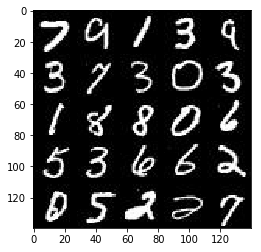

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

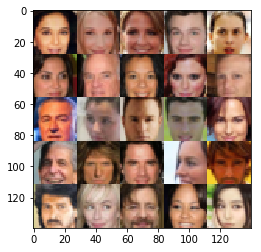

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="input_real")
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/local/lib/python3.5/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/local/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.5/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.5/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'F

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    width, height, channels = images.shape[1:4]
    alpha = 0.2
    
    print("\nImages {}, reuse: {} w{}: h:{} c:{}".format(images, reuse, width, height, channels))
    with tf.variable_scope("discriminator", reuse=reuse):
        # Input layer is 28x28x3, in celebritya
        print("layer 1")
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        print("relu1: {}".format(relu1))
        # now 14x14x128
        print("layer 2")
        # smaller width x height, more channels, add a batch_normalization
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        print("relu2: {}".format(relu2))
        # now 7x7x256
        print("layer 3")
        # conv layer 3
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        print("relu3: {}".format(relu3))
        print("flatten")
        # flatten
        w, h, c = relu3.shape[1:4]
        print("w: {}, h: {}, c:{}".format(w, h, c))
        flat = tf.reshape(relu3, (-1, w.value *h.value *c.value))
        print("Flat {}".format(flat))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)


Images Tensor("Placeholder:0", shape=(?, 28, 28, 3), dtype=float32), reuse: False w28: h:28 c:3
layer 1
relu1: Tensor("Maximum:0", shape=(?, 14, 14, 128), dtype=float32)
layer 2
relu2: Tensor("Maximum_1:0", shape=(?, 7, 7, 256), dtype=float32)
layer 3
relu3: Tensor("Maximum_2:0", shape=(?, 4, 4, 512), dtype=float32)
flatten
w: 4, h: 4, c:512
Flat Tensor("Reshape:0", shape=(?, 8192), dtype=float32)

Images Tensor("Placeholder:0", shape=(?, 28, 28, 3), dtype=float32), reuse: True w28: h:28 c:3
layer 1
relu1: Tensor("Maximum_3:0", shape=(?, 14, 14, 128), dtype=float32)
layer 2
relu2: Tensor("Maximum_4:0", shape=(?, 7, 7, 256), dtype=float32)
layer 3
relu3: Tensor("Maximum_5:0", shape=(?, 4, 4, 512), dtype=float32)
flatten
w: 4, h: 4, c:512
Flat Tensor("Reshape_1:0", shape=(?, 8192), dtype=float32)
Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    #z starts at 100
    print("z: {}, out_channel_dim: {}".format(z, out_channel_dim))
    alpha = 0.2
    with tf.variable_scope("generator", reuse=not(is_train)):
        #First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        
        # reshape
        x2 = tf.reshape(x1, (-1, 7, 7, 512))
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(alpha * bn2, bn2)
        print("relu2: {}".format(relu2))
        # now 7x7x512
        
        #Third layer
        x3 = tf.layers.conv2d_transpose(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = tf.maximum(alpha * bn3, bn3)
        print("relu3: {}".format(relu3))
        # 14x14x256 now
        
        x4 = tf.layers.conv2d_transpose(relu3, 128, 5, strides=2, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=is_train)
        relu4 = tf.maximum(alpha * bn4, bn4)
        print("relu4: {}".format(relu4)) 
        # 14x14x256 now
       
        logits = tf.layers.conv2d_transpose(relu4, out_channel_dim, 5, strides=1, padding='same')
        # 28x28xout_channel_dim now
        print("logits: {}".format(logits)) 
        out = tf.tanh(logits)
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

z: Tensor("Placeholder:0", shape=(?, 100), dtype=float32), out_channel_dim: 5
relu2: Tensor("Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 5), dtype=float32)
z: Tensor("Placeholder:0", shape=(?, 100), dtype=float32), out_channel_dim: 5
relu2: Tensor("Maximum_3:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("Maximum_4:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("Maximum_5:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("conv2d_transpose_6/BiasAdd:0", shape=(?, 28, 28, 5), dtype=float32)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    # we want smooth here
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real,
            labels=tf.ones_like(d_logits_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

z: Tensor("Placeholder_1:0", shape=(?, 100), dtype=float32), out_channel_dim: 4
relu2: Tensor("generator/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 4), dtype=float32)

Images Tensor("Placeholder:0", shape=(?, 28, 28, 4), dtype=float32), reuse: False w28: h:28 c:4
layer 1
relu1: Tensor("discriminator/Maximum:0", shape=(?, 14, 14, 128), dtype=float32)
layer 2
relu2: Tensor("discriminator/Maximum_1:0", shape=(?, 7, 7, 256), dtype=float32)
layer 3
relu3: Tensor("discriminator/Maximum_2:0", shape=(?, 4, 4, 512), dtype=float32)
flatten
w: 4, h: 4, c:512
Flat Tensor("discriminator/Reshape:0", shape=(?, 8192), dtype=float32)

Images Tensor("generator/Tanh:0", shape=(?, 28, 28, 4), dtype=float32), reuse: True w28: h:28 c:4
layer 1
relu1: Tensor("discriminator_1/

### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    
    # optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [15]:
from tqdm import tqdm
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # variables
    width, height, depth = data_shape[1:4]
    # sample_z = np.random.uniform(-1, 1, size=(72, z_dim))
    input_real, input_z, _ = model_inputs(width, height, depth, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, depth)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    samples, losses = [], []
    print_every, show_every = 10, 100

    total_batches = data_shape[0] // batch_size

    # training session
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in tqdm(range(epoch_count)):
            steps = 0
            for batch_images in get_batches(batch_size):
                # record each loop step
                steps += 1
                # get a batch of imges
                batch_images = batch_images.reshape(batch_size, width, height, depth)
                # double the batch's image values
                batch_images = batch_images*2
                # sample random noise for the generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # optimize the discriminator using real and fake images
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                # optimize the generator using fake images, input_real probably not used
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z})     
                # print every so often
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{} - Batch {}/{}".format(epoch_i+1, epoch_count, steps, total_batches),
                         "train_loss_d: {:.4f}, train_loss_g: {:.4f}".format(train_loss_d, train_loss_g))
                
                # show every so often
                if (steps % show_every == 0) or (steps % total_batches == 0):
                    show_generator_output(
                        sess=sess, n_images=10, input_z=input_z, out_channel_dim=depth,
                        image_mode=data_image_mode)
                    losses.append((train_loss_d, train_loss_g))
                    
    return losses

                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)

Images Tensor("input_real:0", shape=(?, 28, 28, 1), dtype=float32), reuse: False w28: h:28 c:1
layer 1
relu1: Tensor("discriminator/Maximum:0", shape=(?, 14, 14, 128), dtype=float32)
layer 2
relu2: Tensor("discriminator/Maximum_1:0", shape=(?, 7, 7, 256), dtype=float32)
layer 3
relu3: Tensor("discriminator/Maximum_2:0", shape=(?, 4, 4, 512), dtype=float32)
flatten
w: 4, h: 4, c:512
Flat Tensor("discriminator/Reshape:0", shape=(?, 8192), dtype=float32)

Images Tensor("generator/Tanh:0", shape=(?, 28, 28, 1), dtype=float32), reuse: True w28: h:28 c:1
layer 1
relu1: Tensor("discriminator_1/Maximum


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch 1/2 - Batch 10/937 train_loss_d: 0.5870, train_loss_g: 39.5299
Epoch 1/2 - Batch 20/937 train_loss_d: 0.3807, train_loss_g: 34.3862
Epoch 1/2 - Batch 30/937 train_loss_d: 0.3523, train_loss_g: 11.1846
Epoch 1/2 - Batch 40/937 train_loss_d: 0.3762, train_loss_g: 7.0853
Epoch 1/2 - Batch 50/937 train_loss_d: 2.2027, train_loss_g: 27.5119
Epoch 1/2 - Batch 60/937 train_loss_d: 0.6524, train_loss_g: 10.0109
Epoch 1/2 - Batch 70/937 train_loss_d: 2.8597, train_loss_g: 0.1952
Epoch 1/2 - Batch 80/937 train_loss_d: 2.2322, train_loss_g: 7.7011
Epoch 1/2 - Batch 90/937 train_loss_d: 0.4704, train_loss_g: 4.3851
Epoch 1/2 - Batch 100/937 train_loss_d: 0.3658, train_loss_g: 5.5518
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_1/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_1/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_1/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logi

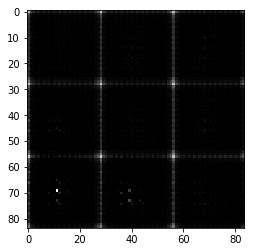

Epoch 1/2 - Batch 110/937 train_loss_d: 0.4511, train_loss_g: 2.8303
Epoch 1/2 - Batch 120/937 train_loss_d: 1.8432, train_loss_g: 0.5638
Epoch 1/2 - Batch 130/937 train_loss_d: 0.6084, train_loss_g: 3.0447
Epoch 1/2 - Batch 140/937 train_loss_d: 1.7316, train_loss_g: 3.8410
Epoch 1/2 - Batch 150/937 train_loss_d: 1.4906, train_loss_g: 0.6996
Epoch 1/2 - Batch 160/937 train_loss_d: 0.8870, train_loss_g: 1.5939
Epoch 1/2 - Batch 170/937 train_loss_d: 1.4234, train_loss_g: 0.5280
Epoch 1/2 - Batch 180/937 train_loss_d: 0.9040, train_loss_g: 1.9184
Epoch 1/2 - Batch 190/937 train_loss_d: 1.0552, train_loss_g: 0.9026
Epoch 1/2 - Batch 200/937 train_loss_d: 1.1273, train_loss_g: 2.0764
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_2/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_2/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_2/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


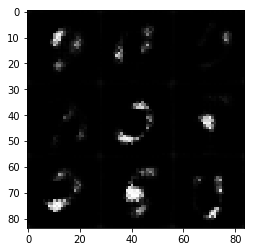

Epoch 1/2 - Batch 210/937 train_loss_d: 1.0540, train_loss_g: 0.8893
Epoch 1/2 - Batch 220/937 train_loss_d: 0.8692, train_loss_g: 1.8081
Epoch 1/2 - Batch 230/937 train_loss_d: 1.1202, train_loss_g: 0.8409
Epoch 1/2 - Batch 240/937 train_loss_d: 0.9440, train_loss_g: 1.1276
Epoch 1/2 - Batch 250/937 train_loss_d: 0.9430, train_loss_g: 1.5618
Epoch 1/2 - Batch 260/937 train_loss_d: 1.6979, train_loss_g: 0.4671
Epoch 1/2 - Batch 270/937 train_loss_d: 1.2990, train_loss_g: 1.9052
Epoch 1/2 - Batch 280/937 train_loss_d: 1.3691, train_loss_g: 0.6808
Epoch 1/2 - Batch 290/937 train_loss_d: 1.1857, train_loss_g: 0.9439
Epoch 1/2 - Batch 300/937 train_loss_d: 1.0894, train_loss_g: 1.3834
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_3/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_3/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_3/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


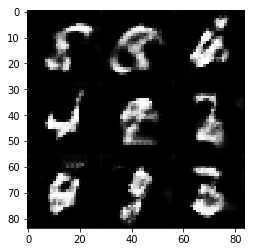

Epoch 1/2 - Batch 310/937 train_loss_d: 1.6713, train_loss_g: 0.3772
Epoch 1/2 - Batch 320/937 train_loss_d: 1.0468, train_loss_g: 1.1449
Epoch 1/2 - Batch 330/937 train_loss_d: 1.2122, train_loss_g: 1.2331
Epoch 1/2 - Batch 340/937 train_loss_d: 1.2383, train_loss_g: 0.7846
Epoch 1/2 - Batch 350/937 train_loss_d: 1.1946, train_loss_g: 0.8139
Epoch 1/2 - Batch 360/937 train_loss_d: 1.1759, train_loss_g: 1.4863
Epoch 1/2 - Batch 370/937 train_loss_d: 1.2107, train_loss_g: 1.0420
Epoch 1/2 - Batch 380/937 train_loss_d: 1.2030, train_loss_g: 1.3252
Epoch 1/2 - Batch 390/937 train_loss_d: 1.2822, train_loss_g: 0.6826
Epoch 1/2 - Batch 400/937 train_loss_d: 1.2012, train_loss_g: 0.9639
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_4/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_4/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_4/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


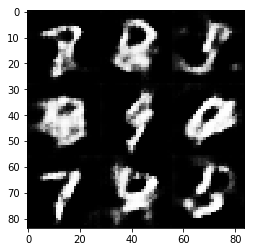

Epoch 1/2 - Batch 410/937 train_loss_d: 1.2851, train_loss_g: 0.8143
Epoch 1/2 - Batch 420/937 train_loss_d: 1.2476, train_loss_g: 0.7018
Epoch 1/2 - Batch 430/937 train_loss_d: 1.3742, train_loss_g: 0.5722
Epoch 1/2 - Batch 440/937 train_loss_d: 1.1376, train_loss_g: 1.5479
Epoch 1/2 - Batch 450/937 train_loss_d: 1.4758, train_loss_g: 0.4512
Epoch 1/2 - Batch 460/937 train_loss_d: 0.9727, train_loss_g: 1.1723
Epoch 1/2 - Batch 470/937 train_loss_d: 1.0458, train_loss_g: 1.1319
Epoch 1/2 - Batch 480/937 train_loss_d: 1.1267, train_loss_g: 0.8859
Epoch 1/2 - Batch 490/937 train_loss_d: 1.2763, train_loss_g: 1.9303
Epoch 1/2 - Batch 500/937 train_loss_d: 1.0509, train_loss_g: 1.4756
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_5/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_5/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_5/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


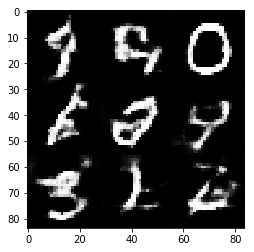

Epoch 1/2 - Batch 510/937 train_loss_d: 1.1304, train_loss_g: 0.7916
Epoch 1/2 - Batch 520/937 train_loss_d: 1.6534, train_loss_g: 3.7156
Epoch 1/2 - Batch 530/937 train_loss_d: 1.0550, train_loss_g: 1.1806
Epoch 1/2 - Batch 540/937 train_loss_d: 1.6895, train_loss_g: 0.3853
Epoch 1/2 - Batch 550/937 train_loss_d: 1.6819, train_loss_g: 0.4022
Epoch 1/2 - Batch 560/937 train_loss_d: 1.0661, train_loss_g: 0.9272
Epoch 1/2 - Batch 570/937 train_loss_d: 1.0088, train_loss_g: 1.2885
Epoch 1/2 - Batch 580/937 train_loss_d: 1.2217, train_loss_g: 2.2266
Epoch 1/2 - Batch 590/937 train_loss_d: 1.1285, train_loss_g: 0.9729
Epoch 1/2 - Batch 600/937 train_loss_d: 1.2040, train_loss_g: 2.2589
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_6/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_6/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_6/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


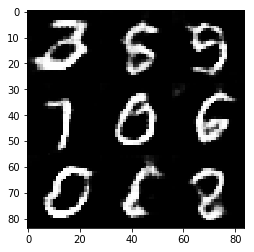

Epoch 1/2 - Batch 610/937 train_loss_d: 1.0784, train_loss_g: 0.9178
Epoch 1/2 - Batch 620/937 train_loss_d: 1.6518, train_loss_g: 2.8459
Epoch 1/2 - Batch 630/937 train_loss_d: 1.2821, train_loss_g: 0.6013
Epoch 1/2 - Batch 640/937 train_loss_d: 1.5488, train_loss_g: 0.4438
Epoch 1/2 - Batch 650/937 train_loss_d: 0.9755, train_loss_g: 1.2450
Epoch 1/2 - Batch 660/937 train_loss_d: 1.4623, train_loss_g: 0.5181
Epoch 1/2 - Batch 670/937 train_loss_d: 1.0224, train_loss_g: 1.3475
Epoch 1/2 - Batch 680/937 train_loss_d: 0.9595, train_loss_g: 1.4086
Epoch 1/2 - Batch 690/937 train_loss_d: 1.0159, train_loss_g: 0.9590
Epoch 1/2 - Batch 700/937 train_loss_d: 0.9929, train_loss_g: 1.9108
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_7/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_7/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_7/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


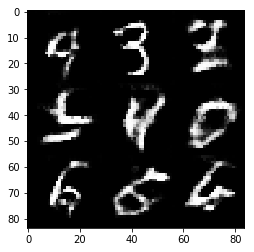

Epoch 1/2 - Batch 710/937 train_loss_d: 0.9446, train_loss_g: 1.3873
Epoch 1/2 - Batch 720/937 train_loss_d: 1.2627, train_loss_g: 0.7708
Epoch 1/2 - Batch 730/937 train_loss_d: 1.0844, train_loss_g: 0.8802
Epoch 1/2 - Batch 740/937 train_loss_d: 1.3868, train_loss_g: 2.0557
Epoch 1/2 - Batch 750/937 train_loss_d: 1.2226, train_loss_g: 1.3662
Epoch 1/2 - Batch 760/937 train_loss_d: 1.1049, train_loss_g: 1.8443
Epoch 1/2 - Batch 770/937 train_loss_d: 1.1744, train_loss_g: 0.6984
Epoch 1/2 - Batch 780/937 train_loss_d: 1.2458, train_loss_g: 0.6736
Epoch 1/2 - Batch 790/937 train_loss_d: 1.2927, train_loss_g: 0.6658
Epoch 1/2 - Batch 800/937 train_loss_d: 1.7446, train_loss_g: 0.3338
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_8/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_8/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_8/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


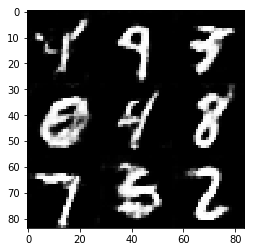

Epoch 1/2 - Batch 810/937 train_loss_d: 1.2019, train_loss_g: 0.7302
Epoch 1/2 - Batch 820/937 train_loss_d: 1.0298, train_loss_g: 1.0376
Epoch 1/2 - Batch 830/937 train_loss_d: 1.0849, train_loss_g: 1.0443
Epoch 1/2 - Batch 840/937 train_loss_d: 1.0759, train_loss_g: 1.0834
Epoch 1/2 - Batch 850/937 train_loss_d: 1.1252, train_loss_g: 1.6665
Epoch 1/2 - Batch 860/937 train_loss_d: 1.0970, train_loss_g: 1.2922
Epoch 1/2 - Batch 870/937 train_loss_d: 1.2880, train_loss_g: 0.6734
Epoch 1/2 - Batch 880/937 train_loss_d: 0.9746, train_loss_g: 1.1409
Epoch 1/2 - Batch 890/937 train_loss_d: 3.0341, train_loss_g: 4.1472
Epoch 1/2 - Batch 900/937 train_loss_d: 1.1936, train_loss_g: 0.7559
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_9/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_9/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_9/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)


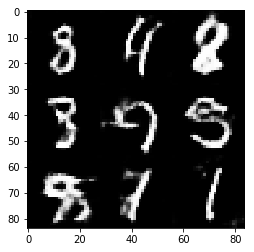

Epoch 1/2 - Batch 910/937 train_loss_d: 1.1721, train_loss_g: 0.7935
Epoch 1/2 - Batch 920/937 train_loss_d: 1.1603, train_loss_g: 0.7326
Epoch 1/2 - Batch 930/937 train_loss_d: 1.1360, train_loss_g: 1.0995
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_10/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_10/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_10/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_10/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


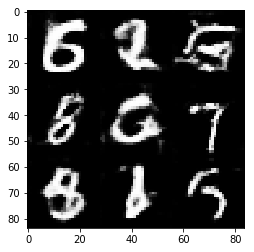


 50%|█████     | 1/2 [12:59<12:59, 779.43s/it]

Epoch 2/2 - Batch 10/937 train_loss_d: 1.7598, train_loss_g: 0.3844
Epoch 2/2 - Batch 20/937 train_loss_d: 1.0610, train_loss_g: 1.5589
Epoch 2/2 - Batch 30/937 train_loss_d: 1.0887, train_loss_g: 0.9469
Epoch 2/2 - Batch 40/937 train_loss_d: 1.0117, train_loss_g: 1.4893
Epoch 2/2 - Batch 50/937 train_loss_d: 1.2437, train_loss_g: 0.6906
Epoch 2/2 - Batch 60/937 train_loss_d: 1.1005, train_loss_g: 1.7279
Epoch 2/2 - Batch 70/937 train_loss_d: 1.1822, train_loss_g: 0.6689
Epoch 2/2 - Batch 80/937 train_loss_d: 1.0590, train_loss_g: 1.8312
Epoch 2/2 - Batch 90/937 train_loss_d: 1.2745, train_loss_g: 0.6320
Epoch 2/2 - Batch 100/937 train_loss_d: 1.3552, train_loss_g: 0.5436
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_11/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_11/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_11/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits

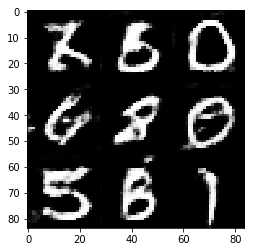

Epoch 2/2 - Batch 110/937 train_loss_d: 1.7551, train_loss_g: 0.3563
Epoch 2/2 - Batch 120/937 train_loss_d: 1.0089, train_loss_g: 1.1303
Epoch 2/2 - Batch 130/937 train_loss_d: 1.1340, train_loss_g: 1.3796
Epoch 2/2 - Batch 140/937 train_loss_d: 1.1473, train_loss_g: 0.7135
Epoch 2/2 - Batch 150/937 train_loss_d: 0.9894, train_loss_g: 1.4860
Epoch 2/2 - Batch 160/937 train_loss_d: 1.4081, train_loss_g: 2.3856
Epoch 2/2 - Batch 170/937 train_loss_d: 1.3575, train_loss_g: 0.5444
Epoch 2/2 - Batch 180/937 train_loss_d: 1.1432, train_loss_g: 1.4908
Epoch 2/2 - Batch 190/937 train_loss_d: 1.0802, train_loss_g: 0.8647
Epoch 2/2 - Batch 200/937 train_loss_d: 1.5923, train_loss_g: 0.4297
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_12/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_12/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_12/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

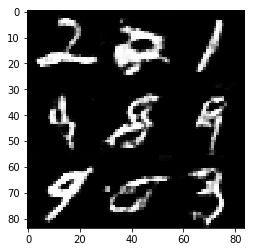

Epoch 2/2 - Batch 210/937 train_loss_d: 1.1332, train_loss_g: 1.2761
Epoch 2/2 - Batch 220/937 train_loss_d: 1.2311, train_loss_g: 0.6649
Epoch 2/2 - Batch 230/937 train_loss_d: 1.5571, train_loss_g: 0.4460
Epoch 2/2 - Batch 240/937 train_loss_d: 1.2087, train_loss_g: 0.7121
Epoch 2/2 - Batch 250/937 train_loss_d: 0.8830, train_loss_g: 1.2879
Epoch 2/2 - Batch 260/937 train_loss_d: 1.6332, train_loss_g: 0.4299
Epoch 2/2 - Batch 270/937 train_loss_d: 1.1305, train_loss_g: 1.7704
Epoch 2/2 - Batch 280/937 train_loss_d: 0.8858, train_loss_g: 1.4371
Epoch 2/2 - Batch 290/937 train_loss_d: 1.1280, train_loss_g: 0.7451
Epoch 2/2 - Batch 300/937 train_loss_d: 1.1859, train_loss_g: 1.3364
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_13/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_13/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_13/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

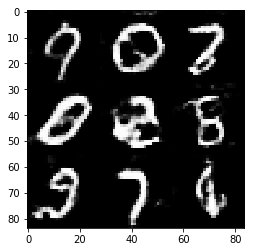

Epoch 2/2 - Batch 310/937 train_loss_d: 1.1821, train_loss_g: 0.7715
Epoch 2/2 - Batch 320/937 train_loss_d: 1.1262, train_loss_g: 0.9031
Epoch 2/2 - Batch 330/937 train_loss_d: 0.9994, train_loss_g: 1.1550
Epoch 2/2 - Batch 340/937 train_loss_d: 1.3036, train_loss_g: 0.6166
Epoch 2/2 - Batch 350/937 train_loss_d: 0.9899, train_loss_g: 1.1062
Epoch 2/2 - Batch 360/937 train_loss_d: 1.0433, train_loss_g: 1.3538
Epoch 2/2 - Batch 370/937 train_loss_d: 1.2799, train_loss_g: 2.2434
Epoch 2/2 - Batch 380/937 train_loss_d: 1.0725, train_loss_g: 1.4010
Epoch 2/2 - Batch 390/937 train_loss_d: 1.1320, train_loss_g: 1.2929
Epoch 2/2 - Batch 400/937 train_loss_d: 1.1147, train_loss_g: 0.9569
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_14/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_14/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_14/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

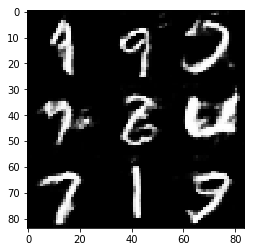

Epoch 2/2 - Batch 410/937 train_loss_d: 1.0922, train_loss_g: 1.7227
Epoch 2/2 - Batch 420/937 train_loss_d: 0.9789, train_loss_g: 1.0258
Epoch 2/2 - Batch 430/937 train_loss_d: 0.9974, train_loss_g: 0.9571
Epoch 2/2 - Batch 440/937 train_loss_d: 1.1127, train_loss_g: 1.4866
Epoch 2/2 - Batch 450/937 train_loss_d: 1.0553, train_loss_g: 0.9161
Epoch 2/2 - Batch 460/937 train_loss_d: 0.9805, train_loss_g: 1.4838
Epoch 2/2 - Batch 470/937 train_loss_d: 1.0258, train_loss_g: 1.4827
Epoch 2/2 - Batch 480/937 train_loss_d: 1.0046, train_loss_g: 1.3902
Epoch 2/2 - Batch 490/937 train_loss_d: 1.2472, train_loss_g: 1.7395
Epoch 2/2 - Batch 500/937 train_loss_d: 1.5840, train_loss_g: 0.4433
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_15/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_15/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_15/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

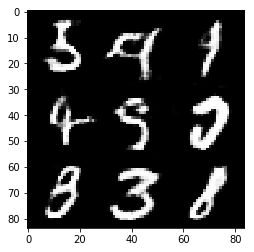

Epoch 2/2 - Batch 510/937 train_loss_d: 0.9602, train_loss_g: 1.3290
Epoch 2/2 - Batch 520/937 train_loss_d: 1.3589, train_loss_g: 0.6401
Epoch 2/2 - Batch 530/937 train_loss_d: 0.9246, train_loss_g: 1.0748
Epoch 2/2 - Batch 540/937 train_loss_d: 1.8010, train_loss_g: 0.3760
Epoch 2/2 - Batch 550/937 train_loss_d: 1.7340, train_loss_g: 0.3738
Epoch 2/2 - Batch 560/937 train_loss_d: 1.1399, train_loss_g: 1.0621
Epoch 2/2 - Batch 570/937 train_loss_d: 1.0535, train_loss_g: 1.4606
Epoch 2/2 - Batch 580/937 train_loss_d: 1.5222, train_loss_g: 2.4394
Epoch 2/2 - Batch 590/937 train_loss_d: 1.0290, train_loss_g: 1.2311
Epoch 2/2 - Batch 600/937 train_loss_d: 0.9056, train_loss_g: 1.4002
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_16/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_16/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_16/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

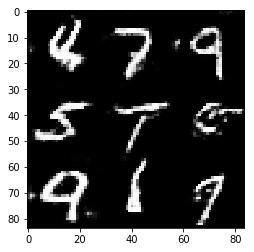

Epoch 2/2 - Batch 610/937 train_loss_d: 0.9383, train_loss_g: 1.4984
Epoch 2/2 - Batch 620/937 train_loss_d: 1.1581, train_loss_g: 0.7765
Epoch 2/2 - Batch 630/937 train_loss_d: 0.8907, train_loss_g: 1.7822
Epoch 2/2 - Batch 640/937 train_loss_d: 1.0747, train_loss_g: 0.8841
Epoch 2/2 - Batch 650/937 train_loss_d: 1.4207, train_loss_g: 0.5863
Epoch 2/2 - Batch 660/937 train_loss_d: 0.9373, train_loss_g: 1.1372
Epoch 2/2 - Batch 670/937 train_loss_d: 1.2989, train_loss_g: 0.6483
Epoch 2/2 - Batch 680/937 train_loss_d: 0.9272, train_loss_g: 1.0770
Epoch 2/2 - Batch 690/937 train_loss_d: 1.1115, train_loss_g: 0.9251
Epoch 2/2 - Batch 700/937 train_loss_d: 1.1804, train_loss_g: 0.7200
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_17/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_17/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_17/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

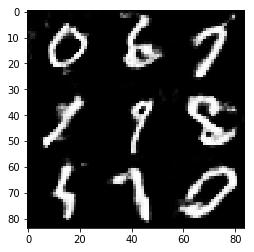

Epoch 2/2 - Batch 710/937 train_loss_d: 1.2115, train_loss_g: 1.7954
Epoch 2/2 - Batch 720/937 train_loss_d: 1.4742, train_loss_g: 0.4930
Epoch 2/2 - Batch 730/937 train_loss_d: 1.2182, train_loss_g: 0.7149
Epoch 2/2 - Batch 740/937 train_loss_d: 0.9762, train_loss_g: 1.9071
Epoch 2/2 - Batch 750/937 train_loss_d: 0.8225, train_loss_g: 1.6096
Epoch 2/2 - Batch 760/937 train_loss_d: 1.0861, train_loss_g: 1.9107
Epoch 2/2 - Batch 770/937 train_loss_d: 1.0644, train_loss_g: 1.9153
Epoch 2/2 - Batch 780/937 train_loss_d: 0.7296, train_loss_g: 1.8476
Epoch 2/2 - Batch 790/937 train_loss_d: 0.8490, train_loss_g: 1.3693
Epoch 2/2 - Batch 800/937 train_loss_d: 1.6174, train_loss_g: 0.5058
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_18/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_18/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_18/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

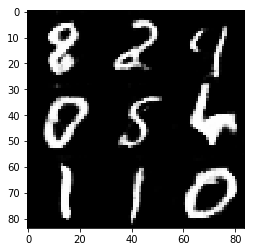

Epoch 2/2 - Batch 810/937 train_loss_d: 0.8370, train_loss_g: 1.5622
Epoch 2/2 - Batch 820/937 train_loss_d: 0.7946, train_loss_g: 1.8055
Epoch 2/2 - Batch 830/937 train_loss_d: 1.1423, train_loss_g: 0.7868
Epoch 2/2 - Batch 840/937 train_loss_d: 1.0111, train_loss_g: 1.6847
Epoch 2/2 - Batch 850/937 train_loss_d: 1.3090, train_loss_g: 0.6218
Epoch 2/2 - Batch 860/937 train_loss_d: 1.1017, train_loss_g: 0.7560
Epoch 2/2 - Batch 870/937 train_loss_d: 1.7630, train_loss_g: 3.1836
Epoch 2/2 - Batch 880/937 train_loss_d: 1.0274, train_loss_g: 1.4632
Epoch 2/2 - Batch 890/937 train_loss_d: 1.0922, train_loss_g: 1.4993
Epoch 2/2 - Batch 900/937 train_loss_d: 1.4730, train_loss_g: 0.5970
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_19/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_19/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_19/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float3

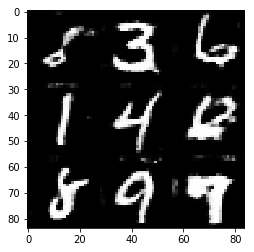

Epoch 2/2 - Batch 910/937 train_loss_d: 0.9687, train_loss_g: 1.2014
Epoch 2/2 - Batch 920/937 train_loss_d: 0.9461, train_loss_g: 0.9549
Epoch 2/2 - Batch 930/937 train_loss_d: 0.7482, train_loss_g: 1.5793
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 1
relu2: Tensor("generator_20/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_20/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_20/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_20/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


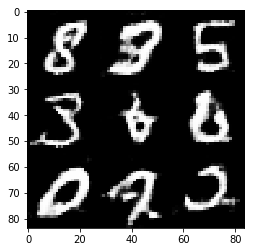


100%|██████████| 2/2 [25:35<00:00, 772.54s/it]


In [16]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)

Images Tensor("input_real:0", shape=(?, 28, 28, 3), dtype=float32), reuse: False w28: h:28 c:3
layer 1
relu1: Tensor("discriminator/Maximum:0", shape=(?, 14, 14, 128), dtype=float32)
layer 2
relu2: Tensor("discriminator/Maximum_1:0", shape=(?, 7, 7, 256), dtype=float32)
layer 3
relu3: Tensor("discriminator/Maximum_2:0", shape=(?, 4, 4, 512), dtype=float32)
flatten
w: 4, h: 4, c:512
Flat Tensor("discriminator/Reshape:0", shape=(?, 8192), dtype=float32)

Images Tensor("generator/Tanh:0", shape=(?, 28, 28, 3), dtype=float32), reuse: True w28: h:28 c:3
layer 1
relu1: Tensor("discriminator_1/Maximum


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10 - Batch 10/3165 train_loss_d: 1.1725, train_loss_g: 2.6114
Epoch 1/10 - Batch 20/3165 train_loss_d: 0.7349, train_loss_g: 8.9885
Epoch 1/10 - Batch 30/3165 train_loss_d: 0.5011, train_loss_g: 3.2150
Epoch 1/10 - Batch 40/3165 train_loss_d: 1.4982, train_loss_g: 9.7609
Epoch 1/10 - Batch 50/3165 train_loss_d: 1.6661, train_loss_g: 0.6894
Epoch 1/10 - Batch 60/3165 train_loss_d: 4.1873, train_loss_g: 10.4086
Epoch 1/10 - Batch 70/3165 train_loss_d: 0.7126, train_loss_g: 1.9497
Epoch 1/10 - Batch 80/3165 train_loss_d: 0.8017, train_loss_g: 6.0614
Epoch 1/10 - Batch 90/3165 train_loss_d: 0.4636, train_loss_g: 2.8148
Epoch 1/10 - Batch 100/3165 train_loss_d: 0.3713, train_loss_g: 5.6475
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_1/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_1/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_1/Maximum_2:0", shape=(?, 28, 28, 128), dty

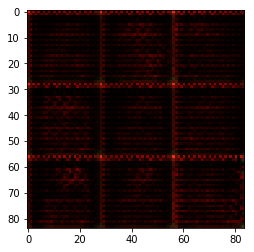

Epoch 1/10 - Batch 110/3165 train_loss_d: 0.7506, train_loss_g: 3.5746
Epoch 1/10 - Batch 120/3165 train_loss_d: 1.0082, train_loss_g: 6.9356
Epoch 1/10 - Batch 130/3165 train_loss_d: 2.2394, train_loss_g: 0.3914
Epoch 1/10 - Batch 140/3165 train_loss_d: 1.2063, train_loss_g: 2.4008
Epoch 1/10 - Batch 150/3165 train_loss_d: 0.6788, train_loss_g: 2.1436
Epoch 1/10 - Batch 160/3165 train_loss_d: 0.7498, train_loss_g: 1.8178
Epoch 1/10 - Batch 170/3165 train_loss_d: 0.9798, train_loss_g: 1.0283
Epoch 1/10 - Batch 180/3165 train_loss_d: 1.5691, train_loss_g: 0.5702
Epoch 1/10 - Batch 190/3165 train_loss_d: 3.9767, train_loss_g: 5.2078
Epoch 1/10 - Batch 200/3165 train_loss_d: 1.3803, train_loss_g: 0.6766
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_2/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_2/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_2/Maximum_2:0", shape=(?, 28, 28, 1

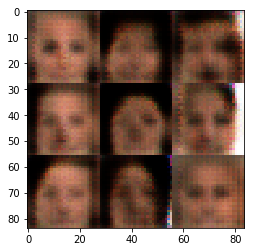

Epoch 1/10 - Batch 210/3165 train_loss_d: 1.2241, train_loss_g: 0.8928
Epoch 1/10 - Batch 220/3165 train_loss_d: 0.8542, train_loss_g: 1.8123
Epoch 1/10 - Batch 230/3165 train_loss_d: 1.4031, train_loss_g: 0.8262
Epoch 1/10 - Batch 240/3165 train_loss_d: 0.9249, train_loss_g: 1.0075
Epoch 1/10 - Batch 250/3165 train_loss_d: 1.8708, train_loss_g: 0.2954
Epoch 1/10 - Batch 260/3165 train_loss_d: 0.7360, train_loss_g: 1.4582
Epoch 1/10 - Batch 270/3165 train_loss_d: 1.5931, train_loss_g: 0.6122
Epoch 1/10 - Batch 280/3165 train_loss_d: 1.5990, train_loss_g: 1.2444
Epoch 1/10 - Batch 290/3165 train_loss_d: 1.2571, train_loss_g: 0.8802
Epoch 1/10 - Batch 300/3165 train_loss_d: 0.8844, train_loss_g: 1.4423
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_3/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_3/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_3/Maximum_2:0", shape=(?, 28, 28, 1

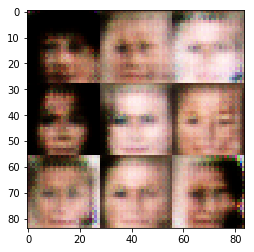

Epoch 1/10 - Batch 310/3165 train_loss_d: 1.9330, train_loss_g: 0.3044
Epoch 1/10 - Batch 320/3165 train_loss_d: 1.3266, train_loss_g: 0.6382
Epoch 1/10 - Batch 330/3165 train_loss_d: 0.5601, train_loss_g: 3.6008
Epoch 1/10 - Batch 340/3165 train_loss_d: 1.1715, train_loss_g: 0.8673
Epoch 1/10 - Batch 350/3165 train_loss_d: 0.8603, train_loss_g: 1.7591
Epoch 1/10 - Batch 360/3165 train_loss_d: 1.1082, train_loss_g: 1.0283
Epoch 1/10 - Batch 370/3165 train_loss_d: 1.3334, train_loss_g: 0.5663
Epoch 1/10 - Batch 380/3165 train_loss_d: 1.0269, train_loss_g: 0.8722
Epoch 1/10 - Batch 390/3165 train_loss_d: 1.3078, train_loss_g: 0.6369
Epoch 1/10 - Batch 400/3165 train_loss_d: 1.0584, train_loss_g: 0.9507
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_4/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_4/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_4/Maximum_2:0", shape=(?, 28, 28, 1

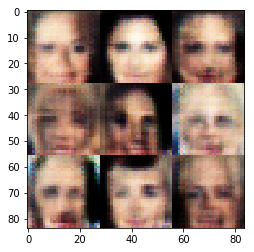

Epoch 1/10 - Batch 410/3165 train_loss_d: 1.3142, train_loss_g: 2.0300
Epoch 1/10 - Batch 420/3165 train_loss_d: 1.0802, train_loss_g: 1.8400
Epoch 1/10 - Batch 430/3165 train_loss_d: 1.0820, train_loss_g: 1.0858
Epoch 1/10 - Batch 440/3165 train_loss_d: 2.0069, train_loss_g: 0.2822
Epoch 1/10 - Batch 450/3165 train_loss_d: 0.8815, train_loss_g: 1.5728
Epoch 1/10 - Batch 460/3165 train_loss_d: 0.9273, train_loss_g: 1.5849
Epoch 1/10 - Batch 470/3165 train_loss_d: 1.2562, train_loss_g: 0.9996
Epoch 1/10 - Batch 480/3165 train_loss_d: 1.4725, train_loss_g: 0.5585
Epoch 1/10 - Batch 490/3165 train_loss_d: 1.5589, train_loss_g: 0.8248
Epoch 1/10 - Batch 500/3165 train_loss_d: 1.7894, train_loss_g: 2.1028
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_5/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_5/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_5/Maximum_2:0", shape=(?, 28, 28, 1

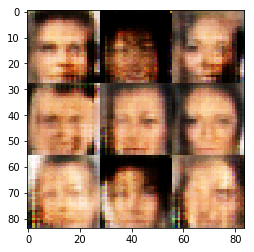

Epoch 1/10 - Batch 510/3165 train_loss_d: 1.2494, train_loss_g: 0.6550
Epoch 1/10 - Batch 520/3165 train_loss_d: 1.1617, train_loss_g: 1.4556
Epoch 1/10 - Batch 530/3165 train_loss_d: 0.8603, train_loss_g: 1.7852
Epoch 1/10 - Batch 540/3165 train_loss_d: 0.7868, train_loss_g: 1.8299
Epoch 1/10 - Batch 550/3165 train_loss_d: 1.7786, train_loss_g: 0.5524
Epoch 1/10 - Batch 560/3165 train_loss_d: 1.0449, train_loss_g: 1.1486
Epoch 1/10 - Batch 570/3165 train_loss_d: 1.2010, train_loss_g: 0.9048
Epoch 1/10 - Batch 580/3165 train_loss_d: 0.8415, train_loss_g: 1.4320
Epoch 1/10 - Batch 590/3165 train_loss_d: 1.3318, train_loss_g: 1.7956
Epoch 1/10 - Batch 600/3165 train_loss_d: 0.8419, train_loss_g: 1.1976
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_6/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_6/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_6/Maximum_2:0", shape=(?, 28, 28, 1

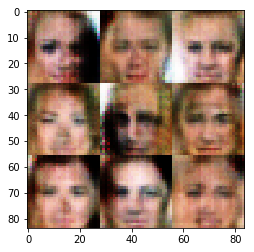

Epoch 1/10 - Batch 610/3165 train_loss_d: 1.1017, train_loss_g: 0.9001
Epoch 1/10 - Batch 620/3165 train_loss_d: 1.1278, train_loss_g: 0.7683
Epoch 1/10 - Batch 630/3165 train_loss_d: 0.8663, train_loss_g: 1.1611
Epoch 1/10 - Batch 640/3165 train_loss_d: 1.9102, train_loss_g: 0.3351
Epoch 1/10 - Batch 650/3165 train_loss_d: 0.9501, train_loss_g: 1.3107
Epoch 1/10 - Batch 660/3165 train_loss_d: 1.3084, train_loss_g: 0.7189
Epoch 1/10 - Batch 670/3165 train_loss_d: 0.9317, train_loss_g: 1.5622
Epoch 1/10 - Batch 680/3165 train_loss_d: 0.9502, train_loss_g: 0.9275
Epoch 1/10 - Batch 690/3165 train_loss_d: 1.3119, train_loss_g: 2.1335
Epoch 1/10 - Batch 700/3165 train_loss_d: 1.5244, train_loss_g: 0.4762
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_7/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_7/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_7/Maximum_2:0", shape=(?, 28, 28, 1

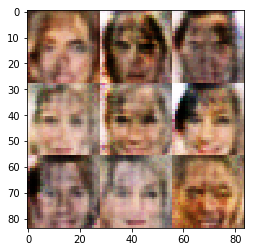

Epoch 1/10 - Batch 710/3165 train_loss_d: 1.1396, train_loss_g: 1.7000
Epoch 1/10 - Batch 720/3165 train_loss_d: 1.3284, train_loss_g: 1.0135
Epoch 1/10 - Batch 730/3165 train_loss_d: 1.5752, train_loss_g: 0.4491
Epoch 1/10 - Batch 740/3165 train_loss_d: 1.1941, train_loss_g: 0.8313
Epoch 1/10 - Batch 750/3165 train_loss_d: 1.1609, train_loss_g: 0.9566
Epoch 1/10 - Batch 760/3165 train_loss_d: 1.5207, train_loss_g: 0.4537
Epoch 1/10 - Batch 770/3165 train_loss_d: 1.3231, train_loss_g: 0.5760
Epoch 1/10 - Batch 780/3165 train_loss_d: 1.6791, train_loss_g: 2.1915
Epoch 1/10 - Batch 790/3165 train_loss_d: 1.3472, train_loss_g: 0.8889
Epoch 1/10 - Batch 800/3165 train_loss_d: 1.0106, train_loss_g: 1.0475
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_8/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_8/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_8/Maximum_2:0", shape=(?, 28, 28, 1

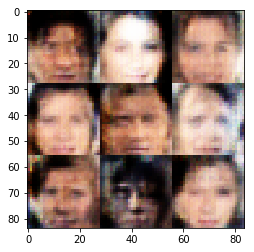

Epoch 1/10 - Batch 810/3165 train_loss_d: 1.0298, train_loss_g: 1.0955
Epoch 1/10 - Batch 820/3165 train_loss_d: 0.5453, train_loss_g: 3.3070
Epoch 1/10 - Batch 830/3165 train_loss_d: 1.6865, train_loss_g: 2.1430
Epoch 1/10 - Batch 840/3165 train_loss_d: 1.2904, train_loss_g: 0.7005
Epoch 1/10 - Batch 850/3165 train_loss_d: 1.2858, train_loss_g: 0.9131
Epoch 1/10 - Batch 860/3165 train_loss_d: 1.4072, train_loss_g: 0.7667
Epoch 1/10 - Batch 870/3165 train_loss_d: 1.2413, train_loss_g: 0.9057
Epoch 1/10 - Batch 880/3165 train_loss_d: 1.4122, train_loss_g: 0.7697
Epoch 1/10 - Batch 890/3165 train_loss_d: 1.4317, train_loss_g: 0.8422
Epoch 1/10 - Batch 900/3165 train_loss_d: 1.3477, train_loss_g: 0.8150
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_9/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_9/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_9/Maximum_2:0", shape=(?, 28, 28, 1

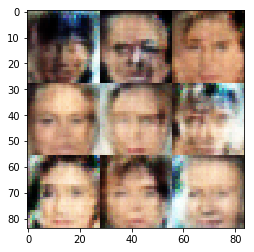

Epoch 1/10 - Batch 910/3165 train_loss_d: 1.6004, train_loss_g: 0.6574
Epoch 1/10 - Batch 920/3165 train_loss_d: 1.3673, train_loss_g: 0.8296
Epoch 1/10 - Batch 930/3165 train_loss_d: 1.2527, train_loss_g: 0.9560
Epoch 1/10 - Batch 940/3165 train_loss_d: 1.3769, train_loss_g: 0.9126
Epoch 1/10 - Batch 950/3165 train_loss_d: 1.4041, train_loss_g: 0.7517
Epoch 1/10 - Batch 960/3165 train_loss_d: 1.3180, train_loss_g: 0.6788
Epoch 1/10 - Batch 970/3165 train_loss_d: 1.2440, train_loss_g: 0.7725
Epoch 1/10 - Batch 980/3165 train_loss_d: 1.4430, train_loss_g: 1.0185
Epoch 1/10 - Batch 990/3165 train_loss_d: 1.1452, train_loss_g: 1.2402
Epoch 1/10 - Batch 1000/3165 train_loss_d: 1.1424, train_loss_g: 1.3644
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_10/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_10/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_10/Maximum_2:0", shape=(?, 28, 2

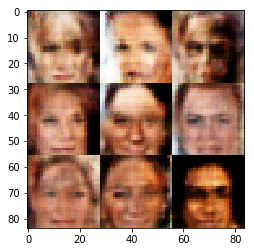

Epoch 1/10 - Batch 1010/3165 train_loss_d: 1.4701, train_loss_g: 0.7257
Epoch 1/10 - Batch 1020/3165 train_loss_d: 1.4387, train_loss_g: 0.6458
Epoch 1/10 - Batch 1030/3165 train_loss_d: 1.2601, train_loss_g: 0.7387
Epoch 1/10 - Batch 1040/3165 train_loss_d: 1.4748, train_loss_g: 0.6428
Epoch 1/10 - Batch 1050/3165 train_loss_d: 1.1778, train_loss_g: 1.1272
Epoch 1/10 - Batch 1060/3165 train_loss_d: 1.3048, train_loss_g: 1.9729
Epoch 1/10 - Batch 1070/3165 train_loss_d: 1.2199, train_loss_g: 0.8085
Epoch 1/10 - Batch 1080/3165 train_loss_d: 1.3391, train_loss_g: 0.7386
Epoch 1/10 - Batch 1090/3165 train_loss_d: 1.1195, train_loss_g: 0.8724
Epoch 1/10 - Batch 1100/3165 train_loss_d: 1.4431, train_loss_g: 1.7019
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_11/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_11/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_11/Maximum_2:0", shape=

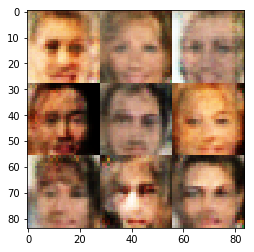

Epoch 1/10 - Batch 1110/3165 train_loss_d: 1.4303, train_loss_g: 0.4781
Epoch 1/10 - Batch 1120/3165 train_loss_d: 1.1757, train_loss_g: 1.7814
Epoch 1/10 - Batch 1130/3165 train_loss_d: 1.0920, train_loss_g: 0.8662
Epoch 1/10 - Batch 1140/3165 train_loss_d: 1.2886, train_loss_g: 1.2498
Epoch 1/10 - Batch 1150/3165 train_loss_d: 1.3903, train_loss_g: 0.6764
Epoch 1/10 - Batch 1160/3165 train_loss_d: 1.1419, train_loss_g: 0.8645
Epoch 1/10 - Batch 1170/3165 train_loss_d: 0.9809, train_loss_g: 1.4732
Epoch 1/10 - Batch 1180/3165 train_loss_d: 1.2646, train_loss_g: 0.8797
Epoch 1/10 - Batch 1190/3165 train_loss_d: 1.4730, train_loss_g: 0.7632
Epoch 1/10 - Batch 1200/3165 train_loss_d: 1.1409, train_loss_g: 0.9203
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_12/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_12/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_12/Maximum_2:0", shape=

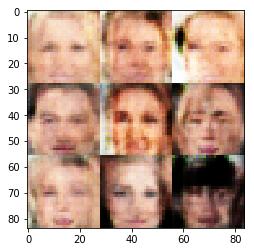

Epoch 1/10 - Batch 1210/3165 train_loss_d: 1.0964, train_loss_g: 1.0364
Epoch 1/10 - Batch 1220/3165 train_loss_d: 1.4503, train_loss_g: 0.5864
Epoch 1/10 - Batch 1230/3165 train_loss_d: 1.0228, train_loss_g: 0.9202
Epoch 1/10 - Batch 1240/3165 train_loss_d: 1.1519, train_loss_g: 0.9290
Epoch 1/10 - Batch 1250/3165 train_loss_d: 1.2769, train_loss_g: 1.2967
Epoch 1/10 - Batch 1260/3165 train_loss_d: 1.2971, train_loss_g: 0.8472
Epoch 1/10 - Batch 1270/3165 train_loss_d: 1.4450, train_loss_g: 1.1621
Epoch 1/10 - Batch 1280/3165 train_loss_d: 1.0039, train_loss_g: 1.3933
Epoch 1/10 - Batch 1290/3165 train_loss_d: 1.2609, train_loss_g: 1.0913
Epoch 1/10 - Batch 1300/3165 train_loss_d: 1.2820, train_loss_g: 0.8855
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_13/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_13/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_13/Maximum_2:0", shape=

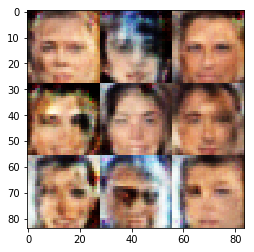

Epoch 1/10 - Batch 1310/3165 train_loss_d: 1.0006, train_loss_g: 1.1347
Epoch 1/10 - Batch 1320/3165 train_loss_d: 1.3405, train_loss_g: 1.0773
Epoch 1/10 - Batch 1330/3165 train_loss_d: 1.0823, train_loss_g: 0.9007
Epoch 1/10 - Batch 1340/3165 train_loss_d: 1.1873, train_loss_g: 0.9455
Epoch 1/10 - Batch 1350/3165 train_loss_d: 1.6777, train_loss_g: 0.3734
Epoch 1/10 - Batch 1360/3165 train_loss_d: 1.1302, train_loss_g: 0.8776
Epoch 1/10 - Batch 1370/3165 train_loss_d: 1.3582, train_loss_g: 1.1414
Epoch 1/10 - Batch 1380/3165 train_loss_d: 1.1686, train_loss_g: 0.9674
Epoch 1/10 - Batch 1390/3165 train_loss_d: 1.3003, train_loss_g: 0.6472
Epoch 1/10 - Batch 1400/3165 train_loss_d: 1.2555, train_loss_g: 0.6703
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_14/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_14/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_14/Maximum_2:0", shape=

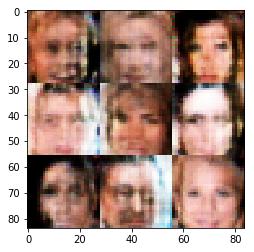

Epoch 1/10 - Batch 1410/3165 train_loss_d: 1.4563, train_loss_g: 0.4833
Epoch 1/10 - Batch 1420/3165 train_loss_d: 1.1639, train_loss_g: 0.7592
Epoch 1/10 - Batch 1430/3165 train_loss_d: 1.3382, train_loss_g: 1.3219
Epoch 1/10 - Batch 1440/3165 train_loss_d: 1.2465, train_loss_g: 0.6405
Epoch 1/10 - Batch 1450/3165 train_loss_d: 1.4574, train_loss_g: 1.9668
Epoch 1/10 - Batch 1460/3165 train_loss_d: 1.1269, train_loss_g: 0.9919
Epoch 1/10 - Batch 1470/3165 train_loss_d: 1.4160, train_loss_g: 1.4112
Epoch 1/10 - Batch 1480/3165 train_loss_d: 1.3377, train_loss_g: 0.9283
Epoch 1/10 - Batch 1490/3165 train_loss_d: 2.2500, train_loss_g: 2.9571
Epoch 1/10 - Batch 1500/3165 train_loss_d: 1.3512, train_loss_g: 0.8733
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_15/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_15/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_15/Maximum_2:0", shape=

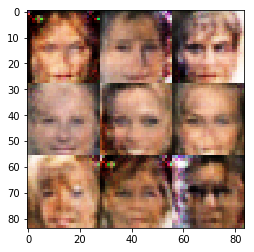

Epoch 1/10 - Batch 1510/3165 train_loss_d: 1.3157, train_loss_g: 0.6313
Epoch 1/10 - Batch 1520/3165 train_loss_d: 1.2001, train_loss_g: 0.8615
Epoch 1/10 - Batch 1530/3165 train_loss_d: 1.3292, train_loss_g: 0.6901
Epoch 1/10 - Batch 1540/3165 train_loss_d: 1.1364, train_loss_g: 1.2107
Epoch 1/10 - Batch 1550/3165 train_loss_d: 1.2580, train_loss_g: 0.7411
Epoch 1/10 - Batch 1560/3165 train_loss_d: 1.2798, train_loss_g: 0.8823
Epoch 1/10 - Batch 1570/3165 train_loss_d: 1.2986, train_loss_g: 1.0792
Epoch 1/10 - Batch 1580/3165 train_loss_d: 1.3424, train_loss_g: 0.8429
Epoch 1/10 - Batch 1590/3165 train_loss_d: 0.7893, train_loss_g: 1.5799
Epoch 1/10 - Batch 1600/3165 train_loss_d: 1.1303, train_loss_g: 1.0189
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_16/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_16/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_16/Maximum_2:0", shape=

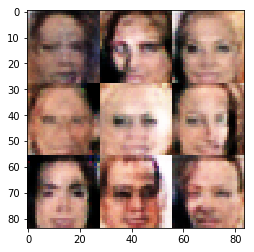

Epoch 1/10 - Batch 1610/3165 train_loss_d: 1.2893, train_loss_g: 1.0036
Epoch 1/10 - Batch 1620/3165 train_loss_d: 1.2375, train_loss_g: 1.2745
Epoch 1/10 - Batch 1630/3165 train_loss_d: 1.3471, train_loss_g: 1.0627
Epoch 1/10 - Batch 1640/3165 train_loss_d: 1.3069, train_loss_g: 1.1653
Epoch 1/10 - Batch 1650/3165 train_loss_d: 1.2737, train_loss_g: 0.8169
Epoch 1/10 - Batch 1660/3165 train_loss_d: 1.1208, train_loss_g: 0.8637
Epoch 1/10 - Batch 1670/3165 train_loss_d: 1.3738, train_loss_g: 0.5474
Epoch 1/10 - Batch 1680/3165 train_loss_d: 1.5780, train_loss_g: 0.7975
Epoch 1/10 - Batch 1690/3165 train_loss_d: 1.4348, train_loss_g: 1.1118
Epoch 1/10 - Batch 1700/3165 train_loss_d: 1.3526, train_loss_g: 0.8528
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_17/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_17/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_17/Maximum_2:0", shape=

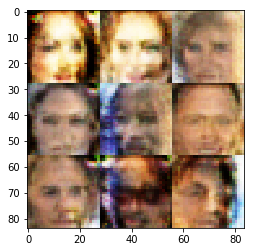

Epoch 1/10 - Batch 1710/3165 train_loss_d: 1.2193, train_loss_g: 1.4668
Epoch 1/10 - Batch 1720/3165 train_loss_d: 1.6562, train_loss_g: 0.5116
Epoch 1/10 - Batch 1730/3165 train_loss_d: 1.3308, train_loss_g: 0.7625
Epoch 1/10 - Batch 1740/3165 train_loss_d: 0.9530, train_loss_g: 1.1834
Epoch 1/10 - Batch 1750/3165 train_loss_d: 1.1754, train_loss_g: 1.0133
Epoch 1/10 - Batch 1760/3165 train_loss_d: 1.4941, train_loss_g: 0.4327
Epoch 1/10 - Batch 1770/3165 train_loss_d: 1.2828, train_loss_g: 1.1689
Epoch 1/10 - Batch 1780/3165 train_loss_d: 1.1255, train_loss_g: 2.0763
Epoch 1/10 - Batch 1790/3165 train_loss_d: 1.2906, train_loss_g: 0.8471
Epoch 1/10 - Batch 1800/3165 train_loss_d: 1.1681, train_loss_g: 1.1852
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_18/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_18/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_18/Maximum_2:0", shape=

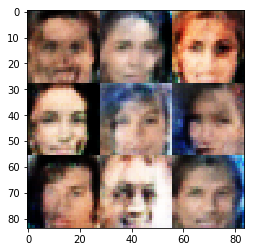

Epoch 1/10 - Batch 1810/3165 train_loss_d: 1.3128, train_loss_g: 0.5832
Epoch 1/10 - Batch 1820/3165 train_loss_d: 0.9517, train_loss_g: 1.4987
Epoch 1/10 - Batch 1830/3165 train_loss_d: 2.0597, train_loss_g: 2.9843
Epoch 1/10 - Batch 1840/3165 train_loss_d: 1.3888, train_loss_g: 0.7374
Epoch 1/10 - Batch 1850/3165 train_loss_d: 1.4206, train_loss_g: 0.5350
Epoch 1/10 - Batch 1860/3165 train_loss_d: 1.1896, train_loss_g: 0.9770
Epoch 1/10 - Batch 1870/3165 train_loss_d: 1.3687, train_loss_g: 1.8740
Epoch 1/10 - Batch 1880/3165 train_loss_d: 1.2105, train_loss_g: 1.0269
Epoch 1/10 - Batch 1890/3165 train_loss_d: 1.2491, train_loss_g: 0.6413
Epoch 1/10 - Batch 1900/3165 train_loss_d: 1.1573, train_loss_g: 0.9146
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_19/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_19/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_19/Maximum_2:0", shape=

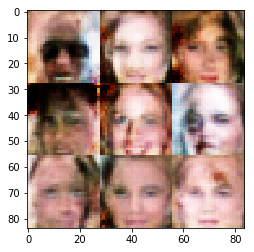

Epoch 1/10 - Batch 1910/3165 train_loss_d: 1.3083, train_loss_g: 0.8598
Epoch 1/10 - Batch 1920/3165 train_loss_d: 1.2564, train_loss_g: 0.7810
Epoch 1/10 - Batch 1930/3165 train_loss_d: 1.3922, train_loss_g: 0.4960
Epoch 1/10 - Batch 1940/3165 train_loss_d: 1.2806, train_loss_g: 0.8988
Epoch 1/10 - Batch 1950/3165 train_loss_d: 1.1176, train_loss_g: 1.2326
Epoch 1/10 - Batch 1960/3165 train_loss_d: 1.2929, train_loss_g: 0.9547
Epoch 1/10 - Batch 1970/3165 train_loss_d: 1.1016, train_loss_g: 1.2114
Epoch 1/10 - Batch 1980/3165 train_loss_d: 1.1569, train_loss_g: 0.8831
Epoch 1/10 - Batch 1990/3165 train_loss_d: 1.0961, train_loss_g: 0.9570
Epoch 1/10 - Batch 2000/3165 train_loss_d: 1.4376, train_loss_g: 0.7113
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_20/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_20/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_20/Maximum_2:0", shape=

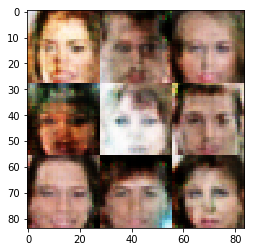

Epoch 1/10 - Batch 2010/3165 train_loss_d: 1.2254, train_loss_g: 0.9064
Epoch 1/10 - Batch 2020/3165 train_loss_d: 0.9944, train_loss_g: 0.9913
Epoch 1/10 - Batch 2030/3165 train_loss_d: 1.3582, train_loss_g: 1.2554
Epoch 1/10 - Batch 2040/3165 train_loss_d: 1.3452, train_loss_g: 0.7812
Epoch 1/10 - Batch 2050/3165 train_loss_d: 1.5120, train_loss_g: 0.5607
Epoch 1/10 - Batch 2060/3165 train_loss_d: 1.2872, train_loss_g: 1.3478
Epoch 1/10 - Batch 2070/3165 train_loss_d: 1.3056, train_loss_g: 0.9296
Epoch 1/10 - Batch 2080/3165 train_loss_d: 1.4434, train_loss_g: 1.5728
Epoch 1/10 - Batch 2090/3165 train_loss_d: 1.1425, train_loss_g: 1.0589
Epoch 1/10 - Batch 2100/3165 train_loss_d: 1.3800, train_loss_g: 0.6618
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_21/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_21/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_21/Maximum_2:0", shape=

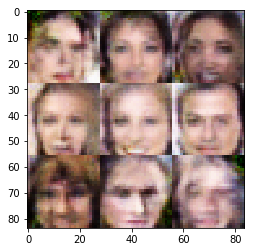

Epoch 1/10 - Batch 2110/3165 train_loss_d: 1.4148, train_loss_g: 0.5420
Epoch 1/10 - Batch 2120/3165 train_loss_d: 1.2227, train_loss_g: 0.7550
Epoch 1/10 - Batch 2130/3165 train_loss_d: 1.2319, train_loss_g: 0.9469
Epoch 1/10 - Batch 2140/3165 train_loss_d: 1.0785, train_loss_g: 1.2839
Epoch 1/10 - Batch 2150/3165 train_loss_d: 1.0919, train_loss_g: 0.9970
Epoch 1/10 - Batch 2160/3165 train_loss_d: 1.2936, train_loss_g: 0.7612
Epoch 1/10 - Batch 2170/3165 train_loss_d: 1.3272, train_loss_g: 1.5981
Epoch 1/10 - Batch 2180/3165 train_loss_d: 1.2796, train_loss_g: 1.0968
Epoch 1/10 - Batch 2190/3165 train_loss_d: 1.2627, train_loss_g: 0.9584
Epoch 1/10 - Batch 2200/3165 train_loss_d: 1.3801, train_loss_g: 0.5820
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_22/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_22/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_22/Maximum_2:0", shape=

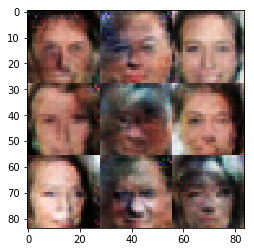

Epoch 1/10 - Batch 2210/3165 train_loss_d: 1.1768, train_loss_g: 0.8103
Epoch 1/10 - Batch 2220/3165 train_loss_d: 1.3820, train_loss_g: 1.2191
Epoch 1/10 - Batch 2230/3165 train_loss_d: 1.2314, train_loss_g: 0.6549
Epoch 1/10 - Batch 2240/3165 train_loss_d: 1.4646, train_loss_g: 0.5132
Epoch 1/10 - Batch 2250/3165 train_loss_d: 1.3598, train_loss_g: 0.5167
Epoch 1/10 - Batch 2260/3165 train_loss_d: 1.2636, train_loss_g: 0.8656
Epoch 1/10 - Batch 2270/3165 train_loss_d: 1.2480, train_loss_g: 0.8229
Epoch 1/10 - Batch 2280/3165 train_loss_d: 1.5228, train_loss_g: 0.4471
Epoch 1/10 - Batch 2290/3165 train_loss_d: 1.4326, train_loss_g: 0.9220
Epoch 1/10 - Batch 2300/3165 train_loss_d: 1.5010, train_loss_g: 0.5800
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_23/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_23/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_23/Maximum_2:0", shape=

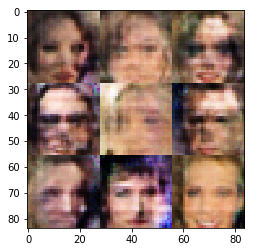

Epoch 1/10 - Batch 2310/3165 train_loss_d: 1.2974, train_loss_g: 0.9349
Epoch 1/10 - Batch 2320/3165 train_loss_d: 1.1356, train_loss_g: 1.5447
Epoch 1/10 - Batch 2330/3165 train_loss_d: 1.2455, train_loss_g: 0.6565
Epoch 1/10 - Batch 2340/3165 train_loss_d: 2.1002, train_loss_g: 2.5579
Epoch 1/10 - Batch 2350/3165 train_loss_d: 1.3897, train_loss_g: 0.7178
Epoch 1/10 - Batch 2360/3165 train_loss_d: 1.0944, train_loss_g: 1.0341
Epoch 1/10 - Batch 2370/3165 train_loss_d: 1.2618, train_loss_g: 0.7781
Epoch 1/10 - Batch 2380/3165 train_loss_d: 1.2603, train_loss_g: 1.0190
Epoch 1/10 - Batch 2390/3165 train_loss_d: 1.3889, train_loss_g: 0.5451
Epoch 1/10 - Batch 2400/3165 train_loss_d: 1.4384, train_loss_g: 0.5058
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_24/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_24/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_24/Maximum_2:0", shape=

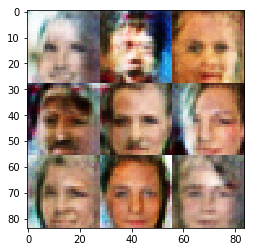

Epoch 1/10 - Batch 2410/3165 train_loss_d: 1.3408, train_loss_g: 0.9965
Epoch 1/10 - Batch 2420/3165 train_loss_d: 1.4168, train_loss_g: 1.3034
Epoch 1/10 - Batch 2430/3165 train_loss_d: 1.0460, train_loss_g: 1.2118
Epoch 1/10 - Batch 2440/3165 train_loss_d: 1.2329, train_loss_g: 1.0376
Epoch 1/10 - Batch 2450/3165 train_loss_d: 1.1630, train_loss_g: 1.2340
Epoch 1/10 - Batch 2460/3165 train_loss_d: 1.1179, train_loss_g: 1.0666
Epoch 1/10 - Batch 2470/3165 train_loss_d: 1.1731, train_loss_g: 0.9027
Epoch 1/10 - Batch 2480/3165 train_loss_d: 1.1718, train_loss_g: 0.8939
Epoch 1/10 - Batch 2490/3165 train_loss_d: 1.3230, train_loss_g: 0.8463
Epoch 1/10 - Batch 2500/3165 train_loss_d: 1.3630, train_loss_g: 0.9596
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_25/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_25/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_25/Maximum_2:0", shape=

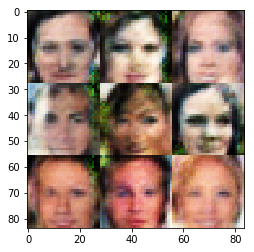

Epoch 1/10 - Batch 2510/3165 train_loss_d: 1.5152, train_loss_g: 0.5331
Epoch 1/10 - Batch 2520/3165 train_loss_d: 1.2319, train_loss_g: 0.9753
Epoch 1/10 - Batch 2530/3165 train_loss_d: 0.6983, train_loss_g: 1.8211
Epoch 1/10 - Batch 2540/3165 train_loss_d: 1.4662, train_loss_g: 1.7781
Epoch 1/10 - Batch 2550/3165 train_loss_d: 1.3300, train_loss_g: 0.8505
Epoch 1/10 - Batch 2560/3165 train_loss_d: 1.4121, train_loss_g: 0.9413
Epoch 1/10 - Batch 2570/3165 train_loss_d: 1.0916, train_loss_g: 0.7104
Epoch 1/10 - Batch 2580/3165 train_loss_d: 1.3058, train_loss_g: 0.7351
Epoch 1/10 - Batch 2590/3165 train_loss_d: 1.1571, train_loss_g: 1.1335
Epoch 1/10 - Batch 2600/3165 train_loss_d: 0.9473, train_loss_g: 1.2598
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_26/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_26/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_26/Maximum_2:0", shape=

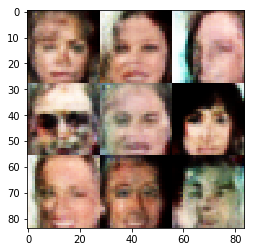

Epoch 1/10 - Batch 2610/3165 train_loss_d: 1.2979, train_loss_g: 0.6314
Epoch 1/10 - Batch 2620/3165 train_loss_d: 1.5397, train_loss_g: 0.4089
Epoch 1/10 - Batch 2630/3165 train_loss_d: 1.2891, train_loss_g: 1.2834
Epoch 1/10 - Batch 2640/3165 train_loss_d: 1.1564, train_loss_g: 1.2707
Epoch 1/10 - Batch 2650/3165 train_loss_d: 1.1733, train_loss_g: 0.9461
Epoch 1/10 - Batch 2660/3165 train_loss_d: 1.3859, train_loss_g: 0.9168
Epoch 1/10 - Batch 2670/3165 train_loss_d: 1.2880, train_loss_g: 0.6395
Epoch 1/10 - Batch 2680/3165 train_loss_d: 1.3497, train_loss_g: 1.0600
Epoch 1/10 - Batch 2690/3165 train_loss_d: 1.3036, train_loss_g: 0.8536
Epoch 1/10 - Batch 2700/3165 train_loss_d: 1.0409, train_loss_g: 1.5838
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_27/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_27/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_27/Maximum_2:0", shape=

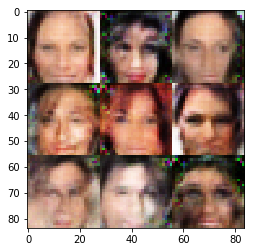

Epoch 1/10 - Batch 2710/3165 train_loss_d: 1.0209, train_loss_g: 1.0164
Epoch 1/10 - Batch 2720/3165 train_loss_d: 1.2703, train_loss_g: 0.9650
Epoch 1/10 - Batch 2730/3165 train_loss_d: 1.2304, train_loss_g: 1.1958
Epoch 1/10 - Batch 2740/3165 train_loss_d: 1.4008, train_loss_g: 0.7363
Epoch 1/10 - Batch 2750/3165 train_loss_d: 1.3168, train_loss_g: 0.9128
Epoch 1/10 - Batch 2760/3165 train_loss_d: 1.5033, train_loss_g: 0.6178
Epoch 1/10 - Batch 2770/3165 train_loss_d: 1.3483, train_loss_g: 0.5545
Epoch 1/10 - Batch 2780/3165 train_loss_d: 1.3490, train_loss_g: 0.8313
Epoch 1/10 - Batch 2790/3165 train_loss_d: 1.2321, train_loss_g: 0.8534
Epoch 1/10 - Batch 2800/3165 train_loss_d: 1.3398, train_loss_g: 0.7831
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_28/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_28/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_28/Maximum_2:0", shape=

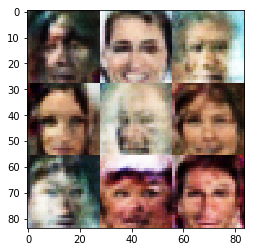

Epoch 1/10 - Batch 2810/3165 train_loss_d: 1.4122, train_loss_g: 0.7418
Epoch 1/10 - Batch 2820/3165 train_loss_d: 1.4096, train_loss_g: 1.3089
Epoch 1/10 - Batch 2830/3165 train_loss_d: 1.2511, train_loss_g: 1.1845
Epoch 1/10 - Batch 2840/3165 train_loss_d: 1.3486, train_loss_g: 0.5409
Epoch 1/10 - Batch 2850/3165 train_loss_d: 1.4080, train_loss_g: 0.7034
Epoch 1/10 - Batch 2860/3165 train_loss_d: 1.6423, train_loss_g: 0.4307
Epoch 1/10 - Batch 2870/3165 train_loss_d: 1.2516, train_loss_g: 0.7874
Epoch 1/10 - Batch 2880/3165 train_loss_d: 1.4257, train_loss_g: 1.5645
Epoch 1/10 - Batch 2890/3165 train_loss_d: 1.1779, train_loss_g: 1.0916
Epoch 1/10 - Batch 2900/3165 train_loss_d: 1.2575, train_loss_g: 0.9569
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_29/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_29/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_29/Maximum_2:0", shape=

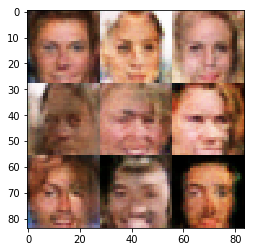

Epoch 1/10 - Batch 2910/3165 train_loss_d: 1.1326, train_loss_g: 1.0291
Epoch 1/10 - Batch 2920/3165 train_loss_d: 1.2672, train_loss_g: 0.7270
Epoch 1/10 - Batch 2930/3165 train_loss_d: 1.5460, train_loss_g: 0.4808
Epoch 1/10 - Batch 2940/3165 train_loss_d: 1.2362, train_loss_g: 0.8652
Epoch 1/10 - Batch 2950/3165 train_loss_d: 1.1111, train_loss_g: 1.1481
Epoch 1/10 - Batch 2960/3165 train_loss_d: 1.4143, train_loss_g: 0.8683
Epoch 1/10 - Batch 2970/3165 train_loss_d: 1.2129, train_loss_g: 0.9178
Epoch 1/10 - Batch 2980/3165 train_loss_d: 1.1964, train_loss_g: 1.0054
Epoch 1/10 - Batch 2990/3165 train_loss_d: 1.5281, train_loss_g: 0.4650
Epoch 1/10 - Batch 3000/3165 train_loss_d: 1.1926, train_loss_g: 0.7802
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_30/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_30/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_30/Maximum_2:0", shape=

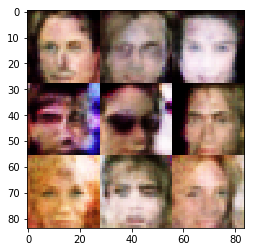

Epoch 1/10 - Batch 3010/3165 train_loss_d: 1.2553, train_loss_g: 0.8960
Epoch 1/10 - Batch 3020/3165 train_loss_d: 1.2806, train_loss_g: 0.9226
Epoch 1/10 - Batch 3030/3165 train_loss_d: 1.3268, train_loss_g: 1.3857
Epoch 1/10 - Batch 3040/3165 train_loss_d: 1.2353, train_loss_g: 0.7872
Epoch 1/10 - Batch 3050/3165 train_loss_d: 1.2701, train_loss_g: 1.0393
Epoch 1/10 - Batch 3060/3165 train_loss_d: 1.3917, train_loss_g: 0.9928
Epoch 1/10 - Batch 3070/3165 train_loss_d: 1.2221, train_loss_g: 0.8094
Epoch 1/10 - Batch 3080/3165 train_loss_d: 1.0103, train_loss_g: 0.8037
Epoch 1/10 - Batch 3090/3165 train_loss_d: 1.0845, train_loss_g: 1.6560
Epoch 1/10 - Batch 3100/3165 train_loss_d: 1.1306, train_loss_g: 1.0461
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_31/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_31/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_31/Maximum_2:0", shape=

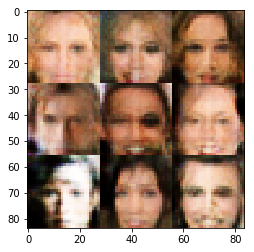

Epoch 1/10 - Batch 3110/3165 train_loss_d: 1.4327, train_loss_g: 0.5017
Epoch 1/10 - Batch 3120/3165 train_loss_d: 1.2279, train_loss_g: 0.7476
Epoch 1/10 - Batch 3130/3165 train_loss_d: 1.6400, train_loss_g: 0.3953
Epoch 1/10 - Batch 3140/3165 train_loss_d: 1.1337, train_loss_g: 0.9535
Epoch 1/10 - Batch 3150/3165 train_loss_d: 1.1796, train_loss_g: 1.2144
Epoch 1/10 - Batch 3160/3165 train_loss_d: 1.4255, train_loss_g: 1.2753
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_32/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_32/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_32/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_32/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


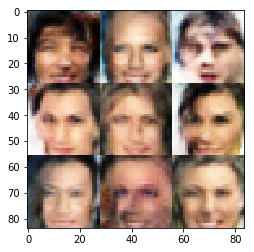


 10%|█         | 1/10 [47:30<7:07:32, 2850.29s/it]

Epoch 2/10 - Batch 10/3165 train_loss_d: 1.2670, train_loss_g: 1.3049
Epoch 2/10 - Batch 20/3165 train_loss_d: 1.2276, train_loss_g: 0.6774
Epoch 2/10 - Batch 30/3165 train_loss_d: 1.3793, train_loss_g: 0.5493
Epoch 2/10 - Batch 40/3165 train_loss_d: 1.2079, train_loss_g: 0.8091
Epoch 2/10 - Batch 50/3165 train_loss_d: 1.2307, train_loss_g: 0.8122
Epoch 2/10 - Batch 60/3165 train_loss_d: 1.2610, train_loss_g: 0.7521
Epoch 2/10 - Batch 70/3165 train_loss_d: 1.3142, train_loss_g: 0.6240
Epoch 2/10 - Batch 80/3165 train_loss_d: 1.3541, train_loss_g: 0.7262
Epoch 2/10 - Batch 90/3165 train_loss_d: 1.1919, train_loss_g: 0.9731
Epoch 2/10 - Batch 100/3165 train_loss_d: 1.4423, train_loss_g: 0.5209
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_33/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_33/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_33/Maximum_2:0", shape=(?, 28, 28, 128), d

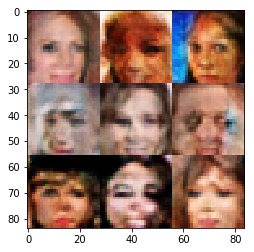

Epoch 2/10 - Batch 110/3165 train_loss_d: 1.1919, train_loss_g: 0.7814
Epoch 2/10 - Batch 120/3165 train_loss_d: 1.1687, train_loss_g: 0.8813
Epoch 2/10 - Batch 130/3165 train_loss_d: 1.2672, train_loss_g: 0.8106
Epoch 2/10 - Batch 140/3165 train_loss_d: 1.2727, train_loss_g: 1.0746
Epoch 2/10 - Batch 150/3165 train_loss_d: 1.3743, train_loss_g: 0.9340
Epoch 2/10 - Batch 160/3165 train_loss_d: 0.8814, train_loss_g: 1.1857
Epoch 2/10 - Batch 170/3165 train_loss_d: 1.2417, train_loss_g: 1.5056
Epoch 2/10 - Batch 180/3165 train_loss_d: 1.1889, train_loss_g: 0.7853
Epoch 2/10 - Batch 190/3165 train_loss_d: 1.1298, train_loss_g: 1.1903
Epoch 2/10 - Batch 200/3165 train_loss_d: 1.6158, train_loss_g: 0.4009
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_34/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_34/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_34/Maximum_2:0", shape=(?, 28, 28

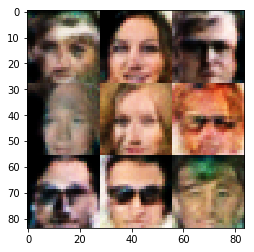

Epoch 2/10 - Batch 210/3165 train_loss_d: 1.2452, train_loss_g: 0.8371
Epoch 2/10 - Batch 220/3165 train_loss_d: 1.3318, train_loss_g: 0.9688
Epoch 2/10 - Batch 230/3165 train_loss_d: 1.3202, train_loss_g: 0.6112
Epoch 2/10 - Batch 240/3165 train_loss_d: 1.4040, train_loss_g: 1.5614
Epoch 2/10 - Batch 250/3165 train_loss_d: 0.6094, train_loss_g: 1.6893
Epoch 2/10 - Batch 260/3165 train_loss_d: 4.3650, train_loss_g: 5.2034
Epoch 2/10 - Batch 270/3165 train_loss_d: 1.2256, train_loss_g: 1.1191
Epoch 2/10 - Batch 280/3165 train_loss_d: 1.3260, train_loss_g: 1.0251
Epoch 2/10 - Batch 290/3165 train_loss_d: 1.3080, train_loss_g: 0.9451
Epoch 2/10 - Batch 300/3165 train_loss_d: 1.2755, train_loss_g: 1.4512
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_35/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_35/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_35/Maximum_2:0", shape=(?, 28, 28

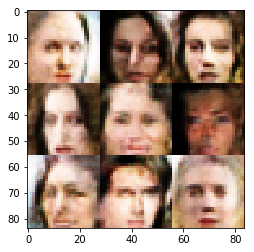

Epoch 2/10 - Batch 310/3165 train_loss_d: 1.3867, train_loss_g: 0.5597
Epoch 2/10 - Batch 320/3165 train_loss_d: 1.2713, train_loss_g: 0.8169
Epoch 2/10 - Batch 330/3165 train_loss_d: 1.3364, train_loss_g: 0.8537
Epoch 2/10 - Batch 340/3165 train_loss_d: 1.2540, train_loss_g: 0.7419
Epoch 2/10 - Batch 350/3165 train_loss_d: 1.0843, train_loss_g: 0.9557
Epoch 2/10 - Batch 360/3165 train_loss_d: 1.3874, train_loss_g: 1.0258
Epoch 2/10 - Batch 370/3165 train_loss_d: 1.3090, train_loss_g: 0.6458
Epoch 2/10 - Batch 380/3165 train_loss_d: 1.3059, train_loss_g: 0.7849
Epoch 2/10 - Batch 390/3165 train_loss_d: 1.2742, train_loss_g: 0.9002
Epoch 2/10 - Batch 400/3165 train_loss_d: 1.3972, train_loss_g: 0.6411
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_36/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_36/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_36/Maximum_2:0", shape=(?, 28, 28

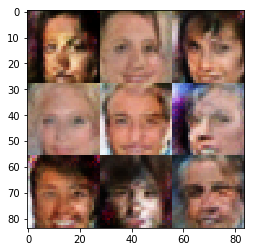

Epoch 2/10 - Batch 410/3165 train_loss_d: 1.3343, train_loss_g: 1.3279
Epoch 2/10 - Batch 420/3165 train_loss_d: 1.2434, train_loss_g: 0.6709
Epoch 2/10 - Batch 430/3165 train_loss_d: 1.4200, train_loss_g: 0.5670
Epoch 2/10 - Batch 440/3165 train_loss_d: 1.3455, train_loss_g: 0.6568
Epoch 2/10 - Batch 450/3165 train_loss_d: 1.3061, train_loss_g: 0.6916
Epoch 2/10 - Batch 460/3165 train_loss_d: 1.3146, train_loss_g: 0.9035
Epoch 2/10 - Batch 470/3165 train_loss_d: 1.2086, train_loss_g: 1.0725
Epoch 2/10 - Batch 480/3165 train_loss_d: 1.3470, train_loss_g: 0.7355
Epoch 2/10 - Batch 490/3165 train_loss_d: 1.3757, train_loss_g: 1.0625
Epoch 2/10 - Batch 500/3165 train_loss_d: 1.3111, train_loss_g: 0.8329
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_37/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_37/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_37/Maximum_2:0", shape=(?, 28, 28

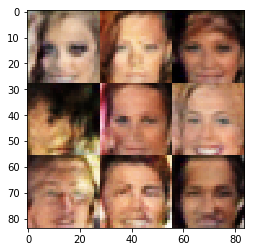

Epoch 2/10 - Batch 510/3165 train_loss_d: 1.3033, train_loss_g: 0.7768
Epoch 2/10 - Batch 520/3165 train_loss_d: 1.2766, train_loss_g: 0.9070
Epoch 2/10 - Batch 530/3165 train_loss_d: 1.2140, train_loss_g: 1.2242
Epoch 2/10 - Batch 540/3165 train_loss_d: 1.3284, train_loss_g: 0.6555
Epoch 2/10 - Batch 550/3165 train_loss_d: 1.3469, train_loss_g: 0.9909
Epoch 2/10 - Batch 560/3165 train_loss_d: 1.2293, train_loss_g: 0.9752
Epoch 2/10 - Batch 570/3165 train_loss_d: 1.2904, train_loss_g: 1.0418
Epoch 2/10 - Batch 580/3165 train_loss_d: 1.3804, train_loss_g: 0.5685
Epoch 2/10 - Batch 590/3165 train_loss_d: 1.1292, train_loss_g: 1.2186
Epoch 2/10 - Batch 600/3165 train_loss_d: 1.3328, train_loss_g: 1.1088
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_38/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_38/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_38/Maximum_2:0", shape=(?, 28, 28

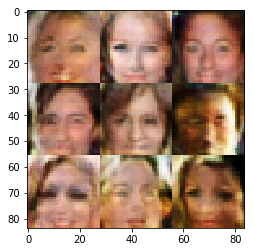

Epoch 2/10 - Batch 610/3165 train_loss_d: 1.5677, train_loss_g: 0.4022
Epoch 2/10 - Batch 620/3165 train_loss_d: 1.2873, train_loss_g: 0.7461
Epoch 2/10 - Batch 630/3165 train_loss_d: 2.0026, train_loss_g: 2.4135
Epoch 2/10 - Batch 640/3165 train_loss_d: 1.4116, train_loss_g: 0.4888
Epoch 2/10 - Batch 650/3165 train_loss_d: 1.3092, train_loss_g: 1.4481
Epoch 2/10 - Batch 660/3165 train_loss_d: 1.2291, train_loss_g: 0.6438
Epoch 2/10 - Batch 670/3165 train_loss_d: 1.3670, train_loss_g: 0.5453
Epoch 2/10 - Batch 680/3165 train_loss_d: 1.2816, train_loss_g: 1.1143
Epoch 2/10 - Batch 690/3165 train_loss_d: 1.2624, train_loss_g: 0.7011
Epoch 2/10 - Batch 700/3165 train_loss_d: 1.2627, train_loss_g: 1.1926
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_39/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_39/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_39/Maximum_2:0", shape=(?, 28, 28

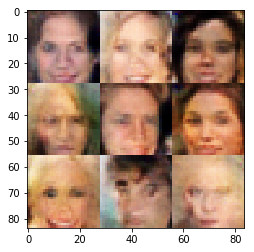

Epoch 2/10 - Batch 710/3165 train_loss_d: 1.2841, train_loss_g: 0.9451
Epoch 2/10 - Batch 720/3165 train_loss_d: 1.3037, train_loss_g: 0.8419
Epoch 2/10 - Batch 730/3165 train_loss_d: 1.2377, train_loss_g: 0.8374
Epoch 2/10 - Batch 740/3165 train_loss_d: 1.2383, train_loss_g: 0.7207
Epoch 2/10 - Batch 750/3165 train_loss_d: 1.4513, train_loss_g: 1.9303
Epoch 2/10 - Batch 760/3165 train_loss_d: 1.2700, train_loss_g: 1.1375
Epoch 2/10 - Batch 770/3165 train_loss_d: 1.2610, train_loss_g: 0.6879
Epoch 2/10 - Batch 780/3165 train_loss_d: 1.3524, train_loss_g: 0.5353
Epoch 2/10 - Batch 790/3165 train_loss_d: 1.2541, train_loss_g: 1.0761
Epoch 2/10 - Batch 800/3165 train_loss_d: 1.3481, train_loss_g: 0.6577
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_40/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_40/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_40/Maximum_2:0", shape=(?, 28, 28

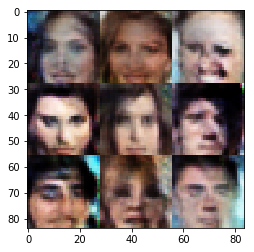

Epoch 2/10 - Batch 810/3165 train_loss_d: 1.3151, train_loss_g: 0.9915
Epoch 2/10 - Batch 820/3165 train_loss_d: 1.2554, train_loss_g: 0.7722
Epoch 2/10 - Batch 830/3165 train_loss_d: 1.3272, train_loss_g: 0.7813
Epoch 2/10 - Batch 840/3165 train_loss_d: 1.3327, train_loss_g: 0.7740
Epoch 2/10 - Batch 850/3165 train_loss_d: 1.1642, train_loss_g: 0.8856
Epoch 2/10 - Batch 860/3165 train_loss_d: 1.2605, train_loss_g: 0.7824
Epoch 2/10 - Batch 870/3165 train_loss_d: 1.4084, train_loss_g: 0.5808
Epoch 2/10 - Batch 880/3165 train_loss_d: 1.2232, train_loss_g: 1.0080
Epoch 2/10 - Batch 890/3165 train_loss_d: 1.1556, train_loss_g: 1.0734
Epoch 2/10 - Batch 900/3165 train_loss_d: 1.1952, train_loss_g: 1.2566
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_41/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_41/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_41/Maximum_2:0", shape=(?, 28, 28

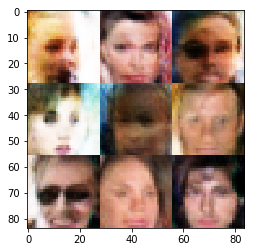

Epoch 2/10 - Batch 910/3165 train_loss_d: 1.3373, train_loss_g: 0.9330
Epoch 2/10 - Batch 920/3165 train_loss_d: 1.3086, train_loss_g: 0.8120
Epoch 2/10 - Batch 930/3165 train_loss_d: 1.2188, train_loss_g: 0.7854
Epoch 2/10 - Batch 940/3165 train_loss_d: 1.3329, train_loss_g: 0.6099
Epoch 2/10 - Batch 950/3165 train_loss_d: 1.2312, train_loss_g: 1.0556
Epoch 2/10 - Batch 960/3165 train_loss_d: 1.2264, train_loss_g: 1.2384
Epoch 2/10 - Batch 970/3165 train_loss_d: 1.2580, train_loss_g: 0.6623
Epoch 2/10 - Batch 980/3165 train_loss_d: 1.1312, train_loss_g: 0.7795
Epoch 2/10 - Batch 990/3165 train_loss_d: 1.3398, train_loss_g: 0.5470
Epoch 2/10 - Batch 1000/3165 train_loss_d: 1.8170, train_loss_g: 2.3256
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_42/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_42/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_42/Maximum_2:0", shape=(?, 28, 2

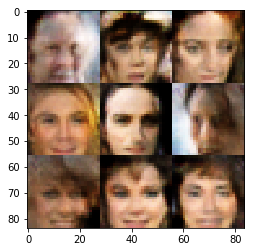

Epoch 2/10 - Batch 1010/3165 train_loss_d: 1.2692, train_loss_g: 0.7622
Epoch 2/10 - Batch 1020/3165 train_loss_d: 1.1768, train_loss_g: 0.7947
Epoch 2/10 - Batch 1030/3165 train_loss_d: 1.5158, train_loss_g: 0.5658
Epoch 2/10 - Batch 1040/3165 train_loss_d: 1.3092, train_loss_g: 0.6837
Epoch 2/10 - Batch 1050/3165 train_loss_d: 1.2390, train_loss_g: 1.2894
Epoch 2/10 - Batch 1060/3165 train_loss_d: 1.2791, train_loss_g: 0.6985
Epoch 2/10 - Batch 1070/3165 train_loss_d: 1.2600, train_loss_g: 0.7920
Epoch 2/10 - Batch 1080/3165 train_loss_d: 1.2097, train_loss_g: 0.8589
Epoch 2/10 - Batch 1090/3165 train_loss_d: 1.2595, train_loss_g: 0.8938
Epoch 2/10 - Batch 1100/3165 train_loss_d: 1.2836, train_loss_g: 0.9336
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_43/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_43/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_43/Maximum_2:0", shape=

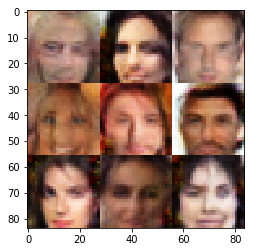

Epoch 2/10 - Batch 1110/3165 train_loss_d: 1.2778, train_loss_g: 0.9400
Epoch 2/10 - Batch 1120/3165 train_loss_d: 1.1612, train_loss_g: 1.3207
Epoch 2/10 - Batch 1130/3165 train_loss_d: 1.1895, train_loss_g: 1.0783
Epoch 2/10 - Batch 1140/3165 train_loss_d: 1.2893, train_loss_g: 1.1864
Epoch 2/10 - Batch 1150/3165 train_loss_d: 1.4074, train_loss_g: 0.7253
Epoch 2/10 - Batch 1160/3165 train_loss_d: 1.2408, train_loss_g: 0.9425
Epoch 2/10 - Batch 1170/3165 train_loss_d: 1.2921, train_loss_g: 0.6333
Epoch 2/10 - Batch 1180/3165 train_loss_d: 1.3341, train_loss_g: 0.7198
Epoch 2/10 - Batch 1190/3165 train_loss_d: 1.2568, train_loss_g: 1.0636
Epoch 2/10 - Batch 1200/3165 train_loss_d: 1.0997, train_loss_g: 0.9514
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_44/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_44/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_44/Maximum_2:0", shape=

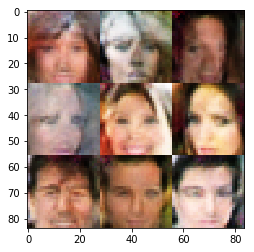

Epoch 2/10 - Batch 1210/3165 train_loss_d: 1.2418, train_loss_g: 0.8658
Epoch 2/10 - Batch 1220/3165 train_loss_d: 1.3326, train_loss_g: 1.0147
Epoch 2/10 - Batch 1230/3165 train_loss_d: 1.3206, train_loss_g: 0.8720
Epoch 2/10 - Batch 1240/3165 train_loss_d: 1.2316, train_loss_g: 0.7120
Epoch 2/10 - Batch 1250/3165 train_loss_d: 1.1716, train_loss_g: 1.0406
Epoch 2/10 - Batch 1260/3165 train_loss_d: 1.2418, train_loss_g: 0.7868
Epoch 2/10 - Batch 1270/3165 train_loss_d: 1.1710, train_loss_g: 1.1913
Epoch 2/10 - Batch 1280/3165 train_loss_d: 1.4192, train_loss_g: 0.7313
Epoch 2/10 - Batch 1290/3165 train_loss_d: 1.2657, train_loss_g: 0.9770
Epoch 2/10 - Batch 1300/3165 train_loss_d: 1.2716, train_loss_g: 1.1896
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_45/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_45/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_45/Maximum_2:0", shape=

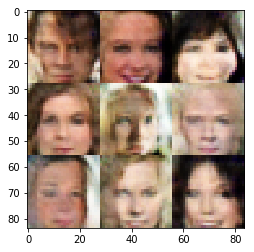

Epoch 2/10 - Batch 1310/3165 train_loss_d: 1.3541, train_loss_g: 1.2563
Epoch 2/10 - Batch 1320/3165 train_loss_d: 1.2569, train_loss_g: 1.2092
Epoch 2/10 - Batch 1330/3165 train_loss_d: 1.2357, train_loss_g: 0.8720
Epoch 2/10 - Batch 1340/3165 train_loss_d: 1.2580, train_loss_g: 1.0972
Epoch 2/10 - Batch 1350/3165 train_loss_d: 1.4352, train_loss_g: 0.7012
Epoch 2/10 - Batch 1360/3165 train_loss_d: 1.2746, train_loss_g: 0.9035
Epoch 2/10 - Batch 1370/3165 train_loss_d: 1.2382, train_loss_g: 1.0290
Epoch 2/10 - Batch 1380/3165 train_loss_d: 1.1536, train_loss_g: 0.9552
Epoch 2/10 - Batch 1390/3165 train_loss_d: 1.3751, train_loss_g: 0.6974
Epoch 2/10 - Batch 1400/3165 train_loss_d: 1.3160, train_loss_g: 1.0549
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_46/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_46/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_46/Maximum_2:0", shape=

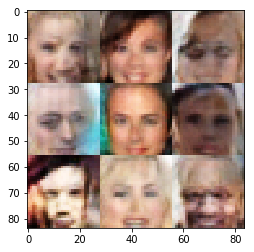

Epoch 2/10 - Batch 1410/3165 train_loss_d: 1.4671, train_loss_g: 0.6501
Epoch 2/10 - Batch 1420/3165 train_loss_d: 1.0138, train_loss_g: 0.9936
Epoch 2/10 - Batch 1430/3165 train_loss_d: 1.3686, train_loss_g: 0.6491
Epoch 2/10 - Batch 1440/3165 train_loss_d: 1.1539, train_loss_g: 0.9094
Epoch 2/10 - Batch 1450/3165 train_loss_d: 1.5760, train_loss_g: 0.4278
Epoch 2/10 - Batch 1460/3165 train_loss_d: 1.2785, train_loss_g: 0.7089
Epoch 2/10 - Batch 1470/3165 train_loss_d: 1.4353, train_loss_g: 0.6359
Epoch 2/10 - Batch 1480/3165 train_loss_d: 1.2804, train_loss_g: 0.9481
Epoch 2/10 - Batch 1490/3165 train_loss_d: 1.2040, train_loss_g: 1.0694
Epoch 2/10 - Batch 1500/3165 train_loss_d: 1.2356, train_loss_g: 0.9007
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_47/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_47/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_47/Maximum_2:0", shape=

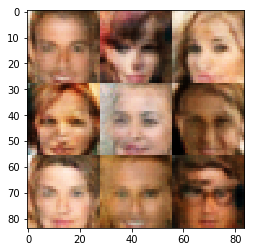

Epoch 2/10 - Batch 1510/3165 train_loss_d: 1.1454, train_loss_g: 1.0240
Epoch 2/10 - Batch 1520/3165 train_loss_d: 1.2548, train_loss_g: 0.9379
Epoch 2/10 - Batch 1530/3165 train_loss_d: 1.3823, train_loss_g: 0.6608
Epoch 2/10 - Batch 1540/3165 train_loss_d: 1.2144, train_loss_g: 0.8585
Epoch 2/10 - Batch 1550/3165 train_loss_d: 1.2759, train_loss_g: 0.7311
Epoch 2/10 - Batch 1560/3165 train_loss_d: 1.2833, train_loss_g: 0.8760
Epoch 2/10 - Batch 1570/3165 train_loss_d: 1.2290, train_loss_g: 1.0403
Epoch 2/10 - Batch 1580/3165 train_loss_d: 1.2390, train_loss_g: 1.1333
Epoch 2/10 - Batch 1590/3165 train_loss_d: 1.6102, train_loss_g: 1.6015
Epoch 2/10 - Batch 1600/3165 train_loss_d: 1.2323, train_loss_g: 0.9394
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_48/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_48/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_48/Maximum_2:0", shape=

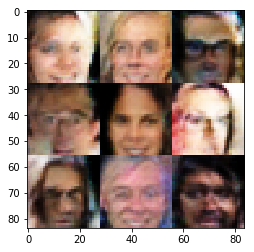

Epoch 2/10 - Batch 1610/3165 train_loss_d: 1.4175, train_loss_g: 0.7780
Epoch 2/10 - Batch 1620/3165 train_loss_d: 1.4310, train_loss_g: 0.5478
Epoch 2/10 - Batch 1630/3165 train_loss_d: 1.2724, train_loss_g: 0.9900
Epoch 2/10 - Batch 1640/3165 train_loss_d: 1.2393, train_loss_g: 0.8951
Epoch 2/10 - Batch 1650/3165 train_loss_d: 1.1796, train_loss_g: 1.0785
Epoch 2/10 - Batch 1660/3165 train_loss_d: 1.4623, train_loss_g: 0.6358
Epoch 2/10 - Batch 1670/3165 train_loss_d: 1.1702, train_loss_g: 0.9336
Epoch 2/10 - Batch 1680/3165 train_loss_d: 1.1869, train_loss_g: 1.1637
Epoch 2/10 - Batch 1690/3165 train_loss_d: 1.2930, train_loss_g: 0.8328
Epoch 2/10 - Batch 1700/3165 train_loss_d: 1.3554, train_loss_g: 0.9890
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_49/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_49/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_49/Maximum_2:0", shape=

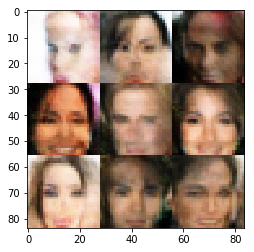

Epoch 2/10 - Batch 1710/3165 train_loss_d: 1.1518, train_loss_g: 0.7793
Epoch 2/10 - Batch 1720/3165 train_loss_d: 1.4882, train_loss_g: 1.0300
Epoch 2/10 - Batch 1730/3165 train_loss_d: 1.3759, train_loss_g: 1.0692
Epoch 2/10 - Batch 1740/3165 train_loss_d: 1.3022, train_loss_g: 1.0150
Epoch 2/10 - Batch 1750/3165 train_loss_d: 1.4070, train_loss_g: 0.8590
Epoch 2/10 - Batch 1760/3165 train_loss_d: 1.4054, train_loss_g: 0.9536
Epoch 2/10 - Batch 1770/3165 train_loss_d: 1.2873, train_loss_g: 0.9420
Epoch 2/10 - Batch 1780/3165 train_loss_d: 1.2626, train_loss_g: 0.6726
Epoch 2/10 - Batch 1790/3165 train_loss_d: 1.4001, train_loss_g: 0.5525
Epoch 2/10 - Batch 1800/3165 train_loss_d: 1.2886, train_loss_g: 1.0482
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_50/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_50/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_50/Maximum_2:0", shape=

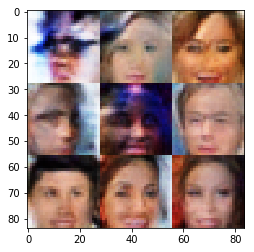

Epoch 2/10 - Batch 1810/3165 train_loss_d: 1.0608, train_loss_g: 1.0289
Epoch 2/10 - Batch 1820/3165 train_loss_d: 1.2172, train_loss_g: 1.0662
Epoch 2/10 - Batch 1830/3165 train_loss_d: 1.3079, train_loss_g: 0.8636
Epoch 2/10 - Batch 1840/3165 train_loss_d: 1.2444, train_loss_g: 0.9008
Epoch 2/10 - Batch 1850/3165 train_loss_d: 1.2468, train_loss_g: 0.9905
Epoch 2/10 - Batch 1860/3165 train_loss_d: 1.2874, train_loss_g: 1.3634
Epoch 2/10 - Batch 1870/3165 train_loss_d: 1.3063, train_loss_g: 0.9628
Epoch 2/10 - Batch 1880/3165 train_loss_d: 1.4173, train_loss_g: 0.6350
Epoch 2/10 - Batch 1890/3165 train_loss_d: 1.3567, train_loss_g: 1.0161
Epoch 2/10 - Batch 1900/3165 train_loss_d: 1.3544, train_loss_g: 0.8246
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_51/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_51/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_51/Maximum_2:0", shape=

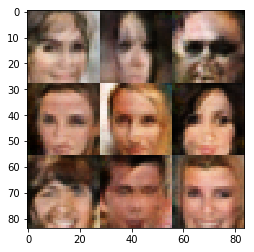

Epoch 2/10 - Batch 1910/3165 train_loss_d: 1.4090, train_loss_g: 0.6200
Epoch 2/10 - Batch 1920/3165 train_loss_d: 1.4674, train_loss_g: 0.5189
Epoch 2/10 - Batch 1930/3165 train_loss_d: 1.3632, train_loss_g: 0.6607
Epoch 2/10 - Batch 1940/3165 train_loss_d: 1.3408, train_loss_g: 0.6167
Epoch 2/10 - Batch 1950/3165 train_loss_d: 1.3601, train_loss_g: 1.1843
Epoch 2/10 - Batch 1960/3165 train_loss_d: 1.2230, train_loss_g: 0.9177
Epoch 2/10 - Batch 1970/3165 train_loss_d: 1.7071, train_loss_g: 1.7547
Epoch 2/10 - Batch 1980/3165 train_loss_d: 1.2061, train_loss_g: 0.7591
Epoch 2/10 - Batch 1990/3165 train_loss_d: 1.2774, train_loss_g: 1.1621
Epoch 2/10 - Batch 2000/3165 train_loss_d: 1.2437, train_loss_g: 0.9817
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_52/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_52/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_52/Maximum_2:0", shape=

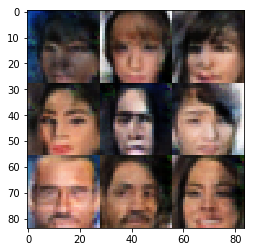

Epoch 2/10 - Batch 2010/3165 train_loss_d: 1.2748, train_loss_g: 1.0515
Epoch 2/10 - Batch 2020/3165 train_loss_d: 1.3204, train_loss_g: 0.6873
Epoch 2/10 - Batch 2030/3165 train_loss_d: 1.3471, train_loss_g: 0.7362
Epoch 2/10 - Batch 2040/3165 train_loss_d: 1.3706, train_loss_g: 0.8560
Epoch 2/10 - Batch 2050/3165 train_loss_d: 1.1857, train_loss_g: 0.7916
Epoch 2/10 - Batch 2060/3165 train_loss_d: 1.4014, train_loss_g: 1.6650
Epoch 2/10 - Batch 2070/3165 train_loss_d: 1.2715, train_loss_g: 0.8693
Epoch 2/10 - Batch 2080/3165 train_loss_d: 1.3481, train_loss_g: 0.6911
Epoch 2/10 - Batch 2090/3165 train_loss_d: 1.2481, train_loss_g: 0.8594
Epoch 2/10 - Batch 2100/3165 train_loss_d: 1.2471, train_loss_g: 0.7790
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_53/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_53/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_53/Maximum_2:0", shape=

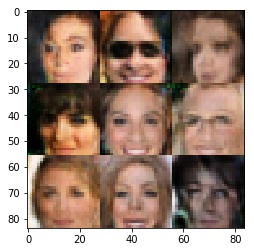

Epoch 2/10 - Batch 2110/3165 train_loss_d: 1.2532, train_loss_g: 0.7991
Epoch 2/10 - Batch 2120/3165 train_loss_d: 1.1640, train_loss_g: 0.9546
Epoch 2/10 - Batch 2130/3165 train_loss_d: 1.3988, train_loss_g: 0.7530
Epoch 2/10 - Batch 2140/3165 train_loss_d: 0.9198, train_loss_g: 1.1454
Epoch 2/10 - Batch 2150/3165 train_loss_d: 1.8881, train_loss_g: 2.5657
Epoch 2/10 - Batch 2160/3165 train_loss_d: 1.3826, train_loss_g: 0.5877
Epoch 2/10 - Batch 2170/3165 train_loss_d: 1.1329, train_loss_g: 0.7318
Epoch 2/10 - Batch 2180/3165 train_loss_d: 1.2546, train_loss_g: 1.0408
Epoch 2/10 - Batch 2190/3165 train_loss_d: 1.2208, train_loss_g: 0.8161
Epoch 2/10 - Batch 2200/3165 train_loss_d: 1.3965, train_loss_g: 0.6463
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_54/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_54/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_54/Maximum_2:0", shape=

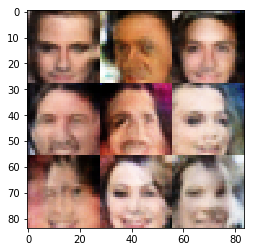

Epoch 2/10 - Batch 2210/3165 train_loss_d: 1.3617, train_loss_g: 0.5436
Epoch 2/10 - Batch 2220/3165 train_loss_d: 1.3200, train_loss_g: 1.0862
Epoch 2/10 - Batch 2230/3165 train_loss_d: 1.6018, train_loss_g: 0.3945
Epoch 2/10 - Batch 2240/3165 train_loss_d: 1.3304, train_loss_g: 0.9407
Epoch 2/10 - Batch 2250/3165 train_loss_d: 1.3754, train_loss_g: 0.7091
Epoch 2/10 - Batch 2260/3165 train_loss_d: 1.2804, train_loss_g: 1.0393
Epoch 2/10 - Batch 2270/3165 train_loss_d: 1.1828, train_loss_g: 0.8004
Epoch 2/10 - Batch 2280/3165 train_loss_d: 1.3263, train_loss_g: 0.7925
Epoch 2/10 - Batch 2290/3165 train_loss_d: 1.1794, train_loss_g: 1.0340
Epoch 2/10 - Batch 2300/3165 train_loss_d: 1.4057, train_loss_g: 0.6138
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_55/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_55/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_55/Maximum_2:0", shape=

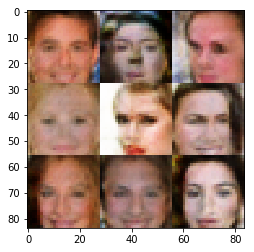

Epoch 2/10 - Batch 2310/3165 train_loss_d: 1.4839, train_loss_g: 1.3479
Epoch 2/10 - Batch 2320/3165 train_loss_d: 1.3154, train_loss_g: 1.2852
Epoch 2/10 - Batch 2330/3165 train_loss_d: 1.2969, train_loss_g: 0.6273
Epoch 2/10 - Batch 2340/3165 train_loss_d: 1.4878, train_loss_g: 0.4499
Epoch 2/10 - Batch 2350/3165 train_loss_d: 1.2425, train_loss_g: 0.8373
Epoch 2/10 - Batch 2360/3165 train_loss_d: 1.3631, train_loss_g: 0.5671
Epoch 2/10 - Batch 2370/3165 train_loss_d: 1.2081, train_loss_g: 0.9323
Epoch 2/10 - Batch 2380/3165 train_loss_d: 1.0713, train_loss_g: 0.9960
Epoch 2/10 - Batch 2390/3165 train_loss_d: 1.5434, train_loss_g: 0.5128
Epoch 2/10 - Batch 2400/3165 train_loss_d: 1.1480, train_loss_g: 1.1483
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_56/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_56/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_56/Maximum_2:0", shape=

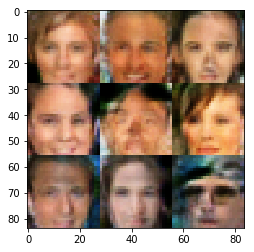

Epoch 2/10 - Batch 2410/3165 train_loss_d: 1.3350, train_loss_g: 1.0998
Epoch 2/10 - Batch 2420/3165 train_loss_d: 1.2841, train_loss_g: 0.7511
Epoch 2/10 - Batch 2430/3165 train_loss_d: 1.1247, train_loss_g: 0.8970
Epoch 2/10 - Batch 2440/3165 train_loss_d: 1.3806, train_loss_g: 0.5286
Epoch 2/10 - Batch 2450/3165 train_loss_d: 1.1781, train_loss_g: 1.1994
Epoch 2/10 - Batch 2460/3165 train_loss_d: 2.0097, train_loss_g: 1.9541
Epoch 2/10 - Batch 2470/3165 train_loss_d: 1.1838, train_loss_g: 0.8223
Epoch 2/10 - Batch 2480/3165 train_loss_d: 1.3471, train_loss_g: 1.1566
Epoch 2/10 - Batch 2490/3165 train_loss_d: 1.2433, train_loss_g: 0.7079
Epoch 2/10 - Batch 2500/3165 train_loss_d: 1.2709, train_loss_g: 1.0780
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_57/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_57/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_57/Maximum_2:0", shape=

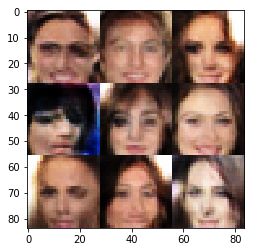

Epoch 2/10 - Batch 2510/3165 train_loss_d: 1.1582, train_loss_g: 0.8329
Epoch 2/10 - Batch 2520/3165 train_loss_d: 1.2814, train_loss_g: 0.9946
Epoch 2/10 - Batch 2530/3165 train_loss_d: 2.0040, train_loss_g: 0.2591
Epoch 2/10 - Batch 2540/3165 train_loss_d: 1.2269, train_loss_g: 0.7727
Epoch 2/10 - Batch 2550/3165 train_loss_d: 1.4227, train_loss_g: 0.7233
Epoch 2/10 - Batch 2560/3165 train_loss_d: 1.1481, train_loss_g: 0.7978
Epoch 2/10 - Batch 2570/3165 train_loss_d: 1.4827, train_loss_g: 0.4375
Epoch 2/10 - Batch 2580/3165 train_loss_d: 1.6151, train_loss_g: 0.3665
Epoch 2/10 - Batch 2590/3165 train_loss_d: 1.5479, train_loss_g: 0.4414
Epoch 2/10 - Batch 2600/3165 train_loss_d: 1.2170, train_loss_g: 1.1592
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_58/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_58/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_58/Maximum_2:0", shape=

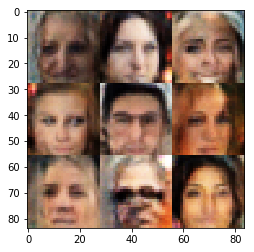

Epoch 2/10 - Batch 2610/3165 train_loss_d: 1.2971, train_loss_g: 0.9461
Epoch 2/10 - Batch 2620/3165 train_loss_d: 1.1933, train_loss_g: 0.8799
Epoch 2/10 - Batch 2630/3165 train_loss_d: 1.3931, train_loss_g: 0.9622
Epoch 2/10 - Batch 2640/3165 train_loss_d: 1.2849, train_loss_g: 0.8024
Epoch 2/10 - Batch 2650/3165 train_loss_d: 1.4434, train_loss_g: 1.2506
Epoch 2/10 - Batch 2660/3165 train_loss_d: 1.0382, train_loss_g: 0.9728
Epoch 2/10 - Batch 2670/3165 train_loss_d: 1.2950, train_loss_g: 0.8162
Epoch 2/10 - Batch 2680/3165 train_loss_d: 1.3819, train_loss_g: 0.5151
Epoch 2/10 - Batch 2690/3165 train_loss_d: 0.8648, train_loss_g: 1.4665
Epoch 2/10 - Batch 2700/3165 train_loss_d: 1.3857, train_loss_g: 0.5108
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_59/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_59/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_59/Maximum_2:0", shape=

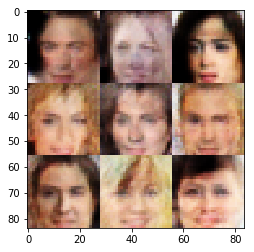

Epoch 2/10 - Batch 2710/3165 train_loss_d: 1.1185, train_loss_g: 1.1244
Epoch 2/10 - Batch 2720/3165 train_loss_d: 1.2361, train_loss_g: 1.5128
Epoch 2/10 - Batch 2730/3165 train_loss_d: 1.0785, train_loss_g: 0.8808
Epoch 2/10 - Batch 2740/3165 train_loss_d: 1.2111, train_loss_g: 0.7495
Epoch 2/10 - Batch 2750/3165 train_loss_d: 1.2555, train_loss_g: 0.9870
Epoch 2/10 - Batch 2760/3165 train_loss_d: 1.1614, train_loss_g: 0.8108
Epoch 2/10 - Batch 2770/3165 train_loss_d: 1.3332, train_loss_g: 0.6595
Epoch 2/10 - Batch 2780/3165 train_loss_d: 1.1899, train_loss_g: 0.8956
Epoch 2/10 - Batch 2790/3165 train_loss_d: 1.2732, train_loss_g: 0.8484
Epoch 2/10 - Batch 2800/3165 train_loss_d: 1.2089, train_loss_g: 1.0127
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_60/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_60/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_60/Maximum_2:0", shape=

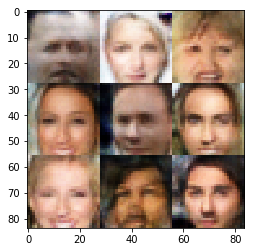

Epoch 2/10 - Batch 2810/3165 train_loss_d: 1.5100, train_loss_g: 0.4695
Epoch 2/10 - Batch 2820/3165 train_loss_d: 1.2942, train_loss_g: 0.8156
Epoch 2/10 - Batch 2830/3165 train_loss_d: 1.2656, train_loss_g: 0.8975
Epoch 2/10 - Batch 2840/3165 train_loss_d: 1.3552, train_loss_g: 0.8457
Epoch 2/10 - Batch 2850/3165 train_loss_d: 1.2868, train_loss_g: 0.7635
Epoch 2/10 - Batch 2860/3165 train_loss_d: 1.3379, train_loss_g: 0.6649
Epoch 2/10 - Batch 2870/3165 train_loss_d: 1.2750, train_loss_g: 1.1656
Epoch 2/10 - Batch 2880/3165 train_loss_d: 1.4065, train_loss_g: 0.6800
Epoch 2/10 - Batch 2890/3165 train_loss_d: 1.3633, train_loss_g: 0.7979
Epoch 2/10 - Batch 2900/3165 train_loss_d: 1.1950, train_loss_g: 0.9778
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_61/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_61/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_61/Maximum_2:0", shape=

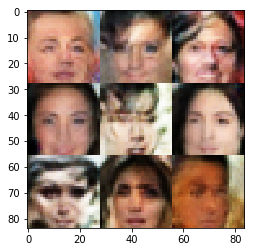

Epoch 2/10 - Batch 2910/3165 train_loss_d: 1.2834, train_loss_g: 0.9494
Epoch 2/10 - Batch 2920/3165 train_loss_d: 1.2570, train_loss_g: 0.6919
Epoch 2/10 - Batch 2930/3165 train_loss_d: 1.3524, train_loss_g: 0.8715
Epoch 2/10 - Batch 2940/3165 train_loss_d: 1.2152, train_loss_g: 0.8197
Epoch 2/10 - Batch 2950/3165 train_loss_d: 1.3989, train_loss_g: 0.6678
Epoch 2/10 - Batch 2960/3165 train_loss_d: 1.2774, train_loss_g: 0.6970
Epoch 2/10 - Batch 2970/3165 train_loss_d: 1.3144, train_loss_g: 1.0951
Epoch 2/10 - Batch 2980/3165 train_loss_d: 1.4126, train_loss_g: 1.0169
Epoch 2/10 - Batch 2990/3165 train_loss_d: 1.3184, train_loss_g: 0.6917
Epoch 2/10 - Batch 3000/3165 train_loss_d: 1.3371, train_loss_g: 0.6480
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_62/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_62/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_62/Maximum_2:0", shape=

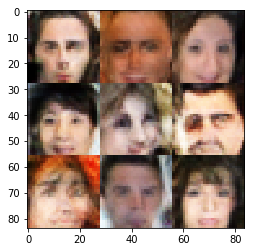

Epoch 2/10 - Batch 3010/3165 train_loss_d: 1.2142, train_loss_g: 0.9711
Epoch 2/10 - Batch 3020/3165 train_loss_d: 1.3903, train_loss_g: 0.6593
Epoch 2/10 - Batch 3030/3165 train_loss_d: 1.4218, train_loss_g: 1.3222
Epoch 2/10 - Batch 3040/3165 train_loss_d: 1.1683, train_loss_g: 1.0424
Epoch 2/10 - Batch 3050/3165 train_loss_d: 1.3111, train_loss_g: 1.0380
Epoch 2/10 - Batch 3060/3165 train_loss_d: 1.2472, train_loss_g: 0.8079
Epoch 2/10 - Batch 3070/3165 train_loss_d: 1.3326, train_loss_g: 0.6301
Epoch 2/10 - Batch 3080/3165 train_loss_d: 1.2654, train_loss_g: 0.8056
Epoch 2/10 - Batch 3090/3165 train_loss_d: 1.3640, train_loss_g: 0.6737
Epoch 2/10 - Batch 3100/3165 train_loss_d: 1.2873, train_loss_g: 0.7690
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_63/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_63/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_63/Maximum_2:0", shape=

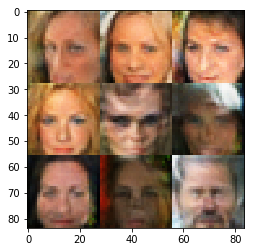

Epoch 2/10 - Batch 3110/3165 train_loss_d: 1.3462, train_loss_g: 0.7439
Epoch 2/10 - Batch 3120/3165 train_loss_d: 1.2768, train_loss_g: 0.9067
Epoch 2/10 - Batch 3130/3165 train_loss_d: 1.3657, train_loss_g: 0.8303
Epoch 2/10 - Batch 3140/3165 train_loss_d: 1.1915, train_loss_g: 0.9480
Epoch 2/10 - Batch 3150/3165 train_loss_d: 1.3878, train_loss_g: 0.7238
Epoch 2/10 - Batch 3160/3165 train_loss_d: 1.2723, train_loss_g: 0.7241
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_64/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_64/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_64/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_64/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


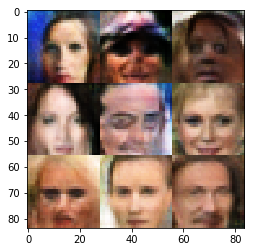


 20%|██        | 2/10 [1:30:16<6:08:41, 2765.17s/it]

Epoch 3/10 - Batch 10/3165 train_loss_d: 1.1706, train_loss_g: 0.9442
Epoch 3/10 - Batch 20/3165 train_loss_d: 1.3347, train_loss_g: 1.0358
Epoch 3/10 - Batch 30/3165 train_loss_d: 1.3090, train_loss_g: 0.7672
Epoch 3/10 - Batch 40/3165 train_loss_d: 1.2554, train_loss_g: 0.8913
Epoch 3/10 - Batch 50/3165 train_loss_d: 1.3145, train_loss_g: 0.5708
Epoch 3/10 - Batch 60/3165 train_loss_d: 1.3060, train_loss_g: 0.7594
Epoch 3/10 - Batch 70/3165 train_loss_d: 1.1129, train_loss_g: 0.8725
Epoch 3/10 - Batch 80/3165 train_loss_d: 1.2611, train_loss_g: 1.0544
Epoch 3/10 - Batch 90/3165 train_loss_d: 1.3724, train_loss_g: 0.8881
Epoch 3/10 - Batch 100/3165 train_loss_d: 1.2854, train_loss_g: 0.7208
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_65/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_65/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_65/Maximum_2:0", shape=(?, 28, 28, 128), d

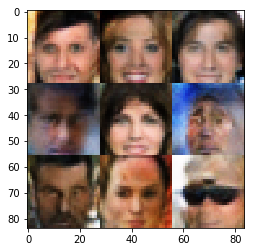

Epoch 3/10 - Batch 110/3165 train_loss_d: 1.1981, train_loss_g: 0.8264
Epoch 3/10 - Batch 120/3165 train_loss_d: 1.3278, train_loss_g: 0.7071
Epoch 3/10 - Batch 130/3165 train_loss_d: 1.3664, train_loss_g: 0.6604
Epoch 3/10 - Batch 140/3165 train_loss_d: 1.2520, train_loss_g: 0.9107
Epoch 3/10 - Batch 150/3165 train_loss_d: 1.4453, train_loss_g: 0.4890
Epoch 3/10 - Batch 160/3165 train_loss_d: 1.3894, train_loss_g: 0.5258
Epoch 3/10 - Batch 170/3165 train_loss_d: 1.3126, train_loss_g: 1.0855
Epoch 3/10 - Batch 180/3165 train_loss_d: 1.3037, train_loss_g: 1.4319
Epoch 3/10 - Batch 190/3165 train_loss_d: 1.2812, train_loss_g: 0.8328
Epoch 3/10 - Batch 200/3165 train_loss_d: 1.3797, train_loss_g: 0.6988
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_66/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_66/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_66/Maximum_2:0", shape=(?, 28, 28

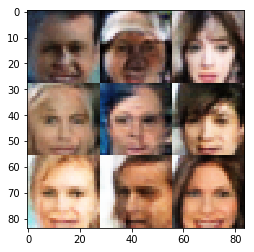

Epoch 3/10 - Batch 210/3165 train_loss_d: 1.2405, train_loss_g: 0.9603
Epoch 3/10 - Batch 220/3165 train_loss_d: 1.3070, train_loss_g: 1.1080
Epoch 3/10 - Batch 230/3165 train_loss_d: 1.3339, train_loss_g: 1.1010
Epoch 3/10 - Batch 240/3165 train_loss_d: 1.3264, train_loss_g: 0.7094
Epoch 3/10 - Batch 250/3165 train_loss_d: 1.2278, train_loss_g: 0.7565
Epoch 3/10 - Batch 260/3165 train_loss_d: 1.2917, train_loss_g: 0.7167
Epoch 3/10 - Batch 270/3165 train_loss_d: 1.2373, train_loss_g: 0.9657
Epoch 3/10 - Batch 280/3165 train_loss_d: 1.4712, train_loss_g: 1.3312
Epoch 3/10 - Batch 290/3165 train_loss_d: 1.3093, train_loss_g: 0.8378
Epoch 3/10 - Batch 300/3165 train_loss_d: 1.2825, train_loss_g: 0.8471
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_67/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_67/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_67/Maximum_2:0", shape=(?, 28, 28

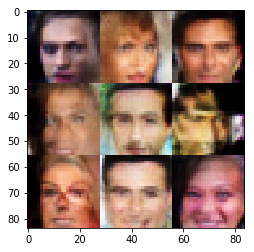

Epoch 3/10 - Batch 310/3165 train_loss_d: 1.4222, train_loss_g: 0.5117
Epoch 3/10 - Batch 320/3165 train_loss_d: 1.3767, train_loss_g: 0.6002
Epoch 3/10 - Batch 330/3165 train_loss_d: 1.2797, train_loss_g: 0.9352
Epoch 3/10 - Batch 340/3165 train_loss_d: 1.2960, train_loss_g: 0.7468
Epoch 3/10 - Batch 350/3165 train_loss_d: 1.0793, train_loss_g: 0.9637
Epoch 3/10 - Batch 360/3165 train_loss_d: 1.1796, train_loss_g: 0.8532
Epoch 3/10 - Batch 370/3165 train_loss_d: 1.3827, train_loss_g: 0.6248
Epoch 3/10 - Batch 380/3165 train_loss_d: 1.1673, train_loss_g: 0.9949
Epoch 3/10 - Batch 390/3165 train_loss_d: 1.1740, train_loss_g: 1.0590
Epoch 3/10 - Batch 400/3165 train_loss_d: 1.2064, train_loss_g: 0.8174
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_68/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_68/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_68/Maximum_2:0", shape=(?, 28, 28

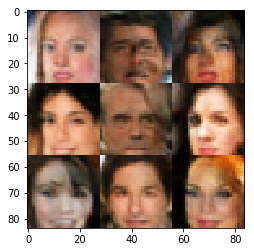

Epoch 3/10 - Batch 410/3165 train_loss_d: 1.3021, train_loss_g: 0.8126
Epoch 3/10 - Batch 420/3165 train_loss_d: 1.3931, train_loss_g: 0.8625
Epoch 3/10 - Batch 430/3165 train_loss_d: 1.4072, train_loss_g: 0.5358
Epoch 3/10 - Batch 440/3165 train_loss_d: 1.3024, train_loss_g: 0.7446
Epoch 3/10 - Batch 450/3165 train_loss_d: 1.3674, train_loss_g: 0.9403
Epoch 3/10 - Batch 460/3165 train_loss_d: 1.2424, train_loss_g: 1.1164
Epoch 3/10 - Batch 470/3165 train_loss_d: 1.1793, train_loss_g: 0.9761
Epoch 3/10 - Batch 480/3165 train_loss_d: 1.2545, train_loss_g: 1.0408
Epoch 3/10 - Batch 490/3165 train_loss_d: 1.2903, train_loss_g: 1.0410
Epoch 3/10 - Batch 500/3165 train_loss_d: 1.3160, train_loss_g: 0.7808
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_69/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_69/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_69/Maximum_2:0", shape=(?, 28, 28

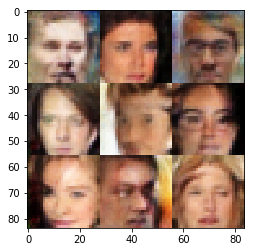

Epoch 3/10 - Batch 510/3165 train_loss_d: 1.3821, train_loss_g: 0.6556
Epoch 3/10 - Batch 520/3165 train_loss_d: 1.2349, train_loss_g: 0.8762
Epoch 3/10 - Batch 530/3165 train_loss_d: 1.3481, train_loss_g: 0.6661
Epoch 3/10 - Batch 540/3165 train_loss_d: 1.3854, train_loss_g: 0.6357
Epoch 3/10 - Batch 550/3165 train_loss_d: 1.3305, train_loss_g: 0.7681
Epoch 3/10 - Batch 560/3165 train_loss_d: 1.2409, train_loss_g: 0.9993
Epoch 3/10 - Batch 570/3165 train_loss_d: 1.1518, train_loss_g: 0.9130
Epoch 3/10 - Batch 580/3165 train_loss_d: 1.1082, train_loss_g: 0.9976
Epoch 3/10 - Batch 590/3165 train_loss_d: 1.2459, train_loss_g: 0.8130
Epoch 3/10 - Batch 600/3165 train_loss_d: 1.3426, train_loss_g: 0.7161
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_70/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_70/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_70/Maximum_2:0", shape=(?, 28, 28

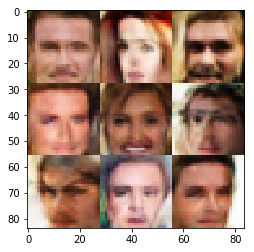

Epoch 3/10 - Batch 610/3165 train_loss_d: 1.5139, train_loss_g: 0.9331
Epoch 3/10 - Batch 620/3165 train_loss_d: 1.2770, train_loss_g: 1.0133
Epoch 3/10 - Batch 630/3165 train_loss_d: 1.3175, train_loss_g: 1.4706
Epoch 3/10 - Batch 640/3165 train_loss_d: 1.3278, train_loss_g: 0.9542
Epoch 3/10 - Batch 650/3165 train_loss_d: 1.3456, train_loss_g: 0.7697
Epoch 3/10 - Batch 660/3165 train_loss_d: 1.1326, train_loss_g: 0.8292
Epoch 3/10 - Batch 670/3165 train_loss_d: 1.4641, train_loss_g: 0.5925
Epoch 3/10 - Batch 680/3165 train_loss_d: 1.2250, train_loss_g: 0.9041
Epoch 3/10 - Batch 690/3165 train_loss_d: 1.3052, train_loss_g: 0.7558
Epoch 3/10 - Batch 700/3165 train_loss_d: 1.4242, train_loss_g: 0.6563
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_71/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_71/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_71/Maximum_2:0", shape=(?, 28, 28

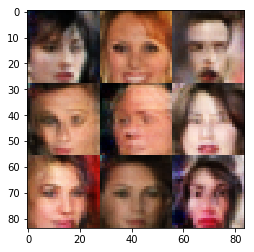

Epoch 3/10 - Batch 710/3165 train_loss_d: 1.2469, train_loss_g: 0.8602
Epoch 3/10 - Batch 720/3165 train_loss_d: 1.3098, train_loss_g: 0.8727
Epoch 3/10 - Batch 730/3165 train_loss_d: 1.3346, train_loss_g: 0.9136
Epoch 3/10 - Batch 740/3165 train_loss_d: 1.3090, train_loss_g: 0.7917
Epoch 3/10 - Batch 750/3165 train_loss_d: 1.1816, train_loss_g: 0.9934
Epoch 3/10 - Batch 760/3165 train_loss_d: 1.2738, train_loss_g: 0.8822
Epoch 3/10 - Batch 770/3165 train_loss_d: 1.2575, train_loss_g: 0.7528
Epoch 3/10 - Batch 780/3165 train_loss_d: 1.5218, train_loss_g: 0.4763
Epoch 3/10 - Batch 790/3165 train_loss_d: 1.4226, train_loss_g: 1.0274
Epoch 3/10 - Batch 800/3165 train_loss_d: 1.2697, train_loss_g: 0.7401
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_72/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_72/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_72/Maximum_2:0", shape=(?, 28, 28

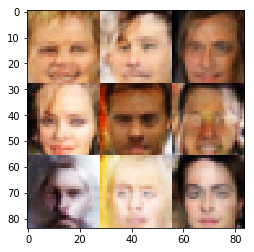

Epoch 3/10 - Batch 810/3165 train_loss_d: 1.4474, train_loss_g: 0.8939
Epoch 3/10 - Batch 820/3165 train_loss_d: 1.1741, train_loss_g: 0.9607
Epoch 3/10 - Batch 830/3165 train_loss_d: 1.3214, train_loss_g: 0.8281
Epoch 3/10 - Batch 840/3165 train_loss_d: 1.3154, train_loss_g: 0.6708
Epoch 3/10 - Batch 850/3165 train_loss_d: 1.2201, train_loss_g: 0.8624
Epoch 3/10 - Batch 860/3165 train_loss_d: 1.4068, train_loss_g: 0.8302
Epoch 3/10 - Batch 870/3165 train_loss_d: 1.2017, train_loss_g: 1.0772
Epoch 3/10 - Batch 880/3165 train_loss_d: 1.2692, train_loss_g: 0.7098
Epoch 3/10 - Batch 890/3165 train_loss_d: 1.2229, train_loss_g: 0.8859
Epoch 3/10 - Batch 900/3165 train_loss_d: 1.3895, train_loss_g: 0.8588
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_73/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_73/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_73/Maximum_2:0", shape=(?, 28, 28

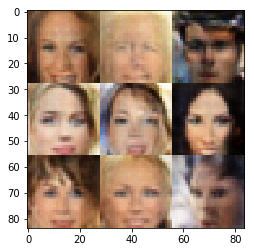

Epoch 3/10 - Batch 910/3165 train_loss_d: 1.2626, train_loss_g: 1.0231
Epoch 3/10 - Batch 920/3165 train_loss_d: 1.2982, train_loss_g: 0.7732
Epoch 3/10 - Batch 930/3165 train_loss_d: 1.3290, train_loss_g: 0.6491
Epoch 3/10 - Batch 940/3165 train_loss_d: 1.2825, train_loss_g: 0.7461
Epoch 3/10 - Batch 950/3165 train_loss_d: 1.3242, train_loss_g: 0.8293
Epoch 3/10 - Batch 960/3165 train_loss_d: 1.3740, train_loss_g: 0.6100
Epoch 3/10 - Batch 970/3165 train_loss_d: 1.2842, train_loss_g: 0.7009
Epoch 3/10 - Batch 980/3165 train_loss_d: 1.3205, train_loss_g: 0.8328
Epoch 3/10 - Batch 990/3165 train_loss_d: 1.3560, train_loss_g: 0.8482
Epoch 3/10 - Batch 1000/3165 train_loss_d: 1.4265, train_loss_g: 0.5970
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_74/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_74/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_74/Maximum_2:0", shape=(?, 28, 2

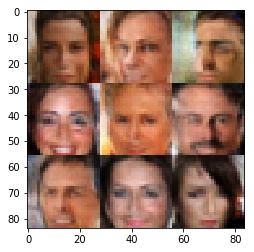

Epoch 3/10 - Batch 1010/3165 train_loss_d: 1.3150, train_loss_g: 0.7089
Epoch 3/10 - Batch 1020/3165 train_loss_d: 1.4164, train_loss_g: 0.5898
Epoch 3/10 - Batch 1030/3165 train_loss_d: 1.3580, train_loss_g: 0.7393
Epoch 3/10 - Batch 1040/3165 train_loss_d: 1.3327, train_loss_g: 0.7524
Epoch 3/10 - Batch 1050/3165 train_loss_d: 1.4609, train_loss_g: 0.8220
Epoch 3/10 - Batch 1060/3165 train_loss_d: 1.2109, train_loss_g: 0.7881
Epoch 3/10 - Batch 1070/3165 train_loss_d: 1.2297, train_loss_g: 0.8489
Epoch 3/10 - Batch 1080/3165 train_loss_d: 1.3070, train_loss_g: 0.8308
Epoch 3/10 - Batch 1090/3165 train_loss_d: 1.2790, train_loss_g: 0.8982
Epoch 3/10 - Batch 1100/3165 train_loss_d: 1.2798, train_loss_g: 0.7290
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_75/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_75/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_75/Maximum_2:0", shape=

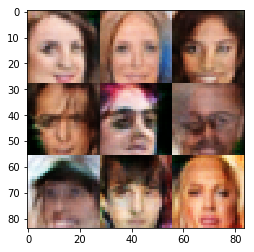

Epoch 3/10 - Batch 1110/3165 train_loss_d: 1.4132, train_loss_g: 0.5134
Epoch 3/10 - Batch 1120/3165 train_loss_d: 1.2911, train_loss_g: 0.8836
Epoch 3/10 - Batch 1130/3165 train_loss_d: 1.2240, train_loss_g: 0.9568
Epoch 3/10 - Batch 1140/3165 train_loss_d: 1.2967, train_loss_g: 1.0262
Epoch 3/10 - Batch 1150/3165 train_loss_d: 1.4751, train_loss_g: 0.5859
Epoch 3/10 - Batch 1160/3165 train_loss_d: 1.1976, train_loss_g: 0.7404
Epoch 3/10 - Batch 1170/3165 train_loss_d: 1.3020, train_loss_g: 0.7497
Epoch 3/10 - Batch 1180/3165 train_loss_d: 1.2719, train_loss_g: 0.8574
Epoch 3/10 - Batch 1190/3165 train_loss_d: 1.2289, train_loss_g: 1.1442
Epoch 3/10 - Batch 1200/3165 train_loss_d: 1.3015, train_loss_g: 0.7924
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_76/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_76/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_76/Maximum_2:0", shape=

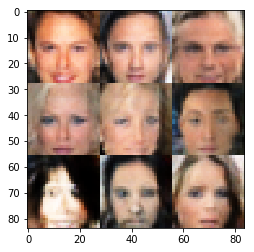

Epoch 3/10 - Batch 1210/3165 train_loss_d: 1.2401, train_loss_g: 0.7905
Epoch 3/10 - Batch 1220/3165 train_loss_d: 1.3599, train_loss_g: 0.6410
Epoch 3/10 - Batch 1230/3165 train_loss_d: 1.5081, train_loss_g: 0.5135
Epoch 3/10 - Batch 1240/3165 train_loss_d: 1.3463, train_loss_g: 0.6562
Epoch 3/10 - Batch 1250/3165 train_loss_d: 1.1706, train_loss_g: 1.1402
Epoch 3/10 - Batch 1260/3165 train_loss_d: 1.1323, train_loss_g: 1.0329
Epoch 3/10 - Batch 1270/3165 train_loss_d: 1.2013, train_loss_g: 0.9146
Epoch 3/10 - Batch 1280/3165 train_loss_d: 1.2832, train_loss_g: 0.6970
Epoch 3/10 - Batch 1290/3165 train_loss_d: 1.3683, train_loss_g: 0.5509
Epoch 3/10 - Batch 1300/3165 train_loss_d: 1.1472, train_loss_g: 0.9952
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_77/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_77/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_77/Maximum_2:0", shape=

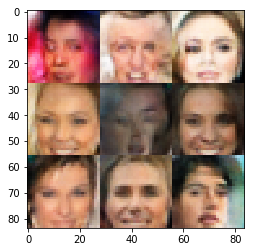

Epoch 3/10 - Batch 1310/3165 train_loss_d: 1.2746, train_loss_g: 0.7297
Epoch 3/10 - Batch 1320/3165 train_loss_d: 1.1927, train_loss_g: 0.9606
Epoch 3/10 - Batch 1330/3165 train_loss_d: 1.2425, train_loss_g: 0.8989
Epoch 3/10 - Batch 1340/3165 train_loss_d: 1.3107, train_loss_g: 0.7033
Epoch 3/10 - Batch 1350/3165 train_loss_d: 1.2807, train_loss_g: 0.7125
Epoch 3/10 - Batch 1360/3165 train_loss_d: 1.3013, train_loss_g: 0.9942
Epoch 3/10 - Batch 1370/3165 train_loss_d: 1.2488, train_loss_g: 0.7284
Epoch 3/10 - Batch 1380/3165 train_loss_d: 1.2194, train_loss_g: 1.0369
Epoch 3/10 - Batch 1390/3165 train_loss_d: 1.3431, train_loss_g: 0.7104
Epoch 3/10 - Batch 1400/3165 train_loss_d: 1.1747, train_loss_g: 0.7825
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_78/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_78/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_78/Maximum_2:0", shape=

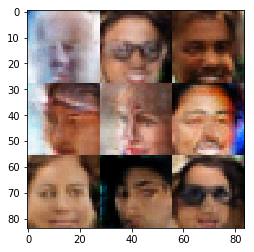

Epoch 3/10 - Batch 1410/3165 train_loss_d: 1.4477, train_loss_g: 0.5084
Epoch 3/10 - Batch 1420/3165 train_loss_d: 1.2879, train_loss_g: 0.6815
Epoch 3/10 - Batch 1430/3165 train_loss_d: 1.3231, train_loss_g: 0.8116
Epoch 3/10 - Batch 1440/3165 train_loss_d: 1.3226, train_loss_g: 0.7075
Epoch 3/10 - Batch 1450/3165 train_loss_d: 1.3189, train_loss_g: 0.6687
Epoch 3/10 - Batch 1460/3165 train_loss_d: 1.2007, train_loss_g: 0.8319
Epoch 3/10 - Batch 1470/3165 train_loss_d: 1.3035, train_loss_g: 0.6735
Epoch 3/10 - Batch 1480/3165 train_loss_d: 1.1906, train_loss_g: 0.8492
Epoch 3/10 - Batch 1490/3165 train_loss_d: 1.1785, train_loss_g: 0.9888
Epoch 3/10 - Batch 1500/3165 train_loss_d: 1.2876, train_loss_g: 0.7483
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_79/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_79/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_79/Maximum_2:0", shape=

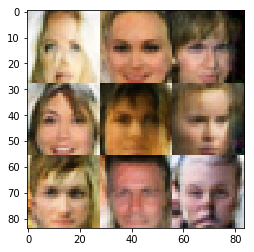

Epoch 3/10 - Batch 1510/3165 train_loss_d: 1.3367, train_loss_g: 0.5721
Epoch 3/10 - Batch 1520/3165 train_loss_d: 1.2505, train_loss_g: 0.7944
Epoch 3/10 - Batch 1530/3165 train_loss_d: 1.2647, train_loss_g: 0.8925
Epoch 3/10 - Batch 1540/3165 train_loss_d: 1.1757, train_loss_g: 0.8552
Epoch 3/10 - Batch 1550/3165 train_loss_d: 1.2825, train_loss_g: 0.6838
Epoch 3/10 - Batch 1560/3165 train_loss_d: 1.4331, train_loss_g: 1.2666
Epoch 3/10 - Batch 1570/3165 train_loss_d: 1.2356, train_loss_g: 0.7456
Epoch 3/10 - Batch 1580/3165 train_loss_d: 1.3047, train_loss_g: 0.7295
Epoch 3/10 - Batch 1590/3165 train_loss_d: 1.2239, train_loss_g: 0.7922
Epoch 3/10 - Batch 1600/3165 train_loss_d: 1.3528, train_loss_g: 0.6869
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_80/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_80/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_80/Maximum_2:0", shape=

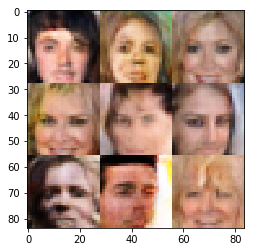

Epoch 3/10 - Batch 1610/3165 train_loss_d: 1.4635, train_loss_g: 0.5473
Epoch 3/10 - Batch 1620/3165 train_loss_d: 1.5169, train_loss_g: 0.4812
Epoch 3/10 - Batch 1630/3165 train_loss_d: 1.2144, train_loss_g: 0.8646
Epoch 3/10 - Batch 1640/3165 train_loss_d: 1.2442, train_loss_g: 1.0945
Epoch 3/10 - Batch 1650/3165 train_loss_d: 1.2776, train_loss_g: 1.0445
Epoch 3/10 - Batch 1660/3165 train_loss_d: 1.3068, train_loss_g: 0.8588
Epoch 3/10 - Batch 1670/3165 train_loss_d: 1.1571, train_loss_g: 1.0942
Epoch 3/10 - Batch 1680/3165 train_loss_d: 1.2400, train_loss_g: 1.0503
Epoch 3/10 - Batch 1690/3165 train_loss_d: 1.3667, train_loss_g: 0.6455
Epoch 3/10 - Batch 1700/3165 train_loss_d: 1.4028, train_loss_g: 0.6319
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_81/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_81/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_81/Maximum_2:0", shape=

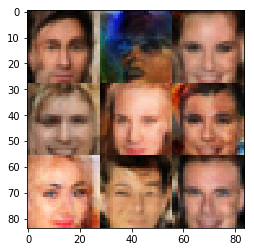

Epoch 3/10 - Batch 1710/3165 train_loss_d: 1.3251, train_loss_g: 0.6556
Epoch 3/10 - Batch 1720/3165 train_loss_d: 1.2248, train_loss_g: 0.8002
Epoch 3/10 - Batch 1730/3165 train_loss_d: 1.3922, train_loss_g: 0.5294
Epoch 3/10 - Batch 1740/3165 train_loss_d: 1.1452, train_loss_g: 0.8669
Epoch 3/10 - Batch 1750/3165 train_loss_d: 1.3278, train_loss_g: 0.6973
Epoch 3/10 - Batch 1760/3165 train_loss_d: 1.3272, train_loss_g: 0.7091
Epoch 3/10 - Batch 1770/3165 train_loss_d: 1.3056, train_loss_g: 0.8635
Epoch 3/10 - Batch 1780/3165 train_loss_d: 1.4775, train_loss_g: 0.5628
Epoch 3/10 - Batch 1790/3165 train_loss_d: 1.3299, train_loss_g: 0.7301
Epoch 3/10 - Batch 1800/3165 train_loss_d: 1.2267, train_loss_g: 0.8191
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_82/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_82/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_82/Maximum_2:0", shape=

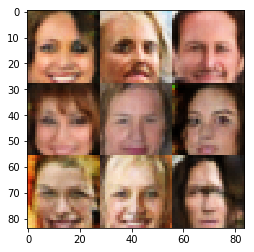

Epoch 3/10 - Batch 1810/3165 train_loss_d: 1.3747, train_loss_g: 0.8242
Epoch 3/10 - Batch 1820/3165 train_loss_d: 1.2586, train_loss_g: 0.9576
Epoch 3/10 - Batch 1830/3165 train_loss_d: 1.1931, train_loss_g: 0.7232
Epoch 3/10 - Batch 1840/3165 train_loss_d: 1.1783, train_loss_g: 0.9406
Epoch 3/10 - Batch 1850/3165 train_loss_d: 1.2516, train_loss_g: 0.8846
Epoch 3/10 - Batch 1860/3165 train_loss_d: 1.3809, train_loss_g: 0.7578
Epoch 3/10 - Batch 1870/3165 train_loss_d: 1.4147, train_loss_g: 1.0602
Epoch 3/10 - Batch 1880/3165 train_loss_d: 1.3395, train_loss_g: 0.7339
Epoch 3/10 - Batch 1890/3165 train_loss_d: 1.2817, train_loss_g: 0.8899
Epoch 3/10 - Batch 1900/3165 train_loss_d: 1.3442, train_loss_g: 0.7572
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_83/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_83/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_83/Maximum_2:0", shape=

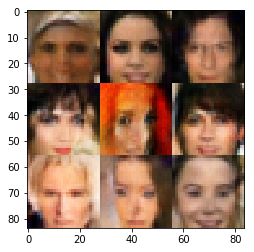

Epoch 3/10 - Batch 1910/3165 train_loss_d: 1.3233, train_loss_g: 0.6766
Epoch 3/10 - Batch 1920/3165 train_loss_d: 1.4228, train_loss_g: 0.6345
Epoch 3/10 - Batch 1930/3165 train_loss_d: 1.2277, train_loss_g: 0.7739
Epoch 3/10 - Batch 1940/3165 train_loss_d: 1.3228, train_loss_g: 0.7594
Epoch 3/10 - Batch 1950/3165 train_loss_d: 1.3389, train_loss_g: 1.2967
Epoch 3/10 - Batch 1960/3165 train_loss_d: 1.3287, train_loss_g: 0.7588
Epoch 3/10 - Batch 1970/3165 train_loss_d: 1.2919, train_loss_g: 0.7981
Epoch 3/10 - Batch 1980/3165 train_loss_d: 1.3109, train_loss_g: 1.0533
Epoch 3/10 - Batch 1990/3165 train_loss_d: 1.3983, train_loss_g: 0.7396
Epoch 3/10 - Batch 2000/3165 train_loss_d: 1.3067, train_loss_g: 0.6391
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_84/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_84/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_84/Maximum_2:0", shape=

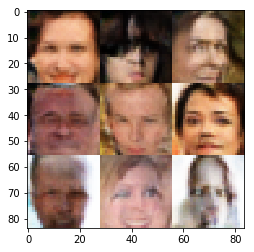

Epoch 3/10 - Batch 2010/3165 train_loss_d: 1.2801, train_loss_g: 0.6365
Epoch 3/10 - Batch 2020/3165 train_loss_d: 1.2892, train_loss_g: 0.7948
Epoch 3/10 - Batch 2030/3165 train_loss_d: 1.2078, train_loss_g: 0.8415
Epoch 3/10 - Batch 2040/3165 train_loss_d: 1.3094, train_loss_g: 0.8731
Epoch 3/10 - Batch 2050/3165 train_loss_d: 1.2537, train_loss_g: 0.7427
Epoch 3/10 - Batch 2060/3165 train_loss_d: 1.1890, train_loss_g: 1.1846
Epoch 3/10 - Batch 2070/3165 train_loss_d: 1.2698, train_loss_g: 0.6668
Epoch 3/10 - Batch 2080/3165 train_loss_d: 1.2762, train_loss_g: 0.8260
Epoch 3/10 - Batch 2090/3165 train_loss_d: 1.2738, train_loss_g: 0.8510
Epoch 3/10 - Batch 2100/3165 train_loss_d: 1.2908, train_loss_g: 0.7653
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_85/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_85/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_85/Maximum_2:0", shape=

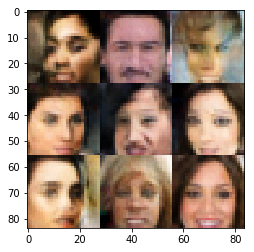

Epoch 3/10 - Batch 2110/3165 train_loss_d: 1.2532, train_loss_g: 0.8747
Epoch 3/10 - Batch 2120/3165 train_loss_d: 1.1494, train_loss_g: 1.1088
Epoch 3/10 - Batch 2130/3165 train_loss_d: 1.3976, train_loss_g: 0.8915
Epoch 3/10 - Batch 2140/3165 train_loss_d: 1.1375, train_loss_g: 1.4408
Epoch 3/10 - Batch 2150/3165 train_loss_d: 1.2122, train_loss_g: 0.6890
Epoch 3/10 - Batch 2160/3165 train_loss_d: 1.4772, train_loss_g: 0.4586
Epoch 3/10 - Batch 2170/3165 train_loss_d: 1.2511, train_loss_g: 0.6980
Epoch 3/10 - Batch 2180/3165 train_loss_d: 1.2888, train_loss_g: 0.7957
Epoch 3/10 - Batch 2190/3165 train_loss_d: 1.2447, train_loss_g: 0.9811
Epoch 3/10 - Batch 2200/3165 train_loss_d: 1.2651, train_loss_g: 0.8061
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_86/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_86/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_86/Maximum_2:0", shape=

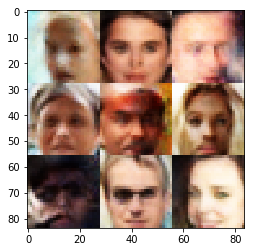

Epoch 3/10 - Batch 2210/3165 train_loss_d: 1.3807, train_loss_g: 0.9778
Epoch 3/10 - Batch 2220/3165 train_loss_d: 1.3698, train_loss_g: 0.8866
Epoch 3/10 - Batch 2230/3165 train_loss_d: 1.3317, train_loss_g: 0.7307
Epoch 3/10 - Batch 2240/3165 train_loss_d: 1.2841, train_loss_g: 0.9071
Epoch 3/10 - Batch 2250/3165 train_loss_d: 1.3293, train_loss_g: 0.6930
Epoch 3/10 - Batch 2260/3165 train_loss_d: 1.1994, train_loss_g: 1.0975
Epoch 3/10 - Batch 2270/3165 train_loss_d: 1.3766, train_loss_g: 0.8429
Epoch 3/10 - Batch 2280/3165 train_loss_d: 1.2022, train_loss_g: 0.8296
Epoch 3/10 - Batch 2290/3165 train_loss_d: 1.3213, train_loss_g: 0.8199
Epoch 3/10 - Batch 2300/3165 train_loss_d: 1.3812, train_loss_g: 0.5787
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_87/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_87/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_87/Maximum_2:0", shape=

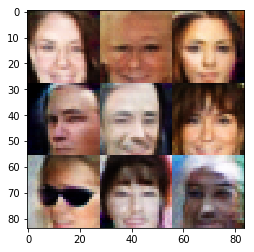

Epoch 3/10 - Batch 2310/3165 train_loss_d: 1.2983, train_loss_g: 0.7106
Epoch 3/10 - Batch 2320/3165 train_loss_d: 1.3820, train_loss_g: 0.7080
Epoch 3/10 - Batch 2330/3165 train_loss_d: 1.3546, train_loss_g: 1.1145
Epoch 3/10 - Batch 2340/3165 train_loss_d: 1.3974, train_loss_g: 0.6755
Epoch 3/10 - Batch 2350/3165 train_loss_d: 1.3804, train_loss_g: 1.2763
Epoch 3/10 - Batch 2360/3165 train_loss_d: 1.3869, train_loss_g: 0.7679
Epoch 3/10 - Batch 2370/3165 train_loss_d: 1.2352, train_loss_g: 1.1761
Epoch 3/10 - Batch 2380/3165 train_loss_d: 1.2062, train_loss_g: 0.8613
Epoch 3/10 - Batch 2390/3165 train_loss_d: 1.2945, train_loss_g: 0.6197
Epoch 3/10 - Batch 2400/3165 train_loss_d: 1.2160, train_loss_g: 0.9772
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_88/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_88/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_88/Maximum_2:0", shape=

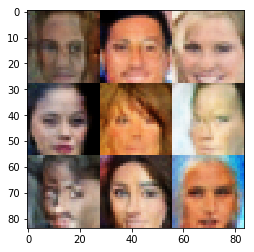

Epoch 3/10 - Batch 2410/3165 train_loss_d: 1.3468, train_loss_g: 1.1241
Epoch 3/10 - Batch 2420/3165 train_loss_d: 1.2148, train_loss_g: 0.7720
Epoch 3/10 - Batch 2430/3165 train_loss_d: 1.2167, train_loss_g: 0.8253
Epoch 3/10 - Batch 2440/3165 train_loss_d: 1.4101, train_loss_g: 0.7000
Epoch 3/10 - Batch 2450/3165 train_loss_d: 1.2375, train_loss_g: 0.8591
Epoch 3/10 - Batch 2460/3165 train_loss_d: 1.2239, train_loss_g: 0.8648
Epoch 3/10 - Batch 2470/3165 train_loss_d: 1.2662, train_loss_g: 0.8608
Epoch 3/10 - Batch 2480/3165 train_loss_d: 1.1694, train_loss_g: 1.0071
Epoch 3/10 - Batch 2490/3165 train_loss_d: 1.3109, train_loss_g: 0.9166
Epoch 3/10 - Batch 2500/3165 train_loss_d: 1.2614, train_loss_g: 1.1410
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_89/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_89/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_89/Maximum_2:0", shape=

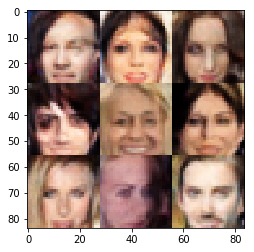

Epoch 3/10 - Batch 2510/3165 train_loss_d: 1.3138, train_loss_g: 0.7728
Epoch 3/10 - Batch 2520/3165 train_loss_d: 1.4210, train_loss_g: 0.6604
Epoch 3/10 - Batch 2530/3165 train_loss_d: 1.2021, train_loss_g: 0.8335
Epoch 3/10 - Batch 2540/3165 train_loss_d: 1.3617, train_loss_g: 0.6173
Epoch 3/10 - Batch 2550/3165 train_loss_d: 1.2419, train_loss_g: 0.8817
Epoch 3/10 - Batch 2560/3165 train_loss_d: 1.2904, train_loss_g: 1.0453
Epoch 3/10 - Batch 2570/3165 train_loss_d: 1.3471, train_loss_g: 0.6372
Epoch 3/10 - Batch 2580/3165 train_loss_d: 1.2616, train_loss_g: 0.8494
Epoch 3/10 - Batch 2590/3165 train_loss_d: 1.2989, train_loss_g: 0.8601
Epoch 3/10 - Batch 2600/3165 train_loss_d: 1.2937, train_loss_g: 0.7496
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_90/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_90/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_90/Maximum_2:0", shape=

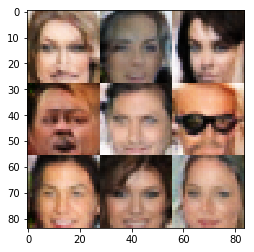

Epoch 3/10 - Batch 2610/3165 train_loss_d: 1.2022, train_loss_g: 0.8632
Epoch 3/10 - Batch 2620/3165 train_loss_d: 1.1865, train_loss_g: 0.8577
Epoch 3/10 - Batch 2630/3165 train_loss_d: 1.4629, train_loss_g: 0.6143
Epoch 3/10 - Batch 2640/3165 train_loss_d: 1.1770, train_loss_g: 0.8951
Epoch 3/10 - Batch 2650/3165 train_loss_d: 1.2429, train_loss_g: 0.8863
Epoch 3/10 - Batch 2660/3165 train_loss_d: 1.2438, train_loss_g: 0.6795
Epoch 3/10 - Batch 2670/3165 train_loss_d: 1.2038, train_loss_g: 0.8691
Epoch 3/10 - Batch 2680/3165 train_loss_d: 1.2803, train_loss_g: 0.7307
Epoch 3/10 - Batch 2690/3165 train_loss_d: 1.2875, train_loss_g: 0.7258
Epoch 3/10 - Batch 2700/3165 train_loss_d: 1.1732, train_loss_g: 0.8729
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_91/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_91/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_91/Maximum_2:0", shape=

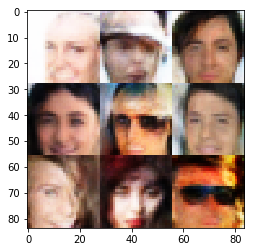

Epoch 3/10 - Batch 2710/3165 train_loss_d: 1.1703, train_loss_g: 0.9129
Epoch 3/10 - Batch 2720/3165 train_loss_d: 1.4031, train_loss_g: 0.6639
Epoch 3/10 - Batch 2730/3165 train_loss_d: 1.2098, train_loss_g: 0.8671
Epoch 3/10 - Batch 2740/3165 train_loss_d: 1.1419, train_loss_g: 0.9495
Epoch 3/10 - Batch 2750/3165 train_loss_d: 1.1948, train_loss_g: 0.8295
Epoch 3/10 - Batch 2760/3165 train_loss_d: 1.2725, train_loss_g: 0.7630
Epoch 3/10 - Batch 2770/3165 train_loss_d: 1.4115, train_loss_g: 0.5896
Epoch 3/10 - Batch 2780/3165 train_loss_d: 1.2947, train_loss_g: 0.6560
Epoch 3/10 - Batch 2790/3165 train_loss_d: 1.2918, train_loss_g: 0.7905
Epoch 3/10 - Batch 2800/3165 train_loss_d: 1.3508, train_loss_g: 1.0729
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_92/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_92/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_92/Maximum_2:0", shape=

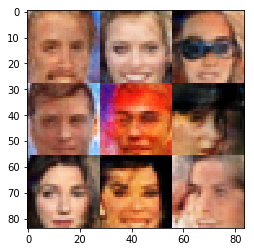

Epoch 3/10 - Batch 2810/3165 train_loss_d: 1.4485, train_loss_g: 0.5674
Epoch 3/10 - Batch 2820/3165 train_loss_d: 1.3586, train_loss_g: 0.5780
Epoch 3/10 - Batch 2830/3165 train_loss_d: 1.1614, train_loss_g: 1.0978
Epoch 3/10 - Batch 2840/3165 train_loss_d: 1.3280, train_loss_g: 0.6126
Epoch 3/10 - Batch 2850/3165 train_loss_d: 1.3362, train_loss_g: 0.6268
Epoch 3/10 - Batch 2860/3165 train_loss_d: 1.2641, train_loss_g: 0.7193
Epoch 3/10 - Batch 2870/3165 train_loss_d: 1.3067, train_loss_g: 0.8066
Epoch 3/10 - Batch 2880/3165 train_loss_d: 1.2911, train_loss_g: 0.6950
Epoch 3/10 - Batch 2890/3165 train_loss_d: 1.3099, train_loss_g: 0.8527
Epoch 3/10 - Batch 2900/3165 train_loss_d: 1.3075, train_loss_g: 0.6944
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_93/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_93/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_93/Maximum_2:0", shape=

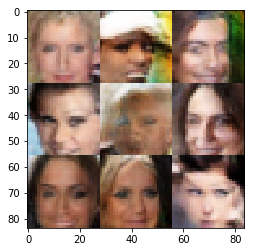

Epoch 3/10 - Batch 2910/3165 train_loss_d: 1.3501, train_loss_g: 0.7483
Epoch 3/10 - Batch 2920/3165 train_loss_d: 1.1913, train_loss_g: 0.8060
Epoch 3/10 - Batch 2930/3165 train_loss_d: 1.1714, train_loss_g: 0.9751
Epoch 3/10 - Batch 2940/3165 train_loss_d: 1.3533, train_loss_g: 0.6785
Epoch 3/10 - Batch 2950/3165 train_loss_d: 1.2334, train_loss_g: 1.0625
Epoch 3/10 - Batch 2960/3165 train_loss_d: 1.3527, train_loss_g: 0.7239
Epoch 3/10 - Batch 2970/3165 train_loss_d: 1.2697, train_loss_g: 1.1894
Epoch 3/10 - Batch 2980/3165 train_loss_d: 1.2312, train_loss_g: 0.9177
Epoch 3/10 - Batch 2990/3165 train_loss_d: 1.3852, train_loss_g: 0.5406
Epoch 3/10 - Batch 3000/3165 train_loss_d: 1.1872, train_loss_g: 0.7938
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_94/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_94/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_94/Maximum_2:0", shape=

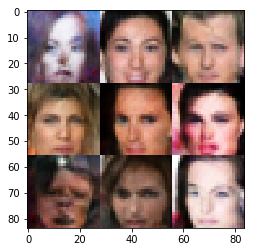

Epoch 3/10 - Batch 3010/3165 train_loss_d: 1.2192, train_loss_g: 0.6969
Epoch 3/10 - Batch 3020/3165 train_loss_d: 1.2520, train_loss_g: 0.8608
Epoch 3/10 - Batch 3030/3165 train_loss_d: 1.2495, train_loss_g: 0.7678
Epoch 3/10 - Batch 3040/3165 train_loss_d: 1.2572, train_loss_g: 0.7745
Epoch 3/10 - Batch 3050/3165 train_loss_d: 1.2780, train_loss_g: 0.8722
Epoch 3/10 - Batch 3060/3165 train_loss_d: 1.2907, train_loss_g: 1.0740
Epoch 3/10 - Batch 3070/3165 train_loss_d: 1.4585, train_loss_g: 0.6408
Epoch 3/10 - Batch 3080/3165 train_loss_d: 1.3193, train_loss_g: 0.6820
Epoch 3/10 - Batch 3090/3165 train_loss_d: 1.3918, train_loss_g: 0.5892
Epoch 3/10 - Batch 3100/3165 train_loss_d: 1.2982, train_loss_g: 0.8097
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_95/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_95/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_95/Maximum_2:0", shape=

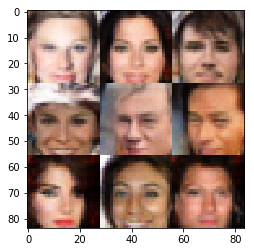

Epoch 3/10 - Batch 3110/3165 train_loss_d: 1.4463, train_loss_g: 0.4964
Epoch 3/10 - Batch 3120/3165 train_loss_d: 1.1335, train_loss_g: 0.9821
Epoch 3/10 - Batch 3130/3165 train_loss_d: 1.2982, train_loss_g: 0.7271
Epoch 3/10 - Batch 3140/3165 train_loss_d: 1.2580, train_loss_g: 0.9326
Epoch 3/10 - Batch 3150/3165 train_loss_d: 1.2978, train_loss_g: 0.9469
Epoch 3/10 - Batch 3160/3165 train_loss_d: 1.3348, train_loss_g: 1.1315
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_96/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_96/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_96/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_96/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


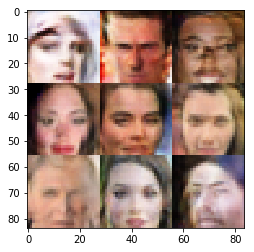


 30%|███       | 3/10 [2:13:16<5:16:06, 2709.55s/it]

Epoch 4/10 - Batch 10/3165 train_loss_d: 1.2066, train_loss_g: 1.0386
Epoch 4/10 - Batch 20/3165 train_loss_d: 1.1882, train_loss_g: 1.0577
Epoch 4/10 - Batch 30/3165 train_loss_d: 1.3367, train_loss_g: 0.5750
Epoch 4/10 - Batch 40/3165 train_loss_d: 1.2457, train_loss_g: 0.9070
Epoch 4/10 - Batch 50/3165 train_loss_d: 1.1367, train_loss_g: 0.8281
Epoch 4/10 - Batch 60/3165 train_loss_d: 1.5362, train_loss_g: 0.7671
Epoch 4/10 - Batch 70/3165 train_loss_d: 1.2300, train_loss_g: 0.7830
Epoch 4/10 - Batch 80/3165 train_loss_d: 1.2786, train_loss_g: 0.7056
Epoch 4/10 - Batch 90/3165 train_loss_d: 1.2983, train_loss_g: 0.7528
Epoch 4/10 - Batch 100/3165 train_loss_d: 1.2064, train_loss_g: 0.7834
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_97/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_97/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_97/Maximum_2:0", shape=(?, 28, 28, 128), d

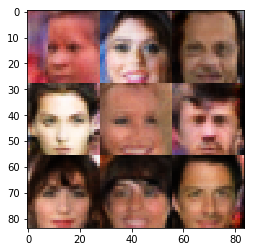

Epoch 4/10 - Batch 110/3165 train_loss_d: 1.4926, train_loss_g: 0.4908
Epoch 4/10 - Batch 120/3165 train_loss_d: 1.2462, train_loss_g: 1.2702
Epoch 4/10 - Batch 130/3165 train_loss_d: 1.2736, train_loss_g: 0.7691
Epoch 4/10 - Batch 140/3165 train_loss_d: 1.2906, train_loss_g: 0.6853
Epoch 4/10 - Batch 150/3165 train_loss_d: 1.2163, train_loss_g: 0.7990
Epoch 4/10 - Batch 160/3165 train_loss_d: 1.3385, train_loss_g: 0.7264
Epoch 4/10 - Batch 170/3165 train_loss_d: 1.2570, train_loss_g: 0.9292
Epoch 4/10 - Batch 180/3165 train_loss_d: 1.2461, train_loss_g: 0.7253
Epoch 4/10 - Batch 190/3165 train_loss_d: 1.2334, train_loss_g: 0.7778
Epoch 4/10 - Batch 200/3165 train_loss_d: 1.7331, train_loss_g: 0.3184
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_98/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_98/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_98/Maximum_2:0", shape=(?, 28, 28

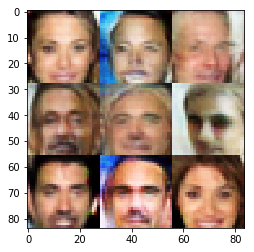

Epoch 4/10 - Batch 210/3165 train_loss_d: 1.0974, train_loss_g: 0.7724
Epoch 4/10 - Batch 220/3165 train_loss_d: 1.3498, train_loss_g: 0.7131
Epoch 4/10 - Batch 230/3165 train_loss_d: 1.1328, train_loss_g: 0.9821
Epoch 4/10 - Batch 240/3165 train_loss_d: 1.2402, train_loss_g: 1.1441
Epoch 4/10 - Batch 250/3165 train_loss_d: 1.2118, train_loss_g: 0.8296
Epoch 4/10 - Batch 260/3165 train_loss_d: 1.4457, train_loss_g: 0.4982
Epoch 4/10 - Batch 270/3165 train_loss_d: 1.2303, train_loss_g: 0.8664
Epoch 4/10 - Batch 280/3165 train_loss_d: 1.3875, train_loss_g: 0.8767
Epoch 4/10 - Batch 290/3165 train_loss_d: 1.2668, train_loss_g: 0.8429
Epoch 4/10 - Batch 300/3165 train_loss_d: 1.3669, train_loss_g: 0.7503
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_99/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_99/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_99/Maximum_2:0", shape=(?, 28, 28

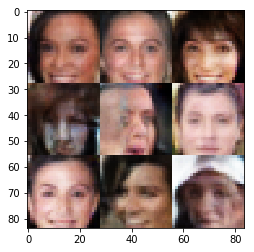

Epoch 4/10 - Batch 310/3165 train_loss_d: 1.2186, train_loss_g: 0.8869
Epoch 4/10 - Batch 320/3165 train_loss_d: 1.1832, train_loss_g: 0.8316
Epoch 4/10 - Batch 330/3165 train_loss_d: 1.3447, train_loss_g: 0.9641
Epoch 4/10 - Batch 340/3165 train_loss_d: 1.2083, train_loss_g: 0.8730
Epoch 4/10 - Batch 350/3165 train_loss_d: 1.1076, train_loss_g: 0.8995
Epoch 4/10 - Batch 360/3165 train_loss_d: 1.2186, train_loss_g: 0.9177
Epoch 4/10 - Batch 370/3165 train_loss_d: 1.5095, train_loss_g: 0.4751
Epoch 4/10 - Batch 380/3165 train_loss_d: 1.1295, train_loss_g: 1.1209
Epoch 4/10 - Batch 390/3165 train_loss_d: 1.3203, train_loss_g: 0.9602
Epoch 4/10 - Batch 400/3165 train_loss_d: 1.3092, train_loss_g: 0.7473
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_100/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_100/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_100/Maximum_2:0", shape=(?, 28,

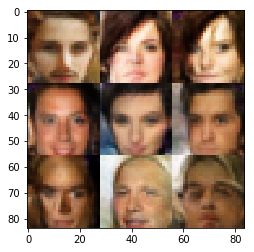

Epoch 4/10 - Batch 410/3165 train_loss_d: 1.2195, train_loss_g: 0.9183
Epoch 4/10 - Batch 420/3165 train_loss_d: 1.3695, train_loss_g: 0.5474
Epoch 4/10 - Batch 430/3165 train_loss_d: 1.3747, train_loss_g: 0.5598
Epoch 4/10 - Batch 440/3165 train_loss_d: 1.1812, train_loss_g: 0.8080
Epoch 4/10 - Batch 450/3165 train_loss_d: 1.2672, train_loss_g: 0.8224
Epoch 4/10 - Batch 460/3165 train_loss_d: 1.1678, train_loss_g: 0.9777
Epoch 4/10 - Batch 470/3165 train_loss_d: 1.2378, train_loss_g: 0.9583
Epoch 4/10 - Batch 480/3165 train_loss_d: 1.3977, train_loss_g: 1.0596
Epoch 4/10 - Batch 490/3165 train_loss_d: 1.2320, train_loss_g: 0.9303
Epoch 4/10 - Batch 500/3165 train_loss_d: 1.2668, train_loss_g: 0.7378
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_101/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_101/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_101/Maximum_2:0", shape=(?, 28,

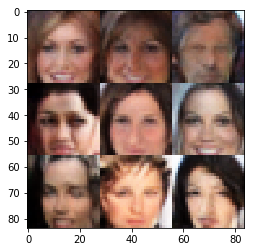

Epoch 4/10 - Batch 510/3165 train_loss_d: 1.3431, train_loss_g: 0.6806
Epoch 4/10 - Batch 520/3165 train_loss_d: 1.4361, train_loss_g: 0.6523
Epoch 4/10 - Batch 530/3165 train_loss_d: 1.3040, train_loss_g: 0.7214
Epoch 4/10 - Batch 540/3165 train_loss_d: 1.3668, train_loss_g: 0.5822
Epoch 4/10 - Batch 550/3165 train_loss_d: 1.3966, train_loss_g: 0.5246
Epoch 4/10 - Batch 560/3165 train_loss_d: 1.3692, train_loss_g: 0.7279
Epoch 4/10 - Batch 570/3165 train_loss_d: 1.2129, train_loss_g: 0.8047
Epoch 4/10 - Batch 580/3165 train_loss_d: 1.1963, train_loss_g: 0.7835
Epoch 4/10 - Batch 590/3165 train_loss_d: 1.2617, train_loss_g: 0.9052
Epoch 4/10 - Batch 600/3165 train_loss_d: 1.3062, train_loss_g: 0.6881
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_102/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_102/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_102/Maximum_2:0", shape=(?, 28,

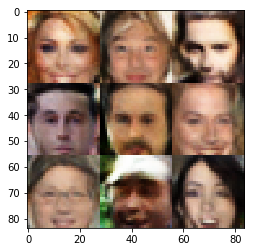

Epoch 4/10 - Batch 610/3165 train_loss_d: 1.3227, train_loss_g: 0.9203
Epoch 4/10 - Batch 620/3165 train_loss_d: 1.3507, train_loss_g: 0.6446
Epoch 4/10 - Batch 630/3165 train_loss_d: 1.2907, train_loss_g: 0.7523
Epoch 4/10 - Batch 640/3165 train_loss_d: 1.3158, train_loss_g: 0.9528
Epoch 4/10 - Batch 650/3165 train_loss_d: 1.2241, train_loss_g: 0.8354
Epoch 4/10 - Batch 660/3165 train_loss_d: 1.2282, train_loss_g: 0.7979
Epoch 4/10 - Batch 670/3165 train_loss_d: 1.3187, train_loss_g: 0.7144
Epoch 4/10 - Batch 680/3165 train_loss_d: 1.1102, train_loss_g: 0.9716
Epoch 4/10 - Batch 690/3165 train_loss_d: 1.2271, train_loss_g: 0.9118
Epoch 4/10 - Batch 700/3165 train_loss_d: 1.2734, train_loss_g: 0.6909
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_103/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_103/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_103/Maximum_2:0", shape=(?, 28,

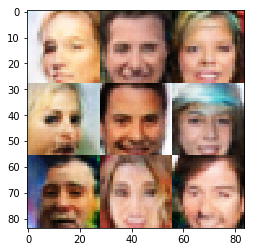

Epoch 4/10 - Batch 710/3165 train_loss_d: 1.1954, train_loss_g: 0.9540
Epoch 4/10 - Batch 720/3165 train_loss_d: 1.1133, train_loss_g: 0.8462
Epoch 4/10 - Batch 730/3165 train_loss_d: 1.3858, train_loss_g: 0.9097
Epoch 4/10 - Batch 740/3165 train_loss_d: 1.2804, train_loss_g: 1.0409
Epoch 4/10 - Batch 750/3165 train_loss_d: 1.4092, train_loss_g: 0.6311
Epoch 4/10 - Batch 760/3165 train_loss_d: 1.2233, train_loss_g: 0.7457
Epoch 4/10 - Batch 770/3165 train_loss_d: 1.1945, train_loss_g: 1.0127
Epoch 4/10 - Batch 780/3165 train_loss_d: 1.2291, train_loss_g: 0.8919
Epoch 4/10 - Batch 790/3165 train_loss_d: 1.2834, train_loss_g: 0.9266
Epoch 4/10 - Batch 800/3165 train_loss_d: 1.2375, train_loss_g: 0.8026
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_104/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_104/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_104/Maximum_2:0", shape=(?, 28,

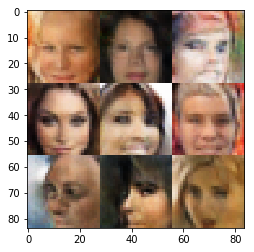

Epoch 4/10 - Batch 810/3165 train_loss_d: 1.2991, train_loss_g: 0.9151
Epoch 4/10 - Batch 820/3165 train_loss_d: 1.3329, train_loss_g: 0.6629
Epoch 4/10 - Batch 830/3165 train_loss_d: 1.1966, train_loss_g: 0.8155
Epoch 4/10 - Batch 840/3165 train_loss_d: 1.1950, train_loss_g: 0.7578
Epoch 4/10 - Batch 850/3165 train_loss_d: 1.3702, train_loss_g: 0.5915
Epoch 4/10 - Batch 860/3165 train_loss_d: 1.2268, train_loss_g: 0.8282
Epoch 4/10 - Batch 870/3165 train_loss_d: 1.2529, train_loss_g: 0.8859
Epoch 4/10 - Batch 880/3165 train_loss_d: 1.1433, train_loss_g: 0.8354
Epoch 4/10 - Batch 890/3165 train_loss_d: 1.2558, train_loss_g: 0.8933
Epoch 4/10 - Batch 900/3165 train_loss_d: 1.4701, train_loss_g: 0.5616
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_105/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_105/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_105/Maximum_2:0", shape=(?, 28,

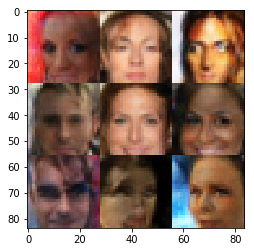

Epoch 4/10 - Batch 910/3165 train_loss_d: 1.3063, train_loss_g: 0.8106
Epoch 4/10 - Batch 920/3165 train_loss_d: 1.2175, train_loss_g: 0.7085
Epoch 4/10 - Batch 930/3165 train_loss_d: 1.1571, train_loss_g: 0.7952
Epoch 4/10 - Batch 940/3165 train_loss_d: 1.2315, train_loss_g: 0.7900
Epoch 4/10 - Batch 950/3165 train_loss_d: 1.2475, train_loss_g: 0.8563
Epoch 4/10 - Batch 960/3165 train_loss_d: 1.1918, train_loss_g: 0.9900
Epoch 4/10 - Batch 970/3165 train_loss_d: 1.2939, train_loss_g: 0.6370
Epoch 4/10 - Batch 980/3165 train_loss_d: 1.2613, train_loss_g: 0.8476
Epoch 4/10 - Batch 990/3165 train_loss_d: 1.3041, train_loss_g: 0.7448
Epoch 4/10 - Batch 1000/3165 train_loss_d: 1.3335, train_loss_g: 0.7033
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_106/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_106/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_106/Maximum_2:0", shape=(?, 28

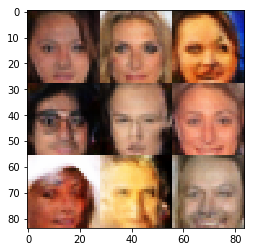

Epoch 4/10 - Batch 1010/3165 train_loss_d: 1.3132, train_loss_g: 0.7865
Epoch 4/10 - Batch 1020/3165 train_loss_d: 1.3772, train_loss_g: 0.5455
Epoch 4/10 - Batch 1030/3165 train_loss_d: 1.4737, train_loss_g: 0.5347
Epoch 4/10 - Batch 1040/3165 train_loss_d: 1.2738, train_loss_g: 0.7794
Epoch 4/10 - Batch 1050/3165 train_loss_d: 1.2994, train_loss_g: 1.0789
Epoch 4/10 - Batch 1060/3165 train_loss_d: 1.1503, train_loss_g: 0.8363
Epoch 4/10 - Batch 1070/3165 train_loss_d: 1.2450, train_loss_g: 0.9435
Epoch 4/10 - Batch 1080/3165 train_loss_d: 1.2431, train_loss_g: 1.0190
Epoch 4/10 - Batch 1090/3165 train_loss_d: 1.2424, train_loss_g: 0.6520
Epoch 4/10 - Batch 1100/3165 train_loss_d: 1.0834, train_loss_g: 0.9690
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_107/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_107/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_107/Maximum_2:0", sha

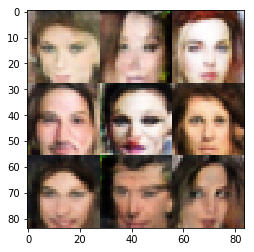

Epoch 4/10 - Batch 1110/3165 train_loss_d: 1.3057, train_loss_g: 0.9195
Epoch 4/10 - Batch 1120/3165 train_loss_d: 1.0916, train_loss_g: 0.9472
Epoch 4/10 - Batch 1130/3165 train_loss_d: 1.1643, train_loss_g: 0.9615
Epoch 4/10 - Batch 1140/3165 train_loss_d: 1.1875, train_loss_g: 1.0341
Epoch 4/10 - Batch 1150/3165 train_loss_d: 1.2576, train_loss_g: 0.7532
Epoch 4/10 - Batch 1160/3165 train_loss_d: 1.2750, train_loss_g: 1.1246
Epoch 4/10 - Batch 1170/3165 train_loss_d: 1.3493, train_loss_g: 0.6430
Epoch 4/10 - Batch 1180/3165 train_loss_d: 1.2928, train_loss_g: 0.7361
Epoch 4/10 - Batch 1190/3165 train_loss_d: 1.1932, train_loss_g: 1.0346
Epoch 4/10 - Batch 1200/3165 train_loss_d: 1.3590, train_loss_g: 0.6713
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_108/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_108/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_108/Maximum_2:0", sha

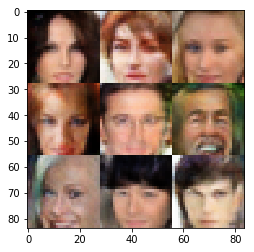

Epoch 4/10 - Batch 1210/3165 train_loss_d: 1.3399, train_loss_g: 1.0221
Epoch 4/10 - Batch 1220/3165 train_loss_d: 1.1291, train_loss_g: 0.9298
Epoch 4/10 - Batch 1230/3165 train_loss_d: 1.3852, train_loss_g: 0.5426
Epoch 4/10 - Batch 1240/3165 train_loss_d: 1.3179, train_loss_g: 0.7046
Epoch 4/10 - Batch 1250/3165 train_loss_d: 1.2245, train_loss_g: 0.9091
Epoch 4/10 - Batch 1260/3165 train_loss_d: 1.3428, train_loss_g: 0.5620
Epoch 4/10 - Batch 1270/3165 train_loss_d: 1.2838, train_loss_g: 0.8124
Epoch 4/10 - Batch 1280/3165 train_loss_d: 1.5109, train_loss_g: 0.5191
Epoch 4/10 - Batch 1290/3165 train_loss_d: 1.2989, train_loss_g: 0.9514
Epoch 4/10 - Batch 1300/3165 train_loss_d: 1.1095, train_loss_g: 0.8270
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_109/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_109/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_109/Maximum_2:0", sha

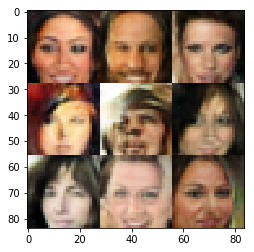

Epoch 4/10 - Batch 1310/3165 train_loss_d: 1.2959, train_loss_g: 0.8095
Epoch 4/10 - Batch 1320/3165 train_loss_d: 1.2523, train_loss_g: 1.0179
Epoch 4/10 - Batch 1330/3165 train_loss_d: 1.3433, train_loss_g: 0.7502
Epoch 4/10 - Batch 1340/3165 train_loss_d: 1.1932, train_loss_g: 1.0902
Epoch 4/10 - Batch 1350/3165 train_loss_d: 1.5682, train_loss_g: 0.3811
Epoch 4/10 - Batch 1360/3165 train_loss_d: 1.0886, train_loss_g: 1.2615
Epoch 4/10 - Batch 1370/3165 train_loss_d: 1.2945, train_loss_g: 0.5836
Epoch 4/10 - Batch 1380/3165 train_loss_d: 1.3125, train_loss_g: 0.7644
Epoch 4/10 - Batch 1390/3165 train_loss_d: 1.3132, train_loss_g: 0.6481
Epoch 4/10 - Batch 1400/3165 train_loss_d: 1.2743, train_loss_g: 0.6669
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_110/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_110/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_110/Maximum_2:0", sha

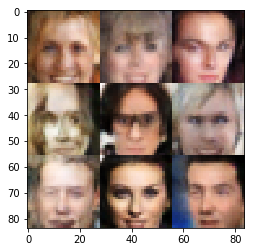

Epoch 4/10 - Batch 1410/3165 train_loss_d: 1.2264, train_loss_g: 0.7487
Epoch 4/10 - Batch 1420/3165 train_loss_d: 1.1183, train_loss_g: 0.9173
Epoch 4/10 - Batch 1430/3165 train_loss_d: 1.3851, train_loss_g: 0.6718
Epoch 4/10 - Batch 1440/3165 train_loss_d: 1.3871, train_loss_g: 0.5159
Epoch 4/10 - Batch 1450/3165 train_loss_d: 1.3434, train_loss_g: 0.6498
Epoch 4/10 - Batch 1460/3165 train_loss_d: 1.3911, train_loss_g: 0.5553
Epoch 4/10 - Batch 1470/3165 train_loss_d: 1.4025, train_loss_g: 0.5633
Epoch 4/10 - Batch 1480/3165 train_loss_d: 1.2303, train_loss_g: 0.9480
Epoch 4/10 - Batch 1490/3165 train_loss_d: 1.0235, train_loss_g: 1.1243
Epoch 4/10 - Batch 1500/3165 train_loss_d: 1.1367, train_loss_g: 0.7813
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_111/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_111/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_111/Maximum_2:0", sha

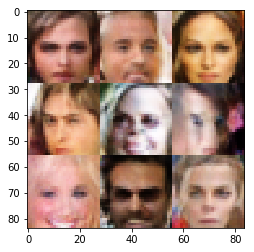

Epoch 4/10 - Batch 1510/3165 train_loss_d: 1.3312, train_loss_g: 0.6403
Epoch 4/10 - Batch 1520/3165 train_loss_d: 1.3470, train_loss_g: 0.5918
Epoch 4/10 - Batch 1530/3165 train_loss_d: 1.2547, train_loss_g: 1.0830
Epoch 4/10 - Batch 1540/3165 train_loss_d: 1.1065, train_loss_g: 1.0455
Epoch 4/10 - Batch 1550/3165 train_loss_d: 1.3437, train_loss_g: 0.6491
Epoch 4/10 - Batch 1560/3165 train_loss_d: 1.3536, train_loss_g: 0.7236
Epoch 4/10 - Batch 1570/3165 train_loss_d: 1.2916, train_loss_g: 0.6169
Epoch 4/10 - Batch 1580/3165 train_loss_d: 1.0607, train_loss_g: 1.0471
Epoch 4/10 - Batch 1590/3165 train_loss_d: 1.4273, train_loss_g: 0.6443
Epoch 4/10 - Batch 1600/3165 train_loss_d: 1.1104, train_loss_g: 0.8990
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_112/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_112/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_112/Maximum_2:0", sha

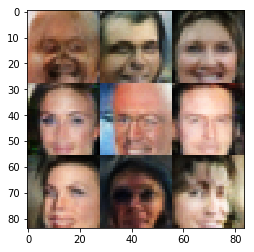

Epoch 4/10 - Batch 1610/3165 train_loss_d: 1.2396, train_loss_g: 0.7861
Epoch 4/10 - Batch 1620/3165 train_loss_d: 1.2075, train_loss_g: 0.8138
Epoch 4/10 - Batch 1630/3165 train_loss_d: 1.3137, train_loss_g: 0.9051
Epoch 4/10 - Batch 1640/3165 train_loss_d: 1.2584, train_loss_g: 0.7297
Epoch 4/10 - Batch 1650/3165 train_loss_d: 1.3088, train_loss_g: 1.0025
Epoch 4/10 - Batch 1660/3165 train_loss_d: 1.2264, train_loss_g: 0.7110
Epoch 4/10 - Batch 1670/3165 train_loss_d: 1.1631, train_loss_g: 0.8843
Epoch 4/10 - Batch 1680/3165 train_loss_d: 1.2207, train_loss_g: 1.0868
Epoch 4/10 - Batch 1690/3165 train_loss_d: 1.2392, train_loss_g: 0.8410
Epoch 4/10 - Batch 1700/3165 train_loss_d: 1.3077, train_loss_g: 0.9837
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_113/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_113/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_113/Maximum_2:0", sha

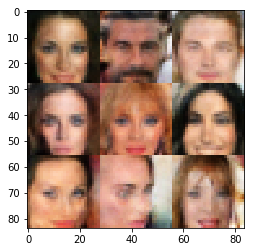

Epoch 4/10 - Batch 1710/3165 train_loss_d: 1.3034, train_loss_g: 0.6375
Epoch 4/10 - Batch 1720/3165 train_loss_d: 1.2494, train_loss_g: 0.8770
Epoch 4/10 - Batch 1730/3165 train_loss_d: 1.2567, train_loss_g: 1.0533
Epoch 4/10 - Batch 1740/3165 train_loss_d: 1.0981, train_loss_g: 1.5735
Epoch 4/10 - Batch 1750/3165 train_loss_d: 1.3390, train_loss_g: 0.6524
Epoch 4/10 - Batch 1760/3165 train_loss_d: 1.2302, train_loss_g: 0.8362
Epoch 4/10 - Batch 1770/3165 train_loss_d: 1.2161, train_loss_g: 1.0136
Epoch 4/10 - Batch 1780/3165 train_loss_d: 1.4113, train_loss_g: 0.5789
Epoch 4/10 - Batch 1790/3165 train_loss_d: 1.4602, train_loss_g: 0.5176
Epoch 4/10 - Batch 1800/3165 train_loss_d: 1.2152, train_loss_g: 1.1366
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_114/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_114/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_114/Maximum_2:0", sha

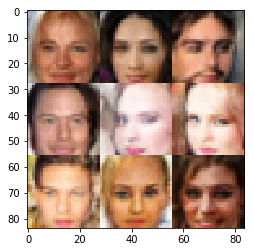

Epoch 4/10 - Batch 1810/3165 train_loss_d: 1.1029, train_loss_g: 0.9122
Epoch 4/10 - Batch 1820/3165 train_loss_d: 1.1658, train_loss_g: 0.7733
Epoch 4/10 - Batch 1830/3165 train_loss_d: 1.1283, train_loss_g: 0.9052
Epoch 4/10 - Batch 1840/3165 train_loss_d: 0.9564, train_loss_g: 1.3435
Epoch 4/10 - Batch 1850/3165 train_loss_d: 1.3361, train_loss_g: 0.6392
Epoch 4/10 - Batch 1860/3165 train_loss_d: 1.3408, train_loss_g: 0.8398
Epoch 4/10 - Batch 1870/3165 train_loss_d: 1.1338, train_loss_g: 0.8378
Epoch 4/10 - Batch 1880/3165 train_loss_d: 1.3639, train_loss_g: 0.5461
Epoch 4/10 - Batch 1890/3165 train_loss_d: 1.2512, train_loss_g: 0.9807
Epoch 4/10 - Batch 1900/3165 train_loss_d: 1.3642, train_loss_g: 0.7037
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_115/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_115/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_115/Maximum_2:0", sha

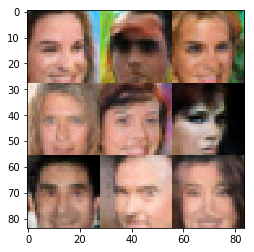

Epoch 4/10 - Batch 1910/3165 train_loss_d: 1.2626, train_loss_g: 0.7900
Epoch 4/10 - Batch 1920/3165 train_loss_d: 1.4353, train_loss_g: 0.5970
Epoch 4/10 - Batch 1930/3165 train_loss_d: 1.2054, train_loss_g: 0.8216
Epoch 4/10 - Batch 1940/3165 train_loss_d: 1.2623, train_loss_g: 0.9715
Epoch 4/10 - Batch 1950/3165 train_loss_d: 1.3135, train_loss_g: 0.6886
Epoch 4/10 - Batch 1960/3165 train_loss_d: 1.2982, train_loss_g: 0.6480
Epoch 4/10 - Batch 1970/3165 train_loss_d: 1.2145, train_loss_g: 0.8397
Epoch 4/10 - Batch 1980/3165 train_loss_d: 1.1340, train_loss_g: 0.8072
Epoch 4/10 - Batch 1990/3165 train_loss_d: 1.2336, train_loss_g: 0.8078
Epoch 4/10 - Batch 2000/3165 train_loss_d: 1.2675, train_loss_g: 0.6291
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_116/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_116/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_116/Maximum_2:0", sha

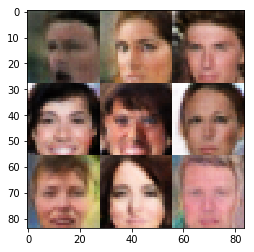

Epoch 4/10 - Batch 2010/3165 train_loss_d: 1.1990, train_loss_g: 0.8170
Epoch 4/10 - Batch 2020/3165 train_loss_d: 1.4613, train_loss_g: 0.6198
Epoch 4/10 - Batch 2030/3165 train_loss_d: 1.1673, train_loss_g: 0.8813
Epoch 4/10 - Batch 2040/3165 train_loss_d: 1.2453, train_loss_g: 0.8474
Epoch 4/10 - Batch 2050/3165 train_loss_d: 1.1471, train_loss_g: 0.8106
Epoch 4/10 - Batch 2060/3165 train_loss_d: 1.1923, train_loss_g: 1.1744
Epoch 4/10 - Batch 2070/3165 train_loss_d: 1.1732, train_loss_g: 0.7681
Epoch 4/10 - Batch 2080/3165 train_loss_d: 1.1881, train_loss_g: 0.9889
Epoch 4/10 - Batch 2090/3165 train_loss_d: 1.2122, train_loss_g: 0.9336
Epoch 4/10 - Batch 2100/3165 train_loss_d: 1.2910, train_loss_g: 0.9368
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_117/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_117/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_117/Maximum_2:0", sha

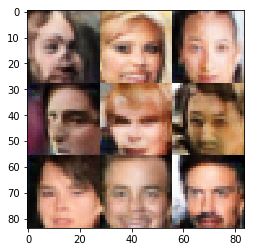

Epoch 4/10 - Batch 2110/3165 train_loss_d: 1.1209, train_loss_g: 0.8376
Epoch 4/10 - Batch 2120/3165 train_loss_d: 1.0858, train_loss_g: 1.2394
Epoch 4/10 - Batch 2130/3165 train_loss_d: 1.2338, train_loss_g: 1.0957
Epoch 4/10 - Batch 2140/3165 train_loss_d: 1.1636, train_loss_g: 0.7717
Epoch 4/10 - Batch 2150/3165 train_loss_d: 1.2411, train_loss_g: 0.7136
Epoch 4/10 - Batch 2160/3165 train_loss_d: 1.6026, train_loss_g: 0.4009
Epoch 4/10 - Batch 2170/3165 train_loss_d: 1.1211, train_loss_g: 0.9983
Epoch 4/10 - Batch 2180/3165 train_loss_d: 1.3293, train_loss_g: 1.0226
Epoch 4/10 - Batch 2190/3165 train_loss_d: 1.1501, train_loss_g: 0.8887
Epoch 4/10 - Batch 2200/3165 train_loss_d: 1.3368, train_loss_g: 0.6017
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_118/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_118/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_118/Maximum_2:0", sha

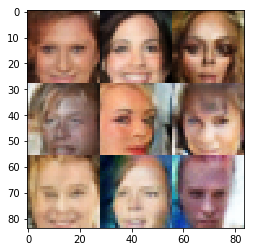

Epoch 4/10 - Batch 2210/3165 train_loss_d: 1.4650, train_loss_g: 0.4879
Epoch 4/10 - Batch 2220/3165 train_loss_d: 1.3568, train_loss_g: 0.6913
Epoch 4/10 - Batch 2230/3165 train_loss_d: 1.2647, train_loss_g: 0.7729
Epoch 4/10 - Batch 2240/3165 train_loss_d: 1.2969, train_loss_g: 0.6570
Epoch 4/10 - Batch 2250/3165 train_loss_d: 1.3092, train_loss_g: 0.6793
Epoch 4/10 - Batch 2260/3165 train_loss_d: 1.1831, train_loss_g: 1.2124
Epoch 4/10 - Batch 2270/3165 train_loss_d: 1.1999, train_loss_g: 0.9228
Epoch 4/10 - Batch 2280/3165 train_loss_d: 1.0972, train_loss_g: 0.8796
Epoch 4/10 - Batch 2290/3165 train_loss_d: 1.1312, train_loss_g: 1.0074
Epoch 4/10 - Batch 2300/3165 train_loss_d: 1.3572, train_loss_g: 0.5442
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_119/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_119/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_119/Maximum_2:0", sha

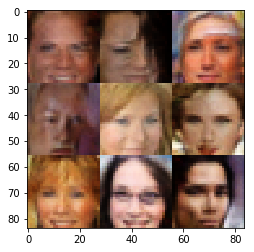

Epoch 4/10 - Batch 2310/3165 train_loss_d: 1.1873, train_loss_g: 0.8575
Epoch 4/10 - Batch 2320/3165 train_loss_d: 1.2281, train_loss_g: 1.3157
Epoch 4/10 - Batch 2330/3165 train_loss_d: 1.1181, train_loss_g: 0.9632
Epoch 4/10 - Batch 2340/3165 train_loss_d: 1.1658, train_loss_g: 0.9111
Epoch 4/10 - Batch 2350/3165 train_loss_d: 1.2506, train_loss_g: 1.2737
Epoch 4/10 - Batch 2360/3165 train_loss_d: 1.3343, train_loss_g: 0.6135
Epoch 4/10 - Batch 2370/3165 train_loss_d: 1.1638, train_loss_g: 0.8212
Epoch 4/10 - Batch 2380/3165 train_loss_d: 1.2283, train_loss_g: 0.6592
Epoch 4/10 - Batch 2390/3165 train_loss_d: 1.2334, train_loss_g: 0.7843
Epoch 4/10 - Batch 2400/3165 train_loss_d: 1.3228, train_loss_g: 0.6495
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_120/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_120/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_120/Maximum_2:0", sha

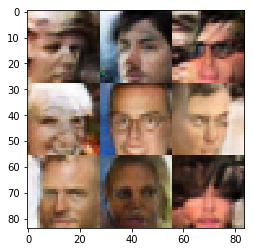

Epoch 4/10 - Batch 2410/3165 train_loss_d: 1.1392, train_loss_g: 1.0704
Epoch 4/10 - Batch 2420/3165 train_loss_d: 1.1439, train_loss_g: 0.7789
Epoch 4/10 - Batch 2430/3165 train_loss_d: 1.1560, train_loss_g: 0.9507
Epoch 4/10 - Batch 2440/3165 train_loss_d: 1.3094, train_loss_g: 1.1602
Epoch 4/10 - Batch 2450/3165 train_loss_d: 1.2918, train_loss_g: 0.6805
Epoch 4/10 - Batch 2460/3165 train_loss_d: 1.2208, train_loss_g: 0.8100
Epoch 4/10 - Batch 2470/3165 train_loss_d: 1.3051, train_loss_g: 0.6625
Epoch 4/10 - Batch 2480/3165 train_loss_d: 1.2853, train_loss_g: 1.0877
Epoch 4/10 - Batch 2490/3165 train_loss_d: 1.4626, train_loss_g: 1.4872
Epoch 4/10 - Batch 2500/3165 train_loss_d: 1.2877, train_loss_g: 1.2095
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_121/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_121/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_121/Maximum_2:0", sha

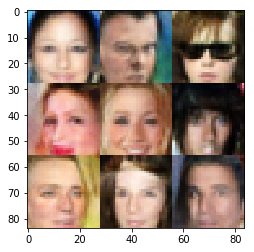

Epoch 4/10 - Batch 2510/3165 train_loss_d: 1.4254, train_loss_g: 0.6542
Epoch 4/10 - Batch 2520/3165 train_loss_d: 1.2039, train_loss_g: 0.9031
Epoch 4/10 - Batch 2530/3165 train_loss_d: 1.3288, train_loss_g: 0.9815
Epoch 4/10 - Batch 2540/3165 train_loss_d: 1.3218, train_loss_g: 0.5932
Epoch 4/10 - Batch 2550/3165 train_loss_d: 1.2712, train_loss_g: 0.8823
Epoch 4/10 - Batch 2560/3165 train_loss_d: 1.2806, train_loss_g: 0.9592
Epoch 4/10 - Batch 2570/3165 train_loss_d: 1.4187, train_loss_g: 0.5811
Epoch 4/10 - Batch 2580/3165 train_loss_d: 1.2626, train_loss_g: 0.9463
Epoch 4/10 - Batch 2590/3165 train_loss_d: 1.1894, train_loss_g: 1.0434
Epoch 4/10 - Batch 2600/3165 train_loss_d: 1.3066, train_loss_g: 0.6384
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_122/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_122/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_122/Maximum_2:0", sha

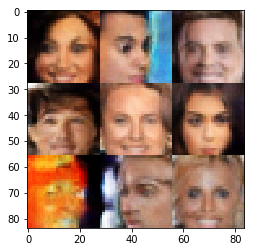

Epoch 4/10 - Batch 2610/3165 train_loss_d: 1.3526, train_loss_g: 0.6924
Epoch 4/10 - Batch 2620/3165 train_loss_d: 1.1733, train_loss_g: 0.9585
Epoch 4/10 - Batch 2630/3165 train_loss_d: 1.2949, train_loss_g: 0.6324
Epoch 4/10 - Batch 2640/3165 train_loss_d: 1.3334, train_loss_g: 0.6041
Epoch 4/10 - Batch 2650/3165 train_loss_d: 1.2011, train_loss_g: 0.8334
Epoch 4/10 - Batch 2660/3165 train_loss_d: 1.2039, train_loss_g: 0.8016
Epoch 4/10 - Batch 2670/3165 train_loss_d: 1.2570, train_loss_g: 0.7307
Epoch 4/10 - Batch 2680/3165 train_loss_d: 1.4447, train_loss_g: 0.5172
Epoch 4/10 - Batch 2690/3165 train_loss_d: 1.1442, train_loss_g: 0.9806
Epoch 4/10 - Batch 2700/3165 train_loss_d: 1.4875, train_loss_g: 1.2490
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_123/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_123/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_123/Maximum_2:0", sha

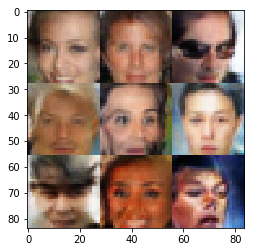

Epoch 4/10 - Batch 2710/3165 train_loss_d: 1.3285, train_loss_g: 0.5809
Epoch 4/10 - Batch 2720/3165 train_loss_d: 1.2630, train_loss_g: 0.8431
Epoch 4/10 - Batch 2730/3165 train_loss_d: 1.2917, train_loss_g: 0.6710
Epoch 4/10 - Batch 2740/3165 train_loss_d: 1.3142, train_loss_g: 0.6605
Epoch 4/10 - Batch 2750/3165 train_loss_d: 1.3126, train_loss_g: 0.6844
Epoch 4/10 - Batch 2760/3165 train_loss_d: 1.2558, train_loss_g: 0.8528
Epoch 4/10 - Batch 2770/3165 train_loss_d: 1.3262, train_loss_g: 0.5741
Epoch 4/10 - Batch 2780/3165 train_loss_d: 1.2487, train_loss_g: 0.7579
Epoch 4/10 - Batch 2790/3165 train_loss_d: 1.2869, train_loss_g: 0.9422
Epoch 4/10 - Batch 2800/3165 train_loss_d: 1.3253, train_loss_g: 1.1409
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_124/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_124/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_124/Maximum_2:0", sha

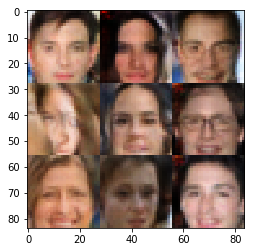

Epoch 4/10 - Batch 2810/3165 train_loss_d: 1.3785, train_loss_g: 0.5554
Epoch 4/10 - Batch 2820/3165 train_loss_d: 1.3932, train_loss_g: 0.5091
Epoch 4/10 - Batch 2830/3165 train_loss_d: 1.2578, train_loss_g: 1.0193
Epoch 4/10 - Batch 2840/3165 train_loss_d: 1.5082, train_loss_g: 0.7466
Epoch 4/10 - Batch 2850/3165 train_loss_d: 1.1653, train_loss_g: 0.8731
Epoch 4/10 - Batch 2860/3165 train_loss_d: 1.2939, train_loss_g: 0.7271
Epoch 4/10 - Batch 2870/3165 train_loss_d: 1.2918, train_loss_g: 1.1540
Epoch 4/10 - Batch 2880/3165 train_loss_d: 1.2416, train_loss_g: 0.6941
Epoch 4/10 - Batch 2890/3165 train_loss_d: 1.1616, train_loss_g: 0.7859
Epoch 4/10 - Batch 2900/3165 train_loss_d: 1.4279, train_loss_g: 0.5590
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_125/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_125/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_125/Maximum_2:0", sha

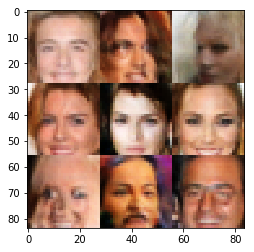

Epoch 4/10 - Batch 2910/3165 train_loss_d: 1.3582, train_loss_g: 0.6341
Epoch 4/10 - Batch 2920/3165 train_loss_d: 1.2645, train_loss_g: 0.7192
Epoch 4/10 - Batch 2930/3165 train_loss_d: 1.1386, train_loss_g: 0.9685
Epoch 4/10 - Batch 2940/3165 train_loss_d: 1.1933, train_loss_g: 1.0618
Epoch 4/10 - Batch 2950/3165 train_loss_d: 1.0963, train_loss_g: 1.1733
Epoch 4/10 - Batch 2960/3165 train_loss_d: 1.2391, train_loss_g: 0.6829
Epoch 4/10 - Batch 2970/3165 train_loss_d: 1.0176, train_loss_g: 1.2589
Epoch 4/10 - Batch 2980/3165 train_loss_d: 1.2166, train_loss_g: 1.0410
Epoch 4/10 - Batch 2990/3165 train_loss_d: 1.2666, train_loss_g: 0.6843
Epoch 4/10 - Batch 3000/3165 train_loss_d: 1.2167, train_loss_g: 0.9240
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_126/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_126/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_126/Maximum_2:0", sha

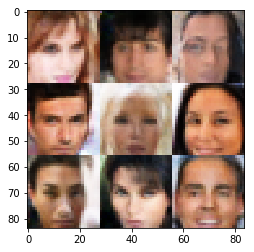

Epoch 4/10 - Batch 3010/3165 train_loss_d: 1.2404, train_loss_g: 0.7690
Epoch 4/10 - Batch 3020/3165 train_loss_d: 1.2703, train_loss_g: 0.8512
Epoch 4/10 - Batch 3030/3165 train_loss_d: 1.2633, train_loss_g: 0.7699
Epoch 4/10 - Batch 3040/3165 train_loss_d: 1.2761, train_loss_g: 0.7284
Epoch 4/10 - Batch 3050/3165 train_loss_d: 1.2575, train_loss_g: 0.7727
Epoch 4/10 - Batch 3060/3165 train_loss_d: 1.2849, train_loss_g: 1.0780
Epoch 4/10 - Batch 3070/3165 train_loss_d: 1.2132, train_loss_g: 0.7742
Epoch 4/10 - Batch 3080/3165 train_loss_d: 1.2392, train_loss_g: 0.6789
Epoch 4/10 - Batch 3090/3165 train_loss_d: 1.3918, train_loss_g: 0.5488
Epoch 4/10 - Batch 3100/3165 train_loss_d: 1.2859, train_loss_g: 0.6417
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_127/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_127/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_127/Maximum_2:0", sha

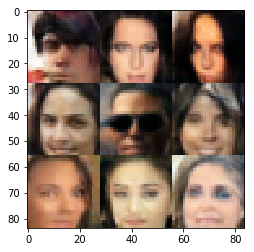

Epoch 4/10 - Batch 3110/3165 train_loss_d: 1.3732, train_loss_g: 0.5201
Epoch 4/10 - Batch 3120/3165 train_loss_d: 1.0975, train_loss_g: 1.0375
Epoch 4/10 - Batch 3130/3165 train_loss_d: 1.2493, train_loss_g: 0.7011
Epoch 4/10 - Batch 3140/3165 train_loss_d: 1.2887, train_loss_g: 0.9300
Epoch 4/10 - Batch 3150/3165 train_loss_d: 1.1788, train_loss_g: 0.8908
Epoch 4/10 - Batch 3160/3165 train_loss_d: 1.2610, train_loss_g: 0.9202
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_128/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_128/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_128/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_128/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


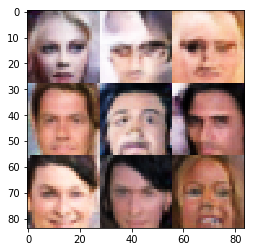


 40%|████      | 4/10 [2:57:05<4:28:31, 2685.24s/it]

Epoch 5/10 - Batch 10/3165 train_loss_d: 1.0758, train_loss_g: 1.2323
Epoch 5/10 - Batch 20/3165 train_loss_d: 1.2709, train_loss_g: 0.6609
Epoch 5/10 - Batch 30/3165 train_loss_d: 1.1550, train_loss_g: 0.9488
Epoch 5/10 - Batch 40/3165 train_loss_d: 1.2566, train_loss_g: 0.6834
Epoch 5/10 - Batch 50/3165 train_loss_d: 0.8995, train_loss_g: 1.3346
Epoch 5/10 - Batch 60/3165 train_loss_d: 1.3359, train_loss_g: 0.6126
Epoch 5/10 - Batch 70/3165 train_loss_d: 1.1843, train_loss_g: 0.9754
Epoch 5/10 - Batch 80/3165 train_loss_d: 1.2091, train_loss_g: 0.6975
Epoch 5/10 - Batch 90/3165 train_loss_d: 1.2647, train_loss_g: 0.9895
Epoch 5/10 - Batch 100/3165 train_loss_d: 1.3685, train_loss_g: 0.5176
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_129/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_129/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_129/Maximum_2:0", shape=(?, 28, 28, 128)

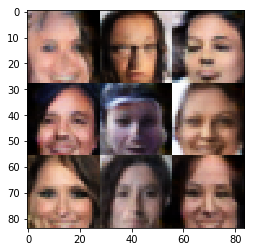

Epoch 5/10 - Batch 110/3165 train_loss_d: 1.1970, train_loss_g: 0.9022
Epoch 5/10 - Batch 120/3165 train_loss_d: 1.4180, train_loss_g: 0.6568
Epoch 5/10 - Batch 130/3165 train_loss_d: 1.2688, train_loss_g: 0.7000
Epoch 5/10 - Batch 140/3165 train_loss_d: 1.1053, train_loss_g: 0.9198
Epoch 5/10 - Batch 150/3165 train_loss_d: 1.2385, train_loss_g: 0.7917
Epoch 5/10 - Batch 160/3165 train_loss_d: 1.2079, train_loss_g: 0.9657
Epoch 5/10 - Batch 170/3165 train_loss_d: 1.1649, train_loss_g: 0.9617
Epoch 5/10 - Batch 180/3165 train_loss_d: 1.1794, train_loss_g: 1.1231
Epoch 5/10 - Batch 190/3165 train_loss_d: 1.0741, train_loss_g: 1.1829
Epoch 5/10 - Batch 200/3165 train_loss_d: 1.2400, train_loss_g: 0.6581
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_130/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_130/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_130/Maximum_2:0", shape=(?, 28,

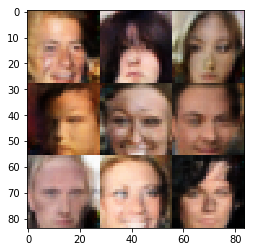

Epoch 5/10 - Batch 210/3165 train_loss_d: 1.0268, train_loss_g: 0.8861
Epoch 5/10 - Batch 220/3165 train_loss_d: 1.2240, train_loss_g: 0.7165
Epoch 5/10 - Batch 230/3165 train_loss_d: 1.2592, train_loss_g: 1.2023
Epoch 5/10 - Batch 240/3165 train_loss_d: 1.2644, train_loss_g: 0.8793
Epoch 5/10 - Batch 250/3165 train_loss_d: 1.1269, train_loss_g: 0.7836
Epoch 5/10 - Batch 260/3165 train_loss_d: 1.3009, train_loss_g: 0.5777
Epoch 5/10 - Batch 270/3165 train_loss_d: 1.2123, train_loss_g: 1.0237
Epoch 5/10 - Batch 280/3165 train_loss_d: 1.2460, train_loss_g: 0.8776
Epoch 5/10 - Batch 290/3165 train_loss_d: 1.2122, train_loss_g: 0.7460
Epoch 5/10 - Batch 300/3165 train_loss_d: 1.3827, train_loss_g: 1.2356
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_131/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_131/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_131/Maximum_2:0", shape=(?, 28,

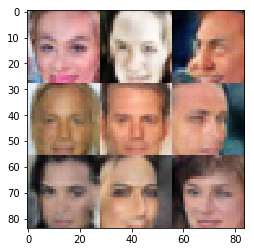

Epoch 5/10 - Batch 310/3165 train_loss_d: 1.1913, train_loss_g: 0.8446
Epoch 5/10 - Batch 320/3165 train_loss_d: 1.1784, train_loss_g: 0.9431
Epoch 5/10 - Batch 330/3165 train_loss_d: 1.1768, train_loss_g: 0.7488
Epoch 5/10 - Batch 340/3165 train_loss_d: 1.1324, train_loss_g: 0.9285
Epoch 5/10 - Batch 350/3165 train_loss_d: 0.9896, train_loss_g: 1.1204
Epoch 5/10 - Batch 360/3165 train_loss_d: 1.1647, train_loss_g: 0.9587
Epoch 5/10 - Batch 370/3165 train_loss_d: 1.3511, train_loss_g: 0.5527
Epoch 5/10 - Batch 380/3165 train_loss_d: 1.0344, train_loss_g: 1.3734
Epoch 5/10 - Batch 390/3165 train_loss_d: 1.2776, train_loss_g: 0.9002
Epoch 5/10 - Batch 400/3165 train_loss_d: 1.2294, train_loss_g: 0.7720
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_132/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_132/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_132/Maximum_2:0", shape=(?, 28,

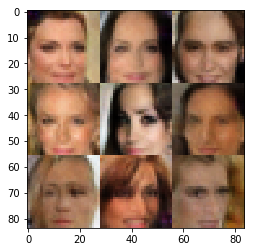

Epoch 5/10 - Batch 410/3165 train_loss_d: 1.2011, train_loss_g: 1.1891
Epoch 5/10 - Batch 420/3165 train_loss_d: 1.2646, train_loss_g: 0.6566
Epoch 5/10 - Batch 430/3165 train_loss_d: 1.6156, train_loss_g: 0.4246
Epoch 5/10 - Batch 440/3165 train_loss_d: 1.2318, train_loss_g: 0.8084
Epoch 5/10 - Batch 450/3165 train_loss_d: 1.3413, train_loss_g: 0.5654
Epoch 5/10 - Batch 460/3165 train_loss_d: 1.1445, train_loss_g: 0.7439
Epoch 5/10 - Batch 470/3165 train_loss_d: 1.2842, train_loss_g: 0.7108
Epoch 5/10 - Batch 480/3165 train_loss_d: 1.2882, train_loss_g: 0.8176
Epoch 5/10 - Batch 490/3165 train_loss_d: 1.1821, train_loss_g: 1.1133
Epoch 5/10 - Batch 500/3165 train_loss_d: 1.2791, train_loss_g: 0.7260
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_133/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_133/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_133/Maximum_2:0", shape=(?, 28,

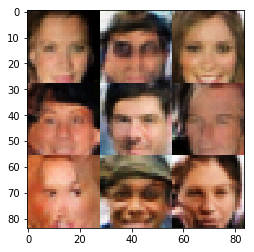

Epoch 5/10 - Batch 510/3165 train_loss_d: 1.2432, train_loss_g: 0.7349
Epoch 5/10 - Batch 520/3165 train_loss_d: 1.1535, train_loss_g: 0.9378
Epoch 5/10 - Batch 530/3165 train_loss_d: 1.1961, train_loss_g: 0.7024
Epoch 5/10 - Batch 540/3165 train_loss_d: 1.0744, train_loss_g: 1.0654
Epoch 5/10 - Batch 550/3165 train_loss_d: 1.1724, train_loss_g: 0.7693
Epoch 5/10 - Batch 560/3165 train_loss_d: 1.0804, train_loss_g: 1.2501
Epoch 5/10 - Batch 570/3165 train_loss_d: 1.0692, train_loss_g: 1.2476
Epoch 5/10 - Batch 580/3165 train_loss_d: 1.2563, train_loss_g: 0.6247
Epoch 5/10 - Batch 590/3165 train_loss_d: 1.3081, train_loss_g: 0.8815
Epoch 5/10 - Batch 600/3165 train_loss_d: 1.4336, train_loss_g: 0.5441
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_134/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_134/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_134/Maximum_2:0", shape=(?, 28,

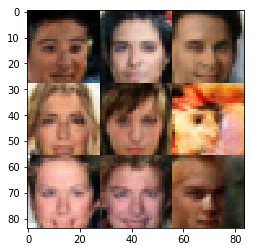

Epoch 5/10 - Batch 610/3165 train_loss_d: 1.2795, train_loss_g: 0.9070
Epoch 5/10 - Batch 620/3165 train_loss_d: 1.4342, train_loss_g: 0.6833
Epoch 5/10 - Batch 630/3165 train_loss_d: 1.3506, train_loss_g: 0.6965
Epoch 5/10 - Batch 640/3165 train_loss_d: 1.0378, train_loss_g: 0.9505
Epoch 5/10 - Batch 650/3165 train_loss_d: 1.0000, train_loss_g: 1.1111
Epoch 5/10 - Batch 660/3165 train_loss_d: 0.9569, train_loss_g: 0.9495
Epoch 5/10 - Batch 670/3165 train_loss_d: 1.7180, train_loss_g: 0.3474
Epoch 5/10 - Batch 680/3165 train_loss_d: 1.4122, train_loss_g: 0.5310
Epoch 5/10 - Batch 690/3165 train_loss_d: 1.2406, train_loss_g: 0.6227
Epoch 5/10 - Batch 700/3165 train_loss_d: 1.2772, train_loss_g: 0.7430
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_135/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_135/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_135/Maximum_2:0", shape=(?, 28,

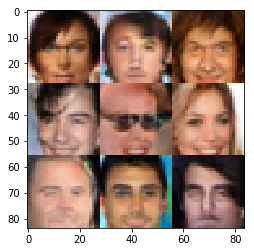

Epoch 5/10 - Batch 710/3165 train_loss_d: 1.0239, train_loss_g: 0.9858
Epoch 5/10 - Batch 720/3165 train_loss_d: 1.0934, train_loss_g: 0.8610
Epoch 5/10 - Batch 730/3165 train_loss_d: 1.2551, train_loss_g: 0.6105
Epoch 5/10 - Batch 740/3165 train_loss_d: 1.3359, train_loss_g: 0.7138
Epoch 5/10 - Batch 750/3165 train_loss_d: 1.3464, train_loss_g: 0.7239
Epoch 5/10 - Batch 760/3165 train_loss_d: 1.2931, train_loss_g: 0.8364
Epoch 5/10 - Batch 770/3165 train_loss_d: 1.2556, train_loss_g: 0.9492
Epoch 5/10 - Batch 780/3165 train_loss_d: 1.3083, train_loss_g: 0.5946
Epoch 5/10 - Batch 790/3165 train_loss_d: 1.1787, train_loss_g: 0.8933
Epoch 5/10 - Batch 800/3165 train_loss_d: 1.1270, train_loss_g: 1.1181
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_136/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_136/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_136/Maximum_2:0", shape=(?, 28,

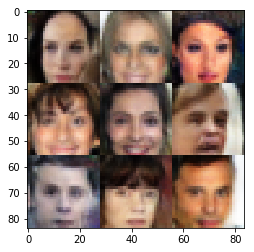

Epoch 5/10 - Batch 810/3165 train_loss_d: 1.0510, train_loss_g: 1.2375
Epoch 5/10 - Batch 820/3165 train_loss_d: 1.2440, train_loss_g: 0.6910
Epoch 5/10 - Batch 830/3165 train_loss_d: 1.2983, train_loss_g: 0.6200
Epoch 5/10 - Batch 840/3165 train_loss_d: 1.1536, train_loss_g: 0.8538
Epoch 5/10 - Batch 850/3165 train_loss_d: 1.2742, train_loss_g: 1.0869
Epoch 5/10 - Batch 860/3165 train_loss_d: 1.3387, train_loss_g: 0.8593
Epoch 5/10 - Batch 870/3165 train_loss_d: 1.0920, train_loss_g: 1.0853
Epoch 5/10 - Batch 880/3165 train_loss_d: 1.1783, train_loss_g: 0.9366
Epoch 5/10 - Batch 890/3165 train_loss_d: 1.2742, train_loss_g: 0.7310
Epoch 5/10 - Batch 900/3165 train_loss_d: 1.3821, train_loss_g: 0.5918
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_137/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_137/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_137/Maximum_2:0", shape=(?, 28,

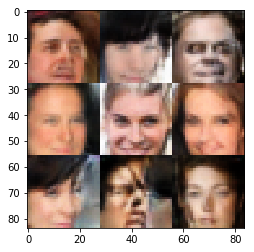

Epoch 5/10 - Batch 910/3165 train_loss_d: 1.3543, train_loss_g: 0.5758
Epoch 5/10 - Batch 920/3165 train_loss_d: 1.2237, train_loss_g: 0.7848
Epoch 5/10 - Batch 930/3165 train_loss_d: 1.1937, train_loss_g: 0.8497
Epoch 5/10 - Batch 940/3165 train_loss_d: 1.2049, train_loss_g: 0.9178
Epoch 5/10 - Batch 950/3165 train_loss_d: 1.3083, train_loss_g: 0.6443
Epoch 5/10 - Batch 960/3165 train_loss_d: 1.0851, train_loss_g: 1.2042
Epoch 5/10 - Batch 970/3165 train_loss_d: 1.4395, train_loss_g: 0.5353
Epoch 5/10 - Batch 980/3165 train_loss_d: 1.0945, train_loss_g: 1.0414
Epoch 5/10 - Batch 990/3165 train_loss_d: 1.1322, train_loss_g: 0.8747
Epoch 5/10 - Batch 1000/3165 train_loss_d: 1.3347, train_loss_g: 0.6621
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_138/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_138/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_138/Maximum_2:0", shape=(?, 28

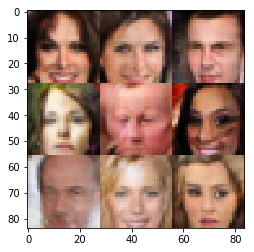

Epoch 5/10 - Batch 1010/3165 train_loss_d: 1.2670, train_loss_g: 0.9165
Epoch 5/10 - Batch 1020/3165 train_loss_d: 1.3865, train_loss_g: 0.5379
Epoch 5/10 - Batch 1030/3165 train_loss_d: 1.4960, train_loss_g: 0.5156
Epoch 5/10 - Batch 1040/3165 train_loss_d: 1.2448, train_loss_g: 0.7279
Epoch 5/10 - Batch 1050/3165 train_loss_d: 1.1412, train_loss_g: 1.0616
Epoch 5/10 - Batch 1060/3165 train_loss_d: 1.0890, train_loss_g: 1.2685
Epoch 5/10 - Batch 1070/3165 train_loss_d: 1.1785, train_loss_g: 0.8353
Epoch 5/10 - Batch 1080/3165 train_loss_d: 1.0798, train_loss_g: 0.9848
Epoch 5/10 - Batch 1090/3165 train_loss_d: 1.3179, train_loss_g: 0.6332
Epoch 5/10 - Batch 1100/3165 train_loss_d: 1.1213, train_loss_g: 0.9433
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_139/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_139/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_139/Maximum_2:0", sha

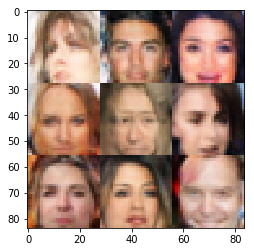

Epoch 5/10 - Batch 1110/3165 train_loss_d: 1.2726, train_loss_g: 1.3602
Epoch 5/10 - Batch 1120/3165 train_loss_d: 1.2839, train_loss_g: 1.1326
Epoch 5/10 - Batch 1130/3165 train_loss_d: 1.0181, train_loss_g: 0.9726
Epoch 5/10 - Batch 1140/3165 train_loss_d: 1.2764, train_loss_g: 0.9371
Epoch 5/10 - Batch 1150/3165 train_loss_d: 1.3993, train_loss_g: 0.5796
Epoch 5/10 - Batch 1160/3165 train_loss_d: 1.2003, train_loss_g: 0.9488
Epoch 5/10 - Batch 1170/3165 train_loss_d: 1.2993, train_loss_g: 0.7769
Epoch 5/10 - Batch 1180/3165 train_loss_d: 1.3626, train_loss_g: 0.6155
Epoch 5/10 - Batch 1190/3165 train_loss_d: 1.1845, train_loss_g: 1.0204
Epoch 5/10 - Batch 1200/3165 train_loss_d: 1.2973, train_loss_g: 0.6280
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_140/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_140/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_140/Maximum_2:0", sha

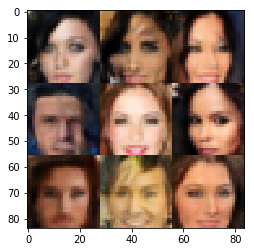

Epoch 5/10 - Batch 1210/3165 train_loss_d: 1.1794, train_loss_g: 0.8025
Epoch 5/10 - Batch 1220/3165 train_loss_d: 1.0601, train_loss_g: 0.9815
Epoch 5/10 - Batch 1230/3165 train_loss_d: 1.2884, train_loss_g: 0.6300
Epoch 5/10 - Batch 1240/3165 train_loss_d: 1.2105, train_loss_g: 0.6572
Epoch 5/10 - Batch 1250/3165 train_loss_d: 1.2569, train_loss_g: 0.7486
Epoch 5/10 - Batch 1260/3165 train_loss_d: 1.2086, train_loss_g: 0.6406
Epoch 5/10 - Batch 1270/3165 train_loss_d: 1.1742, train_loss_g: 0.8315
Epoch 5/10 - Batch 1280/3165 train_loss_d: 1.3349, train_loss_g: 0.5424
Epoch 5/10 - Batch 1290/3165 train_loss_d: 1.2406, train_loss_g: 0.7832
Epoch 5/10 - Batch 1300/3165 train_loss_d: 1.0315, train_loss_g: 1.2818
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_141/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_141/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_141/Maximum_2:0", sha

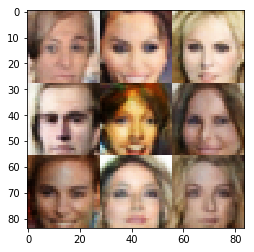

Epoch 5/10 - Batch 1310/3165 train_loss_d: 1.1514, train_loss_g: 0.8297
Epoch 5/10 - Batch 1320/3165 train_loss_d: 1.1585, train_loss_g: 0.9772
Epoch 5/10 - Batch 1330/3165 train_loss_d: 1.3153, train_loss_g: 1.0360
Epoch 5/10 - Batch 1340/3165 train_loss_d: 1.2679, train_loss_g: 1.6133
Epoch 5/10 - Batch 1350/3165 train_loss_d: 1.1545, train_loss_g: 0.7992
Epoch 5/10 - Batch 1360/3165 train_loss_d: 1.1291, train_loss_g: 1.1607
Epoch 5/10 - Batch 1370/3165 train_loss_d: 1.1538, train_loss_g: 0.7539
Epoch 5/10 - Batch 1380/3165 train_loss_d: 1.0776, train_loss_g: 0.9244
Epoch 5/10 - Batch 1390/3165 train_loss_d: 1.4799, train_loss_g: 0.4568
Epoch 5/10 - Batch 1400/3165 train_loss_d: 1.2660, train_loss_g: 0.6291
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_142/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_142/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_142/Maximum_2:0", sha

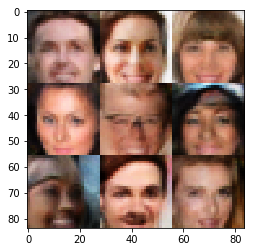

Epoch 5/10 - Batch 1410/3165 train_loss_d: 1.4569, train_loss_g: 0.5267
Epoch 5/10 - Batch 1420/3165 train_loss_d: 1.1061, train_loss_g: 1.0125
Epoch 5/10 - Batch 1430/3165 train_loss_d: 1.3937, train_loss_g: 0.5572
Epoch 5/10 - Batch 1440/3165 train_loss_d: 1.2447, train_loss_g: 0.6416
Epoch 5/10 - Batch 1450/3165 train_loss_d: 1.4371, train_loss_g: 0.5211
Epoch 5/10 - Batch 1460/3165 train_loss_d: 1.3921, train_loss_g: 0.5917
Epoch 5/10 - Batch 1470/3165 train_loss_d: 1.4658, train_loss_g: 0.4759
Epoch 5/10 - Batch 1480/3165 train_loss_d: 1.2985, train_loss_g: 0.6049
Epoch 5/10 - Batch 1490/3165 train_loss_d: 1.0435, train_loss_g: 0.9906
Epoch 5/10 - Batch 1500/3165 train_loss_d: 0.9731, train_loss_g: 0.9472
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_143/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_143/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_143/Maximum_2:0", sha

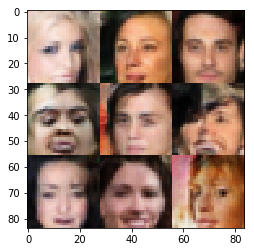

Epoch 5/10 - Batch 1510/3165 train_loss_d: 1.1022, train_loss_g: 0.8607
Epoch 5/10 - Batch 1520/3165 train_loss_d: 1.4434, train_loss_g: 0.5555
Epoch 5/10 - Batch 1530/3165 train_loss_d: 1.1643, train_loss_g: 0.7202
Epoch 5/10 - Batch 1540/3165 train_loss_d: 1.0283, train_loss_g: 1.1252
Epoch 5/10 - Batch 1550/3165 train_loss_d: 1.0953, train_loss_g: 0.8450
Epoch 5/10 - Batch 1560/3165 train_loss_d: 1.3771, train_loss_g: 0.5611
Epoch 5/10 - Batch 1570/3165 train_loss_d: 1.0556, train_loss_g: 1.0437
Epoch 5/10 - Batch 1580/3165 train_loss_d: 1.2734, train_loss_g: 0.7613
Epoch 5/10 - Batch 1590/3165 train_loss_d: 1.0265, train_loss_g: 0.8820
Epoch 5/10 - Batch 1600/3165 train_loss_d: 1.0325, train_loss_g: 1.1913
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_144/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_144/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_144/Maximum_2:0", sha

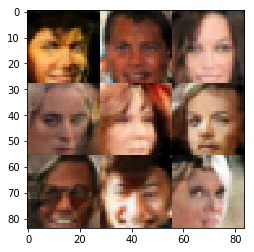

Epoch 5/10 - Batch 1610/3165 train_loss_d: 1.2067, train_loss_g: 0.8499
Epoch 5/10 - Batch 1620/3165 train_loss_d: 1.2130, train_loss_g: 0.9408
Epoch 5/10 - Batch 1630/3165 train_loss_d: 1.1820, train_loss_g: 1.0316
Epoch 5/10 - Batch 1640/3165 train_loss_d: 1.2808, train_loss_g: 0.8261
Epoch 5/10 - Batch 1650/3165 train_loss_d: 1.1465, train_loss_g: 0.7993
Epoch 5/10 - Batch 1660/3165 train_loss_d: 1.4039, train_loss_g: 0.5002
Epoch 5/10 - Batch 1670/3165 train_loss_d: 1.3402, train_loss_g: 0.5667
Epoch 5/10 - Batch 1680/3165 train_loss_d: 1.4132, train_loss_g: 1.0449
Epoch 5/10 - Batch 1690/3165 train_loss_d: 1.1887, train_loss_g: 0.7944
Epoch 5/10 - Batch 1700/3165 train_loss_d: 1.2239, train_loss_g: 0.7899
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_145/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_145/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_145/Maximum_2:0", sha

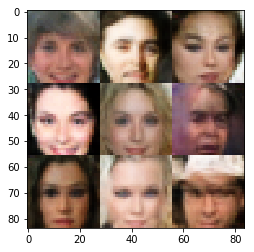

Epoch 5/10 - Batch 1710/3165 train_loss_d: 1.3934, train_loss_g: 0.4943
Epoch 5/10 - Batch 1720/3165 train_loss_d: 1.1810, train_loss_g: 0.6828
Epoch 5/10 - Batch 1730/3165 train_loss_d: 1.1497, train_loss_g: 0.8689
Epoch 5/10 - Batch 1740/3165 train_loss_d: 1.1661, train_loss_g: 1.3583
Epoch 5/10 - Batch 1750/3165 train_loss_d: 1.2067, train_loss_g: 0.9136
Epoch 5/10 - Batch 1760/3165 train_loss_d: 1.3688, train_loss_g: 1.4281
Epoch 5/10 - Batch 1770/3165 train_loss_d: 0.9344, train_loss_g: 1.1636
Epoch 5/10 - Batch 1780/3165 train_loss_d: 1.2293, train_loss_g: 0.8219
Epoch 5/10 - Batch 1790/3165 train_loss_d: 1.2392, train_loss_g: 0.6621
Epoch 5/10 - Batch 1800/3165 train_loss_d: 1.0868, train_loss_g: 0.9019
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_146/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_146/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_146/Maximum_2:0", sha

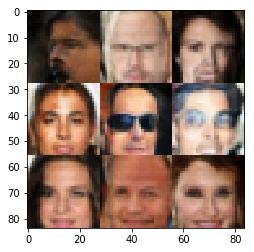

Epoch 5/10 - Batch 1810/3165 train_loss_d: 1.2050, train_loss_g: 0.8281
Epoch 5/10 - Batch 1820/3165 train_loss_d: 1.1257, train_loss_g: 1.5627
Epoch 5/10 - Batch 1830/3165 train_loss_d: 1.0581, train_loss_g: 1.1476
Epoch 5/10 - Batch 1840/3165 train_loss_d: 1.0624, train_loss_g: 1.0990
Epoch 5/10 - Batch 1850/3165 train_loss_d: 1.2245, train_loss_g: 0.7164
Epoch 5/10 - Batch 1860/3165 train_loss_d: 1.2940, train_loss_g: 0.7427
Epoch 5/10 - Batch 1870/3165 train_loss_d: 1.3468, train_loss_g: 0.5692
Epoch 5/10 - Batch 1880/3165 train_loss_d: 1.3752, train_loss_g: 0.5445
Epoch 5/10 - Batch 1890/3165 train_loss_d: 1.1583, train_loss_g: 0.9261
Epoch 5/10 - Batch 1900/3165 train_loss_d: 1.2947, train_loss_g: 0.6105
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_147/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_147/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_147/Maximum_2:0", sha

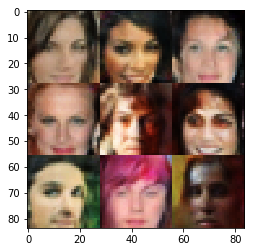

Epoch 5/10 - Batch 1910/3165 train_loss_d: 1.2318, train_loss_g: 1.0232
Epoch 5/10 - Batch 1920/3165 train_loss_d: 1.4730, train_loss_g: 0.5490
Epoch 5/10 - Batch 1930/3165 train_loss_d: 1.2211, train_loss_g: 1.3738
Epoch 5/10 - Batch 1940/3165 train_loss_d: 1.3804, train_loss_g: 0.6379
Epoch 5/10 - Batch 1950/3165 train_loss_d: 1.0146, train_loss_g: 0.9395
Epoch 5/10 - Batch 1960/3165 train_loss_d: 1.1555, train_loss_g: 0.8372
Epoch 5/10 - Batch 1970/3165 train_loss_d: 1.1312, train_loss_g: 0.9768
Epoch 5/10 - Batch 1980/3165 train_loss_d: 1.2227, train_loss_g: 0.8347
Epoch 5/10 - Batch 1990/3165 train_loss_d: 1.1703, train_loss_g: 1.1691
Epoch 5/10 - Batch 2000/3165 train_loss_d: 1.3476, train_loss_g: 0.5593
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_148/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_148/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_148/Maximum_2:0", sha

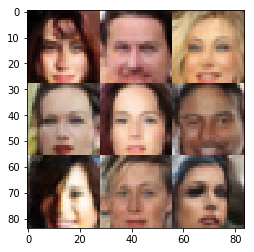

Epoch 5/10 - Batch 2010/3165 train_loss_d: 1.0612, train_loss_g: 0.9330
Epoch 5/10 - Batch 2020/3165 train_loss_d: 1.1936, train_loss_g: 0.7062
Epoch 5/10 - Batch 2030/3165 train_loss_d: 1.1575, train_loss_g: 0.8151
Epoch 5/10 - Batch 2040/3165 train_loss_d: 1.1512, train_loss_g: 1.0391
Epoch 5/10 - Batch 2050/3165 train_loss_d: 1.4494, train_loss_g: 0.5315
Epoch 5/10 - Batch 2060/3165 train_loss_d: 1.1771, train_loss_g: 0.8456
Epoch 5/10 - Batch 2070/3165 train_loss_d: 1.1418, train_loss_g: 1.1457
Epoch 5/10 - Batch 2080/3165 train_loss_d: 1.0579, train_loss_g: 0.8598
Epoch 5/10 - Batch 2090/3165 train_loss_d: 1.1393, train_loss_g: 1.2026
Epoch 5/10 - Batch 2100/3165 train_loss_d: 1.3404, train_loss_g: 0.6001
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_149/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_149/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_149/Maximum_2:0", sha

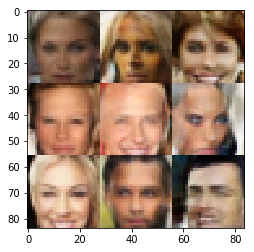

Epoch 5/10 - Batch 2110/3165 train_loss_d: 1.2206, train_loss_g: 0.7235
Epoch 5/10 - Batch 2120/3165 train_loss_d: 0.9397, train_loss_g: 1.3988
Epoch 5/10 - Batch 2130/3165 train_loss_d: 1.2053, train_loss_g: 1.3855
Epoch 5/10 - Batch 2140/3165 train_loss_d: 1.1865, train_loss_g: 0.7050
Epoch 5/10 - Batch 2150/3165 train_loss_d: 1.2070, train_loss_g: 0.7929
Epoch 5/10 - Batch 2160/3165 train_loss_d: 1.4307, train_loss_g: 0.5240
Epoch 5/10 - Batch 2170/3165 train_loss_d: 1.1324, train_loss_g: 1.0022
Epoch 5/10 - Batch 2180/3165 train_loss_d: 1.1856, train_loss_g: 0.8760
Epoch 5/10 - Batch 2190/3165 train_loss_d: 1.0225, train_loss_g: 1.1040
Epoch 5/10 - Batch 2200/3165 train_loss_d: 1.2843, train_loss_g: 0.5873
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_150/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_150/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_150/Maximum_2:0", sha

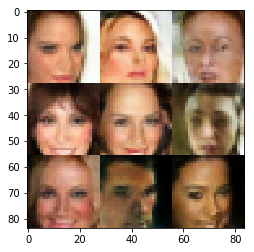

Epoch 5/10 - Batch 2210/3165 train_loss_d: 1.2397, train_loss_g: 0.6572
Epoch 5/10 - Batch 2220/3165 train_loss_d: 1.2336, train_loss_g: 0.8685
Epoch 5/10 - Batch 2230/3165 train_loss_d: 1.1460, train_loss_g: 0.8596
Epoch 5/10 - Batch 2240/3165 train_loss_d: 1.2655, train_loss_g: 1.0855
Epoch 5/10 - Batch 2250/3165 train_loss_d: 1.2242, train_loss_g: 0.7661
Epoch 5/10 - Batch 2260/3165 train_loss_d: 1.1011, train_loss_g: 0.8480
Epoch 5/10 - Batch 2270/3165 train_loss_d: 1.1418, train_loss_g: 0.8414
Epoch 5/10 - Batch 2280/3165 train_loss_d: 1.2580, train_loss_g: 1.2152
Epoch 5/10 - Batch 2290/3165 train_loss_d: 1.1188, train_loss_g: 1.3679
Epoch 5/10 - Batch 2300/3165 train_loss_d: 1.3458, train_loss_g: 0.6065
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_151/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_151/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_151/Maximum_2:0", sha

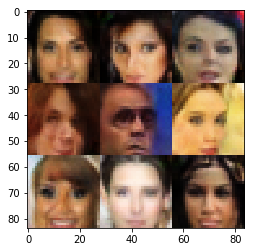

Epoch 5/10 - Batch 2310/3165 train_loss_d: 1.1672, train_loss_g: 0.6879
Epoch 5/10 - Batch 2320/3165 train_loss_d: 1.0705, train_loss_g: 0.9461
Epoch 5/10 - Batch 2330/3165 train_loss_d: 1.2996, train_loss_g: 0.7300
Epoch 5/10 - Batch 2340/3165 train_loss_d: 1.2500, train_loss_g: 1.3187
Epoch 5/10 - Batch 2350/3165 train_loss_d: 1.1790, train_loss_g: 1.1196
Epoch 5/10 - Batch 2360/3165 train_loss_d: 1.1558, train_loss_g: 0.9001
Epoch 5/10 - Batch 2370/3165 train_loss_d: 0.9929, train_loss_g: 0.8620
Epoch 5/10 - Batch 2380/3165 train_loss_d: 1.1022, train_loss_g: 0.7445
Epoch 5/10 - Batch 2390/3165 train_loss_d: 1.2059, train_loss_g: 0.7160
Epoch 5/10 - Batch 2400/3165 train_loss_d: 1.5747, train_loss_g: 0.4269
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_152/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_152/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_152/Maximum_2:0", sha

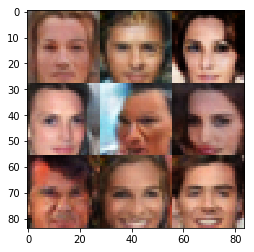

Epoch 5/10 - Batch 2410/3165 train_loss_d: 1.1461, train_loss_g: 0.9874
Epoch 5/10 - Batch 2420/3165 train_loss_d: 1.2732, train_loss_g: 0.6312
Epoch 5/10 - Batch 2430/3165 train_loss_d: 1.2126, train_loss_g: 1.0346
Epoch 5/10 - Batch 2440/3165 train_loss_d: 1.2412, train_loss_g: 1.4284
Epoch 5/10 - Batch 2450/3165 train_loss_d: 1.1636, train_loss_g: 0.9154
Epoch 5/10 - Batch 2460/3165 train_loss_d: 1.1183, train_loss_g: 0.7230
Epoch 5/10 - Batch 2470/3165 train_loss_d: 1.2874, train_loss_g: 0.8241
Epoch 5/10 - Batch 2480/3165 train_loss_d: 1.1798, train_loss_g: 0.8207
Epoch 5/10 - Batch 2490/3165 train_loss_d: 1.2722, train_loss_g: 1.1893
Epoch 5/10 - Batch 2500/3165 train_loss_d: 1.1402, train_loss_g: 1.4786
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_153/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_153/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_153/Maximum_2:0", sha

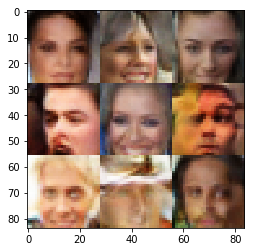

Epoch 5/10 - Batch 2510/3165 train_loss_d: 1.2586, train_loss_g: 0.9637
Epoch 5/10 - Batch 2520/3165 train_loss_d: 1.1842, train_loss_g: 1.0664
Epoch 5/10 - Batch 2530/3165 train_loss_d: 1.3150, train_loss_g: 0.8257
Epoch 5/10 - Batch 2540/3165 train_loss_d: 1.2124, train_loss_g: 0.9039
Epoch 5/10 - Batch 2550/3165 train_loss_d: 1.2851, train_loss_g: 1.1533
Epoch 5/10 - Batch 2560/3165 train_loss_d: 1.0605, train_loss_g: 0.9653
Epoch 5/10 - Batch 2570/3165 train_loss_d: 1.3799, train_loss_g: 0.5503
Epoch 5/10 - Batch 2580/3165 train_loss_d: 1.1382, train_loss_g: 1.4880
Epoch 5/10 - Batch 2590/3165 train_loss_d: 1.2026, train_loss_g: 0.9772
Epoch 5/10 - Batch 2600/3165 train_loss_d: 1.0873, train_loss_g: 1.1504
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_154/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_154/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_154/Maximum_2:0", sha

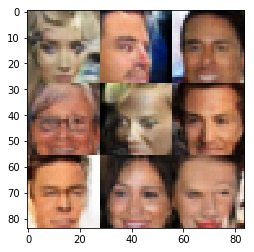

Epoch 5/10 - Batch 2610/3165 train_loss_d: 1.1104, train_loss_g: 1.0334
Epoch 5/10 - Batch 2620/3165 train_loss_d: 0.9987, train_loss_g: 1.0890
Epoch 5/10 - Batch 2630/3165 train_loss_d: 1.2214, train_loss_g: 0.7024
Epoch 5/10 - Batch 2640/3165 train_loss_d: 0.9745, train_loss_g: 1.2143
Epoch 5/10 - Batch 2650/3165 train_loss_d: 1.0236, train_loss_g: 0.9214
Epoch 5/10 - Batch 2660/3165 train_loss_d: 1.0094, train_loss_g: 1.2056
Epoch 5/10 - Batch 2670/3165 train_loss_d: 1.0882, train_loss_g: 0.9325
Epoch 5/10 - Batch 2680/3165 train_loss_d: 1.3630, train_loss_g: 0.5451
Epoch 5/10 - Batch 2690/3165 train_loss_d: 1.2422, train_loss_g: 0.8608
Epoch 5/10 - Batch 2700/3165 train_loss_d: 1.3856, train_loss_g: 1.3912
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_155/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_155/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_155/Maximum_2:0", sha

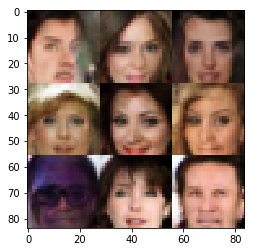

Epoch 5/10 - Batch 2710/3165 train_loss_d: 1.1217, train_loss_g: 0.7390
Epoch 5/10 - Batch 2720/3165 train_loss_d: 1.0579, train_loss_g: 0.9041
Epoch 5/10 - Batch 2730/3165 train_loss_d: 1.4242, train_loss_g: 0.5485
Epoch 5/10 - Batch 2740/3165 train_loss_d: 1.3835, train_loss_g: 0.5212
Epoch 5/10 - Batch 2750/3165 train_loss_d: 1.3739, train_loss_g: 0.5429
Epoch 5/10 - Batch 2760/3165 train_loss_d: 1.1000, train_loss_g: 0.8859
Epoch 5/10 - Batch 2770/3165 train_loss_d: 1.4629, train_loss_g: 0.4502
Epoch 5/10 - Batch 2780/3165 train_loss_d: 1.0359, train_loss_g: 1.1094
Epoch 5/10 - Batch 2790/3165 train_loss_d: 1.2625, train_loss_g: 0.6823
Epoch 5/10 - Batch 2800/3165 train_loss_d: 1.2315, train_loss_g: 0.8633
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_156/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_156/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_156/Maximum_2:0", sha

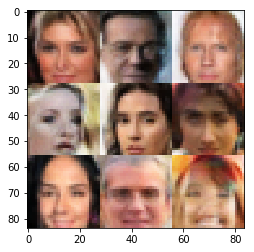

Epoch 5/10 - Batch 2810/3165 train_loss_d: 1.5196, train_loss_g: 0.4469
Epoch 5/10 - Batch 2820/3165 train_loss_d: 1.0638, train_loss_g: 0.8670
Epoch 5/10 - Batch 2830/3165 train_loss_d: 1.1616, train_loss_g: 1.6062
Epoch 5/10 - Batch 2840/3165 train_loss_d: 1.2605, train_loss_g: 0.8220
Epoch 5/10 - Batch 2850/3165 train_loss_d: 1.3052, train_loss_g: 0.6836
Epoch 5/10 - Batch 2860/3165 train_loss_d: 1.2880, train_loss_g: 0.8614
Epoch 5/10 - Batch 2870/3165 train_loss_d: 1.3091, train_loss_g: 1.2834
Epoch 5/10 - Batch 2880/3165 train_loss_d: 1.2493, train_loss_g: 0.6609
Epoch 5/10 - Batch 2890/3165 train_loss_d: 1.3117, train_loss_g: 0.5869
Epoch 5/10 - Batch 2900/3165 train_loss_d: 1.1545, train_loss_g: 0.8976
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_157/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_157/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_157/Maximum_2:0", sha

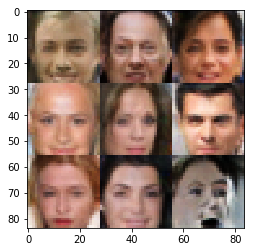

Epoch 5/10 - Batch 2910/3165 train_loss_d: 1.3777, train_loss_g: 0.5246
Epoch 5/10 - Batch 2920/3165 train_loss_d: 1.1613, train_loss_g: 0.9451
Epoch 5/10 - Batch 2930/3165 train_loss_d: 1.1878, train_loss_g: 0.7782
Epoch 5/10 - Batch 2940/3165 train_loss_d: 1.1946, train_loss_g: 0.8720
Epoch 5/10 - Batch 2950/3165 train_loss_d: 1.2828, train_loss_g: 0.9539
Epoch 5/10 - Batch 2960/3165 train_loss_d: 1.0721, train_loss_g: 0.8726
Epoch 5/10 - Batch 2970/3165 train_loss_d: 0.9840, train_loss_g: 1.0257
Epoch 5/10 - Batch 2980/3165 train_loss_d: 1.1362, train_loss_g: 0.8824
Epoch 5/10 - Batch 2990/3165 train_loss_d: 1.0778, train_loss_g: 0.9638
Epoch 5/10 - Batch 3000/3165 train_loss_d: 1.0303, train_loss_g: 1.1030
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_158/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_158/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_158/Maximum_2:0", sha

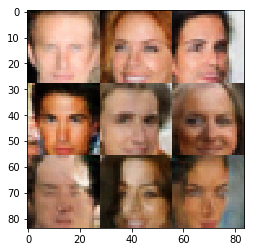

Epoch 5/10 - Batch 3010/3165 train_loss_d: 1.0757, train_loss_g: 1.2038
Epoch 5/10 - Batch 3020/3165 train_loss_d: 1.1274, train_loss_g: 1.3596
Epoch 5/10 - Batch 3030/3165 train_loss_d: 1.2301, train_loss_g: 0.6712
Epoch 5/10 - Batch 3040/3165 train_loss_d: 1.1069, train_loss_g: 0.8509
Epoch 5/10 - Batch 3050/3165 train_loss_d: 1.2780, train_loss_g: 0.6598
Epoch 5/10 - Batch 3060/3165 train_loss_d: 1.0225, train_loss_g: 1.1804
Epoch 5/10 - Batch 3070/3165 train_loss_d: 1.2110, train_loss_g: 0.7005
Epoch 5/10 - Batch 3080/3165 train_loss_d: 1.1468, train_loss_g: 0.7461
Epoch 5/10 - Batch 3090/3165 train_loss_d: 1.2778, train_loss_g: 0.6018
Epoch 5/10 - Batch 3100/3165 train_loss_d: 1.1205, train_loss_g: 1.4644
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_159/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_159/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_159/Maximum_2:0", sha

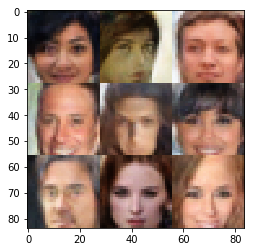

Epoch 5/10 - Batch 3110/3165 train_loss_d: 1.4710, train_loss_g: 0.4724
Epoch 5/10 - Batch 3120/3165 train_loss_d: 1.0450, train_loss_g: 1.2886
Epoch 5/10 - Batch 3130/3165 train_loss_d: 0.9904, train_loss_g: 1.3528
Epoch 5/10 - Batch 3140/3165 train_loss_d: 1.1521, train_loss_g: 0.7934
Epoch 5/10 - Batch 3150/3165 train_loss_d: 1.1701, train_loss_g: 0.6902
Epoch 5/10 - Batch 3160/3165 train_loss_d: 1.1962, train_loss_g: 0.8057
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_160/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_160/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_160/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_160/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


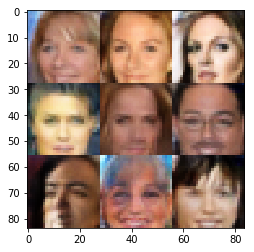


 50%|█████     | 5/10 [3:41:10<3:42:45, 2673.16s/it]

Epoch 6/10 - Batch 10/3165 train_loss_d: 1.1857, train_loss_g: 1.4316
Epoch 6/10 - Batch 20/3165 train_loss_d: 1.1417, train_loss_g: 0.7621
Epoch 6/10 - Batch 30/3165 train_loss_d: 1.3294, train_loss_g: 0.5515
Epoch 6/10 - Batch 40/3165 train_loss_d: 1.1598, train_loss_g: 0.8465
Epoch 6/10 - Batch 50/3165 train_loss_d: 0.9715, train_loss_g: 1.0083
Epoch 6/10 - Batch 60/3165 train_loss_d: 1.3720, train_loss_g: 0.6078
Epoch 6/10 - Batch 70/3165 train_loss_d: 1.0994, train_loss_g: 0.8344
Epoch 6/10 - Batch 80/3165 train_loss_d: 1.2083, train_loss_g: 1.0059
Epoch 6/10 - Batch 90/3165 train_loss_d: 1.2687, train_loss_g: 0.6611
Epoch 6/10 - Batch 100/3165 train_loss_d: 1.3376, train_loss_g: 0.5841
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_161/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_161/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_161/Maximum_2:0", shape=(?, 28, 28, 128)

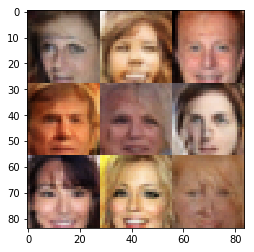

Epoch 6/10 - Batch 110/3165 train_loss_d: 1.4098, train_loss_g: 0.5012
Epoch 6/10 - Batch 120/3165 train_loss_d: 1.3464, train_loss_g: 0.7996
Epoch 6/10 - Batch 130/3165 train_loss_d: 1.0730, train_loss_g: 1.2323
Epoch 6/10 - Batch 140/3165 train_loss_d: 1.1565, train_loss_g: 0.7956
Epoch 6/10 - Batch 150/3165 train_loss_d: 1.3767, train_loss_g: 0.5439
Epoch 6/10 - Batch 160/3165 train_loss_d: 1.2742, train_loss_g: 0.7395
Epoch 6/10 - Batch 170/3165 train_loss_d: 1.1342, train_loss_g: 0.9605
Epoch 6/10 - Batch 180/3165 train_loss_d: 1.1373, train_loss_g: 0.8750
Epoch 6/10 - Batch 190/3165 train_loss_d: 1.0341, train_loss_g: 1.2549
Epoch 6/10 - Batch 200/3165 train_loss_d: 1.1580, train_loss_g: 0.7568
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_162/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_162/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_162/Maximum_2:0", shape=(?, 28,

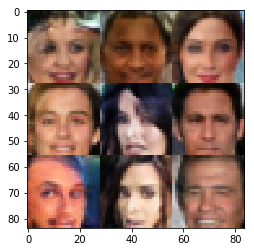

Epoch 6/10 - Batch 210/3165 train_loss_d: 1.0291, train_loss_g: 0.9677
Epoch 6/10 - Batch 220/3165 train_loss_d: 1.2475, train_loss_g: 0.6880
Epoch 6/10 - Batch 230/3165 train_loss_d: 1.1879, train_loss_g: 1.1441
Epoch 6/10 - Batch 240/3165 train_loss_d: 0.9656, train_loss_g: 1.1279
Epoch 6/10 - Batch 250/3165 train_loss_d: 1.0724, train_loss_g: 1.0093
Epoch 6/10 - Batch 260/3165 train_loss_d: 1.3544, train_loss_g: 0.5456
Epoch 6/10 - Batch 270/3165 train_loss_d: 1.5184, train_loss_g: 1.4195
Epoch 6/10 - Batch 280/3165 train_loss_d: 1.0634, train_loss_g: 1.1036
Epoch 6/10 - Batch 290/3165 train_loss_d: 0.9925, train_loss_g: 1.1136
Epoch 6/10 - Batch 300/3165 train_loss_d: 1.1348, train_loss_g: 0.9754
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_163/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_163/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_163/Maximum_2:0", shape=(?, 28,

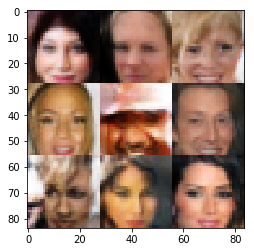

Epoch 6/10 - Batch 310/3165 train_loss_d: 1.2852, train_loss_g: 0.6366
Epoch 6/10 - Batch 320/3165 train_loss_d: 1.0788, train_loss_g: 0.9005
Epoch 6/10 - Batch 330/3165 train_loss_d: 1.1799, train_loss_g: 1.0404
Epoch 6/10 - Batch 340/3165 train_loss_d: 1.2512, train_loss_g: 0.7373
Epoch 6/10 - Batch 350/3165 train_loss_d: 0.9471, train_loss_g: 0.9801
Epoch 6/10 - Batch 360/3165 train_loss_d: 0.9959, train_loss_g: 0.9847
Epoch 6/10 - Batch 370/3165 train_loss_d: 1.5676, train_loss_g: 0.4338
Epoch 6/10 - Batch 380/3165 train_loss_d: 0.9842, train_loss_g: 1.0248
Epoch 6/10 - Batch 390/3165 train_loss_d: 1.1828, train_loss_g: 0.9009
Epoch 6/10 - Batch 400/3165 train_loss_d: 0.9906, train_loss_g: 1.0217
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_164/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_164/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_164/Maximum_2:0", shape=(?, 28,

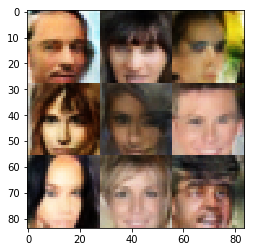

Epoch 6/10 - Batch 410/3165 train_loss_d: 1.1758, train_loss_g: 0.9003
Epoch 6/10 - Batch 420/3165 train_loss_d: 1.3246, train_loss_g: 0.5980
Epoch 6/10 - Batch 430/3165 train_loss_d: 1.8595, train_loss_g: 0.2989
Epoch 6/10 - Batch 440/3165 train_loss_d: 1.0641, train_loss_g: 0.9581
Epoch 6/10 - Batch 450/3165 train_loss_d: 1.4004, train_loss_g: 0.5272
Epoch 6/10 - Batch 460/3165 train_loss_d: 1.0523, train_loss_g: 0.8184
Epoch 6/10 - Batch 470/3165 train_loss_d: 0.9983, train_loss_g: 0.9476
Epoch 6/10 - Batch 480/3165 train_loss_d: 1.2580, train_loss_g: 0.7110
Epoch 6/10 - Batch 490/3165 train_loss_d: 1.1691, train_loss_g: 1.4718
Epoch 6/10 - Batch 500/3165 train_loss_d: 1.2036, train_loss_g: 0.9813
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_165/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_165/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_165/Maximum_2:0", shape=(?, 28,

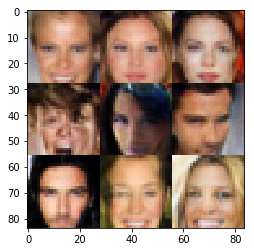

Epoch 6/10 - Batch 510/3165 train_loss_d: 1.2369, train_loss_g: 0.7362
Epoch 6/10 - Batch 520/3165 train_loss_d: 1.1607, train_loss_g: 0.8685
Epoch 6/10 - Batch 530/3165 train_loss_d: 1.1155, train_loss_g: 0.9605
Epoch 6/10 - Batch 540/3165 train_loss_d: 1.2981, train_loss_g: 1.1412
Epoch 6/10 - Batch 550/3165 train_loss_d: 1.4783, train_loss_g: 0.4628
Epoch 6/10 - Batch 560/3165 train_loss_d: 1.1603, train_loss_g: 1.1987
Epoch 6/10 - Batch 570/3165 train_loss_d: 1.1953, train_loss_g: 1.8241
Epoch 6/10 - Batch 580/3165 train_loss_d: 0.9732, train_loss_g: 0.9745
Epoch 6/10 - Batch 590/3165 train_loss_d: 1.1492, train_loss_g: 0.9144
Epoch 6/10 - Batch 600/3165 train_loss_d: 1.3991, train_loss_g: 0.4895
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_166/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_166/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_166/Maximum_2:0", shape=(?, 28,

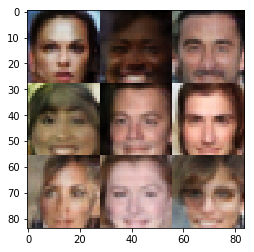

Epoch 6/10 - Batch 610/3165 train_loss_d: 1.1817, train_loss_g: 0.9583
Epoch 6/10 - Batch 620/3165 train_loss_d: 1.3812, train_loss_g: 0.5436
Epoch 6/10 - Batch 630/3165 train_loss_d: 1.1956, train_loss_g: 0.7120
Epoch 6/10 - Batch 640/3165 train_loss_d: 1.0001, train_loss_g: 0.9389
Epoch 6/10 - Batch 650/3165 train_loss_d: 1.1575, train_loss_g: 0.7238
Epoch 6/10 - Batch 660/3165 train_loss_d: 0.9885, train_loss_g: 1.0551
Epoch 6/10 - Batch 670/3165 train_loss_d: 1.4149, train_loss_g: 0.5197
Epoch 6/10 - Batch 680/3165 train_loss_d: 1.2649, train_loss_g: 0.6429
Epoch 6/10 - Batch 690/3165 train_loss_d: 1.4749, train_loss_g: 0.4617
Epoch 6/10 - Batch 700/3165 train_loss_d: 1.2576, train_loss_g: 1.0524
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_167/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_167/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_167/Maximum_2:0", shape=(?, 28,

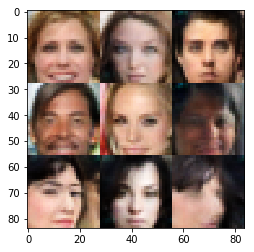

Epoch 6/10 - Batch 710/3165 train_loss_d: 0.9815, train_loss_g: 1.1062
Epoch 6/10 - Batch 720/3165 train_loss_d: 0.8159, train_loss_g: 1.2096
Epoch 6/10 - Batch 730/3165 train_loss_d: 1.0279, train_loss_g: 1.1562
Epoch 6/10 - Batch 740/3165 train_loss_d: 1.2504, train_loss_g: 0.9444
Epoch 6/10 - Batch 750/3165 train_loss_d: 1.6250, train_loss_g: 0.4012
Epoch 6/10 - Batch 760/3165 train_loss_d: 1.3649, train_loss_g: 0.6269
Epoch 6/10 - Batch 770/3165 train_loss_d: 1.1460, train_loss_g: 1.2056
Epoch 6/10 - Batch 780/3165 train_loss_d: 0.9870, train_loss_g: 1.1713
Epoch 6/10 - Batch 790/3165 train_loss_d: 1.2567, train_loss_g: 0.9522
Epoch 6/10 - Batch 800/3165 train_loss_d: 1.1067, train_loss_g: 0.7219
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_168/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_168/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_168/Maximum_2:0", shape=(?, 28,

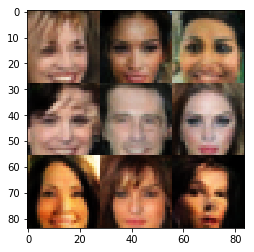

Epoch 6/10 - Batch 810/3165 train_loss_d: 1.0394, train_loss_g: 1.0558
Epoch 6/10 - Batch 820/3165 train_loss_d: 1.4938, train_loss_g: 1.8194
Epoch 6/10 - Batch 830/3165 train_loss_d: 1.0407, train_loss_g: 1.1445
Epoch 6/10 - Batch 840/3165 train_loss_d: 1.0023, train_loss_g: 0.9495
Epoch 6/10 - Batch 850/3165 train_loss_d: 1.0844, train_loss_g: 1.0032
Epoch 6/10 - Batch 860/3165 train_loss_d: 1.1967, train_loss_g: 0.7252
Epoch 6/10 - Batch 870/3165 train_loss_d: 1.1043, train_loss_g: 0.8716
Epoch 6/10 - Batch 880/3165 train_loss_d: 0.9727, train_loss_g: 1.1175
Epoch 6/10 - Batch 890/3165 train_loss_d: 1.1772, train_loss_g: 0.7726
Epoch 6/10 - Batch 900/3165 train_loss_d: 1.3082, train_loss_g: 0.6612
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_169/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_169/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_169/Maximum_2:0", shape=(?, 28,

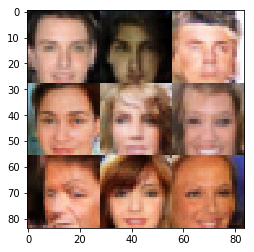

Epoch 6/10 - Batch 910/3165 train_loss_d: 1.0872, train_loss_g: 0.8346
Epoch 6/10 - Batch 920/3165 train_loss_d: 1.1942, train_loss_g: 0.7137
Epoch 6/10 - Batch 930/3165 train_loss_d: 1.1016, train_loss_g: 0.7841
Epoch 6/10 - Batch 940/3165 train_loss_d: 1.3177, train_loss_g: 0.7137
Epoch 6/10 - Batch 950/3165 train_loss_d: 1.2456, train_loss_g: 0.6078
Epoch 6/10 - Batch 960/3165 train_loss_d: 0.9265, train_loss_g: 1.1703
Epoch 6/10 - Batch 970/3165 train_loss_d: 1.2470, train_loss_g: 0.5969
Epoch 6/10 - Batch 980/3165 train_loss_d: 1.2023, train_loss_g: 0.6858
Epoch 6/10 - Batch 990/3165 train_loss_d: 1.0914, train_loss_g: 0.8234
Epoch 6/10 - Batch 1000/3165 train_loss_d: 1.3494, train_loss_g: 0.5531
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_170/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_170/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_170/Maximum_2:0", shape=(?, 28

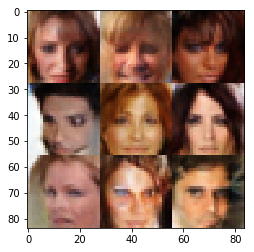

Epoch 6/10 - Batch 1010/3165 train_loss_d: 1.3517, train_loss_g: 0.5476
Epoch 6/10 - Batch 1020/3165 train_loss_d: 1.1679, train_loss_g: 0.7071
Epoch 6/10 - Batch 1030/3165 train_loss_d: 1.0458, train_loss_g: 0.8623
Epoch 6/10 - Batch 1040/3165 train_loss_d: 1.1511, train_loss_g: 1.1545
Epoch 6/10 - Batch 1050/3165 train_loss_d: 1.1913, train_loss_g: 0.7616
Epoch 6/10 - Batch 1060/3165 train_loss_d: 1.3443, train_loss_g: 0.6333
Epoch 6/10 - Batch 1070/3165 train_loss_d: 1.1944, train_loss_g: 0.7248
Epoch 6/10 - Batch 1080/3165 train_loss_d: 0.9015, train_loss_g: 1.2340
Epoch 6/10 - Batch 1090/3165 train_loss_d: 1.1072, train_loss_g: 0.9645
Epoch 6/10 - Batch 1100/3165 train_loss_d: 1.1381, train_loss_g: 0.7491
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_171/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_171/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_171/Maximum_2:0", sha

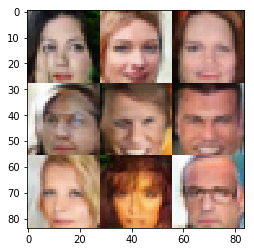

Epoch 6/10 - Batch 1110/3165 train_loss_d: 1.1205, train_loss_g: 0.8181
Epoch 6/10 - Batch 1120/3165 train_loss_d: 1.0856, train_loss_g: 1.4918
Epoch 6/10 - Batch 1130/3165 train_loss_d: 0.9204, train_loss_g: 1.2437
Epoch 6/10 - Batch 1140/3165 train_loss_d: 0.9538, train_loss_g: 1.0402
Epoch 6/10 - Batch 1150/3165 train_loss_d: 1.1689, train_loss_g: 0.8492
Epoch 6/10 - Batch 1160/3165 train_loss_d: 1.0772, train_loss_g: 0.7472
Epoch 6/10 - Batch 1170/3165 train_loss_d: 1.1638, train_loss_g: 0.7173
Epoch 6/10 - Batch 1180/3165 train_loss_d: 1.0857, train_loss_g: 0.9321
Epoch 6/10 - Batch 1190/3165 train_loss_d: 1.1184, train_loss_g: 0.9179
Epoch 6/10 - Batch 1200/3165 train_loss_d: 1.1254, train_loss_g: 0.9002
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_172/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_172/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_172/Maximum_2:0", sha

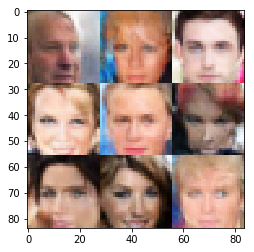

Epoch 6/10 - Batch 1210/3165 train_loss_d: 1.0973, train_loss_g: 1.5396
Epoch 6/10 - Batch 1220/3165 train_loss_d: 1.0889, train_loss_g: 0.8365
Epoch 6/10 - Batch 1230/3165 train_loss_d: 1.3168, train_loss_g: 0.5903
Epoch 6/10 - Batch 1240/3165 train_loss_d: 1.4682, train_loss_g: 0.4734
Epoch 6/10 - Batch 1250/3165 train_loss_d: 1.1545, train_loss_g: 0.7693
Epoch 6/10 - Batch 1260/3165 train_loss_d: 1.1037, train_loss_g: 0.8155
Epoch 6/10 - Batch 1270/3165 train_loss_d: 1.2403, train_loss_g: 0.6960
Epoch 6/10 - Batch 1280/3165 train_loss_d: 1.0065, train_loss_g: 0.8599
Epoch 6/10 - Batch 1290/3165 train_loss_d: 1.1235, train_loss_g: 0.7564
Epoch 6/10 - Batch 1300/3165 train_loss_d: 1.0216, train_loss_g: 1.9150
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_173/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_173/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_173/Maximum_2:0", sha

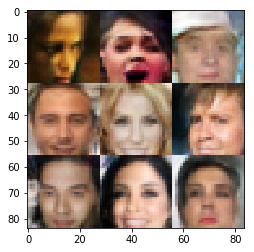

Epoch 6/10 - Batch 1310/3165 train_loss_d: 1.1062, train_loss_g: 0.8014
Epoch 6/10 - Batch 1320/3165 train_loss_d: 1.3350, train_loss_g: 0.6349
Epoch 6/10 - Batch 1330/3165 train_loss_d: 1.1950, train_loss_g: 0.8080
Epoch 6/10 - Batch 1340/3165 train_loss_d: 1.0345, train_loss_g: 1.3022
Epoch 6/10 - Batch 1350/3165 train_loss_d: 1.2339, train_loss_g: 0.7814
Epoch 6/10 - Batch 1360/3165 train_loss_d: 1.1134, train_loss_g: 1.1825
Epoch 6/10 - Batch 1370/3165 train_loss_d: 1.2267, train_loss_g: 0.6364
Epoch 6/10 - Batch 1380/3165 train_loss_d: 0.9154, train_loss_g: 1.0839
Epoch 6/10 - Batch 1390/3165 train_loss_d: 1.3729, train_loss_g: 0.5835
Epoch 6/10 - Batch 1400/3165 train_loss_d: 1.1505, train_loss_g: 0.8922
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_174/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_174/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_174/Maximum_2:0", sha

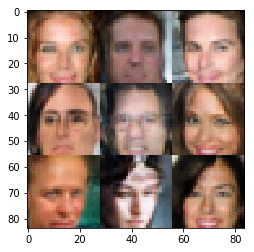

Epoch 6/10 - Batch 1410/3165 train_loss_d: 1.8020, train_loss_g: 0.3011
Epoch 6/10 - Batch 1420/3165 train_loss_d: 1.3179, train_loss_g: 0.6168
Epoch 6/10 - Batch 1430/3165 train_loss_d: 1.1211, train_loss_g: 0.7554
Epoch 6/10 - Batch 1440/3165 train_loss_d: 1.2036, train_loss_g: 0.6601
Epoch 6/10 - Batch 1450/3165 train_loss_d: 1.2821, train_loss_g: 0.6194
Epoch 6/10 - Batch 1460/3165 train_loss_d: 1.2941, train_loss_g: 0.6271
Epoch 6/10 - Batch 1470/3165 train_loss_d: 1.2713, train_loss_g: 0.5750
Epoch 6/10 - Batch 1480/3165 train_loss_d: 1.4187, train_loss_g: 0.4878
Epoch 6/10 - Batch 1490/3165 train_loss_d: 1.0574, train_loss_g: 0.9144
Epoch 6/10 - Batch 1500/3165 train_loss_d: 0.9780, train_loss_g: 1.0447
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_175/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_175/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_175/Maximum_2:0", sha

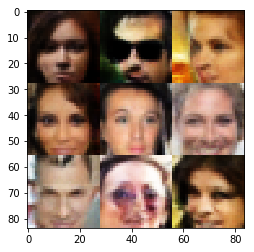

Epoch 6/10 - Batch 1510/3165 train_loss_d: 1.1774, train_loss_g: 0.6979
Epoch 6/10 - Batch 1520/3165 train_loss_d: 1.5104, train_loss_g: 0.4509
Epoch 6/10 - Batch 1530/3165 train_loss_d: 1.0969, train_loss_g: 0.7669
Epoch 6/10 - Batch 1540/3165 train_loss_d: 1.0234, train_loss_g: 0.9288
Epoch 6/10 - Batch 1550/3165 train_loss_d: 1.3103, train_loss_g: 0.6411
Epoch 6/10 - Batch 1560/3165 train_loss_d: 1.1496, train_loss_g: 0.7495
Epoch 6/10 - Batch 1570/3165 train_loss_d: 1.1897, train_loss_g: 0.8439
Epoch 6/10 - Batch 1580/3165 train_loss_d: 0.9901, train_loss_g: 0.9410
Epoch 6/10 - Batch 1590/3165 train_loss_d: 1.2984, train_loss_g: 1.1011
Epoch 6/10 - Batch 1600/3165 train_loss_d: 1.3163, train_loss_g: 0.5822
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_176/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_176/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_176/Maximum_2:0", sha

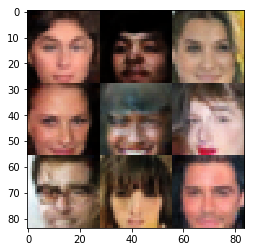

Epoch 6/10 - Batch 1610/3165 train_loss_d: 1.1596, train_loss_g: 0.8968
Epoch 6/10 - Batch 1620/3165 train_loss_d: 1.0006, train_loss_g: 1.2310
Epoch 6/10 - Batch 1630/3165 train_loss_d: 1.0033, train_loss_g: 1.0925
Epoch 6/10 - Batch 1640/3165 train_loss_d: 0.9577, train_loss_g: 0.9935
Epoch 6/10 - Batch 1650/3165 train_loss_d: 1.1511, train_loss_g: 0.9001
Epoch 6/10 - Batch 1660/3165 train_loss_d: 1.1181, train_loss_g: 0.7477
Epoch 6/10 - Batch 1670/3165 train_loss_d: 0.9230, train_loss_g: 1.2364
Epoch 6/10 - Batch 1680/3165 train_loss_d: 1.2789, train_loss_g: 0.5930
Epoch 6/10 - Batch 1690/3165 train_loss_d: 1.2694, train_loss_g: 0.6666
Epoch 6/10 - Batch 1700/3165 train_loss_d: 1.1745, train_loss_g: 1.0419
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_177/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_177/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_177/Maximum_2:0", sha

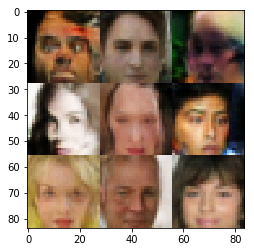

Epoch 6/10 - Batch 1710/3165 train_loss_d: 1.1371, train_loss_g: 0.8297
Epoch 6/10 - Batch 1720/3165 train_loss_d: 1.0364, train_loss_g: 1.8095
Epoch 6/10 - Batch 1730/3165 train_loss_d: 1.0444, train_loss_g: 0.9057
Epoch 6/10 - Batch 1740/3165 train_loss_d: 1.0424, train_loss_g: 1.6494
Epoch 6/10 - Batch 1750/3165 train_loss_d: 1.1071, train_loss_g: 0.7696
Epoch 6/10 - Batch 1760/3165 train_loss_d: 1.2160, train_loss_g: 0.9370
Epoch 6/10 - Batch 1770/3165 train_loss_d: 0.9805, train_loss_g: 0.8712
Epoch 6/10 - Batch 1780/3165 train_loss_d: 1.3706, train_loss_g: 0.5178
Epoch 6/10 - Batch 1790/3165 train_loss_d: 1.6205, train_loss_g: 0.3856
Epoch 6/10 - Batch 1800/3165 train_loss_d: 1.2902, train_loss_g: 0.5875
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_178/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_178/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_178/Maximum_2:0", sha

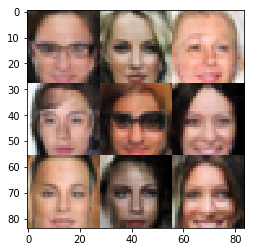

Epoch 6/10 - Batch 1810/3165 train_loss_d: 0.9707, train_loss_g: 0.9826
Epoch 6/10 - Batch 1820/3165 train_loss_d: 1.2648, train_loss_g: 1.7749
Epoch 6/10 - Batch 1830/3165 train_loss_d: 0.9263, train_loss_g: 1.2486
Epoch 6/10 - Batch 1840/3165 train_loss_d: 0.9687, train_loss_g: 0.8849
Epoch 6/10 - Batch 1850/3165 train_loss_d: 1.0737, train_loss_g: 0.8269
Epoch 6/10 - Batch 1860/3165 train_loss_d: 1.3304, train_loss_g: 0.6104
Epoch 6/10 - Batch 1870/3165 train_loss_d: 1.3400, train_loss_g: 1.1312
Epoch 6/10 - Batch 1880/3165 train_loss_d: 1.4056, train_loss_g: 0.5075
Epoch 6/10 - Batch 1890/3165 train_loss_d: 1.1215, train_loss_g: 1.2249
Epoch 6/10 - Batch 1900/3165 train_loss_d: 1.1921, train_loss_g: 0.7817
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_179/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_179/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_179/Maximum_2:0", sha

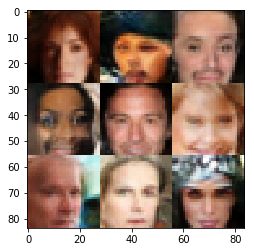

Epoch 6/10 - Batch 1910/3165 train_loss_d: 1.2320, train_loss_g: 1.4805
Epoch 6/10 - Batch 1920/3165 train_loss_d: 1.4272, train_loss_g: 0.5117
Epoch 6/10 - Batch 1930/3165 train_loss_d: 1.0691, train_loss_g: 1.0708
Epoch 6/10 - Batch 1940/3165 train_loss_d: 1.1076, train_loss_g: 0.9193
Epoch 6/10 - Batch 1950/3165 train_loss_d: 1.1817, train_loss_g: 0.7753
Epoch 6/10 - Batch 1960/3165 train_loss_d: 1.1629, train_loss_g: 0.7337
Epoch 6/10 - Batch 1970/3165 train_loss_d: 1.1387, train_loss_g: 0.9125
Epoch 6/10 - Batch 1980/3165 train_loss_d: 1.0937, train_loss_g: 0.8602
Epoch 6/10 - Batch 1990/3165 train_loss_d: 1.0760, train_loss_g: 0.8427
Epoch 6/10 - Batch 2000/3165 train_loss_d: 1.5046, train_loss_g: 0.4313
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_180/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_180/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_180/Maximum_2:0", sha

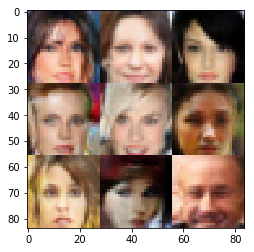

Epoch 6/10 - Batch 2010/3165 train_loss_d: 1.1444, train_loss_g: 1.3246
Epoch 6/10 - Batch 2020/3165 train_loss_d: 1.4191, train_loss_g: 0.5213
Epoch 6/10 - Batch 2030/3165 train_loss_d: 1.1123, train_loss_g: 0.7688
Epoch 6/10 - Batch 2040/3165 train_loss_d: 1.1297, train_loss_g: 1.1068
Epoch 6/10 - Batch 2050/3165 train_loss_d: 1.0007, train_loss_g: 0.9619
Epoch 6/10 - Batch 2060/3165 train_loss_d: 0.9017, train_loss_g: 1.3202
Epoch 6/10 - Batch 2070/3165 train_loss_d: 1.0994, train_loss_g: 0.9183
Epoch 6/10 - Batch 2080/3165 train_loss_d: 1.0783, train_loss_g: 1.7149
Epoch 6/10 - Batch 2090/3165 train_loss_d: 1.1043, train_loss_g: 1.2781
Epoch 6/10 - Batch 2100/3165 train_loss_d: 1.0899, train_loss_g: 0.9960
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_181/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_181/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_181/Maximum_2:0", sha

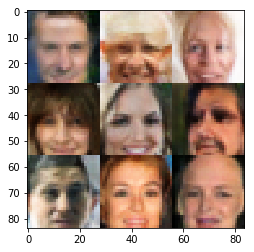

Epoch 6/10 - Batch 2110/3165 train_loss_d: 0.9368, train_loss_g: 1.3848
Epoch 6/10 - Batch 2120/3165 train_loss_d: 1.1199, train_loss_g: 1.7233
Epoch 6/10 - Batch 2130/3165 train_loss_d: 1.0550, train_loss_g: 1.3443
Epoch 6/10 - Batch 2140/3165 train_loss_d: 1.2591, train_loss_g: 0.6125
Epoch 6/10 - Batch 2150/3165 train_loss_d: 1.1524, train_loss_g: 0.7995
Epoch 6/10 - Batch 2160/3165 train_loss_d: 1.0628, train_loss_g: 0.9080
Epoch 6/10 - Batch 2170/3165 train_loss_d: 0.9921, train_loss_g: 0.9613
Epoch 6/10 - Batch 2180/3165 train_loss_d: 1.1511, train_loss_g: 0.8957
Epoch 6/10 - Batch 2190/3165 train_loss_d: 1.1606, train_loss_g: 1.9276
Epoch 6/10 - Batch 2200/3165 train_loss_d: 1.2683, train_loss_g: 0.5647
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_182/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_182/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_182/Maximum_2:0", sha

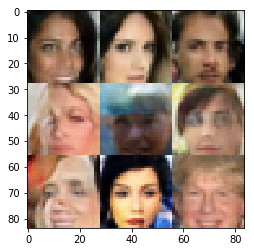

Epoch 6/10 - Batch 2210/3165 train_loss_d: 1.3287, train_loss_g: 0.6149
Epoch 6/10 - Batch 2220/3165 train_loss_d: 1.2077, train_loss_g: 0.6698
Epoch 6/10 - Batch 2230/3165 train_loss_d: 1.0701, train_loss_g: 1.1201
Epoch 6/10 - Batch 2240/3165 train_loss_d: 1.1067, train_loss_g: 0.8769
Epoch 6/10 - Batch 2250/3165 train_loss_d: 1.2719, train_loss_g: 0.5880
Epoch 6/10 - Batch 2260/3165 train_loss_d: 0.8544, train_loss_g: 1.3336
Epoch 6/10 - Batch 2270/3165 train_loss_d: 1.1018, train_loss_g: 0.8217
Epoch 6/10 - Batch 2280/3165 train_loss_d: 1.3441, train_loss_g: 0.5441
Epoch 6/10 - Batch 2290/3165 train_loss_d: 1.1063, train_loss_g: 0.8091
Epoch 6/10 - Batch 2300/3165 train_loss_d: 1.2241, train_loss_g: 0.6640
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_183/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_183/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_183/Maximum_2:0", sha

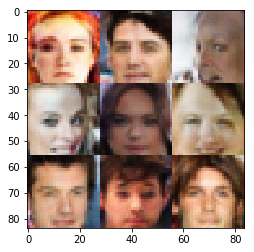

Epoch 6/10 - Batch 2310/3165 train_loss_d: 1.1810, train_loss_g: 0.7856
Epoch 6/10 - Batch 2320/3165 train_loss_d: 1.1423, train_loss_g: 0.7660
Epoch 6/10 - Batch 2330/3165 train_loss_d: 1.2239, train_loss_g: 0.6654
Epoch 6/10 - Batch 2340/3165 train_loss_d: 1.1348, train_loss_g: 0.8434
Epoch 6/10 - Batch 2350/3165 train_loss_d: 1.2397, train_loss_g: 1.4116
Epoch 6/10 - Batch 2360/3165 train_loss_d: 0.9895, train_loss_g: 1.0146
Epoch 6/10 - Batch 2370/3165 train_loss_d: 1.0241, train_loss_g: 1.4701
Epoch 6/10 - Batch 2380/3165 train_loss_d: 1.2052, train_loss_g: 0.6629
Epoch 6/10 - Batch 2390/3165 train_loss_d: 1.1221, train_loss_g: 0.9029
Epoch 6/10 - Batch 2400/3165 train_loss_d: 1.1930, train_loss_g: 1.1124
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_184/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_184/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_184/Maximum_2:0", sha

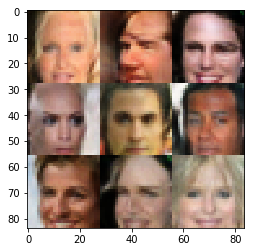

Epoch 6/10 - Batch 2410/3165 train_loss_d: 0.9697, train_loss_g: 1.3936
Epoch 6/10 - Batch 2420/3165 train_loss_d: 1.0408, train_loss_g: 0.8795
Epoch 6/10 - Batch 2430/3165 train_loss_d: 0.9432, train_loss_g: 0.9517
Epoch 6/10 - Batch 2440/3165 train_loss_d: 1.3696, train_loss_g: 0.5021
Epoch 6/10 - Batch 2450/3165 train_loss_d: 1.1147, train_loss_g: 1.4527
Epoch 6/10 - Batch 2460/3165 train_loss_d: 1.0134, train_loss_g: 1.1041
Epoch 6/10 - Batch 2470/3165 train_loss_d: 1.0920, train_loss_g: 0.8150
Epoch 6/10 - Batch 2480/3165 train_loss_d: 0.8948, train_loss_g: 1.1731
Epoch 6/10 - Batch 2490/3165 train_loss_d: 1.3230, train_loss_g: 0.7580
Epoch 6/10 - Batch 2500/3165 train_loss_d: 1.2079, train_loss_g: 0.7400
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_185/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_185/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_185/Maximum_2:0", sha

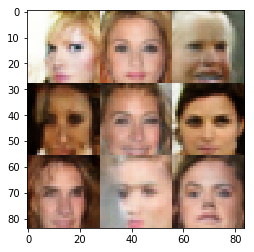

Epoch 6/10 - Batch 2510/3165 train_loss_d: 1.1456, train_loss_g: 0.8621
Epoch 6/10 - Batch 2520/3165 train_loss_d: 1.1568, train_loss_g: 0.7582
Epoch 6/10 - Batch 2530/3165 train_loss_d: 1.2204, train_loss_g: 0.9531
Epoch 6/10 - Batch 2540/3165 train_loss_d: 1.0689, train_loss_g: 0.9701
Epoch 6/10 - Batch 2550/3165 train_loss_d: 1.1308, train_loss_g: 1.2379
Epoch 6/10 - Batch 2560/3165 train_loss_d: 1.4189, train_loss_g: 0.5224
Epoch 6/10 - Batch 2570/3165 train_loss_d: 1.0822, train_loss_g: 0.8730
Epoch 6/10 - Batch 2580/3165 train_loss_d: 1.0562, train_loss_g: 1.0231
Epoch 6/10 - Batch 2590/3165 train_loss_d: 1.1889, train_loss_g: 1.2487
Epoch 6/10 - Batch 2600/3165 train_loss_d: 0.9627, train_loss_g: 1.1155
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_186/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_186/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_186/Maximum_2:0", sha

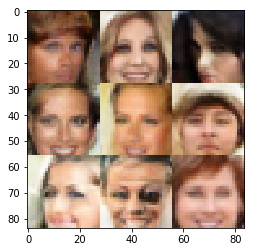

Epoch 6/10 - Batch 2610/3165 train_loss_d: 1.1359, train_loss_g: 0.7749
Epoch 6/10 - Batch 2620/3165 train_loss_d: 0.9375, train_loss_g: 1.1223
Epoch 6/10 - Batch 2630/3165 train_loss_d: 1.2322, train_loss_g: 0.8038
Epoch 6/10 - Batch 2640/3165 train_loss_d: 0.9333, train_loss_g: 1.0844
Epoch 6/10 - Batch 2650/3165 train_loss_d: 0.9513, train_loss_g: 1.0172
Epoch 6/10 - Batch 2660/3165 train_loss_d: 1.4801, train_loss_g: 1.1449
Epoch 6/10 - Batch 2670/3165 train_loss_d: 1.0933, train_loss_g: 0.7786
Epoch 6/10 - Batch 2680/3165 train_loss_d: 1.1057, train_loss_g: 0.7492
Epoch 6/10 - Batch 2690/3165 train_loss_d: 1.3377, train_loss_g: 0.5784
Epoch 6/10 - Batch 2700/3165 train_loss_d: 1.3441, train_loss_g: 1.1577
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_187/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_187/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_187/Maximum_2:0", sha

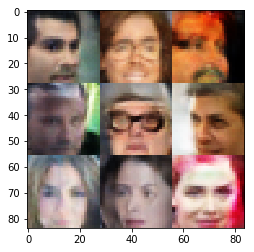

Epoch 6/10 - Batch 2710/3165 train_loss_d: 1.0230, train_loss_g: 0.8272
Epoch 6/10 - Batch 2720/3165 train_loss_d: 1.4554, train_loss_g: 0.4929
Epoch 6/10 - Batch 2730/3165 train_loss_d: 1.0826, train_loss_g: 0.8094
Epoch 6/10 - Batch 2740/3165 train_loss_d: 1.3374, train_loss_g: 0.5497
Epoch 6/10 - Batch 2750/3165 train_loss_d: 1.0941, train_loss_g: 0.7625
Epoch 6/10 - Batch 2760/3165 train_loss_d: 1.3262, train_loss_g: 0.5441
Epoch 6/10 - Batch 2770/3165 train_loss_d: 1.2467, train_loss_g: 0.6350
Epoch 6/10 - Batch 2780/3165 train_loss_d: 1.0948, train_loss_g: 0.7919
Epoch 6/10 - Batch 2790/3165 train_loss_d: 1.0940, train_loss_g: 0.8378
Epoch 6/10 - Batch 2800/3165 train_loss_d: 1.0310, train_loss_g: 0.9468
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_188/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_188/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_188/Maximum_2:0", sha

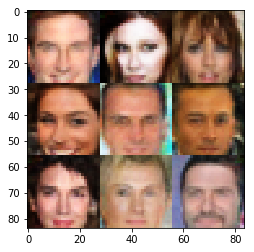

Epoch 6/10 - Batch 2810/3165 train_loss_d: 1.3069, train_loss_g: 0.5611
Epoch 6/10 - Batch 2820/3165 train_loss_d: 1.2131, train_loss_g: 0.6418
Epoch 6/10 - Batch 2830/3165 train_loss_d: 1.0445, train_loss_g: 1.7730
Epoch 6/10 - Batch 2840/3165 train_loss_d: 1.1557, train_loss_g: 0.8061
Epoch 6/10 - Batch 2850/3165 train_loss_d: 1.5458, train_loss_g: 0.5391
Epoch 6/10 - Batch 2860/3165 train_loss_d: 1.3321, train_loss_g: 0.5873
Epoch 6/10 - Batch 2870/3165 train_loss_d: 1.2387, train_loss_g: 1.3846
Epoch 6/10 - Batch 2880/3165 train_loss_d: 1.1715, train_loss_g: 0.7329
Epoch 6/10 - Batch 2890/3165 train_loss_d: 1.1724, train_loss_g: 0.7862
Epoch 6/10 - Batch 2900/3165 train_loss_d: 1.0917, train_loss_g: 0.8244
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_189/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_189/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_189/Maximum_2:0", sha

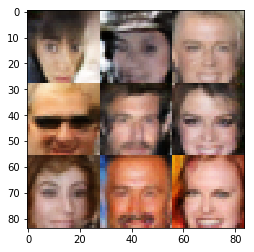

Epoch 6/10 - Batch 2910/3165 train_loss_d: 1.0227, train_loss_g: 1.2513
Epoch 6/10 - Batch 2920/3165 train_loss_d: 1.0926, train_loss_g: 0.7895
Epoch 6/10 - Batch 2930/3165 train_loss_d: 0.9613, train_loss_g: 1.1817
Epoch 6/10 - Batch 2940/3165 train_loss_d: 1.1802, train_loss_g: 0.7406
Epoch 6/10 - Batch 2950/3165 train_loss_d: 1.2953, train_loss_g: 0.5965
Epoch 6/10 - Batch 2960/3165 train_loss_d: 1.0398, train_loss_g: 0.8141
Epoch 6/10 - Batch 2970/3165 train_loss_d: 0.9083, train_loss_g: 1.3495
Epoch 6/10 - Batch 2980/3165 train_loss_d: 1.2633, train_loss_g: 0.6465
Epoch 6/10 - Batch 2990/3165 train_loss_d: 1.0062, train_loss_g: 0.8987
Epoch 6/10 - Batch 3000/3165 train_loss_d: 1.0805, train_loss_g: 0.9010
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_190/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_190/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_190/Maximum_2:0", sha

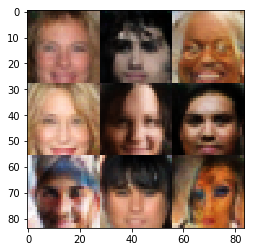

Epoch 6/10 - Batch 3010/3165 train_loss_d: 1.0986, train_loss_g: 1.2295
Epoch 6/10 - Batch 3020/3165 train_loss_d: 0.9816, train_loss_g: 0.9282
Epoch 6/10 - Batch 3030/3165 train_loss_d: 1.2306, train_loss_g: 0.6363
Epoch 6/10 - Batch 3040/3165 train_loss_d: 1.2089, train_loss_g: 0.6730
Epoch 6/10 - Batch 3050/3165 train_loss_d: 1.0100, train_loss_g: 1.4894
Epoch 6/10 - Batch 3060/3165 train_loss_d: 0.9841, train_loss_g: 1.0407
Epoch 6/10 - Batch 3070/3165 train_loss_d: 1.2514, train_loss_g: 0.6272
Epoch 6/10 - Batch 3080/3165 train_loss_d: 1.1291, train_loss_g: 0.7550
Epoch 6/10 - Batch 3090/3165 train_loss_d: 1.2282, train_loss_g: 0.6033
Epoch 6/10 - Batch 3100/3165 train_loss_d: 0.9573, train_loss_g: 1.0107
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_191/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_191/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_191/Maximum_2:0", sha

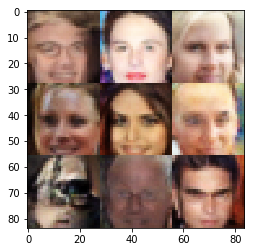

Epoch 6/10 - Batch 3110/3165 train_loss_d: 1.4109, train_loss_g: 0.5014
Epoch 6/10 - Batch 3120/3165 train_loss_d: 0.9044, train_loss_g: 1.2024
Epoch 6/10 - Batch 3130/3165 train_loss_d: 1.0973, train_loss_g: 0.8221
Epoch 6/10 - Batch 3140/3165 train_loss_d: 1.2637, train_loss_g: 0.6543
Epoch 6/10 - Batch 3150/3165 train_loss_d: 1.0686, train_loss_g: 0.9280
Epoch 6/10 - Batch 3160/3165 train_loss_d: 1.1348, train_loss_g: 1.3348
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_192/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_192/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_192/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_192/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


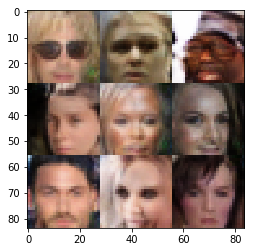


 60%|██████    | 6/10 [4:25:14<2:57:37, 2664.48s/it]

Epoch 7/10 - Batch 10/3165 train_loss_d: 1.0086, train_loss_g: 1.3152
Epoch 7/10 - Batch 20/3165 train_loss_d: 1.3886, train_loss_g: 0.5371
Epoch 7/10 - Batch 30/3165 train_loss_d: 0.9149, train_loss_g: 1.3047
Epoch 7/10 - Batch 40/3165 train_loss_d: 1.0713, train_loss_g: 0.9984
Epoch 7/10 - Batch 50/3165 train_loss_d: 0.9754, train_loss_g: 0.8790
Epoch 7/10 - Batch 60/3165 train_loss_d: 1.4040, train_loss_g: 0.5067
Epoch 7/10 - Batch 70/3165 train_loss_d: 1.0089, train_loss_g: 0.9870
Epoch 7/10 - Batch 80/3165 train_loss_d: 1.0659, train_loss_g: 0.9273
Epoch 7/10 - Batch 90/3165 train_loss_d: 1.3000, train_loss_g: 0.5980
Epoch 7/10 - Batch 100/3165 train_loss_d: 1.6011, train_loss_g: 0.3780
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_193/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_193/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_193/Maximum_2:0", shape=(?, 28, 28, 128)

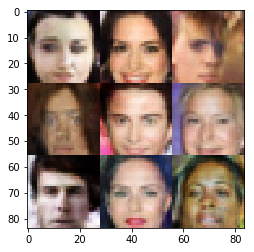

Epoch 7/10 - Batch 110/3165 train_loss_d: 1.2493, train_loss_g: 0.6223
Epoch 7/10 - Batch 120/3165 train_loss_d: 1.1079, train_loss_g: 1.4626
Epoch 7/10 - Batch 130/3165 train_loss_d: 1.2396, train_loss_g: 0.6814
Epoch 7/10 - Batch 140/3165 train_loss_d: 0.9104, train_loss_g: 1.2690
Epoch 7/10 - Batch 150/3165 train_loss_d: 1.4129, train_loss_g: 0.4920
Epoch 7/10 - Batch 160/3165 train_loss_d: 1.0656, train_loss_g: 0.9677
Epoch 7/10 - Batch 170/3165 train_loss_d: 1.1178, train_loss_g: 0.8756
Epoch 7/10 - Batch 180/3165 train_loss_d: 1.0239, train_loss_g: 1.0244
Epoch 7/10 - Batch 190/3165 train_loss_d: 0.9935, train_loss_g: 0.9080
Epoch 7/10 - Batch 200/3165 train_loss_d: 1.3362, train_loss_g: 0.6142
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_194/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_194/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_194/Maximum_2:0", shape=(?, 28,

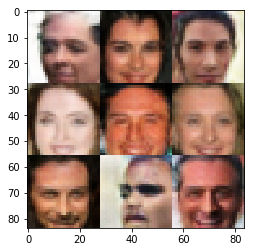

Epoch 7/10 - Batch 210/3165 train_loss_d: 1.0325, train_loss_g: 0.8183
Epoch 7/10 - Batch 220/3165 train_loss_d: 1.1182, train_loss_g: 0.7824
Epoch 7/10 - Batch 230/3165 train_loss_d: 1.1073, train_loss_g: 1.0715
Epoch 7/10 - Batch 240/3165 train_loss_d: 0.9039, train_loss_g: 1.5222
Epoch 7/10 - Batch 250/3165 train_loss_d: 1.0442, train_loss_g: 0.8132
Epoch 7/10 - Batch 260/3165 train_loss_d: 1.5629, train_loss_g: 0.4334
Epoch 7/10 - Batch 270/3165 train_loss_d: 0.9593, train_loss_g: 1.2015
Epoch 7/10 - Batch 280/3165 train_loss_d: 1.2110, train_loss_g: 0.6727
Epoch 7/10 - Batch 290/3165 train_loss_d: 1.1000, train_loss_g: 1.0023
Epoch 7/10 - Batch 300/3165 train_loss_d: 1.0943, train_loss_g: 1.0567
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_195/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_195/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_195/Maximum_2:0", shape=(?, 28,

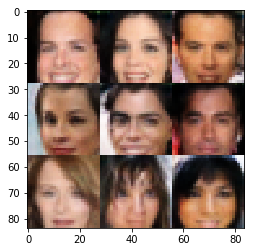

Epoch 7/10 - Batch 310/3165 train_loss_d: 1.0741, train_loss_g: 0.8284
Epoch 7/10 - Batch 320/3165 train_loss_d: 1.0890, train_loss_g: 0.7821
Epoch 7/10 - Batch 330/3165 train_loss_d: 1.0181, train_loss_g: 0.9692
Epoch 7/10 - Batch 340/3165 train_loss_d: 1.0099, train_loss_g: 1.0868
Epoch 7/10 - Batch 350/3165 train_loss_d: 0.9238, train_loss_g: 1.0791
Epoch 7/10 - Batch 360/3165 train_loss_d: 0.9709, train_loss_g: 0.9507
Epoch 7/10 - Batch 370/3165 train_loss_d: 1.2649, train_loss_g: 0.5999
Epoch 7/10 - Batch 380/3165 train_loss_d: 0.9161, train_loss_g: 1.3219
Epoch 7/10 - Batch 390/3165 train_loss_d: 1.0713, train_loss_g: 1.0652
Epoch 7/10 - Batch 400/3165 train_loss_d: 1.1718, train_loss_g: 0.7172
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_196/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_196/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_196/Maximum_2:0", shape=(?, 28,

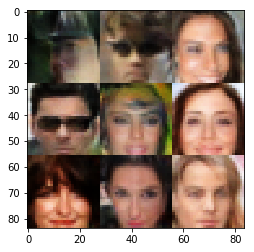

Epoch 7/10 - Batch 410/3165 train_loss_d: 1.3582, train_loss_g: 1.7393
Epoch 7/10 - Batch 420/3165 train_loss_d: 1.5532, train_loss_g: 0.4106
Epoch 7/10 - Batch 430/3165 train_loss_d: 1.5914, train_loss_g: 0.3975
Epoch 7/10 - Batch 440/3165 train_loss_d: 1.0396, train_loss_g: 0.9323
Epoch 7/10 - Batch 450/3165 train_loss_d: 1.4654, train_loss_g: 0.4761
Epoch 7/10 - Batch 460/3165 train_loss_d: 0.9871, train_loss_g: 0.9309
Epoch 7/10 - Batch 470/3165 train_loss_d: 0.9792, train_loss_g: 0.9238
Epoch 7/10 - Batch 480/3165 train_loss_d: 1.1751, train_loss_g: 0.7823
Epoch 7/10 - Batch 490/3165 train_loss_d: 1.2884, train_loss_g: 0.6502
Epoch 7/10 - Batch 500/3165 train_loss_d: 1.3897, train_loss_g: 0.5042
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_197/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_197/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_197/Maximum_2:0", shape=(?, 28,

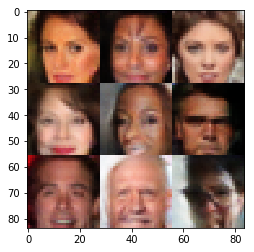

Epoch 7/10 - Batch 510/3165 train_loss_d: 0.9312, train_loss_g: 1.0868
Epoch 7/10 - Batch 520/3165 train_loss_d: 1.1157, train_loss_g: 0.9446
Epoch 7/10 - Batch 530/3165 train_loss_d: 0.9712, train_loss_g: 1.0169
Epoch 7/10 - Batch 540/3165 train_loss_d: 1.2341, train_loss_g: 0.6275
Epoch 7/10 - Batch 550/3165 train_loss_d: 1.1132, train_loss_g: 0.8092
Epoch 7/10 - Batch 560/3165 train_loss_d: 1.1872, train_loss_g: 1.5762
Epoch 7/10 - Batch 570/3165 train_loss_d: 0.9930, train_loss_g: 1.2118
Epoch 7/10 - Batch 580/3165 train_loss_d: 0.9494, train_loss_g: 1.2612
Epoch 7/10 - Batch 590/3165 train_loss_d: 1.1651, train_loss_g: 1.0682
Epoch 7/10 - Batch 600/3165 train_loss_d: 1.4301, train_loss_g: 0.4937
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_198/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_198/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_198/Maximum_2:0", shape=(?, 28,

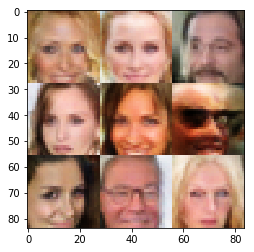

Epoch 7/10 - Batch 610/3165 train_loss_d: 1.1207, train_loss_g: 0.8910
Epoch 7/10 - Batch 620/3165 train_loss_d: 1.1563, train_loss_g: 0.9604
Epoch 7/10 - Batch 630/3165 train_loss_d: 1.0686, train_loss_g: 0.9755
Epoch 7/10 - Batch 640/3165 train_loss_d: 1.0079, train_loss_g: 1.0635
Epoch 7/10 - Batch 650/3165 train_loss_d: 1.0146, train_loss_g: 1.0966
Epoch 7/10 - Batch 660/3165 train_loss_d: 0.8966, train_loss_g: 1.5059
Epoch 7/10 - Batch 670/3165 train_loss_d: 1.4059, train_loss_g: 0.5251
Epoch 7/10 - Batch 680/3165 train_loss_d: 1.2134, train_loss_g: 0.6337
Epoch 7/10 - Batch 690/3165 train_loss_d: 1.1682, train_loss_g: 0.7239
Epoch 7/10 - Batch 700/3165 train_loss_d: 1.1355, train_loss_g: 0.9805
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_199/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_199/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_199/Maximum_2:0", shape=(?, 28,

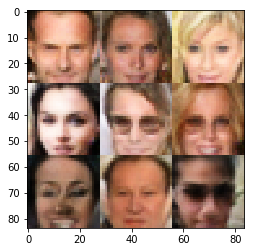

Epoch 7/10 - Batch 710/3165 train_loss_d: 1.1141, train_loss_g: 0.7249
Epoch 7/10 - Batch 720/3165 train_loss_d: 0.8344, train_loss_g: 1.2018
Epoch 7/10 - Batch 730/3165 train_loss_d: 1.0373, train_loss_g: 1.2101
Epoch 7/10 - Batch 740/3165 train_loss_d: 1.1645, train_loss_g: 0.9497
Epoch 7/10 - Batch 750/3165 train_loss_d: 1.1798, train_loss_g: 0.6764
Epoch 7/10 - Batch 760/3165 train_loss_d: 1.2714, train_loss_g: 0.6170
Epoch 7/10 - Batch 770/3165 train_loss_d: 1.0735, train_loss_g: 0.9701
Epoch 7/10 - Batch 780/3165 train_loss_d: 0.9164, train_loss_g: 1.0928
Epoch 7/10 - Batch 790/3165 train_loss_d: 1.0580, train_loss_g: 1.0228
Epoch 7/10 - Batch 800/3165 train_loss_d: 1.1244, train_loss_g: 1.6075
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_200/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_200/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_200/Maximum_2:0", shape=(?, 28,

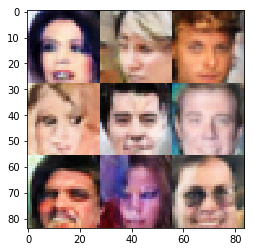

Epoch 7/10 - Batch 810/3165 train_loss_d: 1.1277, train_loss_g: 0.7781
Epoch 7/10 - Batch 820/3165 train_loss_d: 1.1026, train_loss_g: 1.0750
Epoch 7/10 - Batch 830/3165 train_loss_d: 0.8835, train_loss_g: 1.1782
Epoch 7/10 - Batch 840/3165 train_loss_d: 1.2142, train_loss_g: 0.7083
Epoch 7/10 - Batch 850/3165 train_loss_d: 1.0132, train_loss_g: 1.2878
Epoch 7/10 - Batch 860/3165 train_loss_d: 1.0782, train_loss_g: 0.9814
Epoch 7/10 - Batch 870/3165 train_loss_d: 0.9347, train_loss_g: 1.1233
Epoch 7/10 - Batch 880/3165 train_loss_d: 0.7752, train_loss_g: 1.5317
Epoch 7/10 - Batch 890/3165 train_loss_d: 1.1739, train_loss_g: 0.7748
Epoch 7/10 - Batch 900/3165 train_loss_d: 1.6001, train_loss_g: 0.3912
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_201/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_201/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_201/Maximum_2:0", shape=(?, 28,

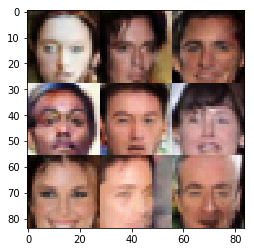

Epoch 7/10 - Batch 910/3165 train_loss_d: 1.1108, train_loss_g: 0.8776
Epoch 7/10 - Batch 920/3165 train_loss_d: 0.9006, train_loss_g: 1.1676
Epoch 7/10 - Batch 930/3165 train_loss_d: 1.0155, train_loss_g: 0.8556
Epoch 7/10 - Batch 940/3165 train_loss_d: 1.2495, train_loss_g: 0.6561
Epoch 7/10 - Batch 950/3165 train_loss_d: 1.4404, train_loss_g: 0.5091
Epoch 7/10 - Batch 960/3165 train_loss_d: 1.1786, train_loss_g: 1.3060
Epoch 7/10 - Batch 970/3165 train_loss_d: 0.9094, train_loss_g: 0.9994
Epoch 7/10 - Batch 980/3165 train_loss_d: 1.2339, train_loss_g: 0.7610
Epoch 7/10 - Batch 990/3165 train_loss_d: 1.2236, train_loss_g: 0.6200
Epoch 7/10 - Batch 1000/3165 train_loss_d: 1.4863, train_loss_g: 0.4530
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_202/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_202/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_202/Maximum_2:0", shape=(?, 28

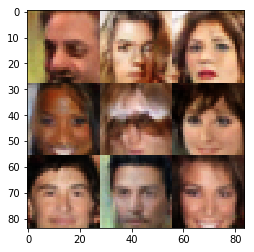

Epoch 7/10 - Batch 1010/3165 train_loss_d: 1.2210, train_loss_g: 0.6327
Epoch 7/10 - Batch 1020/3165 train_loss_d: 1.0011, train_loss_g: 1.0024
Epoch 7/10 - Batch 1030/3165 train_loss_d: 1.3805, train_loss_g: 0.5430
Epoch 7/10 - Batch 1040/3165 train_loss_d: 1.2730, train_loss_g: 0.7007
Epoch 7/10 - Batch 1050/3165 train_loss_d: 1.3888, train_loss_g: 0.5064
Epoch 7/10 - Batch 1060/3165 train_loss_d: 1.0392, train_loss_g: 1.1246
Epoch 7/10 - Batch 1070/3165 train_loss_d: 1.0080, train_loss_g: 1.1754
Epoch 7/10 - Batch 1080/3165 train_loss_d: 0.9443, train_loss_g: 1.2832
Epoch 7/10 - Batch 1090/3165 train_loss_d: 1.0654, train_loss_g: 0.8858
Epoch 7/10 - Batch 1100/3165 train_loss_d: 1.2459, train_loss_g: 0.6053
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_203/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_203/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_203/Maximum_2:0", sha

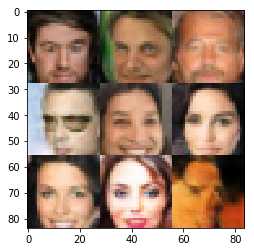

Epoch 7/10 - Batch 1110/3165 train_loss_d: 1.0337, train_loss_g: 1.3017
Epoch 7/10 - Batch 1120/3165 train_loss_d: 1.0032, train_loss_g: 0.9429
Epoch 7/10 - Batch 1130/3165 train_loss_d: 0.8605, train_loss_g: 1.1674
Epoch 7/10 - Batch 1140/3165 train_loss_d: 1.0858, train_loss_g: 1.5363
Epoch 7/10 - Batch 1150/3165 train_loss_d: 1.1377, train_loss_g: 0.7361
Epoch 7/10 - Batch 1160/3165 train_loss_d: 1.2440, train_loss_g: 0.6805
Epoch 7/10 - Batch 1170/3165 train_loss_d: 1.2982, train_loss_g: 0.5893
Epoch 7/10 - Batch 1180/3165 train_loss_d: 1.4742, train_loss_g: 0.4859
Epoch 7/10 - Batch 1190/3165 train_loss_d: 0.9380, train_loss_g: 1.7020
Epoch 7/10 - Batch 1200/3165 train_loss_d: 1.2986, train_loss_g: 0.5721
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_204/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_204/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_204/Maximum_2:0", sha

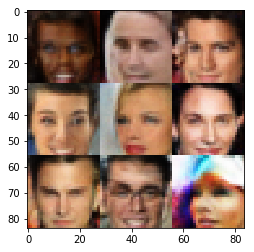

Epoch 7/10 - Batch 1210/3165 train_loss_d: 1.2564, train_loss_g: 0.7804
Epoch 7/10 - Batch 1220/3165 train_loss_d: 0.8435, train_loss_g: 1.1587
Epoch 7/10 - Batch 1230/3165 train_loss_d: 1.6575, train_loss_g: 0.3930
Epoch 7/10 - Batch 1240/3165 train_loss_d: 1.6020, train_loss_g: 0.4298
Epoch 7/10 - Batch 1250/3165 train_loss_d: 0.8199, train_loss_g: 1.2135
Epoch 7/10 - Batch 1260/3165 train_loss_d: 1.1897, train_loss_g: 0.6609
Epoch 7/10 - Batch 1270/3165 train_loss_d: 1.1074, train_loss_g: 0.8612
Epoch 7/10 - Batch 1280/3165 train_loss_d: 1.3154, train_loss_g: 0.5668
Epoch 7/10 - Batch 1290/3165 train_loss_d: 1.1016, train_loss_g: 0.8420
Epoch 7/10 - Batch 1300/3165 train_loss_d: 0.8513, train_loss_g: 1.4205
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_205/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_205/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_205/Maximum_2:0", sha

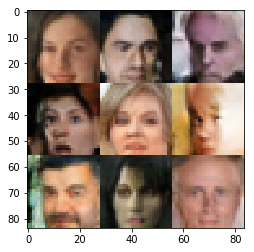

Epoch 7/10 - Batch 1310/3165 train_loss_d: 0.9150, train_loss_g: 1.8428
Epoch 7/10 - Batch 1320/3165 train_loss_d: 1.3118, train_loss_g: 0.6136
Epoch 7/10 - Batch 1330/3165 train_loss_d: 1.1527, train_loss_g: 0.7212
Epoch 7/10 - Batch 1340/3165 train_loss_d: 1.0995, train_loss_g: 0.8073
Epoch 7/10 - Batch 1350/3165 train_loss_d: 1.4436, train_loss_g: 0.5297
Epoch 7/10 - Batch 1360/3165 train_loss_d: 1.0084, train_loss_g: 1.1330
Epoch 7/10 - Batch 1370/3165 train_loss_d: 1.0373, train_loss_g: 1.1065
Epoch 7/10 - Batch 1380/3165 train_loss_d: 1.3660, train_loss_g: 0.5270
Epoch 7/10 - Batch 1390/3165 train_loss_d: 1.0243, train_loss_g: 1.0942
Epoch 7/10 - Batch 1400/3165 train_loss_d: 1.1161, train_loss_g: 0.8742
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_206/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_206/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_206/Maximum_2:0", sha

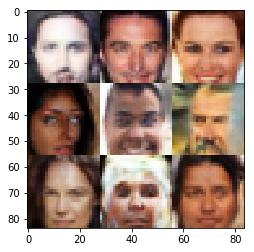

Epoch 7/10 - Batch 1410/3165 train_loss_d: 1.9003, train_loss_g: 0.2769
Epoch 7/10 - Batch 1420/3165 train_loss_d: 0.9671, train_loss_g: 1.0420
Epoch 7/10 - Batch 1430/3165 train_loss_d: 1.1207, train_loss_g: 0.8463
Epoch 7/10 - Batch 1440/3165 train_loss_d: 1.3027, train_loss_g: 0.5580
Epoch 7/10 - Batch 1450/3165 train_loss_d: 1.1466, train_loss_g: 0.7544
Epoch 7/10 - Batch 1460/3165 train_loss_d: 1.2641, train_loss_g: 0.6349
Epoch 7/10 - Batch 1470/3165 train_loss_d: 1.9017, train_loss_g: 0.2749
Epoch 7/10 - Batch 1480/3165 train_loss_d: 1.0633, train_loss_g: 0.8373
Epoch 7/10 - Batch 1490/3165 train_loss_d: 0.9199, train_loss_g: 1.3611
Epoch 7/10 - Batch 1500/3165 train_loss_d: 0.9490, train_loss_g: 0.9262
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_207/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_207/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_207/Maximum_2:0", sha

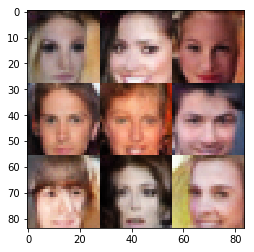

Epoch 7/10 - Batch 1510/3165 train_loss_d: 1.2512, train_loss_g: 0.6068
Epoch 7/10 - Batch 1520/3165 train_loss_d: 1.5915, train_loss_g: 0.4182
Epoch 7/10 - Batch 1530/3165 train_loss_d: 1.0777, train_loss_g: 0.8340
Epoch 7/10 - Batch 1540/3165 train_loss_d: 1.0830, train_loss_g: 0.7546
Epoch 7/10 - Batch 1550/3165 train_loss_d: 1.5901, train_loss_g: 0.3797
Epoch 7/10 - Batch 1560/3165 train_loss_d: 1.1220, train_loss_g: 1.0582
Epoch 7/10 - Batch 1570/3165 train_loss_d: 1.0576, train_loss_g: 0.8643
Epoch 7/10 - Batch 1580/3165 train_loss_d: 1.0867, train_loss_g: 0.8270
Epoch 7/10 - Batch 1590/3165 train_loss_d: 1.1017, train_loss_g: 0.7678
Epoch 7/10 - Batch 1600/3165 train_loss_d: 1.3291, train_loss_g: 0.5758
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_208/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_208/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_208/Maximum_2:0", sha

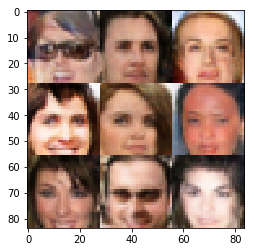

Epoch 7/10 - Batch 1610/3165 train_loss_d: 1.1477, train_loss_g: 0.8460
Epoch 7/10 - Batch 1620/3165 train_loss_d: 1.0632, train_loss_g: 0.8788
Epoch 7/10 - Batch 1630/3165 train_loss_d: 1.1324, train_loss_g: 1.3448
Epoch 7/10 - Batch 1640/3165 train_loss_d: 0.9951, train_loss_g: 0.9689
Epoch 7/10 - Batch 1650/3165 train_loss_d: 1.0376, train_loss_g: 0.8740
Epoch 7/10 - Batch 1660/3165 train_loss_d: 1.7707, train_loss_g: 0.3121
Epoch 7/10 - Batch 1670/3165 train_loss_d: 0.9353, train_loss_g: 1.1710
Epoch 7/10 - Batch 1680/3165 train_loss_d: 1.0643, train_loss_g: 0.9334
Epoch 7/10 - Batch 1690/3165 train_loss_d: 1.2105, train_loss_g: 0.6584
Epoch 7/10 - Batch 1700/3165 train_loss_d: 1.0469, train_loss_g: 0.9384
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_209/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_209/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_209/Maximum_2:0", sha

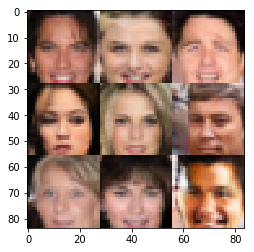

Epoch 7/10 - Batch 1710/3165 train_loss_d: 1.1987, train_loss_g: 0.7128
Epoch 7/10 - Batch 1720/3165 train_loss_d: 0.9307, train_loss_g: 1.4008
Epoch 7/10 - Batch 1730/3165 train_loss_d: 1.2747, train_loss_g: 0.6323
Epoch 7/10 - Batch 1740/3165 train_loss_d: 1.0692, train_loss_g: 1.7777
Epoch 7/10 - Batch 1750/3165 train_loss_d: 1.0194, train_loss_g: 0.9132
Epoch 7/10 - Batch 1760/3165 train_loss_d: 1.1345, train_loss_g: 0.9595
Epoch 7/10 - Batch 1770/3165 train_loss_d: 1.0570, train_loss_g: 0.8501
Epoch 7/10 - Batch 1780/3165 train_loss_d: 1.1099, train_loss_g: 0.7959
Epoch 7/10 - Batch 1790/3165 train_loss_d: 1.4699, train_loss_g: 0.4524
Epoch 7/10 - Batch 1800/3165 train_loss_d: 0.9436, train_loss_g: 1.1752
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_210/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_210/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_210/Maximum_2:0", sha

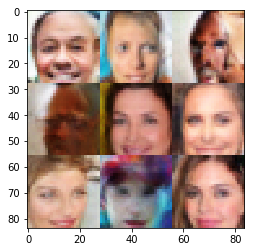

Epoch 7/10 - Batch 1810/3165 train_loss_d: 0.7757, train_loss_g: 1.4584
Epoch 7/10 - Batch 1820/3165 train_loss_d: 1.0528, train_loss_g: 1.3517
Epoch 7/10 - Batch 1830/3165 train_loss_d: 1.2524, train_loss_g: 1.8281
Epoch 7/10 - Batch 1840/3165 train_loss_d: 1.0570, train_loss_g: 0.8909
Epoch 7/10 - Batch 1850/3165 train_loss_d: 1.0025, train_loss_g: 0.9760
Epoch 7/10 - Batch 1860/3165 train_loss_d: 1.1935, train_loss_g: 0.6664
Epoch 7/10 - Batch 1870/3165 train_loss_d: 1.3887, train_loss_g: 0.5066
Epoch 7/10 - Batch 1880/3165 train_loss_d: 1.5230, train_loss_g: 0.4438
Epoch 7/10 - Batch 1890/3165 train_loss_d: 1.1269, train_loss_g: 0.8860
Epoch 7/10 - Batch 1900/3165 train_loss_d: 1.0466, train_loss_g: 0.9902
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_211/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_211/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_211/Maximum_2:0", sha

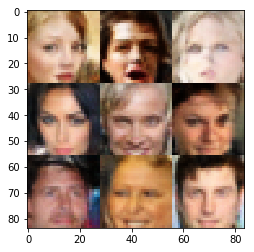

Epoch 7/10 - Batch 1910/3165 train_loss_d: 0.9952, train_loss_g: 0.8798
Epoch 7/10 - Batch 1920/3165 train_loss_d: 1.5293, train_loss_g: 0.4652
Epoch 7/10 - Batch 1930/3165 train_loss_d: 1.3255, train_loss_g: 0.5599
Epoch 7/10 - Batch 1940/3165 train_loss_d: 1.1536, train_loss_g: 0.8248
Epoch 7/10 - Batch 1950/3165 train_loss_d: 0.9157, train_loss_g: 1.1595
Epoch 7/10 - Batch 1960/3165 train_loss_d: 1.2500, train_loss_g: 0.5836
Epoch 7/10 - Batch 1970/3165 train_loss_d: 1.0418, train_loss_g: 1.0544
Epoch 7/10 - Batch 1980/3165 train_loss_d: 1.0840, train_loss_g: 0.8611
Epoch 7/10 - Batch 1990/3165 train_loss_d: 1.3544, train_loss_g: 0.5343
Epoch 7/10 - Batch 2000/3165 train_loss_d: 1.0920, train_loss_g: 0.9687
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_212/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_212/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_212/Maximum_2:0", sha

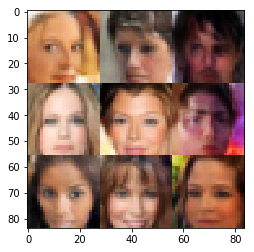

Epoch 7/10 - Batch 2010/3165 train_loss_d: 0.9814, train_loss_g: 0.9332
Epoch 7/10 - Batch 2020/3165 train_loss_d: 1.2965, train_loss_g: 0.5776
Epoch 7/10 - Batch 2030/3165 train_loss_d: 1.4285, train_loss_g: 0.5040
Epoch 7/10 - Batch 2040/3165 train_loss_d: 1.0505, train_loss_g: 1.0897
Epoch 7/10 - Batch 2050/3165 train_loss_d: 1.2921, train_loss_g: 0.5777
Epoch 7/10 - Batch 2060/3165 train_loss_d: 1.0310, train_loss_g: 1.0313
Epoch 7/10 - Batch 2070/3165 train_loss_d: 1.0383, train_loss_g: 0.9506
Epoch 7/10 - Batch 2080/3165 train_loss_d: 1.0659, train_loss_g: 1.7840
Epoch 7/10 - Batch 2090/3165 train_loss_d: 1.0706, train_loss_g: 0.9426
Epoch 7/10 - Batch 2100/3165 train_loss_d: 1.1700, train_loss_g: 0.7527
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_213/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_213/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_213/Maximum_2:0", sha

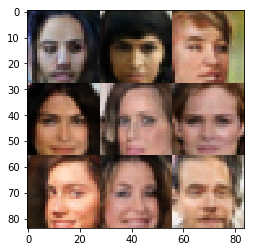

Epoch 7/10 - Batch 2110/3165 train_loss_d: 0.9980, train_loss_g: 1.0864
Epoch 7/10 - Batch 2120/3165 train_loss_d: 0.9657, train_loss_g: 1.2852
Epoch 7/10 - Batch 2130/3165 train_loss_d: 0.9453, train_loss_g: 1.7217
Epoch 7/10 - Batch 2140/3165 train_loss_d: 1.2840, train_loss_g: 0.7204
Epoch 7/10 - Batch 2150/3165 train_loss_d: 0.9660, train_loss_g: 1.2873
Epoch 7/10 - Batch 2160/3165 train_loss_d: 1.3464, train_loss_g: 0.5291
Epoch 7/10 - Batch 2170/3165 train_loss_d: 0.8609, train_loss_g: 1.0878
Epoch 7/10 - Batch 2180/3165 train_loss_d: 0.9396, train_loss_g: 1.1886
Epoch 7/10 - Batch 2190/3165 train_loss_d: 1.1071, train_loss_g: 1.6773
Epoch 7/10 - Batch 2200/3165 train_loss_d: 1.1742, train_loss_g: 0.6916
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_214/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_214/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_214/Maximum_2:0", sha

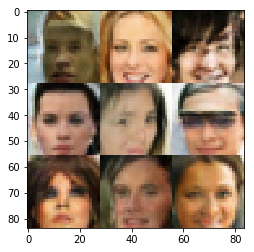

Epoch 7/10 - Batch 2210/3165 train_loss_d: 1.2145, train_loss_g: 0.6654
Epoch 7/10 - Batch 2220/3165 train_loss_d: 1.2706, train_loss_g: 0.6245
Epoch 7/10 - Batch 2230/3165 train_loss_d: 1.0063, train_loss_g: 0.9106
Epoch 7/10 - Batch 2240/3165 train_loss_d: 1.0808, train_loss_g: 0.8695
Epoch 7/10 - Batch 2250/3165 train_loss_d: 1.2906, train_loss_g: 0.6036
Epoch 7/10 - Batch 2260/3165 train_loss_d: 1.1675, train_loss_g: 0.6864
Epoch 7/10 - Batch 2270/3165 train_loss_d: 0.9912, train_loss_g: 1.7554
Epoch 7/10 - Batch 2280/3165 train_loss_d: 1.2389, train_loss_g: 0.6445
Epoch 7/10 - Batch 2290/3165 train_loss_d: 0.8461, train_loss_g: 1.3271
Epoch 7/10 - Batch 2300/3165 train_loss_d: 1.2820, train_loss_g: 0.6276
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_215/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_215/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_215/Maximum_2:0", sha

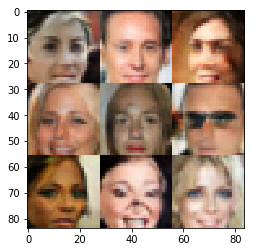

Epoch 7/10 - Batch 2310/3165 train_loss_d: 1.0693, train_loss_g: 0.7899
Epoch 7/10 - Batch 2320/3165 train_loss_d: 1.2314, train_loss_g: 0.6294
Epoch 7/10 - Batch 2330/3165 train_loss_d: 1.0755, train_loss_g: 1.0065
Epoch 7/10 - Batch 2340/3165 train_loss_d: 1.0114, train_loss_g: 1.5806
Epoch 7/10 - Batch 2350/3165 train_loss_d: 0.9102, train_loss_g: 1.0308
Epoch 7/10 - Batch 2360/3165 train_loss_d: 1.1057, train_loss_g: 1.2095
Epoch 7/10 - Batch 2370/3165 train_loss_d: 0.7633, train_loss_g: 1.4621
Epoch 7/10 - Batch 2380/3165 train_loss_d: 0.9535, train_loss_g: 1.2646
Epoch 7/10 - Batch 2390/3165 train_loss_d: 1.5972, train_loss_g: 0.4386
Epoch 7/10 - Batch 2400/3165 train_loss_d: 0.8384, train_loss_g: 1.4741
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_216/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_216/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_216/Maximum_2:0", sha

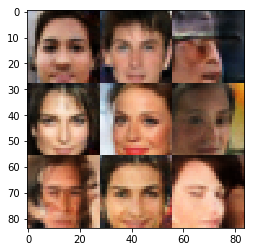

Epoch 7/10 - Batch 2410/3165 train_loss_d: 1.5087, train_loss_g: 2.2019
Epoch 7/10 - Batch 2420/3165 train_loss_d: 1.1296, train_loss_g: 0.7453
Epoch 7/10 - Batch 2430/3165 train_loss_d: 0.9420, train_loss_g: 1.0437
Epoch 7/10 - Batch 2440/3165 train_loss_d: 1.5089, train_loss_g: 0.4698
Epoch 7/10 - Batch 2450/3165 train_loss_d: 1.1542, train_loss_g: 0.7213
Epoch 7/10 - Batch 2460/3165 train_loss_d: 1.0078, train_loss_g: 0.8940
Epoch 7/10 - Batch 2470/3165 train_loss_d: 1.1500, train_loss_g: 0.7722
Epoch 7/10 - Batch 2480/3165 train_loss_d: 0.9373, train_loss_g: 1.2819
Epoch 7/10 - Batch 2490/3165 train_loss_d: 1.0203, train_loss_g: 1.5697
Epoch 7/10 - Batch 2500/3165 train_loss_d: 0.9500, train_loss_g: 1.7353
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_217/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_217/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_217/Maximum_2:0", sha

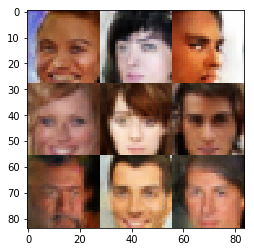

Epoch 7/10 - Batch 2510/3165 train_loss_d: 1.2554, train_loss_g: 0.6108
Epoch 7/10 - Batch 2520/3165 train_loss_d: 1.2195, train_loss_g: 0.9659
Epoch 7/10 - Batch 2530/3165 train_loss_d: 1.3809, train_loss_g: 0.6358
Epoch 7/10 - Batch 2540/3165 train_loss_d: 1.0126, train_loss_g: 1.1373
Epoch 7/10 - Batch 2550/3165 train_loss_d: 1.3017, train_loss_g: 0.6026
Epoch 7/10 - Batch 2560/3165 train_loss_d: 1.1556, train_loss_g: 0.7080
Epoch 7/10 - Batch 2570/3165 train_loss_d: 1.0733, train_loss_g: 0.8085
Epoch 7/10 - Batch 2580/3165 train_loss_d: 1.2717, train_loss_g: 0.6503
Epoch 7/10 - Batch 2590/3165 train_loss_d: 1.1917, train_loss_g: 1.7532
Epoch 7/10 - Batch 2600/3165 train_loss_d: 1.1373, train_loss_g: 1.2286
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_218/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_218/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_218/Maximum_2:0", sha

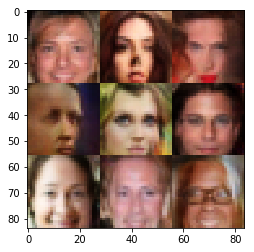

Epoch 7/10 - Batch 2610/3165 train_loss_d: 0.9179, train_loss_g: 1.0187
Epoch 7/10 - Batch 2620/3165 train_loss_d: 0.9310, train_loss_g: 1.2476
Epoch 7/10 - Batch 2630/3165 train_loss_d: 1.4143, train_loss_g: 0.5305
Epoch 7/10 - Batch 2640/3165 train_loss_d: 0.9352, train_loss_g: 1.0196
Epoch 7/10 - Batch 2650/3165 train_loss_d: 1.0151, train_loss_g: 0.8238
Epoch 7/10 - Batch 2660/3165 train_loss_d: 1.0771, train_loss_g: 0.9628
Epoch 7/10 - Batch 2670/3165 train_loss_d: 1.1417, train_loss_g: 0.7675
Epoch 7/10 - Batch 2680/3165 train_loss_d: 1.3700, train_loss_g: 0.5602
Epoch 7/10 - Batch 2690/3165 train_loss_d: 1.2174, train_loss_g: 0.7157
Epoch 7/10 - Batch 2700/3165 train_loss_d: 1.3057, train_loss_g: 0.9502
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_219/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_219/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_219/Maximum_2:0", sha

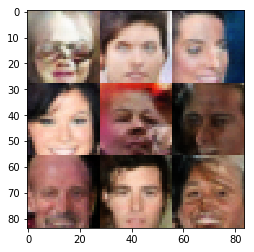

Epoch 7/10 - Batch 2710/3165 train_loss_d: 0.9855, train_loss_g: 0.9318
Epoch 7/10 - Batch 2720/3165 train_loss_d: 0.9998, train_loss_g: 1.1172
Epoch 7/10 - Batch 2730/3165 train_loss_d: 1.7086, train_loss_g: 0.3555
Epoch 7/10 - Batch 2740/3165 train_loss_d: 1.3003, train_loss_g: 0.6293
Epoch 7/10 - Batch 2750/3165 train_loss_d: 1.1733, train_loss_g: 0.6964
Epoch 7/10 - Batch 2760/3165 train_loss_d: 1.1107, train_loss_g: 0.8512
Epoch 7/10 - Batch 2770/3165 train_loss_d: 1.3880, train_loss_g: 0.5520
Epoch 7/10 - Batch 2780/3165 train_loss_d: 1.2726, train_loss_g: 0.6239
Epoch 7/10 - Batch 2790/3165 train_loss_d: 0.9925, train_loss_g: 1.2677
Epoch 7/10 - Batch 2800/3165 train_loss_d: 1.4085, train_loss_g: 1.6861
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_220/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_220/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_220/Maximum_2:0", sha

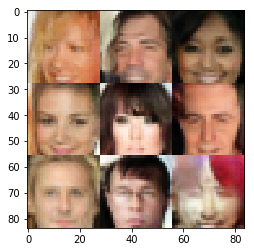

Epoch 7/10 - Batch 2810/3165 train_loss_d: 1.0031, train_loss_g: 0.9055
Epoch 7/10 - Batch 2820/3165 train_loss_d: 1.0010, train_loss_g: 1.0597
Epoch 7/10 - Batch 2830/3165 train_loss_d: 0.9005, train_loss_g: 1.4769
Epoch 7/10 - Batch 2840/3165 train_loss_d: 1.0843, train_loss_g: 0.8986
Epoch 7/10 - Batch 2850/3165 train_loss_d: 1.0111, train_loss_g: 0.8982
Epoch 7/10 - Batch 2860/3165 train_loss_d: 0.9807, train_loss_g: 1.0147
Epoch 7/10 - Batch 2870/3165 train_loss_d: 1.0127, train_loss_g: 1.2186
Epoch 7/10 - Batch 2880/3165 train_loss_d: 0.9827, train_loss_g: 1.0368
Epoch 7/10 - Batch 2890/3165 train_loss_d: 1.2576, train_loss_g: 0.6333
Epoch 7/10 - Batch 2900/3165 train_loss_d: 1.3294, train_loss_g: 0.5659
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_221/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_221/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_221/Maximum_2:0", sha

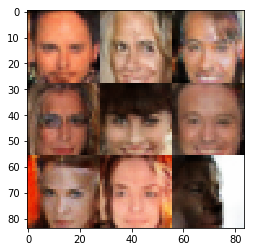

Epoch 7/10 - Batch 2910/3165 train_loss_d: 1.1287, train_loss_g: 0.8080
Epoch 7/10 - Batch 2920/3165 train_loss_d: 1.3258, train_loss_g: 0.5571
Epoch 7/10 - Batch 2930/3165 train_loss_d: 1.2132, train_loss_g: 0.6505
Epoch 7/10 - Batch 2940/3165 train_loss_d: 1.1018, train_loss_g: 0.8545
Epoch 7/10 - Batch 2950/3165 train_loss_d: 1.0493, train_loss_g: 1.1918
Epoch 7/10 - Batch 2960/3165 train_loss_d: 0.9838, train_loss_g: 0.9226
Epoch 7/10 - Batch 2970/3165 train_loss_d: 0.9892, train_loss_g: 1.2247
Epoch 7/10 - Batch 2980/3165 train_loss_d: 1.0423, train_loss_g: 1.2626
Epoch 7/10 - Batch 2990/3165 train_loss_d: 0.9816, train_loss_g: 1.0326
Epoch 7/10 - Batch 3000/3165 train_loss_d: 0.8748, train_loss_g: 1.2447
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_222/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_222/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_222/Maximum_2:0", sha

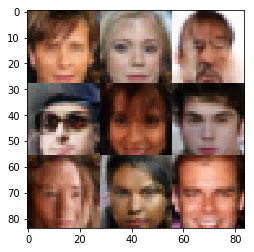

Epoch 7/10 - Batch 3010/3165 train_loss_d: 0.9953, train_loss_g: 0.9504
Epoch 7/10 - Batch 3020/3165 train_loss_d: 1.3227, train_loss_g: 0.5815
Epoch 7/10 - Batch 3030/3165 train_loss_d: 1.1966, train_loss_g: 0.7684
Epoch 7/10 - Batch 3040/3165 train_loss_d: 0.9050, train_loss_g: 1.1769
Epoch 7/10 - Batch 3050/3165 train_loss_d: 1.3417, train_loss_g: 0.5988
Epoch 7/10 - Batch 3060/3165 train_loss_d: 0.9574, train_loss_g: 1.1219
Epoch 7/10 - Batch 3070/3165 train_loss_d: 1.4331, train_loss_g: 0.4735
Epoch 7/10 - Batch 3080/3165 train_loss_d: 0.9327, train_loss_g: 1.1292
Epoch 7/10 - Batch 3090/3165 train_loss_d: 0.9870, train_loss_g: 0.9105
Epoch 7/10 - Batch 3100/3165 train_loss_d: 1.0750, train_loss_g: 0.9094
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_223/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_223/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_223/Maximum_2:0", sha

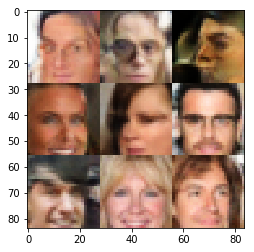

Epoch 7/10 - Batch 3110/3165 train_loss_d: 1.3487, train_loss_g: 0.5594
Epoch 7/10 - Batch 3120/3165 train_loss_d: 0.8552, train_loss_g: 1.2636
Epoch 7/10 - Batch 3130/3165 train_loss_d: 0.8552, train_loss_g: 1.1457
Epoch 7/10 - Batch 3140/3165 train_loss_d: 1.0070, train_loss_g: 0.9898
Epoch 7/10 - Batch 3150/3165 train_loss_d: 1.2501, train_loss_g: 1.8458
Epoch 7/10 - Batch 3160/3165 train_loss_d: 0.8309, train_loss_g: 1.4259
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_224/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_224/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_224/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_224/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


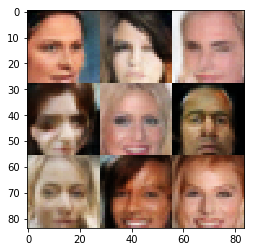


 70%|███████   | 7/10 [5:09:27<2:13:02, 2660.95s/it]

Epoch 8/10 - Batch 10/3165 train_loss_d: 1.0778, train_loss_g: 0.7933
Epoch 8/10 - Batch 20/3165 train_loss_d: 1.0534, train_loss_g: 0.8260
Epoch 8/10 - Batch 30/3165 train_loss_d: 1.5021, train_loss_g: 0.4661
Epoch 8/10 - Batch 40/3165 train_loss_d: 1.2428, train_loss_g: 0.6929
Epoch 8/10 - Batch 50/3165 train_loss_d: 1.3601, train_loss_g: 0.4984
Epoch 8/10 - Batch 60/3165 train_loss_d: 1.1075, train_loss_g: 0.7880
Epoch 8/10 - Batch 70/3165 train_loss_d: 1.0266, train_loss_g: 0.8669
Epoch 8/10 - Batch 80/3165 train_loss_d: 1.1050, train_loss_g: 0.8077
Epoch 8/10 - Batch 90/3165 train_loss_d: 1.1822, train_loss_g: 0.7122
Epoch 8/10 - Batch 100/3165 train_loss_d: 1.0869, train_loss_g: 0.7662
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_225/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_225/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_225/Maximum_2:0", shape=(?, 28, 28, 128)

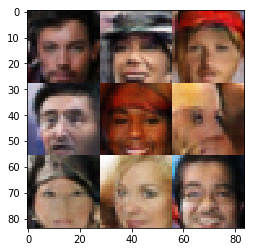

Epoch 8/10 - Batch 110/3165 train_loss_d: 1.0105, train_loss_g: 0.9751
Epoch 8/10 - Batch 120/3165 train_loss_d: 1.0659, train_loss_g: 0.9620
Epoch 8/10 - Batch 130/3165 train_loss_d: 1.3604, train_loss_g: 0.5438
Epoch 8/10 - Batch 140/3165 train_loss_d: 0.8122, train_loss_g: 1.3985
Epoch 8/10 - Batch 150/3165 train_loss_d: 1.4688, train_loss_g: 0.4625
Epoch 8/10 - Batch 160/3165 train_loss_d: 1.2192, train_loss_g: 0.7502
Epoch 8/10 - Batch 170/3165 train_loss_d: 1.2311, train_loss_g: 0.8499
Epoch 8/10 - Batch 180/3165 train_loss_d: 1.1516, train_loss_g: 0.7629
Epoch 8/10 - Batch 190/3165 train_loss_d: 1.2754, train_loss_g: 0.6085
Epoch 8/10 - Batch 200/3165 train_loss_d: 1.1156, train_loss_g: 0.9992
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_226/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_226/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_226/Maximum_2:0", shape=(?, 28,

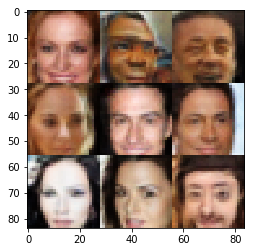

Epoch 8/10 - Batch 210/3165 train_loss_d: 1.0680, train_loss_g: 1.0707
Epoch 8/10 - Batch 220/3165 train_loss_d: 1.1529, train_loss_g: 0.8896
Epoch 8/10 - Batch 230/3165 train_loss_d: 0.9385, train_loss_g: 1.2314
Epoch 8/10 - Batch 240/3165 train_loss_d: 0.9526, train_loss_g: 0.9904
Epoch 8/10 - Batch 250/3165 train_loss_d: 1.0553, train_loss_g: 0.9353
Epoch 8/10 - Batch 260/3165 train_loss_d: 1.5981, train_loss_g: 0.4258
Epoch 8/10 - Batch 270/3165 train_loss_d: 0.8577, train_loss_g: 1.5219
Epoch 8/10 - Batch 280/3165 train_loss_d: 1.0080, train_loss_g: 0.8784
Epoch 8/10 - Batch 290/3165 train_loss_d: 1.1443, train_loss_g: 1.3231
Epoch 8/10 - Batch 300/3165 train_loss_d: 1.2981, train_loss_g: 1.0687
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_227/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_227/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_227/Maximum_2:0", shape=(?, 28,

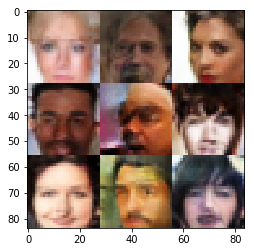

Epoch 8/10 - Batch 310/3165 train_loss_d: 0.9612, train_loss_g: 1.4000
Epoch 8/10 - Batch 320/3165 train_loss_d: 0.8806, train_loss_g: 1.4300
Epoch 8/10 - Batch 330/3165 train_loss_d: 0.9783, train_loss_g: 1.0823
Epoch 8/10 - Batch 340/3165 train_loss_d: 1.0958, train_loss_g: 0.7577
Epoch 8/10 - Batch 350/3165 train_loss_d: 1.0634, train_loss_g: 0.8778
Epoch 8/10 - Batch 360/3165 train_loss_d: 1.0630, train_loss_g: 0.7929
Epoch 8/10 - Batch 370/3165 train_loss_d: 1.1014, train_loss_g: 1.1099
Epoch 8/10 - Batch 380/3165 train_loss_d: 0.7637, train_loss_g: 1.4577
Epoch 8/10 - Batch 390/3165 train_loss_d: 1.0196, train_loss_g: 0.9263
Epoch 8/10 - Batch 400/3165 train_loss_d: 1.0311, train_loss_g: 1.0853
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_228/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_228/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_228/Maximum_2:0", shape=(?, 28,

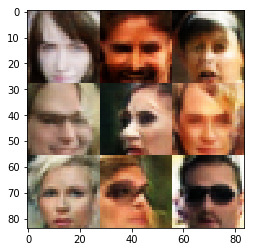

Epoch 8/10 - Batch 410/3165 train_loss_d: 1.0599, train_loss_g: 1.5836
Epoch 8/10 - Batch 420/3165 train_loss_d: 1.1964, train_loss_g: 0.6945
Epoch 8/10 - Batch 430/3165 train_loss_d: 1.8096, train_loss_g: 0.3222
Epoch 8/10 - Batch 440/3165 train_loss_d: 1.1894, train_loss_g: 0.6976
Epoch 8/10 - Batch 450/3165 train_loss_d: 1.6229, train_loss_g: 0.4155
Epoch 8/10 - Batch 460/3165 train_loss_d: 0.8958, train_loss_g: 1.1854
Epoch 8/10 - Batch 470/3165 train_loss_d: 0.9284, train_loss_g: 0.9579
Epoch 8/10 - Batch 480/3165 train_loss_d: 1.1365, train_loss_g: 0.7170
Epoch 8/10 - Batch 490/3165 train_loss_d: 1.0723, train_loss_g: 0.9638
Epoch 8/10 - Batch 500/3165 train_loss_d: 1.1557, train_loss_g: 0.8095
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_229/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_229/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_229/Maximum_2:0", shape=(?, 28,

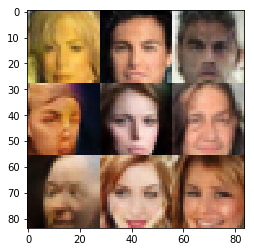

Epoch 8/10 - Batch 510/3165 train_loss_d: 1.2439, train_loss_g: 0.6047
Epoch 8/10 - Batch 520/3165 train_loss_d: 1.0975, train_loss_g: 0.8288
Epoch 8/10 - Batch 530/3165 train_loss_d: 0.7972, train_loss_g: 1.4476
Epoch 8/10 - Batch 540/3165 train_loss_d: 1.2106, train_loss_g: 0.7577
Epoch 8/10 - Batch 550/3165 train_loss_d: 1.4813, train_loss_g: 0.4695
Epoch 8/10 - Batch 560/3165 train_loss_d: 0.8380, train_loss_g: 1.4878
Epoch 8/10 - Batch 570/3165 train_loss_d: 0.9625, train_loss_g: 0.9900
Epoch 8/10 - Batch 580/3165 train_loss_d: 0.9251, train_loss_g: 1.0559
Epoch 8/10 - Batch 590/3165 train_loss_d: 1.0153, train_loss_g: 1.1717
Epoch 8/10 - Batch 600/3165 train_loss_d: 1.3519, train_loss_g: 0.5279
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_230/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_230/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_230/Maximum_2:0", shape=(?, 28,

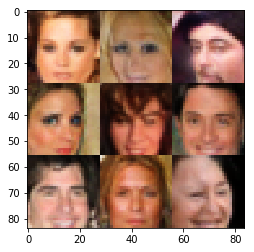

Epoch 8/10 - Batch 610/3165 train_loss_d: 1.5045, train_loss_g: 0.4621
Epoch 8/10 - Batch 620/3165 train_loss_d: 1.2613, train_loss_g: 1.4456
Epoch 8/10 - Batch 630/3165 train_loss_d: 1.3385, train_loss_g: 0.5925
Epoch 8/10 - Batch 640/3165 train_loss_d: 1.0196, train_loss_g: 1.0533
Epoch 8/10 - Batch 650/3165 train_loss_d: 0.8811, train_loss_g: 1.0926
Epoch 8/10 - Batch 660/3165 train_loss_d: 0.6851, train_loss_g: 1.6009
Epoch 8/10 - Batch 670/3165 train_loss_d: 2.0305, train_loss_g: 0.2375
Epoch 8/10 - Batch 680/3165 train_loss_d: 1.2557, train_loss_g: 0.5919
Epoch 8/10 - Batch 690/3165 train_loss_d: 1.1930, train_loss_g: 0.7245
Epoch 8/10 - Batch 700/3165 train_loss_d: 1.2556, train_loss_g: 0.7402
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_231/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_231/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_231/Maximum_2:0", shape=(?, 28,

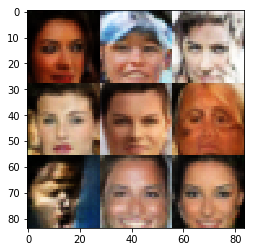

Epoch 8/10 - Batch 710/3165 train_loss_d: 0.8782, train_loss_g: 1.4852
Epoch 8/10 - Batch 720/3165 train_loss_d: 0.7376, train_loss_g: 1.4903
Epoch 8/10 - Batch 730/3165 train_loss_d: 1.5791, train_loss_g: 0.4261
Epoch 8/10 - Batch 740/3165 train_loss_d: 1.2016, train_loss_g: 1.0288
Epoch 8/10 - Batch 750/3165 train_loss_d: 0.9066, train_loss_g: 1.2452
Epoch 8/10 - Batch 760/3165 train_loss_d: 1.4476, train_loss_g: 0.4948
Epoch 8/10 - Batch 770/3165 train_loss_d: 1.0224, train_loss_g: 0.9941
Epoch 8/10 - Batch 780/3165 train_loss_d: 1.2173, train_loss_g: 0.6342
Epoch 8/10 - Batch 790/3165 train_loss_d: 1.2975, train_loss_g: 0.6182
Epoch 8/10 - Batch 800/3165 train_loss_d: 0.8335, train_loss_g: 1.2404
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_232/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_232/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_232/Maximum_2:0", shape=(?, 28,

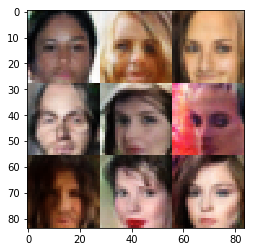

Epoch 8/10 - Batch 810/3165 train_loss_d: 0.9539, train_loss_g: 1.0841
Epoch 8/10 - Batch 820/3165 train_loss_d: 0.9967, train_loss_g: 1.0253
Epoch 8/10 - Batch 830/3165 train_loss_d: 1.0052, train_loss_g: 1.0098
Epoch 8/10 - Batch 840/3165 train_loss_d: 0.9423, train_loss_g: 1.0948
Epoch 8/10 - Batch 850/3165 train_loss_d: 0.9265, train_loss_g: 1.1273
Epoch 8/10 - Batch 860/3165 train_loss_d: 1.1431, train_loss_g: 0.6943
Epoch 8/10 - Batch 870/3165 train_loss_d: 0.9568, train_loss_g: 1.4603
Epoch 8/10 - Batch 880/3165 train_loss_d: 0.9519, train_loss_g: 1.4697
Epoch 8/10 - Batch 890/3165 train_loss_d: 1.3887, train_loss_g: 0.5354
Epoch 8/10 - Batch 900/3165 train_loss_d: 1.2891, train_loss_g: 0.6325
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_233/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_233/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_233/Maximum_2:0", shape=(?, 28,

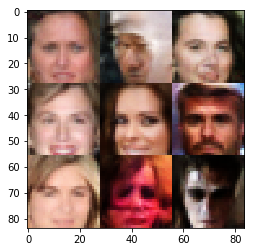

Epoch 8/10 - Batch 910/3165 train_loss_d: 1.0638, train_loss_g: 0.8345
Epoch 8/10 - Batch 920/3165 train_loss_d: 1.1084, train_loss_g: 0.7600
Epoch 8/10 - Batch 930/3165 train_loss_d: 1.0730, train_loss_g: 0.8298
Epoch 8/10 - Batch 940/3165 train_loss_d: 1.0992, train_loss_g: 0.8703
Epoch 8/10 - Batch 950/3165 train_loss_d: 1.0231, train_loss_g: 0.9508
Epoch 8/10 - Batch 960/3165 train_loss_d: 0.9664, train_loss_g: 1.0024
Epoch 8/10 - Batch 970/3165 train_loss_d: 1.4690, train_loss_g: 0.4682
Epoch 8/10 - Batch 980/3165 train_loss_d: 1.2029, train_loss_g: 0.7790
Epoch 8/10 - Batch 990/3165 train_loss_d: 0.8812, train_loss_g: 1.3339
Epoch 8/10 - Batch 1000/3165 train_loss_d: 1.4147, train_loss_g: 0.5727
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_234/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_234/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_234/Maximum_2:0", shape=(?, 28

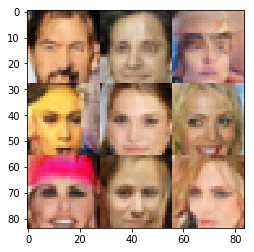

Epoch 8/10 - Batch 1010/3165 train_loss_d: 1.2703, train_loss_g: 0.6076
Epoch 8/10 - Batch 1020/3165 train_loss_d: 1.1532, train_loss_g: 0.7900
Epoch 8/10 - Batch 1030/3165 train_loss_d: 0.9584, train_loss_g: 1.1342
Epoch 8/10 - Batch 1040/3165 train_loss_d: 1.4630, train_loss_g: 0.4824
Epoch 8/10 - Batch 1050/3165 train_loss_d: 1.0801, train_loss_g: 0.8071
Epoch 8/10 - Batch 1060/3165 train_loss_d: 1.0711, train_loss_g: 0.7661
Epoch 8/10 - Batch 1070/3165 train_loss_d: 1.1398, train_loss_g: 0.7417
Epoch 8/10 - Batch 1080/3165 train_loss_d: 0.9988, train_loss_g: 1.0265
Epoch 8/10 - Batch 1090/3165 train_loss_d: 1.2176, train_loss_g: 0.6424
Epoch 8/10 - Batch 1100/3165 train_loss_d: 1.1025, train_loss_g: 0.8688
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_235/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_235/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_235/Maximum_2:0", sha

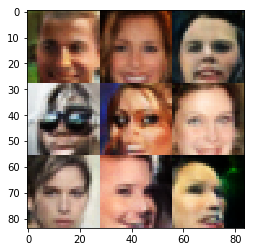

Epoch 8/10 - Batch 1110/3165 train_loss_d: 0.9455, train_loss_g: 1.1020
Epoch 8/10 - Batch 1120/3165 train_loss_d: 0.7662, train_loss_g: 1.5020
Epoch 8/10 - Batch 1130/3165 train_loss_d: 0.9033, train_loss_g: 1.1161
Epoch 8/10 - Batch 1140/3165 train_loss_d: 1.1066, train_loss_g: 1.4297
Epoch 8/10 - Batch 1150/3165 train_loss_d: 1.2356, train_loss_g: 0.6369
Epoch 8/10 - Batch 1160/3165 train_loss_d: 1.4066, train_loss_g: 0.5013
Epoch 8/10 - Batch 1170/3165 train_loss_d: 0.9917, train_loss_g: 1.4407
Epoch 8/10 - Batch 1180/3165 train_loss_d: 1.2677, train_loss_g: 1.9683
Epoch 8/10 - Batch 1190/3165 train_loss_d: 0.9146, train_loss_g: 1.4733
Epoch 8/10 - Batch 1200/3165 train_loss_d: 1.2553, train_loss_g: 0.6228
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_236/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_236/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_236/Maximum_2:0", sha

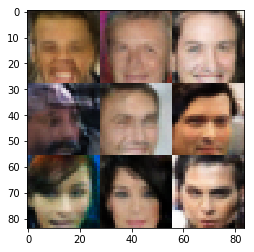

Epoch 8/10 - Batch 1210/3165 train_loss_d: 0.8479, train_loss_g: 1.4800
Epoch 8/10 - Batch 1220/3165 train_loss_d: 1.0873, train_loss_g: 1.3917
Epoch 8/10 - Batch 1230/3165 train_loss_d: 1.2168, train_loss_g: 0.6232
Epoch 8/10 - Batch 1240/3165 train_loss_d: 1.4162, train_loss_g: 0.5015
Epoch 8/10 - Batch 1250/3165 train_loss_d: 0.9871, train_loss_g: 1.0447
Epoch 8/10 - Batch 1260/3165 train_loss_d: 1.1280, train_loss_g: 0.7157
Epoch 8/10 - Batch 1270/3165 train_loss_d: 0.9592, train_loss_g: 1.6564
Epoch 8/10 - Batch 1280/3165 train_loss_d: 1.1981, train_loss_g: 0.6776
Epoch 8/10 - Batch 1290/3165 train_loss_d: 0.9167, train_loss_g: 1.1398
Epoch 8/10 - Batch 1300/3165 train_loss_d: 1.0167, train_loss_g: 1.6913
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_237/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_237/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_237/Maximum_2:0", sha

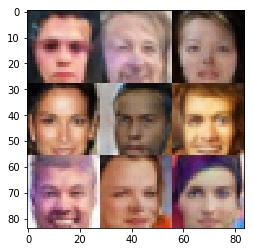

Epoch 8/10 - Batch 1310/3165 train_loss_d: 0.8770, train_loss_g: 1.1320
Epoch 8/10 - Batch 1320/3165 train_loss_d: 1.0441, train_loss_g: 0.8896
Epoch 8/10 - Batch 1330/3165 train_loss_d: 0.9613, train_loss_g: 1.2046
Epoch 8/10 - Batch 1340/3165 train_loss_d: 1.0216, train_loss_g: 1.3640
Epoch 8/10 - Batch 1350/3165 train_loss_d: 1.3407, train_loss_g: 0.5599
Epoch 8/10 - Batch 1360/3165 train_loss_d: 0.8283, train_loss_g: 1.5392
Epoch 8/10 - Batch 1370/3165 train_loss_d: 0.9734, train_loss_g: 0.9353
Epoch 8/10 - Batch 1380/3165 train_loss_d: 1.2481, train_loss_g: 0.6958
Epoch 8/10 - Batch 1390/3165 train_loss_d: 1.4839, train_loss_g: 0.4679
Epoch 8/10 - Batch 1400/3165 train_loss_d: 1.2283, train_loss_g: 0.6913
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_238/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_238/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_238/Maximum_2:0", sha

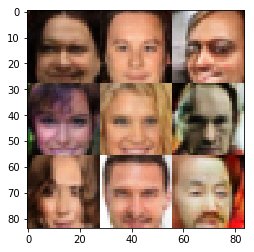

Epoch 8/10 - Batch 1410/3165 train_loss_d: 1.0172, train_loss_g: 0.8968
Epoch 8/10 - Batch 1420/3165 train_loss_d: 1.5768, train_loss_g: 2.1230
Epoch 8/10 - Batch 1430/3165 train_loss_d: 1.1323, train_loss_g: 0.8011
Epoch 8/10 - Batch 1440/3165 train_loss_d: 1.2850, train_loss_g: 0.5867
Epoch 8/10 - Batch 1450/3165 train_loss_d: 1.4934, train_loss_g: 0.4776
Epoch 8/10 - Batch 1460/3165 train_loss_d: 1.3722, train_loss_g: 0.5607
Epoch 8/10 - Batch 1470/3165 train_loss_d: 1.2089, train_loss_g: 0.6802
Epoch 8/10 - Batch 1480/3165 train_loss_d: 0.8866, train_loss_g: 1.1832
Epoch 8/10 - Batch 1490/3165 train_loss_d: 0.8929, train_loss_g: 1.7962
Epoch 8/10 - Batch 1500/3165 train_loss_d: 1.2021, train_loss_g: 0.7084
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_239/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_239/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_239/Maximum_2:0", sha

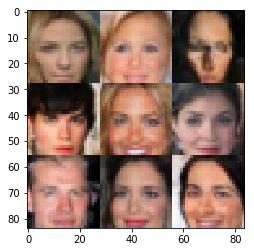

Epoch 8/10 - Batch 1510/3165 train_loss_d: 1.1615, train_loss_g: 0.6767
Epoch 8/10 - Batch 1520/3165 train_loss_d: 1.5306, train_loss_g: 0.4323
Epoch 8/10 - Batch 1530/3165 train_loss_d: 0.8390, train_loss_g: 1.2368
Epoch 8/10 - Batch 1540/3165 train_loss_d: 0.9676, train_loss_g: 0.8933
Epoch 8/10 - Batch 1550/3165 train_loss_d: 1.6018, train_loss_g: 0.4896
Epoch 8/10 - Batch 1560/3165 train_loss_d: 1.0694, train_loss_g: 0.8325
Epoch 8/10 - Batch 1570/3165 train_loss_d: 1.0109, train_loss_g: 1.1220
Epoch 8/10 - Batch 1580/3165 train_loss_d: 0.9781, train_loss_g: 0.9474
Epoch 8/10 - Batch 1590/3165 train_loss_d: 1.1880, train_loss_g: 0.6857
Epoch 8/10 - Batch 1600/3165 train_loss_d: 1.1609, train_loss_g: 0.7000
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_240/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_240/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_240/Maximum_2:0", sha

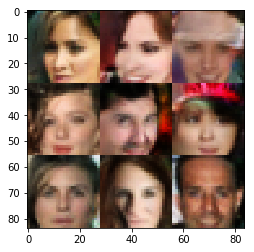

Epoch 8/10 - Batch 1610/3165 train_loss_d: 1.3759, train_loss_g: 0.5374
Epoch 8/10 - Batch 1620/3165 train_loss_d: 1.1657, train_loss_g: 0.7409
Epoch 8/10 - Batch 1630/3165 train_loss_d: 0.8763, train_loss_g: 1.2268
Epoch 8/10 - Batch 1640/3165 train_loss_d: 0.9017, train_loss_g: 1.0404
Epoch 8/10 - Batch 1650/3165 train_loss_d: 1.0149, train_loss_g: 1.1644
Epoch 8/10 - Batch 1660/3165 train_loss_d: 1.2945, train_loss_g: 0.7655
Epoch 8/10 - Batch 1670/3165 train_loss_d: 1.0892, train_loss_g: 0.8188
Epoch 8/10 - Batch 1680/3165 train_loss_d: 1.0016, train_loss_g: 1.0221
Epoch 8/10 - Batch 1690/3165 train_loss_d: 0.9995, train_loss_g: 1.1260
Epoch 8/10 - Batch 1700/3165 train_loss_d: 1.0930, train_loss_g: 1.2195
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_241/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_241/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_241/Maximum_2:0", sha

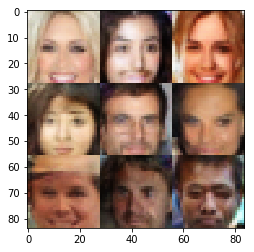

Epoch 8/10 - Batch 1710/3165 train_loss_d: 0.9767, train_loss_g: 1.0718
Epoch 8/10 - Batch 1720/3165 train_loss_d: 1.1084, train_loss_g: 0.7479
Epoch 8/10 - Batch 1730/3165 train_loss_d: 1.1911, train_loss_g: 0.7521
Epoch 8/10 - Batch 1740/3165 train_loss_d: 0.9878, train_loss_g: 0.9959
Epoch 8/10 - Batch 1750/3165 train_loss_d: 0.9778, train_loss_g: 1.2887
Epoch 8/10 - Batch 1760/3165 train_loss_d: 1.2035, train_loss_g: 1.1473
Epoch 8/10 - Batch 1770/3165 train_loss_d: 0.9861, train_loss_g: 1.0062
Epoch 8/10 - Batch 1780/3165 train_loss_d: 1.5896, train_loss_g: 0.3942
Epoch 8/10 - Batch 1790/3165 train_loss_d: 1.6216, train_loss_g: 0.4295
Epoch 8/10 - Batch 1800/3165 train_loss_d: 1.1179, train_loss_g: 0.8266
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_242/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_242/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_242/Maximum_2:0", sha

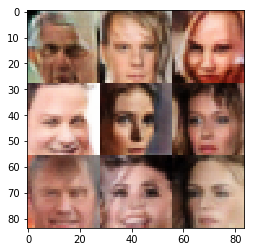

Epoch 8/10 - Batch 1810/3165 train_loss_d: 0.9603, train_loss_g: 0.9945
Epoch 8/10 - Batch 1820/3165 train_loss_d: 0.8631, train_loss_g: 1.1976
Epoch 8/10 - Batch 1830/3165 train_loss_d: 0.9484, train_loss_g: 0.9300
Epoch 8/10 - Batch 1840/3165 train_loss_d: 1.1793, train_loss_g: 0.7244
Epoch 8/10 - Batch 1850/3165 train_loss_d: 1.0093, train_loss_g: 0.8158
Epoch 8/10 - Batch 1860/3165 train_loss_d: 0.9278, train_loss_g: 1.0913
Epoch 8/10 - Batch 1870/3165 train_loss_d: 1.0077, train_loss_g: 1.1079
Epoch 8/10 - Batch 1880/3165 train_loss_d: 1.5604, train_loss_g: 0.4640
Epoch 8/10 - Batch 1890/3165 train_loss_d: 1.1689, train_loss_g: 1.9902
Epoch 8/10 - Batch 1900/3165 train_loss_d: 1.1189, train_loss_g: 0.7741
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_243/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_243/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_243/Maximum_2:0", sha

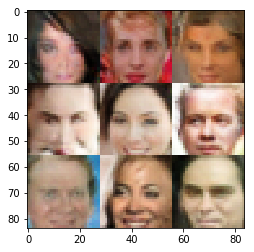

Epoch 8/10 - Batch 1910/3165 train_loss_d: 1.0327, train_loss_g: 1.8764
Epoch 8/10 - Batch 1920/3165 train_loss_d: 1.0838, train_loss_g: 0.8166
Epoch 8/10 - Batch 1930/3165 train_loss_d: 1.2076, train_loss_g: 0.6910
Epoch 8/10 - Batch 1940/3165 train_loss_d: 0.9707, train_loss_g: 1.0646
Epoch 8/10 - Batch 1950/3165 train_loss_d: 1.3020, train_loss_g: 0.6145
Epoch 8/10 - Batch 1960/3165 train_loss_d: 1.2438, train_loss_g: 0.6088
Epoch 8/10 - Batch 1970/3165 train_loss_d: 1.3385, train_loss_g: 0.5782
Epoch 8/10 - Batch 1980/3165 train_loss_d: 0.9027, train_loss_g: 1.0715
Epoch 8/10 - Batch 1990/3165 train_loss_d: 0.9684, train_loss_g: 0.9639
Epoch 8/10 - Batch 2000/3165 train_loss_d: 1.6328, train_loss_g: 0.4269
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_244/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_244/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_244/Maximum_2:0", sha

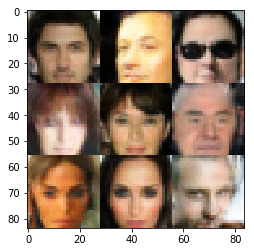

Epoch 8/10 - Batch 2010/3165 train_loss_d: 0.9355, train_loss_g: 1.0416
Epoch 8/10 - Batch 2020/3165 train_loss_d: 1.0626, train_loss_g: 0.9003
Epoch 8/10 - Batch 2030/3165 train_loss_d: 0.9483, train_loss_g: 1.0493
Epoch 8/10 - Batch 2040/3165 train_loss_d: 1.0734, train_loss_g: 0.9445
Epoch 8/10 - Batch 2050/3165 train_loss_d: 0.9487, train_loss_g: 1.0364
Epoch 8/10 - Batch 2060/3165 train_loss_d: 0.8018, train_loss_g: 1.6224
Epoch 8/10 - Batch 2070/3165 train_loss_d: 1.0798, train_loss_g: 0.7971
Epoch 8/10 - Batch 2080/3165 train_loss_d: 1.1074, train_loss_g: 1.7815
Epoch 8/10 - Batch 2090/3165 train_loss_d: 0.9812, train_loss_g: 1.1977
Epoch 8/10 - Batch 2100/3165 train_loss_d: 1.1876, train_loss_g: 1.0689
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_245/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_245/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_245/Maximum_2:0", sha

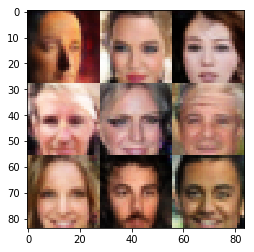

Epoch 8/10 - Batch 2110/3165 train_loss_d: 0.7017, train_loss_g: 1.7635
Epoch 8/10 - Batch 2120/3165 train_loss_d: 0.8986, train_loss_g: 1.2706
Epoch 8/10 - Batch 2130/3165 train_loss_d: 0.9849, train_loss_g: 1.0510
Epoch 8/10 - Batch 2140/3165 train_loss_d: 1.1191, train_loss_g: 0.7507
Epoch 8/10 - Batch 2150/3165 train_loss_d: 1.0566, train_loss_g: 0.8796
Epoch 8/10 - Batch 2160/3165 train_loss_d: 1.5565, train_loss_g: 0.4641
Epoch 8/10 - Batch 2170/3165 train_loss_d: 1.0543, train_loss_g: 0.8781
Epoch 8/10 - Batch 2180/3165 train_loss_d: 1.1022, train_loss_g: 0.8054
Epoch 8/10 - Batch 2190/3165 train_loss_d: 1.0681, train_loss_g: 1.9424
Epoch 8/10 - Batch 2200/3165 train_loss_d: 1.9419, train_loss_g: 0.2764
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_246/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_246/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_246/Maximum_2:0", sha

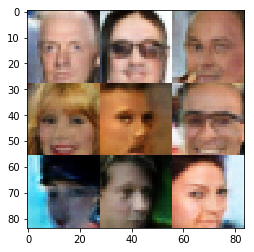

Epoch 8/10 - Batch 2210/3165 train_loss_d: 1.0927, train_loss_g: 0.8288
Epoch 8/10 - Batch 2220/3165 train_loss_d: 0.9443, train_loss_g: 1.2613
Epoch 8/10 - Batch 2230/3165 train_loss_d: 0.8030, train_loss_g: 1.2736
Epoch 8/10 - Batch 2240/3165 train_loss_d: 1.1253, train_loss_g: 0.7485
Epoch 8/10 - Batch 2250/3165 train_loss_d: 1.7611, train_loss_g: 0.3258
Epoch 8/10 - Batch 2260/3165 train_loss_d: 1.0750, train_loss_g: 0.7712
Epoch 8/10 - Batch 2270/3165 train_loss_d: 1.2588, train_loss_g: 0.6418
Epoch 8/10 - Batch 2280/3165 train_loss_d: 1.0133, train_loss_g: 0.9995
Epoch 8/10 - Batch 2290/3165 train_loss_d: 0.9164, train_loss_g: 1.5563
Epoch 8/10 - Batch 2300/3165 train_loss_d: 0.9096, train_loss_g: 1.0127
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_247/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_247/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_247/Maximum_2:0", sha

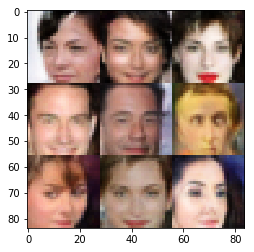

Epoch 8/10 - Batch 2310/3165 train_loss_d: 1.6398, train_loss_g: 0.4004
Epoch 8/10 - Batch 2320/3165 train_loss_d: 1.0905, train_loss_g: 1.1830
Epoch 8/10 - Batch 2330/3165 train_loss_d: 0.9453, train_loss_g: 1.1116
Epoch 8/10 - Batch 2340/3165 train_loss_d: 1.0590, train_loss_g: 1.0299
Epoch 8/10 - Batch 2350/3165 train_loss_d: 0.9851, train_loss_g: 1.1849
Epoch 8/10 - Batch 2360/3165 train_loss_d: 0.9604, train_loss_g: 1.1955
Epoch 8/10 - Batch 2370/3165 train_loss_d: 0.8064, train_loss_g: 1.3763
Epoch 8/10 - Batch 2380/3165 train_loss_d: 1.0159, train_loss_g: 0.8595
Epoch 8/10 - Batch 2390/3165 train_loss_d: 1.5456, train_loss_g: 0.4704
Epoch 8/10 - Batch 2400/3165 train_loss_d: 1.1544, train_loss_g: 0.7675
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_248/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_248/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_248/Maximum_2:0", sha

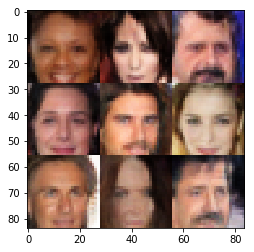

Epoch 8/10 - Batch 2410/3165 train_loss_d: 0.8605, train_loss_g: 1.1948
Epoch 8/10 - Batch 2420/3165 train_loss_d: 1.0212, train_loss_g: 0.8642
Epoch 8/10 - Batch 2430/3165 train_loss_d: 1.1177, train_loss_g: 1.3602
Epoch 8/10 - Batch 2440/3165 train_loss_d: 0.8225, train_loss_g: 1.6746
Epoch 8/10 - Batch 2450/3165 train_loss_d: 0.8860, train_loss_g: 1.2719
Epoch 8/10 - Batch 2460/3165 train_loss_d: 1.6476, train_loss_g: 0.4639
Epoch 8/10 - Batch 2470/3165 train_loss_d: 1.0574, train_loss_g: 1.0893
Epoch 8/10 - Batch 2480/3165 train_loss_d: 0.9497, train_loss_g: 1.0491
Epoch 8/10 - Batch 2490/3165 train_loss_d: 1.0819, train_loss_g: 0.8649
Epoch 8/10 - Batch 2500/3165 train_loss_d: 0.9249, train_loss_g: 1.0440
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_249/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_249/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_249/Maximum_2:0", sha

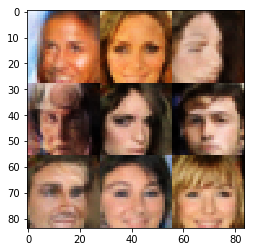

Epoch 8/10 - Batch 2510/3165 train_loss_d: 0.9603, train_loss_g: 1.1003
Epoch 8/10 - Batch 2520/3165 train_loss_d: 1.1737, train_loss_g: 0.6674
Epoch 8/10 - Batch 2530/3165 train_loss_d: 1.0675, train_loss_g: 0.8659
Epoch 8/10 - Batch 2540/3165 train_loss_d: 0.8784, train_loss_g: 1.2221
Epoch 8/10 - Batch 2550/3165 train_loss_d: 0.9881, train_loss_g: 1.0032
Epoch 8/10 - Batch 2560/3165 train_loss_d: 1.0747, train_loss_g: 0.8511
Epoch 8/10 - Batch 2570/3165 train_loss_d: 0.9427, train_loss_g: 0.9976
Epoch 8/10 - Batch 2580/3165 train_loss_d: 0.9005, train_loss_g: 1.2135
Epoch 8/10 - Batch 2590/3165 train_loss_d: 1.1081, train_loss_g: 1.4306
Epoch 8/10 - Batch 2600/3165 train_loss_d: 0.8328, train_loss_g: 1.3124
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_250/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_250/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_250/Maximum_2:0", sha

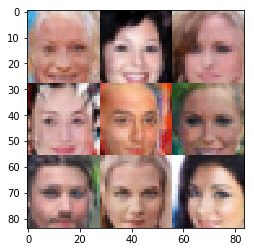

Epoch 8/10 - Batch 2610/3165 train_loss_d: 1.0059, train_loss_g: 1.2283
Epoch 8/10 - Batch 2620/3165 train_loss_d: 1.0579, train_loss_g: 0.8951
Epoch 8/10 - Batch 2630/3165 train_loss_d: 1.1314, train_loss_g: 0.8825
Epoch 8/10 - Batch 2640/3165 train_loss_d: 0.8517, train_loss_g: 1.4062
Epoch 8/10 - Batch 2650/3165 train_loss_d: 0.8670, train_loss_g: 1.5419
Epoch 8/10 - Batch 2660/3165 train_loss_d: 1.1215, train_loss_g: 1.6486
Epoch 8/10 - Batch 2670/3165 train_loss_d: 1.2953, train_loss_g: 0.7304
Epoch 8/10 - Batch 2680/3165 train_loss_d: 1.4277, train_loss_g: 0.5192
Epoch 8/10 - Batch 2690/3165 train_loss_d: 1.0310, train_loss_g: 0.9130
Epoch 8/10 - Batch 2700/3165 train_loss_d: 1.4562, train_loss_g: 2.5953
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_251/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_251/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_251/Maximum_2:0", sha

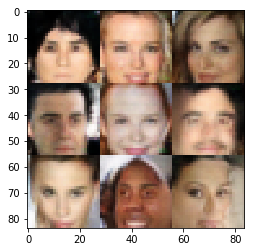

Epoch 8/10 - Batch 2710/3165 train_loss_d: 0.8169, train_loss_g: 1.3788
Epoch 8/10 - Batch 2720/3165 train_loss_d: 1.0058, train_loss_g: 0.8681
Epoch 8/10 - Batch 2730/3165 train_loss_d: 1.3338, train_loss_g: 0.6501
Epoch 8/10 - Batch 2740/3165 train_loss_d: 0.9121, train_loss_g: 1.2570
Epoch 8/10 - Batch 2750/3165 train_loss_d: 1.2892, train_loss_g: 0.6025
Epoch 8/10 - Batch 2760/3165 train_loss_d: 0.9319, train_loss_g: 1.5594
Epoch 8/10 - Batch 2770/3165 train_loss_d: 1.2564, train_loss_g: 0.6702
Epoch 8/10 - Batch 2780/3165 train_loss_d: 0.8760, train_loss_g: 1.1849
Epoch 8/10 - Batch 2790/3165 train_loss_d: 0.9155, train_loss_g: 1.2373
Epoch 8/10 - Batch 2800/3165 train_loss_d: 1.0259, train_loss_g: 1.5868
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_252/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_252/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_252/Maximum_2:0", sha

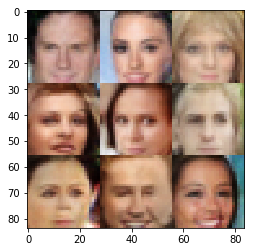

Epoch 8/10 - Batch 2810/3165 train_loss_d: 1.0243, train_loss_g: 0.9336
Epoch 8/10 - Batch 2820/3165 train_loss_d: 1.4163, train_loss_g: 0.5178
Epoch 8/10 - Batch 2830/3165 train_loss_d: 1.0925, train_loss_g: 1.9423
Epoch 8/10 - Batch 2840/3165 train_loss_d: 1.1079, train_loss_g: 0.8375
Epoch 8/10 - Batch 2850/3165 train_loss_d: 1.3910, train_loss_g: 0.5103
Epoch 8/10 - Batch 2860/3165 train_loss_d: 1.2545, train_loss_g: 0.6589
Epoch 8/10 - Batch 2870/3165 train_loss_d: 1.1645, train_loss_g: 1.0128
Epoch 8/10 - Batch 2880/3165 train_loss_d: 1.0803, train_loss_g: 0.7862
Epoch 8/10 - Batch 2890/3165 train_loss_d: 1.2826, train_loss_g: 0.6169
Epoch 8/10 - Batch 2900/3165 train_loss_d: 1.1779, train_loss_g: 0.7049
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_253/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_253/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_253/Maximum_2:0", sha

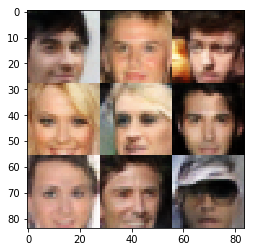

Epoch 8/10 - Batch 2910/3165 train_loss_d: 1.4502, train_loss_g: 0.5020
Epoch 8/10 - Batch 2920/3165 train_loss_d: 1.4997, train_loss_g: 0.4776
Epoch 8/10 - Batch 2930/3165 train_loss_d: 1.0054, train_loss_g: 1.2910
Epoch 8/10 - Batch 2940/3165 train_loss_d: 0.9989, train_loss_g: 1.0307
Epoch 8/10 - Batch 2950/3165 train_loss_d: 0.8370, train_loss_g: 1.6033
Epoch 8/10 - Batch 2960/3165 train_loss_d: 0.9973, train_loss_g: 0.9218
Epoch 8/10 - Batch 2970/3165 train_loss_d: 0.8975, train_loss_g: 1.0110
Epoch 8/10 - Batch 2980/3165 train_loss_d: 1.1968, train_loss_g: 0.7286
Epoch 8/10 - Batch 2990/3165 train_loss_d: 1.3898, train_loss_g: 0.5713
Epoch 8/10 - Batch 3000/3165 train_loss_d: 0.8975, train_loss_g: 1.2127
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_254/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_254/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_254/Maximum_2:0", sha

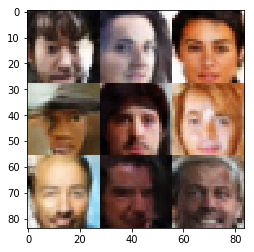

Epoch 8/10 - Batch 3010/3165 train_loss_d: 1.0227, train_loss_g: 0.9070
Epoch 8/10 - Batch 3020/3165 train_loss_d: 1.0003, train_loss_g: 0.8714
Epoch 8/10 - Batch 3030/3165 train_loss_d: 1.0223, train_loss_g: 0.9267
Epoch 8/10 - Batch 3040/3165 train_loss_d: 1.2587, train_loss_g: 0.6750
Epoch 8/10 - Batch 3050/3165 train_loss_d: 1.0368, train_loss_g: 1.2285
Epoch 8/10 - Batch 3060/3165 train_loss_d: 0.9308, train_loss_g: 1.0600
Epoch 8/10 - Batch 3070/3165 train_loss_d: 1.8695, train_loss_g: 0.2895
Epoch 8/10 - Batch 3080/3165 train_loss_d: 0.8242, train_loss_g: 1.1647
Epoch 8/10 - Batch 3090/3165 train_loss_d: 1.2348, train_loss_g: 0.6904
Epoch 8/10 - Batch 3100/3165 train_loss_d: 1.0134, train_loss_g: 1.0022
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_255/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_255/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_255/Maximum_2:0", sha

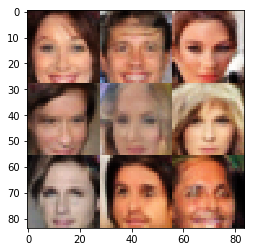

Epoch 8/10 - Batch 3110/3165 train_loss_d: 1.6088, train_loss_g: 0.4703
Epoch 8/10 - Batch 3120/3165 train_loss_d: 0.7752, train_loss_g: 1.6087
Epoch 8/10 - Batch 3130/3165 train_loss_d: 0.8862, train_loss_g: 1.3353
Epoch 8/10 - Batch 3140/3165 train_loss_d: 1.4066, train_loss_g: 0.5148
Epoch 8/10 - Batch 3150/3165 train_loss_d: 0.9904, train_loss_g: 0.9030
Epoch 8/10 - Batch 3160/3165 train_loss_d: 0.9609, train_loss_g: 1.4950
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_256/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_256/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_256/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_256/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


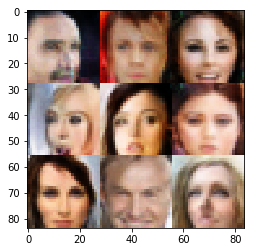


 80%|████████  | 8/10 [5:54:32<1:29:08, 2674.24s/it]

Epoch 9/10 - Batch 10/3165 train_loss_d: 1.0454, train_loss_g: 2.0919
Epoch 9/10 - Batch 20/3165 train_loss_d: 1.1006, train_loss_g: 0.7910
Epoch 9/10 - Batch 30/3165 train_loss_d: 1.3024, train_loss_g: 0.6113
Epoch 9/10 - Batch 40/3165 train_loss_d: 1.3966, train_loss_g: 0.5771
Epoch 9/10 - Batch 50/3165 train_loss_d: 0.9695, train_loss_g: 0.9889
Epoch 9/10 - Batch 60/3165 train_loss_d: 1.4776, train_loss_g: 0.5287
Epoch 9/10 - Batch 70/3165 train_loss_d: 1.0742, train_loss_g: 0.9026
Epoch 9/10 - Batch 80/3165 train_loss_d: 1.2424, train_loss_g: 1.7326
Epoch 9/10 - Batch 90/3165 train_loss_d: 0.9917, train_loss_g: 1.1156
Epoch 9/10 - Batch 100/3165 train_loss_d: 1.0488, train_loss_g: 0.8963
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_257/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_257/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_257/Maximum_2:0", shape=(?, 28, 28, 128)

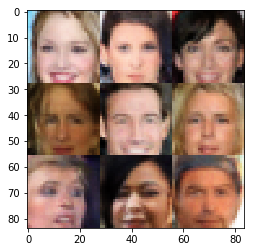

Epoch 9/10 - Batch 110/3165 train_loss_d: 1.0704, train_loss_g: 0.8139
Epoch 9/10 - Batch 120/3165 train_loss_d: 1.0318, train_loss_g: 1.2633
Epoch 9/10 - Batch 130/3165 train_loss_d: 1.2462, train_loss_g: 0.6294
Epoch 9/10 - Batch 140/3165 train_loss_d: 1.0384, train_loss_g: 0.9601
Epoch 9/10 - Batch 150/3165 train_loss_d: 1.1203, train_loss_g: 0.8250
Epoch 9/10 - Batch 160/3165 train_loss_d: 1.2864, train_loss_g: 0.6318
Epoch 9/10 - Batch 170/3165 train_loss_d: 1.2416, train_loss_g: 0.6421
Epoch 9/10 - Batch 180/3165 train_loss_d: 0.8756, train_loss_g: 1.2952
Epoch 9/10 - Batch 190/3165 train_loss_d: 1.2111, train_loss_g: 0.6935
Epoch 9/10 - Batch 200/3165 train_loss_d: 1.0801, train_loss_g: 0.8104
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_258/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_258/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_258/Maximum_2:0", shape=(?, 28,

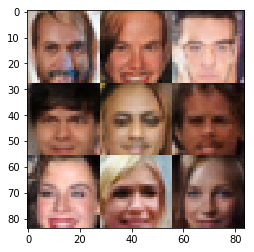

Epoch 9/10 - Batch 210/3165 train_loss_d: 1.3620, train_loss_g: 0.5391
Epoch 9/10 - Batch 220/3165 train_loss_d: 1.3050, train_loss_g: 0.5691
Epoch 9/10 - Batch 230/3165 train_loss_d: 0.8203, train_loss_g: 1.5144
Epoch 9/10 - Batch 240/3165 train_loss_d: 0.7778, train_loss_g: 1.3927
Epoch 9/10 - Batch 250/3165 train_loss_d: 0.9956, train_loss_g: 0.9267
Epoch 9/10 - Batch 260/3165 train_loss_d: 1.5375, train_loss_g: 0.4401
Epoch 9/10 - Batch 270/3165 train_loss_d: 0.9371, train_loss_g: 1.1203
Epoch 9/10 - Batch 280/3165 train_loss_d: 0.9020, train_loss_g: 1.4405
Epoch 9/10 - Batch 290/3165 train_loss_d: 1.1238, train_loss_g: 0.7895
Epoch 9/10 - Batch 300/3165 train_loss_d: 1.1226, train_loss_g: 0.7968
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_259/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_259/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_259/Maximum_2:0", shape=(?, 28,

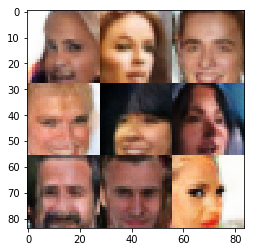

Epoch 9/10 - Batch 310/3165 train_loss_d: 1.0990, train_loss_g: 0.8101
Epoch 9/10 - Batch 320/3165 train_loss_d: 1.1695, train_loss_g: 0.6799
Epoch 9/10 - Batch 330/3165 train_loss_d: 1.0701, train_loss_g: 0.8333
Epoch 9/10 - Batch 340/3165 train_loss_d: 1.1431, train_loss_g: 0.7189
Epoch 9/10 - Batch 350/3165 train_loss_d: 0.8081, train_loss_g: 1.5310
Epoch 9/10 - Batch 360/3165 train_loss_d: 0.8702, train_loss_g: 1.0749
Epoch 9/10 - Batch 370/3165 train_loss_d: 1.4674, train_loss_g: 0.4921
Epoch 9/10 - Batch 380/3165 train_loss_d: 0.9194, train_loss_g: 1.0657
Epoch 9/10 - Batch 390/3165 train_loss_d: 1.3093, train_loss_g: 0.6001
Epoch 9/10 - Batch 400/3165 train_loss_d: 0.9255, train_loss_g: 1.9204
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_260/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_260/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_260/Maximum_2:0", shape=(?, 28,

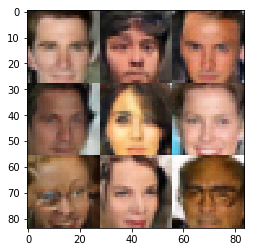

Epoch 9/10 - Batch 410/3165 train_loss_d: 0.9718, train_loss_g: 0.9423
Epoch 9/10 - Batch 420/3165 train_loss_d: 1.3630, train_loss_g: 0.5630
Epoch 9/10 - Batch 430/3165 train_loss_d: 1.6551, train_loss_g: 0.3782
Epoch 9/10 - Batch 440/3165 train_loss_d: 0.7738, train_loss_g: 1.7246
Epoch 9/10 - Batch 450/3165 train_loss_d: 1.5982, train_loss_g: 0.4580
Epoch 9/10 - Batch 460/3165 train_loss_d: 0.9109, train_loss_g: 1.0159
Epoch 9/10 - Batch 470/3165 train_loss_d: 1.0333, train_loss_g: 0.9780
Epoch 9/10 - Batch 480/3165 train_loss_d: 1.1994, train_loss_g: 0.7511
Epoch 9/10 - Batch 490/3165 train_loss_d: 0.9565, train_loss_g: 1.0654
Epoch 9/10 - Batch 500/3165 train_loss_d: 1.1339, train_loss_g: 0.8294
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_261/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_261/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_261/Maximum_2:0", shape=(?, 28,

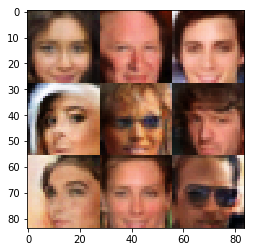

Epoch 9/10 - Batch 510/3165 train_loss_d: 1.0965, train_loss_g: 0.7884
Epoch 9/10 - Batch 520/3165 train_loss_d: 1.0860, train_loss_g: 0.8844
Epoch 9/10 - Batch 530/3165 train_loss_d: 1.0440, train_loss_g: 0.8029
Epoch 9/10 - Batch 540/3165 train_loss_d: 1.0030, train_loss_g: 1.1156
Epoch 9/10 - Batch 550/3165 train_loss_d: 1.0509, train_loss_g: 0.8597
Epoch 9/10 - Batch 560/3165 train_loss_d: 0.8177, train_loss_g: 1.8368
Epoch 9/10 - Batch 570/3165 train_loss_d: 0.9297, train_loss_g: 1.0002
Epoch 9/10 - Batch 580/3165 train_loss_d: 1.0609, train_loss_g: 0.8258
Epoch 9/10 - Batch 590/3165 train_loss_d: 1.0522, train_loss_g: 1.1126
Epoch 9/10 - Batch 600/3165 train_loss_d: 0.8595, train_loss_g: 1.1799
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_262/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_262/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_262/Maximum_2:0", shape=(?, 28,

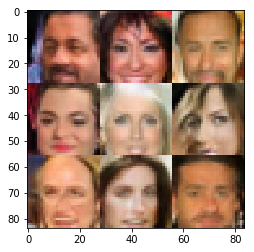

Epoch 9/10 - Batch 610/3165 train_loss_d: 1.0395, train_loss_g: 0.9393
Epoch 9/10 - Batch 620/3165 train_loss_d: 1.1519, train_loss_g: 0.7158
Epoch 9/10 - Batch 630/3165 train_loss_d: 1.0159, train_loss_g: 1.0397
Epoch 9/10 - Batch 640/3165 train_loss_d: 1.0354, train_loss_g: 0.9232
Epoch 9/10 - Batch 650/3165 train_loss_d: 0.9569, train_loss_g: 1.0746
Epoch 9/10 - Batch 660/3165 train_loss_d: 0.8251, train_loss_g: 1.6849
Epoch 9/10 - Batch 670/3165 train_loss_d: 1.4307, train_loss_g: 0.4957
Epoch 9/10 - Batch 680/3165 train_loss_d: 1.1973, train_loss_g: 0.7192
Epoch 9/10 - Batch 690/3165 train_loss_d: 1.4549, train_loss_g: 0.4861
Epoch 9/10 - Batch 700/3165 train_loss_d: 1.1744, train_loss_g: 0.7162
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_263/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_263/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_263/Maximum_2:0", shape=(?, 28,

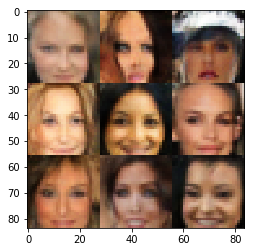

Epoch 9/10 - Batch 710/3165 train_loss_d: 0.8956, train_loss_g: 1.0903
Epoch 9/10 - Batch 720/3165 train_loss_d: 0.9323, train_loss_g: 1.0092
Epoch 9/10 - Batch 730/3165 train_loss_d: 0.9429, train_loss_g: 1.6697
Epoch 9/10 - Batch 740/3165 train_loss_d: 1.0076, train_loss_g: 1.2348
Epoch 9/10 - Batch 750/3165 train_loss_d: 0.9409, train_loss_g: 0.9287
Epoch 9/10 - Batch 760/3165 train_loss_d: 1.2200, train_loss_g: 0.6297
Epoch 9/10 - Batch 770/3165 train_loss_d: 1.1928, train_loss_g: 0.6433
Epoch 9/10 - Batch 780/3165 train_loss_d: 1.0676, train_loss_g: 1.0026
Epoch 9/10 - Batch 790/3165 train_loss_d: 1.1478, train_loss_g: 0.7272
Epoch 9/10 - Batch 800/3165 train_loss_d: 1.0103, train_loss_g: 1.0030
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_264/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_264/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_264/Maximum_2:0", shape=(?, 28,

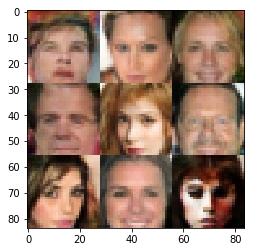

Epoch 9/10 - Batch 810/3165 train_loss_d: 1.4855, train_loss_g: 0.4602
Epoch 9/10 - Batch 820/3165 train_loss_d: 0.9473, train_loss_g: 1.1619
Epoch 9/10 - Batch 830/3165 train_loss_d: 1.1676, train_loss_g: 0.6962
Epoch 9/10 - Batch 840/3165 train_loss_d: 1.3035, train_loss_g: 0.5965
Epoch 9/10 - Batch 850/3165 train_loss_d: 1.0640, train_loss_g: 1.1896
Epoch 9/10 - Batch 860/3165 train_loss_d: 1.0444, train_loss_g: 0.8170
Epoch 9/10 - Batch 870/3165 train_loss_d: 0.8397, train_loss_g: 1.2243
Epoch 9/10 - Batch 880/3165 train_loss_d: 0.6519, train_loss_g: 1.6946
Epoch 9/10 - Batch 890/3165 train_loss_d: 1.2209, train_loss_g: 0.6605
Epoch 9/10 - Batch 900/3165 train_loss_d: 1.3653, train_loss_g: 0.5364
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_265/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_265/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_265/Maximum_2:0", shape=(?, 28,

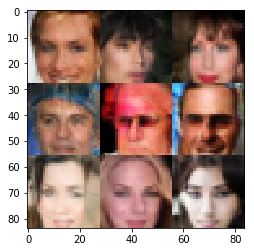

Epoch 9/10 - Batch 910/3165 train_loss_d: 1.1626, train_loss_g: 0.7423
Epoch 9/10 - Batch 920/3165 train_loss_d: 1.4432, train_loss_g: 0.5119
Epoch 9/10 - Batch 930/3165 train_loss_d: 1.2348, train_loss_g: 0.7363
Epoch 9/10 - Batch 940/3165 train_loss_d: 1.4711, train_loss_g: 0.4687
Epoch 9/10 - Batch 950/3165 train_loss_d: 1.1925, train_loss_g: 0.7287
Epoch 9/10 - Batch 960/3165 train_loss_d: 1.1676, train_loss_g: 1.8917
Epoch 9/10 - Batch 970/3165 train_loss_d: 1.5195, train_loss_g: 0.4579
Epoch 9/10 - Batch 980/3165 train_loss_d: 1.1285, train_loss_g: 0.9348
Epoch 9/10 - Batch 990/3165 train_loss_d: 1.2024, train_loss_g: 1.5228
Epoch 9/10 - Batch 1000/3165 train_loss_d: 1.1063, train_loss_g: 0.9290
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_266/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_266/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_266/Maximum_2:0", shape=(?, 28

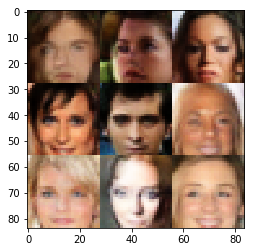

Epoch 9/10 - Batch 1010/3165 train_loss_d: 1.0698, train_loss_g: 0.7857
Epoch 9/10 - Batch 1020/3165 train_loss_d: 1.2599, train_loss_g: 0.7118
Epoch 9/10 - Batch 1030/3165 train_loss_d: 1.1337, train_loss_g: 0.7676
Epoch 9/10 - Batch 1040/3165 train_loss_d: 1.6158, train_loss_g: 0.4454
Epoch 9/10 - Batch 1050/3165 train_loss_d: 1.0185, train_loss_g: 0.9083
Epoch 9/10 - Batch 1060/3165 train_loss_d: 0.8956, train_loss_g: 1.2030
Epoch 9/10 - Batch 1070/3165 train_loss_d: 1.0420, train_loss_g: 1.4906
Epoch 9/10 - Batch 1080/3165 train_loss_d: 0.9837, train_loss_g: 2.6527
Epoch 9/10 - Batch 1090/3165 train_loss_d: 1.2553, train_loss_g: 0.6479
Epoch 9/10 - Batch 1100/3165 train_loss_d: 0.9571, train_loss_g: 1.5701
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_267/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_267/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_267/Maximum_2:0", sha

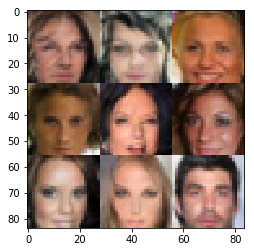

Epoch 9/10 - Batch 1110/3165 train_loss_d: 1.0440, train_loss_g: 0.8986
Epoch 9/10 - Batch 1120/3165 train_loss_d: 1.0709, train_loss_g: 1.8845
Epoch 9/10 - Batch 1130/3165 train_loss_d: 0.9541, train_loss_g: 1.0161
Epoch 9/10 - Batch 1140/3165 train_loss_d: 0.8786, train_loss_g: 1.3312
Epoch 9/10 - Batch 1150/3165 train_loss_d: 1.3083, train_loss_g: 0.6119
Epoch 9/10 - Batch 1160/3165 train_loss_d: 1.1875, train_loss_g: 0.6720
Epoch 9/10 - Batch 1170/3165 train_loss_d: 1.1308, train_loss_g: 0.8178
Epoch 9/10 - Batch 1180/3165 train_loss_d: 1.2014, train_loss_g: 0.6504
Epoch 9/10 - Batch 1190/3165 train_loss_d: 1.1416, train_loss_g: 2.4210
Epoch 9/10 - Batch 1200/3165 train_loss_d: 0.9156, train_loss_g: 1.0383
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_268/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_268/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_268/Maximum_2:0", sha

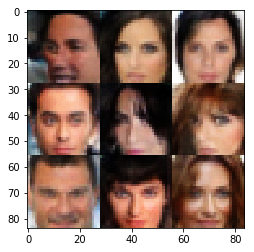

Epoch 9/10 - Batch 1210/3165 train_loss_d: 0.8794, train_loss_g: 1.1231
Epoch 9/10 - Batch 1220/3165 train_loss_d: 0.7824, train_loss_g: 1.4447
Epoch 9/10 - Batch 1230/3165 train_loss_d: 1.1647, train_loss_g: 0.7110
Epoch 9/10 - Batch 1240/3165 train_loss_d: 1.1324, train_loss_g: 0.7707
Epoch 9/10 - Batch 1250/3165 train_loss_d: 0.9656, train_loss_g: 1.1005
Epoch 9/10 - Batch 1260/3165 train_loss_d: 1.0238, train_loss_g: 0.8775
Epoch 9/10 - Batch 1270/3165 train_loss_d: 1.2594, train_loss_g: 1.5309
Epoch 9/10 - Batch 1280/3165 train_loss_d: 0.8125, train_loss_g: 1.2059
Epoch 9/10 - Batch 1290/3165 train_loss_d: 0.8817, train_loss_g: 1.2128
Epoch 9/10 - Batch 1300/3165 train_loss_d: 0.7308, train_loss_g: 1.8485
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_269/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_269/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_269/Maximum_2:0", sha

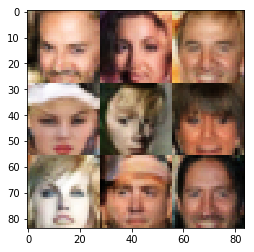

Epoch 9/10 - Batch 1310/3165 train_loss_d: 1.3292, train_loss_g: 0.6099
Epoch 9/10 - Batch 1320/3165 train_loss_d: 1.2708, train_loss_g: 0.6337
Epoch 9/10 - Batch 1330/3165 train_loss_d: 1.1631, train_loss_g: 1.6753
Epoch 9/10 - Batch 1340/3165 train_loss_d: 0.8126, train_loss_g: 1.3293
Epoch 9/10 - Batch 1350/3165 train_loss_d: 1.1260, train_loss_g: 0.7919
Epoch 9/10 - Batch 1360/3165 train_loss_d: 0.9303, train_loss_g: 1.0221
Epoch 9/10 - Batch 1370/3165 train_loss_d: 0.9522, train_loss_g: 0.9642
Epoch 9/10 - Batch 1380/3165 train_loss_d: 0.9688, train_loss_g: 0.9347
Epoch 9/10 - Batch 1390/3165 train_loss_d: 1.7293, train_loss_g: 0.3708
Epoch 9/10 - Batch 1400/3165 train_loss_d: 1.2644, train_loss_g: 0.6661
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_270/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_270/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_270/Maximum_2:0", sha

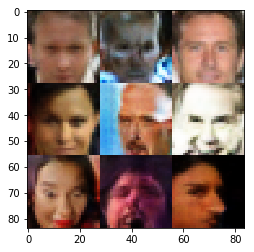

Epoch 9/10 - Batch 1410/3165 train_loss_d: 1.3657, train_loss_g: 0.5490
Epoch 9/10 - Batch 1420/3165 train_loss_d: 1.1751, train_loss_g: 0.7382
Epoch 9/10 - Batch 1430/3165 train_loss_d: 1.0736, train_loss_g: 0.8887
Epoch 9/10 - Batch 1440/3165 train_loss_d: 1.0376, train_loss_g: 0.8255
Epoch 9/10 - Batch 1450/3165 train_loss_d: 1.2758, train_loss_g: 0.6083
Epoch 9/10 - Batch 1460/3165 train_loss_d: 1.2705, train_loss_g: 0.6810
Epoch 9/10 - Batch 1470/3165 train_loss_d: 1.7036, train_loss_g: 0.3787
Epoch 9/10 - Batch 1480/3165 train_loss_d: 0.8416, train_loss_g: 1.2705
Epoch 9/10 - Batch 1490/3165 train_loss_d: 0.8234, train_loss_g: 1.3775
Epoch 9/10 - Batch 1500/3165 train_loss_d: 0.8363, train_loss_g: 1.0906
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_271/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_271/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_271/Maximum_2:0", sha

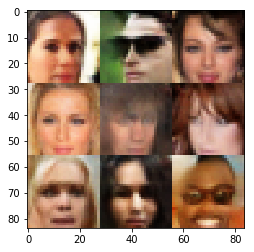

Epoch 9/10 - Batch 1510/3165 train_loss_d: 1.1612, train_loss_g: 0.7873
Epoch 9/10 - Batch 1520/3165 train_loss_d: 1.0711, train_loss_g: 0.9249
Epoch 9/10 - Batch 1530/3165 train_loss_d: 0.8946, train_loss_g: 1.0989
Epoch 9/10 - Batch 1540/3165 train_loss_d: 0.9206, train_loss_g: 1.2541
Epoch 9/10 - Batch 1550/3165 train_loss_d: 1.0671, train_loss_g: 1.2143
Epoch 9/10 - Batch 1560/3165 train_loss_d: 1.0429, train_loss_g: 1.6257
Epoch 9/10 - Batch 1570/3165 train_loss_d: 0.8189, train_loss_g: 1.6551
Epoch 9/10 - Batch 1580/3165 train_loss_d: 0.9211, train_loss_g: 1.0418
Epoch 9/10 - Batch 1590/3165 train_loss_d: 1.0627, train_loss_g: 0.8503
Epoch 9/10 - Batch 1600/3165 train_loss_d: 1.3779, train_loss_g: 0.5688
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_272/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_272/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_272/Maximum_2:0", sha

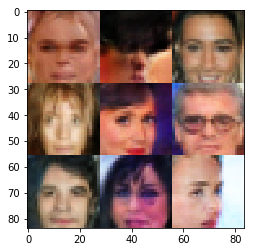

Epoch 9/10 - Batch 1610/3165 train_loss_d: 1.1107, train_loss_g: 0.8360
Epoch 9/10 - Batch 1620/3165 train_loss_d: 0.8323, train_loss_g: 1.3119
Epoch 9/10 - Batch 1630/3165 train_loss_d: 0.9613, train_loss_g: 0.9753
Epoch 9/10 - Batch 1640/3165 train_loss_d: 0.8744, train_loss_g: 1.0195
Epoch 9/10 - Batch 1650/3165 train_loss_d: 1.1846, train_loss_g: 0.6741
Epoch 9/10 - Batch 1660/3165 train_loss_d: 1.1639, train_loss_g: 0.7240
Epoch 9/10 - Batch 1670/3165 train_loss_d: 0.9571, train_loss_g: 1.1797
Epoch 9/10 - Batch 1680/3165 train_loss_d: 0.8720, train_loss_g: 1.2374
Epoch 9/10 - Batch 1690/3165 train_loss_d: 0.9390, train_loss_g: 1.1153
Epoch 9/10 - Batch 1700/3165 train_loss_d: 1.0338, train_loss_g: 0.9268
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_273/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_273/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_273/Maximum_2:0", sha

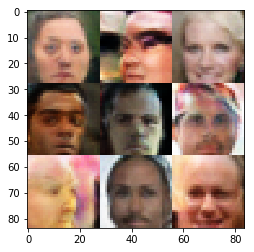

Epoch 9/10 - Batch 1710/3165 train_loss_d: 1.0862, train_loss_g: 0.7683
Epoch 9/10 - Batch 1720/3165 train_loss_d: 1.0271, train_loss_g: 0.9434
Epoch 9/10 - Batch 1730/3165 train_loss_d: 1.2548, train_loss_g: 0.6190
Epoch 9/10 - Batch 1740/3165 train_loss_d: 1.0401, train_loss_g: 1.1219
Epoch 9/10 - Batch 1750/3165 train_loss_d: 1.0284, train_loss_g: 1.2667
Epoch 9/10 - Batch 1760/3165 train_loss_d: 1.0873, train_loss_g: 0.8139
Epoch 9/10 - Batch 1770/3165 train_loss_d: 1.1398, train_loss_g: 0.7209
Epoch 9/10 - Batch 1780/3165 train_loss_d: 0.9377, train_loss_g: 1.1315
Epoch 9/10 - Batch 1790/3165 train_loss_d: 1.3136, train_loss_g: 0.5746
Epoch 9/10 - Batch 1800/3165 train_loss_d: 0.9189, train_loss_g: 0.9973
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_274/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_274/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_274/Maximum_2:0", sha

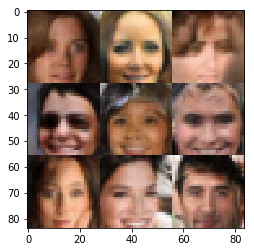

Epoch 9/10 - Batch 1810/3165 train_loss_d: 0.9278, train_loss_g: 1.9320
Epoch 9/10 - Batch 1820/3165 train_loss_d: 0.9127, train_loss_g: 1.3591
Epoch 9/10 - Batch 1830/3165 train_loss_d: 0.8075, train_loss_g: 1.2739
Epoch 9/10 - Batch 1840/3165 train_loss_d: 0.8296, train_loss_g: 1.1703
Epoch 9/10 - Batch 1850/3165 train_loss_d: 0.9292, train_loss_g: 1.0858
Epoch 9/10 - Batch 1860/3165 train_loss_d: 1.4254, train_loss_g: 0.4816
Epoch 9/10 - Batch 1870/3165 train_loss_d: 1.0801, train_loss_g: 0.8754
Epoch 9/10 - Batch 1880/3165 train_loss_d: 2.0907, train_loss_g: 0.2531
Epoch 9/10 - Batch 1890/3165 train_loss_d: 1.0249, train_loss_g: 2.1614
Epoch 9/10 - Batch 1900/3165 train_loss_d: 1.0033, train_loss_g: 0.9343
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_275/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_275/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_275/Maximum_2:0", sha

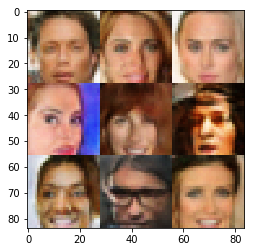

Epoch 9/10 - Batch 1910/3165 train_loss_d: 2.1150, train_loss_g: 0.2892
Epoch 9/10 - Batch 1920/3165 train_loss_d: 1.2670, train_loss_g: 0.6487
Epoch 9/10 - Batch 1930/3165 train_loss_d: 1.1400, train_loss_g: 0.7319
Epoch 9/10 - Batch 1940/3165 train_loss_d: 0.8638, train_loss_g: 1.4621
Epoch 9/10 - Batch 1950/3165 train_loss_d: 0.9678, train_loss_g: 1.0423
Epoch 9/10 - Batch 1960/3165 train_loss_d: 1.4186, train_loss_g: 0.6092
Epoch 9/10 - Batch 1970/3165 train_loss_d: 1.0036, train_loss_g: 1.1434
Epoch 9/10 - Batch 1980/3165 train_loss_d: 0.8151, train_loss_g: 1.3380
Epoch 9/10 - Batch 1990/3165 train_loss_d: 0.8890, train_loss_g: 1.2316
Epoch 9/10 - Batch 2000/3165 train_loss_d: 1.0952, train_loss_g: 0.7866
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_276/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_276/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_276/Maximum_2:0", sha

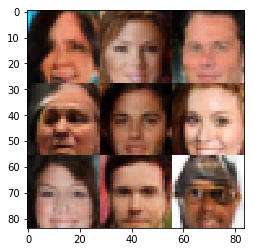

Epoch 9/10 - Batch 2010/3165 train_loss_d: 1.1849, train_loss_g: 0.7349
Epoch 9/10 - Batch 2020/3165 train_loss_d: 1.0597, train_loss_g: 0.8543
Epoch 9/10 - Batch 2030/3165 train_loss_d: 0.9286, train_loss_g: 1.0446
Epoch 9/10 - Batch 2040/3165 train_loss_d: 1.1137, train_loss_g: 0.8489
Epoch 9/10 - Batch 2050/3165 train_loss_d: 1.2232, train_loss_g: 0.6742
Epoch 9/10 - Batch 2060/3165 train_loss_d: 1.0020, train_loss_g: 1.0432
Epoch 9/10 - Batch 2070/3165 train_loss_d: 0.9488, train_loss_g: 1.0481
Epoch 9/10 - Batch 2080/3165 train_loss_d: 1.2697, train_loss_g: 0.6906
Epoch 9/10 - Batch 2090/3165 train_loss_d: 1.2572, train_loss_g: 0.6308
Epoch 9/10 - Batch 2100/3165 train_loss_d: 1.1781, train_loss_g: 0.7766
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_277/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_277/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_277/Maximum_2:0", sha

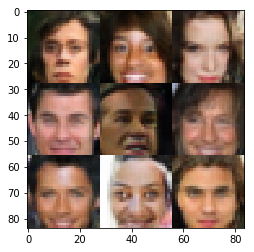

Epoch 9/10 - Batch 2110/3165 train_loss_d: 1.0257, train_loss_g: 1.8987
Epoch 9/10 - Batch 2120/3165 train_loss_d: 0.9794, train_loss_g: 1.3293
Epoch 9/10 - Batch 2130/3165 train_loss_d: 0.8966, train_loss_g: 1.7479
Epoch 9/10 - Batch 2140/3165 train_loss_d: 0.9402, train_loss_g: 1.0293
Epoch 9/10 - Batch 2150/3165 train_loss_d: 1.4035, train_loss_g: 0.5149
Epoch 9/10 - Batch 2160/3165 train_loss_d: 1.3345, train_loss_g: 0.5914
Epoch 9/10 - Batch 2170/3165 train_loss_d: 1.1693, train_loss_g: 0.7248
Epoch 9/10 - Batch 2180/3165 train_loss_d: 0.9294, train_loss_g: 1.3532
Epoch 9/10 - Batch 2190/3165 train_loss_d: 0.9752, train_loss_g: 0.9673
Epoch 9/10 - Batch 2200/3165 train_loss_d: 1.2126, train_loss_g: 0.6573
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_278/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_278/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_278/Maximum_2:0", sha

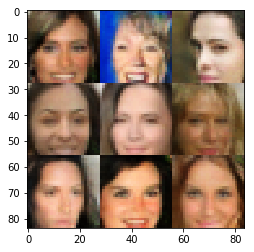

Epoch 9/10 - Batch 2210/3165 train_loss_d: 1.1780, train_loss_g: 0.7030
Epoch 9/10 - Batch 2220/3165 train_loss_d: 1.0423, train_loss_g: 0.9699
Epoch 9/10 - Batch 2230/3165 train_loss_d: 0.9372, train_loss_g: 1.4864
Epoch 9/10 - Batch 2240/3165 train_loss_d: 0.6914, train_loss_g: 1.5449
Epoch 9/10 - Batch 2250/3165 train_loss_d: 1.1077, train_loss_g: 0.9708
Epoch 9/10 - Batch 2260/3165 train_loss_d: 0.9395, train_loss_g: 1.0032
Epoch 9/10 - Batch 2270/3165 train_loss_d: 1.2530, train_loss_g: 0.6275
Epoch 9/10 - Batch 2280/3165 train_loss_d: 1.2597, train_loss_g: 0.6502
Epoch 9/10 - Batch 2290/3165 train_loss_d: 0.9503, train_loss_g: 1.1069
Epoch 9/10 - Batch 2300/3165 train_loss_d: 0.8205, train_loss_g: 1.2386
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_279/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_279/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_279/Maximum_2:0", sha

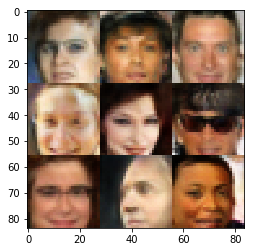

Epoch 9/10 - Batch 2310/3165 train_loss_d: 1.3792, train_loss_g: 0.6020
Epoch 9/10 - Batch 2320/3165 train_loss_d: 0.9130, train_loss_g: 1.2924
Epoch 9/10 - Batch 2330/3165 train_loss_d: 1.0193, train_loss_g: 0.9160
Epoch 9/10 - Batch 2340/3165 train_loss_d: 0.8022, train_loss_g: 1.3430
Epoch 9/10 - Batch 2350/3165 train_loss_d: 0.8637, train_loss_g: 1.4756
Epoch 9/10 - Batch 2360/3165 train_loss_d: 1.0138, train_loss_g: 2.1506
Epoch 9/10 - Batch 2370/3165 train_loss_d: 0.8849, train_loss_g: 1.2117
Epoch 9/10 - Batch 2380/3165 train_loss_d: 0.7963, train_loss_g: 1.2377
Epoch 9/10 - Batch 2390/3165 train_loss_d: 1.5845, train_loss_g: 0.4531
Epoch 9/10 - Batch 2400/3165 train_loss_d: 0.7273, train_loss_g: 1.5536
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_280/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_280/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_280/Maximum_2:0", sha

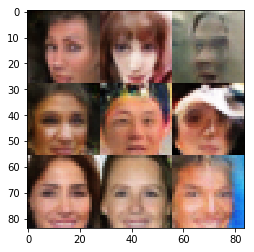

Epoch 9/10 - Batch 2410/3165 train_loss_d: 0.9796, train_loss_g: 1.0200
Epoch 9/10 - Batch 2420/3165 train_loss_d: 1.2194, train_loss_g: 0.6748
Epoch 9/10 - Batch 2430/3165 train_loss_d: 1.0139, train_loss_g: 1.1298
Epoch 9/10 - Batch 2440/3165 train_loss_d: 1.1119, train_loss_g: 0.7723
Epoch 9/10 - Batch 2450/3165 train_loss_d: 1.4587, train_loss_g: 0.5349
Epoch 9/10 - Batch 2460/3165 train_loss_d: 0.9532, train_loss_g: 1.0626
Epoch 9/10 - Batch 2470/3165 train_loss_d: 0.7113, train_loss_g: 1.7766
Epoch 9/10 - Batch 2480/3165 train_loss_d: 0.9025, train_loss_g: 2.0758
Epoch 9/10 - Batch 2490/3165 train_loss_d: 1.0085, train_loss_g: 1.1129
Epoch 9/10 - Batch 2500/3165 train_loss_d: 1.0227, train_loss_g: 1.4152
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_281/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_281/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_281/Maximum_2:0", sha

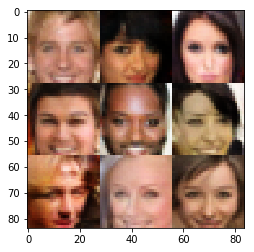

Epoch 9/10 - Batch 2510/3165 train_loss_d: 1.0757, train_loss_g: 0.9619
Epoch 9/10 - Batch 2520/3165 train_loss_d: 0.9046, train_loss_g: 1.1039
Epoch 9/10 - Batch 2530/3165 train_loss_d: 0.9960, train_loss_g: 1.0129
Epoch 9/10 - Batch 2540/3165 train_loss_d: 1.0244, train_loss_g: 1.2936
Epoch 9/10 - Batch 2550/3165 train_loss_d: 1.1380, train_loss_g: 1.2877
Epoch 9/10 - Batch 2560/3165 train_loss_d: 1.1799, train_loss_g: 0.6655
Epoch 9/10 - Batch 2570/3165 train_loss_d: 1.2268, train_loss_g: 0.6239
Epoch 9/10 - Batch 2580/3165 train_loss_d: 0.9058, train_loss_g: 1.1492
Epoch 9/10 - Batch 2590/3165 train_loss_d: 1.1152, train_loss_g: 1.2274
Epoch 9/10 - Batch 2600/3165 train_loss_d: 1.5424, train_loss_g: 0.4244
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_282/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_282/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_282/Maximum_2:0", sha

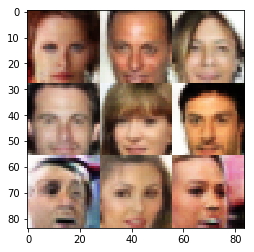

Epoch 9/10 - Batch 2610/3165 train_loss_d: 1.1267, train_loss_g: 0.8256
Epoch 9/10 - Batch 2620/3165 train_loss_d: 1.2242, train_loss_g: 1.6144
Epoch 9/10 - Batch 2630/3165 train_loss_d: 1.2548, train_loss_g: 1.3494
Epoch 9/10 - Batch 2640/3165 train_loss_d: 1.1359, train_loss_g: 0.7231
Epoch 9/10 - Batch 2650/3165 train_loss_d: 0.9425, train_loss_g: 1.1400
Epoch 9/10 - Batch 2660/3165 train_loss_d: 0.9171, train_loss_g: 1.1551
Epoch 9/10 - Batch 2670/3165 train_loss_d: 0.9641, train_loss_g: 1.1187
Epoch 9/10 - Batch 2680/3165 train_loss_d: 1.2874, train_loss_g: 0.6494
Epoch 9/10 - Batch 2690/3165 train_loss_d: 1.1341, train_loss_g: 0.7517
Epoch 9/10 - Batch 2700/3165 train_loss_d: 1.0436, train_loss_g: 1.0079
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_283/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_283/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_283/Maximum_2:0", sha

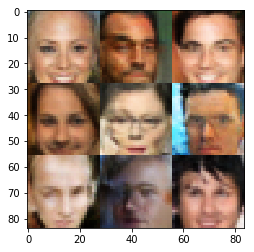

Epoch 9/10 - Batch 2710/3165 train_loss_d: 1.0397, train_loss_g: 0.8253
Epoch 9/10 - Batch 2720/3165 train_loss_d: 0.6512, train_loss_g: 2.0436
Epoch 9/10 - Batch 2730/3165 train_loss_d: 1.3134, train_loss_g: 0.6408
Epoch 9/10 - Batch 2740/3165 train_loss_d: 1.0438, train_loss_g: 0.8515
Epoch 9/10 - Batch 2750/3165 train_loss_d: 1.4465, train_loss_g: 0.5152
Epoch 9/10 - Batch 2760/3165 train_loss_d: 0.9761, train_loss_g: 0.9243
Epoch 9/10 - Batch 2770/3165 train_loss_d: 0.8936, train_loss_g: 1.2706
Epoch 9/10 - Batch 2780/3165 train_loss_d: 1.0119, train_loss_g: 0.9631
Epoch 9/10 - Batch 2790/3165 train_loss_d: 1.1639, train_loss_g: 0.7345
Epoch 9/10 - Batch 2800/3165 train_loss_d: 0.9715, train_loss_g: 1.0384
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_284/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_284/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_284/Maximum_2:0", sha

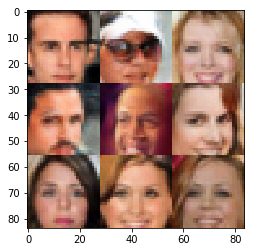

Epoch 9/10 - Batch 2810/3165 train_loss_d: 1.4992, train_loss_g: 0.5181
Epoch 9/10 - Batch 2820/3165 train_loss_d: 1.4457, train_loss_g: 0.4849
Epoch 9/10 - Batch 2830/3165 train_loss_d: 0.9494, train_loss_g: 1.6871
Epoch 9/10 - Batch 2840/3165 train_loss_d: 1.2512, train_loss_g: 0.6028
Epoch 9/10 - Batch 2850/3165 train_loss_d: 1.4522, train_loss_g: 0.5103
Epoch 9/10 - Batch 2860/3165 train_loss_d: 1.0891, train_loss_g: 0.7685
Epoch 9/10 - Batch 2870/3165 train_loss_d: 0.9509, train_loss_g: 2.1369
Epoch 9/10 - Batch 2880/3165 train_loss_d: 1.1418, train_loss_g: 0.7894
Epoch 9/10 - Batch 2890/3165 train_loss_d: 0.9984, train_loss_g: 0.9781
Epoch 9/10 - Batch 2900/3165 train_loss_d: 1.4309, train_loss_g: 0.5207
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_285/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_285/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_285/Maximum_2:0", sha

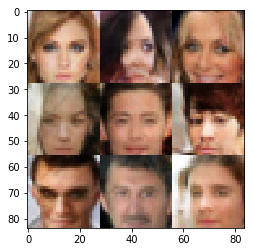

Epoch 9/10 - Batch 2910/3165 train_loss_d: 1.0204, train_loss_g: 0.9257
Epoch 9/10 - Batch 2920/3165 train_loss_d: 1.4471, train_loss_g: 0.4882
Epoch 9/10 - Batch 2930/3165 train_loss_d: 0.7293, train_loss_g: 1.3980
Epoch 9/10 - Batch 2940/3165 train_loss_d: 1.3832, train_loss_g: 0.5450
Epoch 9/10 - Batch 2950/3165 train_loss_d: 0.9364, train_loss_g: 0.9956
Epoch 9/10 - Batch 2960/3165 train_loss_d: 1.4745, train_loss_g: 0.6300
Epoch 9/10 - Batch 2970/3165 train_loss_d: 0.7662, train_loss_g: 1.3358
Epoch 9/10 - Batch 2980/3165 train_loss_d: 0.9825, train_loss_g: 0.9463
Epoch 9/10 - Batch 2990/3165 train_loss_d: 0.8453, train_loss_g: 1.6939
Epoch 9/10 - Batch 3000/3165 train_loss_d: 1.3996, train_loss_g: 0.5600
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_286/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_286/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_286/Maximum_2:0", sha

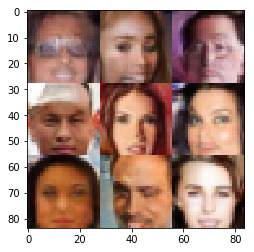

Epoch 9/10 - Batch 3010/3165 train_loss_d: 1.0481, train_loss_g: 0.8252
Epoch 9/10 - Batch 3020/3165 train_loss_d: 0.9541, train_loss_g: 1.1511
Epoch 9/10 - Batch 3030/3165 train_loss_d: 1.4618, train_loss_g: 0.5156
Epoch 9/10 - Batch 3040/3165 train_loss_d: 1.2058, train_loss_g: 0.7455
Epoch 9/10 - Batch 3050/3165 train_loss_d: 0.9423, train_loss_g: 0.9681
Epoch 9/10 - Batch 3060/3165 train_loss_d: 0.8507, train_loss_g: 1.2950
Epoch 9/10 - Batch 3070/3165 train_loss_d: 1.2114, train_loss_g: 0.7384
Epoch 9/10 - Batch 3080/3165 train_loss_d: 0.8622, train_loss_g: 1.1681
Epoch 9/10 - Batch 3090/3165 train_loss_d: 0.8121, train_loss_g: 1.2893
Epoch 9/10 - Batch 3100/3165 train_loss_d: 1.2426, train_loss_g: 0.6363
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_287/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_287/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_287/Maximum_2:0", sha

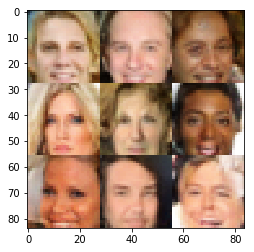

Epoch 9/10 - Batch 3110/3165 train_loss_d: 1.0343, train_loss_g: 0.9495
Epoch 9/10 - Batch 3120/3165 train_loss_d: 0.7086, train_loss_g: 1.6593
Epoch 9/10 - Batch 3130/3165 train_loss_d: 1.1673, train_loss_g: 2.1966
Epoch 9/10 - Batch 3140/3165 train_loss_d: 1.2839, train_loss_g: 0.6057
Epoch 9/10 - Batch 3150/3165 train_loss_d: 0.9212, train_loss_g: 1.1559
Epoch 9/10 - Batch 3160/3165 train_loss_d: 1.1692, train_loss_g: 0.7953
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_288/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_288/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_288/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_288/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


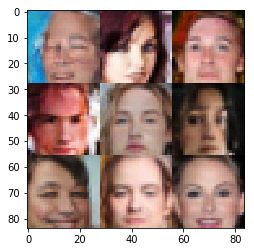


 90%|█████████ | 9/10 [6:39:10<44:35, 2675.53s/it]  

Epoch 10/10 - Batch 10/3165 train_loss_d: 1.0643, train_loss_g: 0.8773
Epoch 10/10 - Batch 20/3165 train_loss_d: 0.9814, train_loss_g: 0.9740
Epoch 10/10 - Batch 30/3165 train_loss_d: 1.0438, train_loss_g: 0.8385
Epoch 10/10 - Batch 40/3165 train_loss_d: 0.8446, train_loss_g: 1.1508
Epoch 10/10 - Batch 50/3165 train_loss_d: 0.9032, train_loss_g: 1.0320
Epoch 10/10 - Batch 60/3165 train_loss_d: 1.3233, train_loss_g: 0.5760
Epoch 10/10 - Batch 70/3165 train_loss_d: 0.9905, train_loss_g: 1.0570
Epoch 10/10 - Batch 80/3165 train_loss_d: 1.2183, train_loss_g: 0.6715
Epoch 10/10 - Batch 90/3165 train_loss_d: 1.0969, train_loss_g: 0.8142
Epoch 10/10 - Batch 100/3165 train_loss_d: 1.1358, train_loss_g: 0.7129
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_289/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_289/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_289/Maximum_2:0", shape=(?, 28

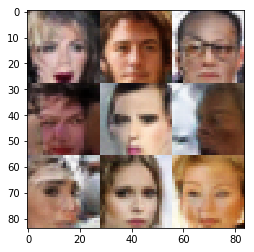

Epoch 10/10 - Batch 110/3165 train_loss_d: 1.0964, train_loss_g: 0.7740
Epoch 10/10 - Batch 120/3165 train_loss_d: 1.0564, train_loss_g: 1.4469
Epoch 10/10 - Batch 130/3165 train_loss_d: 1.4915, train_loss_g: 0.4562
Epoch 10/10 - Batch 140/3165 train_loss_d: 1.1077, train_loss_g: 0.8506
Epoch 10/10 - Batch 150/3165 train_loss_d: 1.3865, train_loss_g: 0.5459
Epoch 10/10 - Batch 160/3165 train_loss_d: 1.2446, train_loss_g: 0.6555
Epoch 10/10 - Batch 170/3165 train_loss_d: 1.1512, train_loss_g: 0.7249
Epoch 10/10 - Batch 180/3165 train_loss_d: 1.2580, train_loss_g: 0.6165
Epoch 10/10 - Batch 190/3165 train_loss_d: 0.9577, train_loss_g: 1.0547
Epoch 10/10 - Batch 200/3165 train_loss_d: 1.0912, train_loss_g: 0.7469
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_290/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_290/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_290/Maximum_2:0", sha

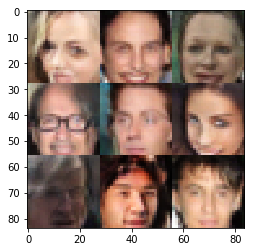

Epoch 10/10 - Batch 210/3165 train_loss_d: 0.8376, train_loss_g: 1.1163
Epoch 10/10 - Batch 220/3165 train_loss_d: 0.8845, train_loss_g: 1.1752
Epoch 10/10 - Batch 230/3165 train_loss_d: 1.1624, train_loss_g: 1.9652
Epoch 10/10 - Batch 240/3165 train_loss_d: 1.0988, train_loss_g: 0.8464
Epoch 10/10 - Batch 250/3165 train_loss_d: 0.9367, train_loss_g: 1.0661
Epoch 10/10 - Batch 260/3165 train_loss_d: 1.3057, train_loss_g: 0.6081
Epoch 10/10 - Batch 270/3165 train_loss_d: 1.4392, train_loss_g: 0.5128
Epoch 10/10 - Batch 280/3165 train_loss_d: 0.9247, train_loss_g: 1.3979
Epoch 10/10 - Batch 290/3165 train_loss_d: 0.9219, train_loss_g: 1.1670
Epoch 10/10 - Batch 300/3165 train_loss_d: 1.3373, train_loss_g: 0.5654
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_291/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_291/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_291/Maximum_2:0", sha

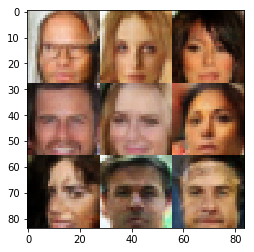

Epoch 10/10 - Batch 310/3165 train_loss_d: 1.0680, train_loss_g: 1.3889
Epoch 10/10 - Batch 320/3165 train_loss_d: 1.1461, train_loss_g: 0.7303
Epoch 10/10 - Batch 330/3165 train_loss_d: 0.9980, train_loss_g: 0.8932
Epoch 10/10 - Batch 340/3165 train_loss_d: 0.9685, train_loss_g: 1.0849
Epoch 10/10 - Batch 350/3165 train_loss_d: 0.6567, train_loss_g: 1.8356
Epoch 10/10 - Batch 360/3165 train_loss_d: 0.9379, train_loss_g: 1.0327
Epoch 10/10 - Batch 370/3165 train_loss_d: 1.1826, train_loss_g: 0.6481
Epoch 10/10 - Batch 380/3165 train_loss_d: 0.7569, train_loss_g: 1.2778
Epoch 10/10 - Batch 390/3165 train_loss_d: 1.7581, train_loss_g: 2.9634
Epoch 10/10 - Batch 400/3165 train_loss_d: 1.1188, train_loss_g: 0.7406
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_292/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_292/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_292/Maximum_2:0", sha

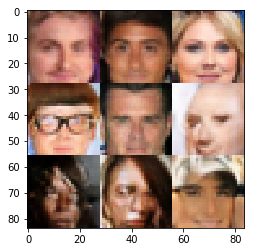

Epoch 10/10 - Batch 410/3165 train_loss_d: 0.9176, train_loss_g: 1.1675
Epoch 10/10 - Batch 420/3165 train_loss_d: 1.7126, train_loss_g: 0.3978
Epoch 10/10 - Batch 430/3165 train_loss_d: 1.5243, train_loss_g: 0.5097
Epoch 10/10 - Batch 440/3165 train_loss_d: 1.2429, train_loss_g: 0.6812
Epoch 10/10 - Batch 450/3165 train_loss_d: 1.0891, train_loss_g: 0.8358
Epoch 10/10 - Batch 460/3165 train_loss_d: 0.8652, train_loss_g: 1.2188
Epoch 10/10 - Batch 470/3165 train_loss_d: 1.4057, train_loss_g: 0.5346
Epoch 10/10 - Batch 480/3165 train_loss_d: 1.5274, train_loss_g: 0.4727
Epoch 10/10 - Batch 490/3165 train_loss_d: 0.7156, train_loss_g: 1.4679
Epoch 10/10 - Batch 500/3165 train_loss_d: 0.9643, train_loss_g: 1.2420
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_293/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_293/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_293/Maximum_2:0", sha

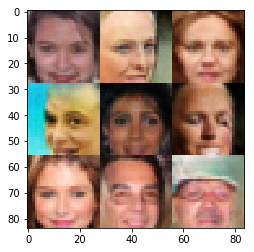

Epoch 10/10 - Batch 510/3165 train_loss_d: 0.9816, train_loss_g: 0.9609
Epoch 10/10 - Batch 520/3165 train_loss_d: 1.0971, train_loss_g: 0.8605
Epoch 10/10 - Batch 530/3165 train_loss_d: 1.3683, train_loss_g: 0.6142
Epoch 10/10 - Batch 540/3165 train_loss_d: 1.0429, train_loss_g: 0.8987
Epoch 10/10 - Batch 550/3165 train_loss_d: 1.3361, train_loss_g: 0.5883
Epoch 10/10 - Batch 560/3165 train_loss_d: 0.9466, train_loss_g: 1.5039
Epoch 10/10 - Batch 570/3165 train_loss_d: 0.9644, train_loss_g: 1.1240
Epoch 10/10 - Batch 580/3165 train_loss_d: 0.9558, train_loss_g: 1.0208
Epoch 10/10 - Batch 590/3165 train_loss_d: 1.0911, train_loss_g: 1.8073
Epoch 10/10 - Batch 600/3165 train_loss_d: 1.2180, train_loss_g: 0.6329
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_294/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_294/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_294/Maximum_2:0", sha

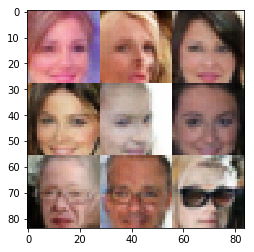

Epoch 10/10 - Batch 610/3165 train_loss_d: 0.7801, train_loss_g: 1.3716
Epoch 10/10 - Batch 620/3165 train_loss_d: 0.9216, train_loss_g: 1.5572
Epoch 10/10 - Batch 630/3165 train_loss_d: 0.9826, train_loss_g: 0.9322
Epoch 10/10 - Batch 640/3165 train_loss_d: 0.9235, train_loss_g: 1.3244
Epoch 10/10 - Batch 650/3165 train_loss_d: 0.8265, train_loss_g: 1.1530
Epoch 10/10 - Batch 660/3165 train_loss_d: 0.7021, train_loss_g: 1.5773
Epoch 10/10 - Batch 670/3165 train_loss_d: 1.4256, train_loss_g: 0.5629
Epoch 10/10 - Batch 680/3165 train_loss_d: 1.0790, train_loss_g: 0.8155
Epoch 10/10 - Batch 690/3165 train_loss_d: 1.4530, train_loss_g: 0.4954
Epoch 10/10 - Batch 700/3165 train_loss_d: 1.7951, train_loss_g: 0.3844
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_295/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_295/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_295/Maximum_2:0", sha

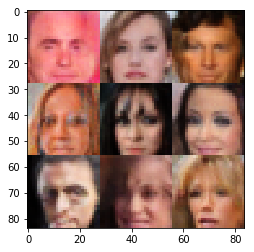

Epoch 10/10 - Batch 710/3165 train_loss_d: 0.7714, train_loss_g: 1.3810
Epoch 10/10 - Batch 720/3165 train_loss_d: 1.0030, train_loss_g: 0.9397
Epoch 10/10 - Batch 730/3165 train_loss_d: 1.5653, train_loss_g: 0.4471
Epoch 10/10 - Batch 740/3165 train_loss_d: 1.0655, train_loss_g: 1.0760
Epoch 10/10 - Batch 750/3165 train_loss_d: 0.8301, train_loss_g: 1.4755
Epoch 10/10 - Batch 760/3165 train_loss_d: 1.7915, train_loss_g: 0.3502
Epoch 10/10 - Batch 770/3165 train_loss_d: 1.0408, train_loss_g: 1.0933
Epoch 10/10 - Batch 780/3165 train_loss_d: 1.0546, train_loss_g: 0.9002
Epoch 10/10 - Batch 790/3165 train_loss_d: 1.4583, train_loss_g: 0.5088
Epoch 10/10 - Batch 800/3165 train_loss_d: 0.9283, train_loss_g: 1.4543
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_296/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_296/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_296/Maximum_2:0", sha

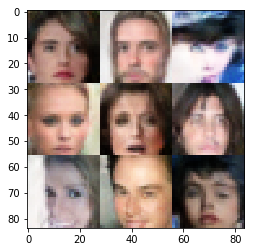

Epoch 10/10 - Batch 810/3165 train_loss_d: 0.7374, train_loss_g: 1.9689
Epoch 10/10 - Batch 820/3165 train_loss_d: 1.0251, train_loss_g: 1.0607
Epoch 10/10 - Batch 830/3165 train_loss_d: 0.9004, train_loss_g: 1.4640
Epoch 10/10 - Batch 840/3165 train_loss_d: 1.1819, train_loss_g: 0.7369
Epoch 10/10 - Batch 850/3165 train_loss_d: 1.0234, train_loss_g: 0.9276
Epoch 10/10 - Batch 860/3165 train_loss_d: 0.8748, train_loss_g: 1.2108
Epoch 10/10 - Batch 870/3165 train_loss_d: 0.8922, train_loss_g: 1.1874
Epoch 10/10 - Batch 880/3165 train_loss_d: 0.6870, train_loss_g: 1.7172
Epoch 10/10 - Batch 890/3165 train_loss_d: 1.1961, train_loss_g: 0.6840
Epoch 10/10 - Batch 900/3165 train_loss_d: 1.3964, train_loss_g: 0.5791
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_297/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_297/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_297/Maximum_2:0", sha

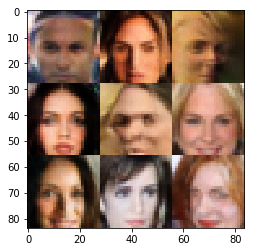

Epoch 10/10 - Batch 910/3165 train_loss_d: 0.7829, train_loss_g: 1.3644
Epoch 10/10 - Batch 920/3165 train_loss_d: 1.1153, train_loss_g: 0.7959
Epoch 10/10 - Batch 930/3165 train_loss_d: 0.8771, train_loss_g: 1.1003
Epoch 10/10 - Batch 940/3165 train_loss_d: 1.3460, train_loss_g: 0.5583
Epoch 10/10 - Batch 950/3165 train_loss_d: 1.3057, train_loss_g: 0.6117
Epoch 10/10 - Batch 960/3165 train_loss_d: 1.1320, train_loss_g: 2.1388
Epoch 10/10 - Batch 970/3165 train_loss_d: 1.2948, train_loss_g: 0.6035
Epoch 10/10 - Batch 980/3165 train_loss_d: 1.4056, train_loss_g: 0.5509
Epoch 10/10 - Batch 990/3165 train_loss_d: 1.1268, train_loss_g: 0.7094
Epoch 10/10 - Batch 1000/3165 train_loss_d: 1.1778, train_loss_g: 0.6820
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_298/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_298/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_298/Maximum_2:0", sh

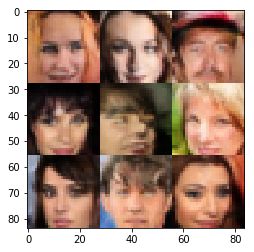

Epoch 10/10 - Batch 1010/3165 train_loss_d: 1.0247, train_loss_g: 0.8789
Epoch 10/10 - Batch 1020/3165 train_loss_d: 1.0041, train_loss_g: 1.1979
Epoch 10/10 - Batch 1030/3165 train_loss_d: 0.9595, train_loss_g: 1.0599
Epoch 10/10 - Batch 1040/3165 train_loss_d: 1.0297, train_loss_g: 0.9369
Epoch 10/10 - Batch 1050/3165 train_loss_d: 1.2435, train_loss_g: 2.2808
Epoch 10/10 - Batch 1060/3165 train_loss_d: 1.4157, train_loss_g: 0.5547
Epoch 10/10 - Batch 1070/3165 train_loss_d: 0.8638, train_loss_g: 1.1770
Epoch 10/10 - Batch 1080/3165 train_loss_d: 1.1866, train_loss_g: 0.7184
Epoch 10/10 - Batch 1090/3165 train_loss_d: 1.0548, train_loss_g: 0.8315
Epoch 10/10 - Batch 1100/3165 train_loss_d: 1.3643, train_loss_g: 0.5741
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_299/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_299/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_299/Maximum

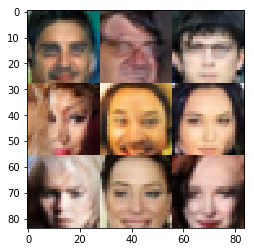

Epoch 10/10 - Batch 1110/3165 train_loss_d: 1.3592, train_loss_g: 0.5509
Epoch 10/10 - Batch 1120/3165 train_loss_d: 0.8044, train_loss_g: 1.5378
Epoch 10/10 - Batch 1130/3165 train_loss_d: 0.8755, train_loss_g: 1.2296
Epoch 10/10 - Batch 1140/3165 train_loss_d: 0.7685, train_loss_g: 1.7055
Epoch 10/10 - Batch 1150/3165 train_loss_d: 1.0329, train_loss_g: 0.9097
Epoch 10/10 - Batch 1160/3165 train_loss_d: 1.4698, train_loss_g: 0.5447
Epoch 10/10 - Batch 1170/3165 train_loss_d: 1.4140, train_loss_g: 0.5666
Epoch 10/10 - Batch 1180/3165 train_loss_d: 1.0063, train_loss_g: 0.9455
Epoch 10/10 - Batch 1190/3165 train_loss_d: 1.0109, train_loss_g: 0.9163
Epoch 10/10 - Batch 1200/3165 train_loss_d: 1.4315, train_loss_g: 0.5139
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_300/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_300/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_300/Maximum

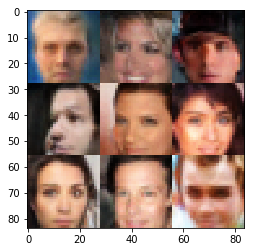

Epoch 10/10 - Batch 1210/3165 train_loss_d: 0.9849, train_loss_g: 1.0036
Epoch 10/10 - Batch 1220/3165 train_loss_d: 0.8848, train_loss_g: 1.4427
Epoch 10/10 - Batch 1230/3165 train_loss_d: 1.3625, train_loss_g: 0.5471
Epoch 10/10 - Batch 1240/3165 train_loss_d: 1.4884, train_loss_g: 0.4579
Epoch 10/10 - Batch 1250/3165 train_loss_d: 1.0215, train_loss_g: 0.8325
Epoch 10/10 - Batch 1260/3165 train_loss_d: 0.9301, train_loss_g: 0.9646
Epoch 10/10 - Batch 1270/3165 train_loss_d: 0.9628, train_loss_g: 1.3582
Epoch 10/10 - Batch 1280/3165 train_loss_d: 1.1029, train_loss_g: 0.7871
Epoch 10/10 - Batch 1290/3165 train_loss_d: 0.8621, train_loss_g: 1.1149
Epoch 10/10 - Batch 1300/3165 train_loss_d: 0.8714, train_loss_g: 1.6664
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_301/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_301/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_301/Maximum

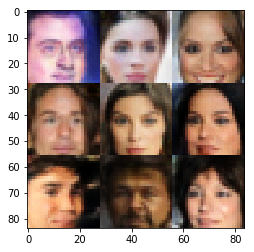

Epoch 10/10 - Batch 1310/3165 train_loss_d: 0.7473, train_loss_g: 2.3742
Epoch 10/10 - Batch 1320/3165 train_loss_d: 1.0071, train_loss_g: 1.0449
Epoch 10/10 - Batch 1330/3165 train_loss_d: 1.5015, train_loss_g: 0.4641
Epoch 10/10 - Batch 1340/3165 train_loss_d: 0.9092, train_loss_g: 1.3016
Epoch 10/10 - Batch 1350/3165 train_loss_d: 1.4372, train_loss_g: 0.5228
Epoch 10/10 - Batch 1360/3165 train_loss_d: 0.8457, train_loss_g: 1.1929
Epoch 10/10 - Batch 1370/3165 train_loss_d: 1.2986, train_loss_g: 0.5770
Epoch 10/10 - Batch 1380/3165 train_loss_d: 0.9578, train_loss_g: 1.4500
Epoch 10/10 - Batch 1390/3165 train_loss_d: 1.0484, train_loss_g: 0.9405
Epoch 10/10 - Batch 1400/3165 train_loss_d: 1.3585, train_loss_g: 0.5980
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_302/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_302/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_302/Maximum

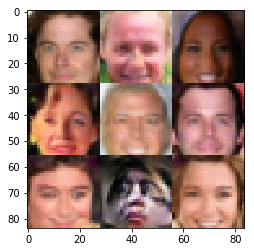

Epoch 10/10 - Batch 1410/3165 train_loss_d: 1.6815, train_loss_g: 0.4370
Epoch 10/10 - Batch 1420/3165 train_loss_d: 0.8601, train_loss_g: 1.1666
Epoch 10/10 - Batch 1430/3165 train_loss_d: 1.1003, train_loss_g: 0.7738
Epoch 10/10 - Batch 1440/3165 train_loss_d: 0.7794, train_loss_g: 1.3215
Epoch 10/10 - Batch 1450/3165 train_loss_d: 1.4183, train_loss_g: 0.5101
Epoch 10/10 - Batch 1460/3165 train_loss_d: 0.9346, train_loss_g: 1.4231
Epoch 10/10 - Batch 1470/3165 train_loss_d: 1.7853, train_loss_g: 0.3841
Epoch 10/10 - Batch 1480/3165 train_loss_d: 1.2984, train_loss_g: 0.5892
Epoch 10/10 - Batch 1490/3165 train_loss_d: 0.9103, train_loss_g: 1.0287
Epoch 10/10 - Batch 1500/3165 train_loss_d: 1.3018, train_loss_g: 0.6410
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_303/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_303/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_303/Maximum

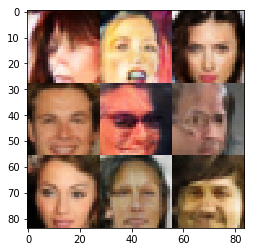

Epoch 10/10 - Batch 1510/3165 train_loss_d: 1.3444, train_loss_g: 0.5970
Epoch 10/10 - Batch 1520/3165 train_loss_d: 1.2561, train_loss_g: 0.5903
Epoch 10/10 - Batch 1530/3165 train_loss_d: 1.0069, train_loss_g: 0.9469
Epoch 10/10 - Batch 1540/3165 train_loss_d: 0.9007, train_loss_g: 1.0567
Epoch 10/10 - Batch 1550/3165 train_loss_d: 1.6412, train_loss_g: 0.4229
Epoch 10/10 - Batch 1560/3165 train_loss_d: 1.0694, train_loss_g: 0.8375
Epoch 10/10 - Batch 1570/3165 train_loss_d: 1.0056, train_loss_g: 0.9447
Epoch 10/10 - Batch 1580/3165 train_loss_d: 1.1480, train_loss_g: 2.5787
Epoch 10/10 - Batch 1590/3165 train_loss_d: 1.1845, train_loss_g: 0.8436
Epoch 10/10 - Batch 1600/3165 train_loss_d: 0.9927, train_loss_g: 0.9680
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_304/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_304/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_304/Maximum

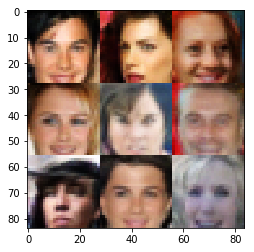

Epoch 10/10 - Batch 1610/3165 train_loss_d: 0.9716, train_loss_g: 1.0171
Epoch 10/10 - Batch 1620/3165 train_loss_d: 0.9914, train_loss_g: 1.1834
Epoch 10/10 - Batch 1630/3165 train_loss_d: 0.9176, train_loss_g: 1.0858
Epoch 10/10 - Batch 1640/3165 train_loss_d: 1.0172, train_loss_g: 1.0112
Epoch 10/10 - Batch 1650/3165 train_loss_d: 1.0577, train_loss_g: 0.8951
Epoch 10/10 - Batch 1660/3165 train_loss_d: 1.9130, train_loss_g: 0.3418
Epoch 10/10 - Batch 1670/3165 train_loss_d: 0.8427, train_loss_g: 1.4188
Epoch 10/10 - Batch 1680/3165 train_loss_d: 0.8847, train_loss_g: 1.2337
Epoch 10/10 - Batch 1690/3165 train_loss_d: 0.8443, train_loss_g: 1.2221
Epoch 10/10 - Batch 1700/3165 train_loss_d: 1.5769, train_loss_g: 3.1450
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_305/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_305/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_305/Maximum

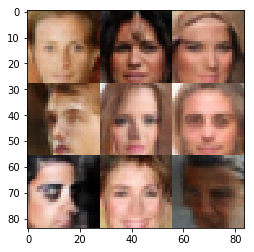

Epoch 10/10 - Batch 1710/3165 train_loss_d: 1.0103, train_loss_g: 0.8730
Epoch 10/10 - Batch 1720/3165 train_loss_d: 0.8519, train_loss_g: 1.6016
Epoch 10/10 - Batch 1730/3165 train_loss_d: 0.9635, train_loss_g: 0.9813
Epoch 10/10 - Batch 1740/3165 train_loss_d: 0.9580, train_loss_g: 2.0463
Epoch 10/10 - Batch 1750/3165 train_loss_d: 1.0836, train_loss_g: 0.7664
Epoch 10/10 - Batch 1760/3165 train_loss_d: 1.0012, train_loss_g: 0.9449
Epoch 10/10 - Batch 1770/3165 train_loss_d: 0.8232, train_loss_g: 1.3288
Epoch 10/10 - Batch 1780/3165 train_loss_d: 1.2273, train_loss_g: 0.7010
Epoch 10/10 - Batch 1790/3165 train_loss_d: 1.3817, train_loss_g: 0.5273
Epoch 10/10 - Batch 1800/3165 train_loss_d: 0.8712, train_loss_g: 2.1947
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_306/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_306/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_306/Maximum

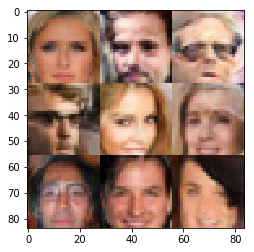

Epoch 10/10 - Batch 1810/3165 train_loss_d: 0.7522, train_loss_g: 1.9823
Epoch 10/10 - Batch 1820/3165 train_loss_d: 0.9915, train_loss_g: 0.9297
Epoch 10/10 - Batch 1830/3165 train_loss_d: 0.7561, train_loss_g: 1.4702
Epoch 10/10 - Batch 1840/3165 train_loss_d: 1.0658, train_loss_g: 0.8031
Epoch 10/10 - Batch 1850/3165 train_loss_d: 1.1404, train_loss_g: 0.7424
Epoch 10/10 - Batch 1860/3165 train_loss_d: 1.0241, train_loss_g: 0.8693
Epoch 10/10 - Batch 1870/3165 train_loss_d: 0.9355, train_loss_g: 0.9898
Epoch 10/10 - Batch 1880/3165 train_loss_d: 1.6538, train_loss_g: 0.3965
Epoch 10/10 - Batch 1890/3165 train_loss_d: 1.0088, train_loss_g: 1.7194
Epoch 10/10 - Batch 1900/3165 train_loss_d: 0.9766, train_loss_g: 0.9818
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_307/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_307/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_307/Maximum

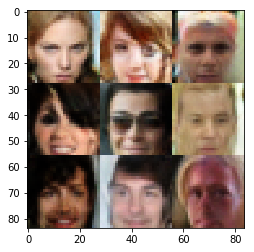

Epoch 10/10 - Batch 1910/3165 train_loss_d: 0.8723, train_loss_g: 1.3458
Epoch 10/10 - Batch 1920/3165 train_loss_d: 1.4964, train_loss_g: 0.5169
Epoch 10/10 - Batch 1930/3165 train_loss_d: 1.2112, train_loss_g: 0.6654
Epoch 10/10 - Batch 1940/3165 train_loss_d: 0.8771, train_loss_g: 1.1188
Epoch 10/10 - Batch 1950/3165 train_loss_d: 0.8971, train_loss_g: 1.0465
Epoch 10/10 - Batch 1960/3165 train_loss_d: 1.0235, train_loss_g: 0.7968
Epoch 10/10 - Batch 1970/3165 train_loss_d: 0.8539, train_loss_g: 1.6633
Epoch 10/10 - Batch 1980/3165 train_loss_d: 0.8803, train_loss_g: 1.5014
Epoch 10/10 - Batch 1990/3165 train_loss_d: 0.9776, train_loss_g: 1.5247
Epoch 10/10 - Batch 2000/3165 train_loss_d: 1.1941, train_loss_g: 0.6633
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_308/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_308/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_308/Maximum

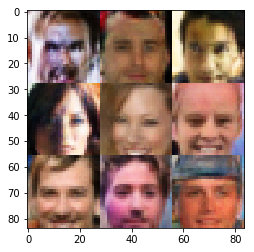

Epoch 10/10 - Batch 2010/3165 train_loss_d: 0.9049, train_loss_g: 1.5112
Epoch 10/10 - Batch 2020/3165 train_loss_d: 1.2658, train_loss_g: 0.6869
Epoch 10/10 - Batch 2030/3165 train_loss_d: 1.1067, train_loss_g: 0.7605
Epoch 10/10 - Batch 2040/3165 train_loss_d: 0.9914, train_loss_g: 1.1062
Epoch 10/10 - Batch 2050/3165 train_loss_d: 1.4437, train_loss_g: 0.5028
Epoch 10/10 - Batch 2060/3165 train_loss_d: 0.9440, train_loss_g: 1.7196
Epoch 10/10 - Batch 2070/3165 train_loss_d: 1.4420, train_loss_g: 0.5520
Epoch 10/10 - Batch 2080/3165 train_loss_d: 1.2323, train_loss_g: 2.4283
Epoch 10/10 - Batch 2090/3165 train_loss_d: 1.1701, train_loss_g: 0.7527
Epoch 10/10 - Batch 2100/3165 train_loss_d: 1.0831, train_loss_g: 0.8856
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_309/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_309/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_309/Maximum

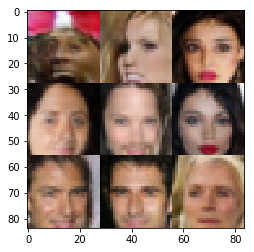

Epoch 10/10 - Batch 2110/3165 train_loss_d: 0.9608, train_loss_g: 0.9902
Epoch 10/10 - Batch 2120/3165 train_loss_d: 1.1141, train_loss_g: 2.4160
Epoch 10/10 - Batch 2130/3165 train_loss_d: 0.8037, train_loss_g: 1.5345
Epoch 10/10 - Batch 2140/3165 train_loss_d: 0.8840, train_loss_g: 1.4249
Epoch 10/10 - Batch 2150/3165 train_loss_d: 1.4199, train_loss_g: 2.6948
Epoch 10/10 - Batch 2160/3165 train_loss_d: 1.6678, train_loss_g: 0.4400
Epoch 10/10 - Batch 2170/3165 train_loss_d: 1.1037, train_loss_g: 0.8553
Epoch 10/10 - Batch 2180/3165 train_loss_d: 0.9827, train_loss_g: 1.6538
Epoch 10/10 - Batch 2190/3165 train_loss_d: 0.8963, train_loss_g: 1.2617
Epoch 10/10 - Batch 2200/3165 train_loss_d: 0.8372, train_loss_g: 1.2234
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_310/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_310/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_310/Maximum

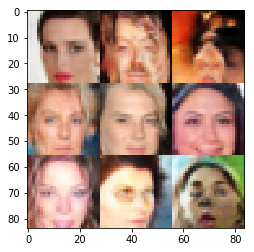

Epoch 10/10 - Batch 2210/3165 train_loss_d: 1.1117, train_loss_g: 0.7724
Epoch 10/10 - Batch 2220/3165 train_loss_d: 1.3879, train_loss_g: 2.4709
Epoch 10/10 - Batch 2230/3165 train_loss_d: 0.8853, train_loss_g: 1.7667
Epoch 10/10 - Batch 2240/3165 train_loss_d: 0.8793, train_loss_g: 1.2856
Epoch 10/10 - Batch 2250/3165 train_loss_d: 1.1978, train_loss_g: 0.7404
Epoch 10/10 - Batch 2260/3165 train_loss_d: 1.4680, train_loss_g: 0.4944
Epoch 10/10 - Batch 2270/3165 train_loss_d: 0.8983, train_loss_g: 1.1719
Epoch 10/10 - Batch 2280/3165 train_loss_d: 0.9614, train_loss_g: 0.9527
Epoch 10/10 - Batch 2290/3165 train_loss_d: 0.7401, train_loss_g: 1.9539
Epoch 10/10 - Batch 2300/3165 train_loss_d: 1.1481, train_loss_g: 0.7376
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_311/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_311/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_311/Maximum

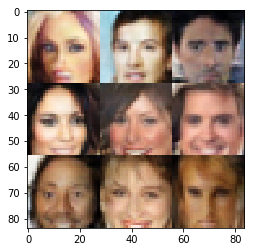

Epoch 10/10 - Batch 2310/3165 train_loss_d: 1.2663, train_loss_g: 0.6588
Epoch 10/10 - Batch 2320/3165 train_loss_d: 1.0639, train_loss_g: 0.8875
Epoch 10/10 - Batch 2330/3165 train_loss_d: 0.9730, train_loss_g: 0.9095
Epoch 10/10 - Batch 2340/3165 train_loss_d: 1.0040, train_loss_g: 1.7696
Epoch 10/10 - Batch 2350/3165 train_loss_d: 1.0568, train_loss_g: 0.8669
Epoch 10/10 - Batch 2360/3165 train_loss_d: 1.1964, train_loss_g: 0.6604
Epoch 10/10 - Batch 2370/3165 train_loss_d: 0.6995, train_loss_g: 1.9994
Epoch 10/10 - Batch 2380/3165 train_loss_d: 0.8487, train_loss_g: 1.5230
Epoch 10/10 - Batch 2390/3165 train_loss_d: 1.9835, train_loss_g: 0.3502
Epoch 10/10 - Batch 2400/3165 train_loss_d: 1.0096, train_loss_g: 0.9622
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_312/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_312/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_312/Maximum

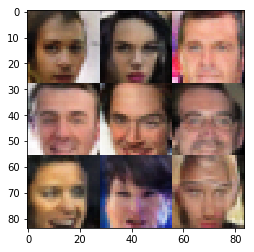

Epoch 10/10 - Batch 2410/3165 train_loss_d: 0.9183, train_loss_g: 1.1715
Epoch 10/10 - Batch 2420/3165 train_loss_d: 1.0221, train_loss_g: 0.9859
Epoch 10/10 - Batch 2430/3165 train_loss_d: 0.9754, train_loss_g: 1.3425
Epoch 10/10 - Batch 2440/3165 train_loss_d: 1.0348, train_loss_g: 0.9771
Epoch 10/10 - Batch 2450/3165 train_loss_d: 0.9266, train_loss_g: 1.7908
Epoch 10/10 - Batch 2460/3165 train_loss_d: 0.6721, train_loss_g: 1.7393
Epoch 10/10 - Batch 2470/3165 train_loss_d: 1.1242, train_loss_g: 0.9495
Epoch 10/10 - Batch 2480/3165 train_loss_d: 0.8302, train_loss_g: 1.3453
Epoch 10/10 - Batch 2490/3165 train_loss_d: 1.0451, train_loss_g: 0.9490
Epoch 10/10 - Batch 2500/3165 train_loss_d: 0.9382, train_loss_g: 1.2389
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_313/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_313/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_313/Maximum

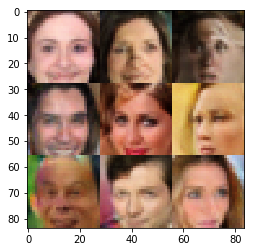

Epoch 10/10 - Batch 2510/3165 train_loss_d: 1.0000, train_loss_g: 0.9472
Epoch 10/10 - Batch 2520/3165 train_loss_d: 0.9907, train_loss_g: 0.9181
Epoch 10/10 - Batch 2530/3165 train_loss_d: 1.0283, train_loss_g: 1.5992
Epoch 10/10 - Batch 2540/3165 train_loss_d: 1.1387, train_loss_g: 1.8490
Epoch 10/10 - Batch 2550/3165 train_loss_d: 0.9652, train_loss_g: 1.4145
Epoch 10/10 - Batch 2560/3165 train_loss_d: 1.3855, train_loss_g: 0.5579
Epoch 10/10 - Batch 2570/3165 train_loss_d: 0.8028, train_loss_g: 1.1950
Epoch 10/10 - Batch 2580/3165 train_loss_d: 1.1052, train_loss_g: 1.8119
Epoch 10/10 - Batch 2590/3165 train_loss_d: 1.0043, train_loss_g: 1.4892
Epoch 10/10 - Batch 2600/3165 train_loss_d: 0.8756, train_loss_g: 1.1123
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_314/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_314/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_314/Maximum

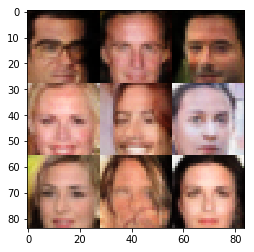

Epoch 10/10 - Batch 2610/3165 train_loss_d: 0.9355, train_loss_g: 0.9504
Epoch 10/10 - Batch 2620/3165 train_loss_d: 0.9179, train_loss_g: 1.1526
Epoch 10/10 - Batch 2630/3165 train_loss_d: 1.0074, train_loss_g: 1.3971
Epoch 10/10 - Batch 2640/3165 train_loss_d: 0.6935, train_loss_g: 1.8823
Epoch 10/10 - Batch 2650/3165 train_loss_d: 1.1034, train_loss_g: 0.8401
Epoch 10/10 - Batch 2660/3165 train_loss_d: 0.8743, train_loss_g: 1.5718
Epoch 10/10 - Batch 2670/3165 train_loss_d: 1.1398, train_loss_g: 0.7355
Epoch 10/10 - Batch 2680/3165 train_loss_d: 0.9784, train_loss_g: 0.8898
Epoch 10/10 - Batch 2690/3165 train_loss_d: 1.1283, train_loss_g: 0.8663
Epoch 10/10 - Batch 2700/3165 train_loss_d: 1.1636, train_loss_g: 0.8275
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_315/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_315/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_315/Maximum

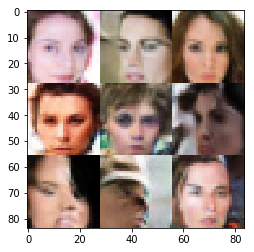

Epoch 10/10 - Batch 2710/3165 train_loss_d: 1.0522, train_loss_g: 0.8414
Epoch 10/10 - Batch 2720/3165 train_loss_d: 0.9795, train_loss_g: 1.1998
Epoch 10/10 - Batch 2730/3165 train_loss_d: 1.3613, train_loss_g: 0.5998
Epoch 10/10 - Batch 2740/3165 train_loss_d: 1.4855, train_loss_g: 0.5077
Epoch 10/10 - Batch 2750/3165 train_loss_d: 1.1703, train_loss_g: 0.7007
Epoch 10/10 - Batch 2760/3165 train_loss_d: 1.2191, train_loss_g: 0.6808
Epoch 10/10 - Batch 2770/3165 train_loss_d: 1.2885, train_loss_g: 0.6641
Epoch 10/10 - Batch 2780/3165 train_loss_d: 0.9715, train_loss_g: 0.9252
Epoch 10/10 - Batch 2790/3165 train_loss_d: 1.0629, train_loss_g: 0.8634
Epoch 10/10 - Batch 2800/3165 train_loss_d: 0.9530, train_loss_g: 1.6503
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_316/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_316/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_316/Maximum

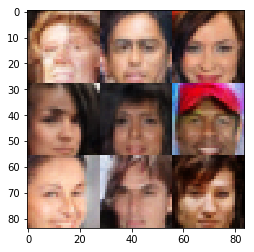

Epoch 10/10 - Batch 2810/3165 train_loss_d: 1.1492, train_loss_g: 0.7789
Epoch 10/10 - Batch 2820/3165 train_loss_d: 1.5311, train_loss_g: 0.4701
Epoch 10/10 - Batch 2830/3165 train_loss_d: 1.3078, train_loss_g: 1.8904
Epoch 10/10 - Batch 2840/3165 train_loss_d: 1.2624, train_loss_g: 0.6417
Epoch 10/10 - Batch 2850/3165 train_loss_d: 0.9116, train_loss_g: 1.1044
Epoch 10/10 - Batch 2860/3165 train_loss_d: 1.1614, train_loss_g: 0.7021
Epoch 10/10 - Batch 2870/3165 train_loss_d: 1.0580, train_loss_g: 1.5612
Epoch 10/10 - Batch 2880/3165 train_loss_d: 0.9840, train_loss_g: 0.8914
Epoch 10/10 - Batch 2890/3165 train_loss_d: 1.2999, train_loss_g: 0.5809
Epoch 10/10 - Batch 2900/3165 train_loss_d: 0.9412, train_loss_g: 1.0105
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_317/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_317/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_317/Maximum

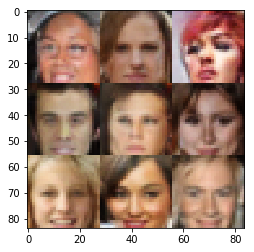

Epoch 10/10 - Batch 2910/3165 train_loss_d: 1.7852, train_loss_g: 0.3089
Epoch 10/10 - Batch 2920/3165 train_loss_d: 1.4615, train_loss_g: 0.5245
Epoch 10/10 - Batch 2930/3165 train_loss_d: 0.8717, train_loss_g: 1.8702
Epoch 10/10 - Batch 2940/3165 train_loss_d: 0.8363, train_loss_g: 1.6078
Epoch 10/10 - Batch 2950/3165 train_loss_d: 0.8891, train_loss_g: 1.2853
Epoch 10/10 - Batch 2980/3165 train_loss_d: 1.0723, train_loss_g: 0.8267
Epoch 10/10 - Batch 2990/3165 train_loss_d: 1.2709, train_loss_g: 0.6730
Epoch 10/10 - Batch 3000/3165 train_loss_d: 1.2986, train_loss_g: 0.5844
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_318/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_318/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_318/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_318/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


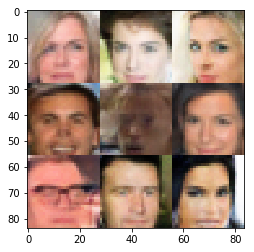

Epoch 10/10 - Batch 3010/3165 train_loss_d: 0.9283, train_loss_g: 1.0849
Epoch 10/10 - Batch 3020/3165 train_loss_d: 0.7913, train_loss_g: 1.2982
Epoch 10/10 - Batch 3030/3165 train_loss_d: 1.2022, train_loss_g: 0.6866
Epoch 10/10 - Batch 3040/3165 train_loss_d: 0.8804, train_loss_g: 1.1217
Epoch 10/10 - Batch 3050/3165 train_loss_d: 1.0086, train_loss_g: 0.8589
Epoch 10/10 - Batch 3060/3165 train_loss_d: 1.4642, train_loss_g: 0.5109
Epoch 10/10 - Batch 3070/3165 train_loss_d: 1.0473, train_loss_g: 0.8091
Epoch 10/10 - Batch 3080/3165 train_loss_d: 0.9778, train_loss_g: 0.9685
Epoch 10/10 - Batch 3090/3165 train_loss_d: 1.1413, train_loss_g: 0.7589
Epoch 10/10 - Batch 3100/3165 train_loss_d: 0.8832, train_loss_g: 1.4353
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_319/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_319/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_319/Maximum

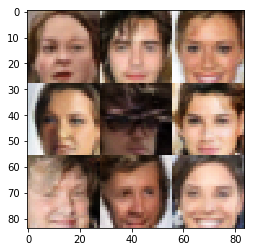

Epoch 10/10 - Batch 3110/3165 train_loss_d: 1.0687, train_loss_g: 0.9582
Epoch 10/10 - Batch 3120/3165 train_loss_d: 0.9421, train_loss_g: 1.0978
Epoch 10/10 - Batch 3130/3165 train_loss_d: 0.7888, train_loss_g: 1.2739
Epoch 10/10 - Batch 3140/3165 train_loss_d: 0.8932, train_loss_g: 1.6202
Epoch 10/10 - Batch 3150/3165 train_loss_d: 0.9808, train_loss_g: 0.9296
Epoch 10/10 - Batch 3160/3165 train_loss_d: 1.3897, train_loss_g: 0.5460
z: Tensor("input_z:0", shape=(?, 100), dtype=float32), out_channel_dim: 3
relu2: Tensor("generator_320/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
relu3: Tensor("generator_320/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
relu4: Tensor("generator_320/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits: Tensor("generator_320/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


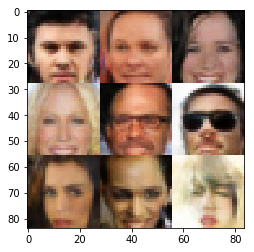


100%|██████████| 10/10 [7:24:06<00:00, 2681.61s/it]


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Are they faces?
I would say so.  For instance the blonde on the second row and first column has highly symmetrical features and bright white teeth and a smile.  It's also interesting that we have a man with glasses in the center and a man with sunglasses to his right.  The lady in the bottom left might be looking at us from an angle, and I think she has auburn hair. 

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.